<a href="https://colab.research.google.com/github/MOREDataset/IceFeature_Forecasting/blob/main/ArcticIceSea_Forecasting_7d_EXPI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **START**

In [ ]:
# **************** UNCOMMENT AND RUN THIS CELL IF YOU NEED TO INSTALL/ UPGRADE TSAI ****************
stable = True # Set to True for latest pip version or False for main branch in GitHub
!pip install {"tsai -U" if stable else "git+https://github.com/timeseriesAI/tsai.git"} >> /dev/null
from tsai.all import *
computer_setup()

os             : Linux-5.4.188+-x86_64-with-Ubuntu-18.04-bionic
python         : 3.7.13
tsai           : 0.3.1
fastai         : 2.7.7
fastcore       : 1.5.13
torch          : 1.11.0+cu102
device         : 1 gpu (['Tesla P100-PCIE-16GB'])
cpu cores      : 4
RAM            : 25.46 GB
GPU memory     : [15.9] GB


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


 # **CONFIGURATION**

In [ ]:
# CONFIGURATION
model_name  = InceptionTimePlus#
par = {}#'levels':4, 'base_arch': InceptionTimePlus}#,  'wavelet': 'db4'}#, 'base_arch':InceptionTime'}#'hidden_size':[100, 50], 'n_layers':2}#{'levels':4}, 'wavelet': None, 'base_arch': InceptionTimePlus}#,  'wavelet': 'db4'}#, 'base_arch':InceptionTime}
ind = ''

freeze_epoch = 25
IMFS_count = 4
season1 = 'FallWinter'
season2 = 'SpringSummer'

In [ ]:
stable = True # Set to True for latest pip version or False for main branch in GitHub
!pip install {"tsai -U" if stable else "git+https://github.com/timeseriesAI/tsai.git"} >> /dev/null
!pip install optuna -U >> /dev/null
from tsai.all import *
import optuna
my_setup(optuna)
set_seed(42, False)

os             : Linux-5.4.188+-x86_64-with-Ubuntu-18.04-bionic
python         : 3.7.13
tsai           : 0.3.1
fastai         : 2.7.7
fastcore       : 1.5.13
optuna         : 2.10.1
torch          : 1.11.0+cu102
device         : 1 gpu (['Tesla P100-PCIE-16GB'])
cpu cores      : 4
RAM            : 25.46 GB
GPU memory     : [15.9] GB


# Thickness forecasting next week

## season1

In [ ]:
season = season1

### no VMD - Thickness + time info.

In [ ]:
ind = ''
mode = 'ThickTime_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,1.951,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,...,2.035,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069
1,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,...,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071
2,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,...,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065
3,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,...,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064
4,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,1.987,...,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064,2.067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,1.503,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,...,1.646,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672
5932,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,...,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676
5933,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,...,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681
5934,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,1.566,...,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681,1.687


#### Hyperparameter tuning

Processing Thickness data..
splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


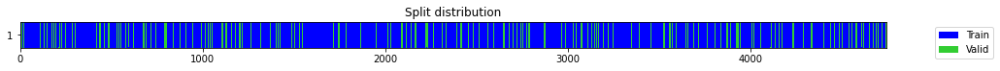

In [ ]:
split_indx = 30

print('Processing Thickness data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Thick_data = to3d(Thick.iloc[:,:].values)
# Temp_data = to3d(Temp.iloc[:,:].values)
data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1)  #, TS_Mend, TS_Mstart
data_X = data[:,:,:split_indx]
data_y = data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

In [ ]:
import optuna
from optuna.integration import FastAIPruningCallback

def objective(trial:optuna.Trial):
    
    # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
    # nf = trial.suggest_categorical('num_filters', [32, 64, 96]) # search through all categorical values in the provided list
    nb_filters = trial.suggest_categorical('nb_filters', [None, 4, 8, 16]) 
    bottleneck = trial.suggest_categorical('bottleneck', [True, False])
    coord = trial.suggest_categorical('coord', [True, False])
    concat_pool = trial.suggest_categorical('concat_pool', [True, False])
    adaptive_size = trial.suggest_int('adaptive_size', 20, 100, step=20)
    residual = trial.suggest_categorical('residual', [True, False])
    zero_norm = trial.suggest_categorical('zero_norm', [True, False])
    act = trial.suggest_categorical('act', ['relu','gelu']) 
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True) 

    learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512,
                         arch=model_name, arch_config={'nb_filters':nb_filters,'bottleneck':bottleneck,'coord':coord,'concat_pool':concat_pool,'adaptive_size':adaptive_size,'residual':residual,'zero_norm':zero_norm,'act':act},
                         metrics=rmse)# , cbs=FastAIPruningCallback(trial))
                         
    with ContextManagers([learn.no_logging(), learn.no_bar()]): # [Optional] this prevents fastai from printing anything during training
        learn.fit_one_cycle(5, lr_max=learning_rate)

    # Return the objective value
    return learn.recorder.values[-1][1] # return the validation loss value of the last epoch 

study = optuna.create_study(direction='minimize')
print(f"Sampler is {study.sampler.__class__.__name__}")

study.optimize(objective, n_trials=100)

print("**Study statistics: ")
print("  Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("{}".format(value))

[I 2022-07-24 04:44:56,882] A new study created in memory with name: no-name-7c789c40-2241-4d8d-9e87-a6d5664e8280


Sampler is TPESampler


[W 2022-07-24 04:45:01,537] Trial 0 failed because of the following error: TypeError("__init__() got an unexpected keyword argument 'custom_head'")
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/optuna/study/_optimize.py", line 213, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-11-09ab4be1bb04>", line 20, in objective
    metrics=rmse)# , cbs=FastAIPruningCallback(trial))
  File "/usr/local/lib/python3.7/dist-packages/tsai/tslearner.py", line 177, in __init__
    exclude_head=exclude_head, cut=cut, init=init, arch_config=arch_config)
  File "/usr/local/lib/python3.7/dist-packages/tsai/models/utils.py", line 168, in build_ts_model
    model = arch(c_in, c_out, **arch_config, **kwargs).to(device=device)
  File "/usr/local/lib/python3.7/dist-packages/tsai/models/XceptionTimePlus.py", line 76, in __init__
    backbone = XceptionBlockPlus(c_in, nf, coord=coord, norm=norm, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/fas

TypeError: ignored

#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.569755,0.285911,0.415916,0.534706,00:00
1,0.422101,0.112751,0.266747,0.335784,00:00
2,0.338225,0.270989,0.410247,0.520566,00:00
3,0.281039,0.071297,0.208442,0.267015,00:00
4,0.229760,0.036576,0.150447,0.191248,00:00
5,0.186252,0.049800,0.179357,0.223160,00:00
6,0.157434,0.038195,0.153774,0.195436,00:00
7,0.131549,0.015358,0.097639,0.123926,00:00
8,0.111195,0.023936,0.124160,0.154712,00:00
9,0.098338,0.037143,0.160405,0.192726,00:00


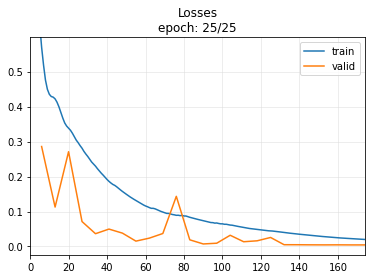

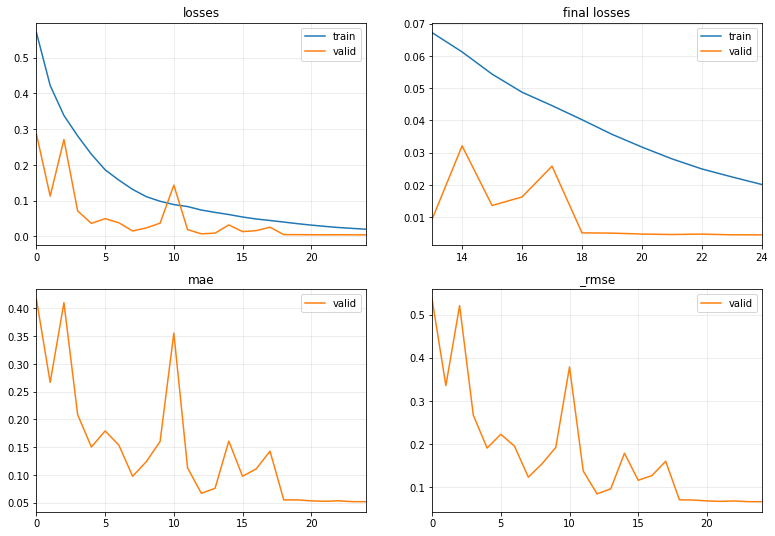

Targets and Predictions shapes (1187, 7) (1187, 7)
InceptionTimePlus : MAPE =  2.0444855058674625 MAE =  0.02715136248122661 RMSE =  0.03375189942272186


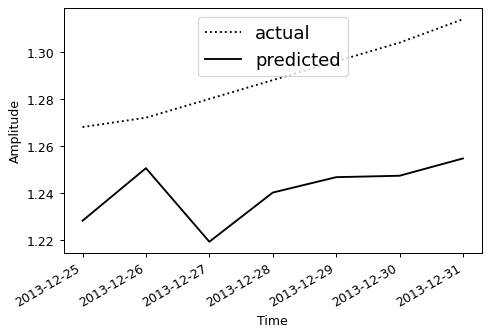

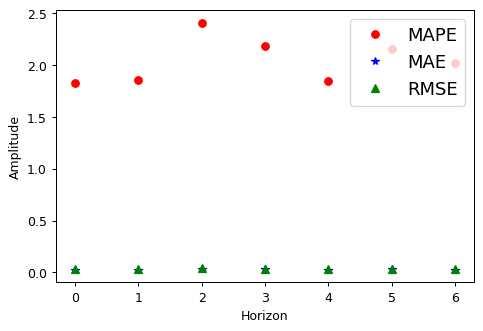

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### no VMD - Time info. only

In [ ]:
ind = ''
mode = 'Time_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,1.951,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,...,2.035,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069
1,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,...,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071
2,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,...,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065
3,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,...,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064
4,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,1.987,...,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064,2.067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,1.503,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,...,1.646,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672
5932,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,...,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676
5933,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,...,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681
5934,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,1.566,...,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681,1.687


Processing Thickness data..
splitting data..
Standardizing data..
training set:  (4749, 3, 30) (4749, 7) , testing set:  (1187, 3, 30) (1187, 7)


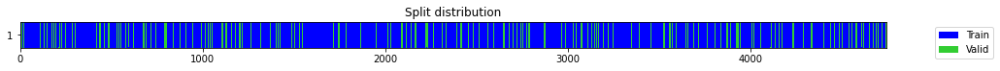

In [ ]:
split_indx = 30

print('Processing Thickness data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Thick_data = to3d(Thick.iloc[:,:].values)
data = np.concatenate([TS_D, TS_Y, TS_M],axis=1) 
data_X = data[:,:,:split_indx]
data_y = Thick_data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.714270,0.516730,0.562322,0.718839,00:00
1,0.564255,0.309773,0.446752,0.556572,00:00
2,0.477221,0.401815,0.504824,0.633889,00:00
3,0.411260,0.195400,0.353827,0.442041,00:00
4,0.351018,0.144058,0.290233,0.379549,00:00
5,0.303715,0.125998,0.272332,0.354962,00:00
6,0.260023,0.145471,0.294710,0.381406,00:00
7,0.236075,0.270475,0.421318,0.520073,00:00
8,0.216134,0.082438,0.211392,0.287120,00:00
9,0.195614,0.085162,0.220917,0.291825,00:00


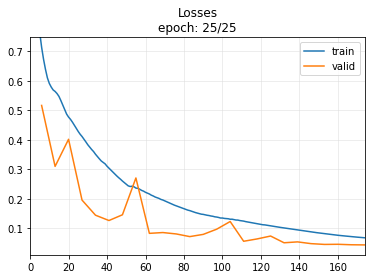

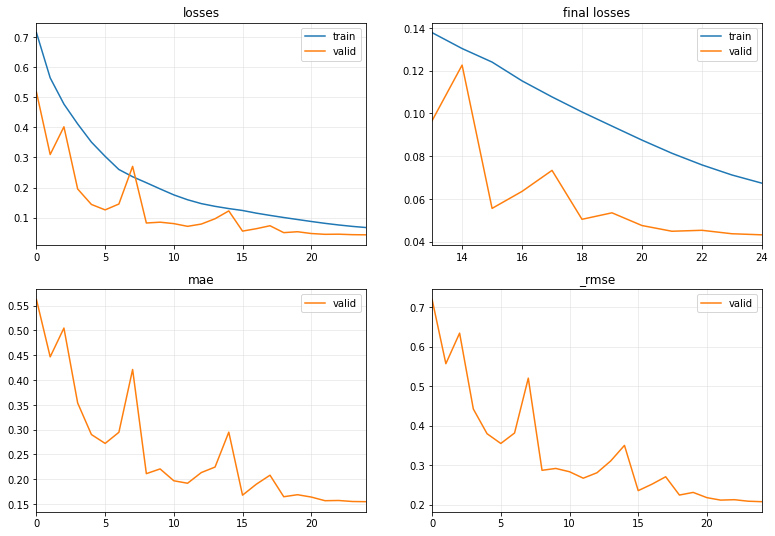

Targets and Predictions shapes (1187, 7) (1187, 7)
InceptionTimePlus : MAPE =  9.563579601492096 MAE =  0.13071271079600402 RMSE =  0.1471721987720574


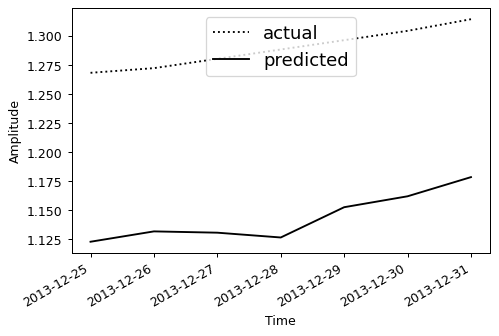

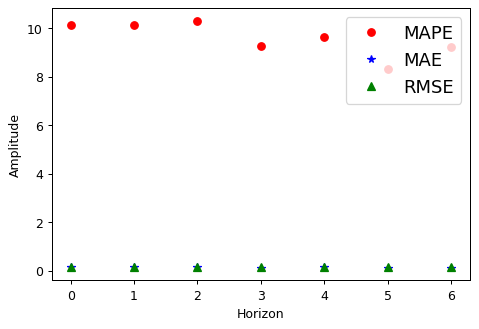

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with VMD - Thickness + time info.

In [ ]:
ind = '31IMFs';
mode = 'ThickTime_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
VMD_Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + ind + '_' + season + '.csv')
VMD_Thick = VMD_Thick.drop(columns='Element0')
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,1.951,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,...,2.035,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069
1,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,...,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071
2,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,...,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065
3,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,...,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064
4,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,1.987,...,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064,2.067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,1.503,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,...,1.646,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672
5932,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,...,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676
5933,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,...,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681
5934,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,1.566,...,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681,1.687


In [ ]:
split_indx = 30

print('Processing Thick and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Thick and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


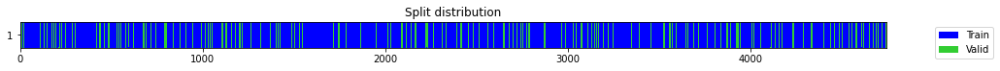

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.026199,0.922804,0.711729,0.960627,00:00
1,0.908579,0.720728,0.594877,0.848957,00:00
2,0.804057,0.623841,0.519772,0.789836,00:00
3,0.728004,0.546202,0.466469,0.739055,00:00
4,0.655713,0.510663,0.441124,0.714607,00:00
5,0.595330,0.468056,0.427826,0.684146,00:00
6,0.536463,0.310094,0.355709,0.556861,00:00
7,0.473162,0.207365,0.288638,0.455373,00:00
8,0.418250,0.173702,0.270610,0.416776,00:00
9,0.372568,0.181946,0.273886,0.426552,00:00


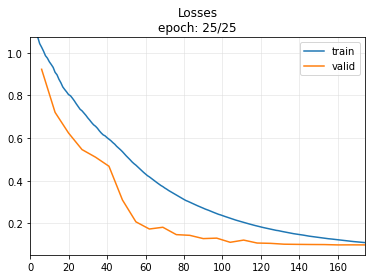

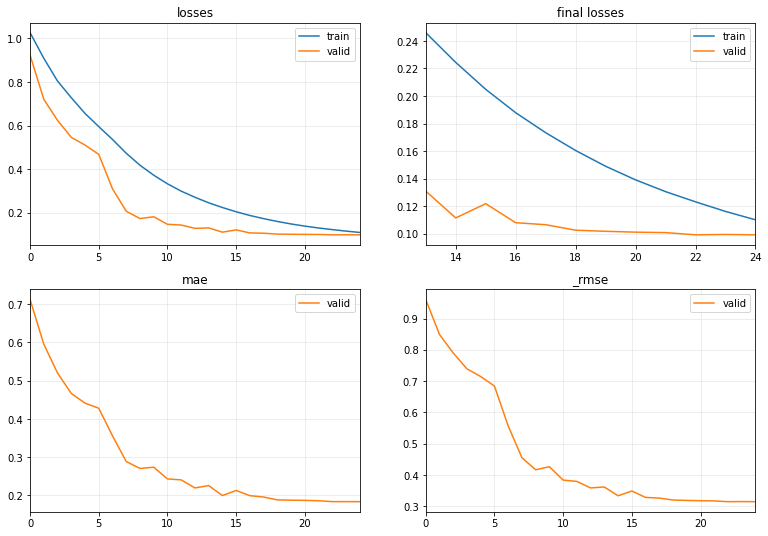

-IMF 1 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


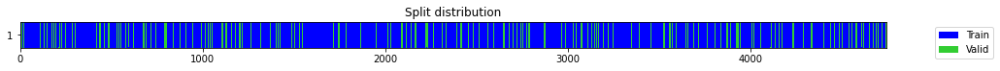

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.108046,0.899562,0.753118,0.948452,00:00
1,0.981095,0.722122,0.669517,0.849778,00:00
2,0.872350,0.608971,0.591301,0.780366,00:00
3,0.799272,0.601761,0.579055,0.775733,00:00
4,0.739675,0.546264,0.547705,0.739097,00:00
5,0.681145,0.366813,0.434970,0.605651,00:00
6,0.604642,0.278142,0.371287,0.527391,00:00
7,0.531262,0.223543,0.322408,0.472804,00:00
8,0.468117,0.182307,0.291570,0.426974,00:00
9,0.414623,0.165742,0.276045,0.407114,00:00


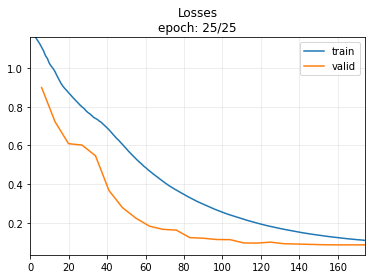

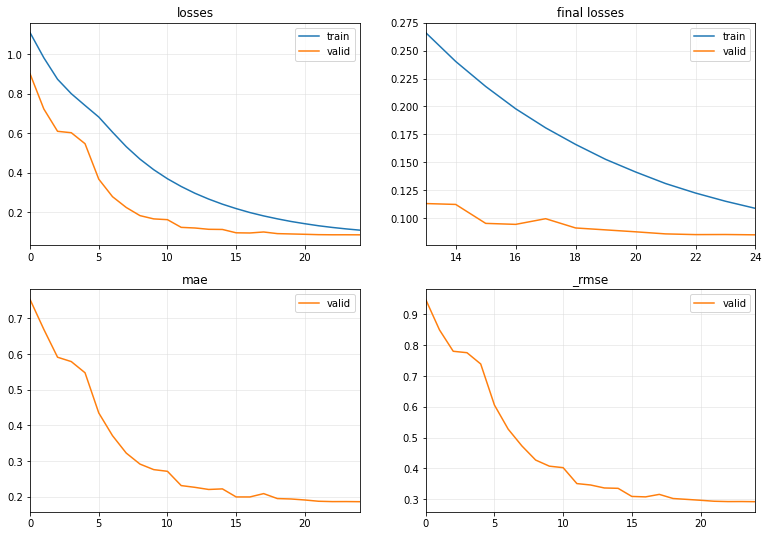

-IMF 2 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


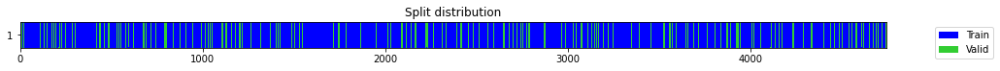

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.077164,1.042902,0.807539,1.021226,00:00
1,1.000606,0.922260,0.753079,0.960343,00:00
2,0.918183,0.790753,0.667854,0.889243,00:00
3,0.848038,0.687620,0.608667,0.829229,00:00
4,0.793531,0.841130,0.678100,0.917132,00:00
5,0.757404,0.531719,0.514761,0.729190,00:00
6,0.693828,0.400345,0.425622,0.632729,00:00
7,0.624289,0.327477,0.379280,0.572256,00:00
8,0.557211,0.268474,0.348300,0.518145,00:00
9,0.497232,0.209619,0.295844,0.457842,00:00


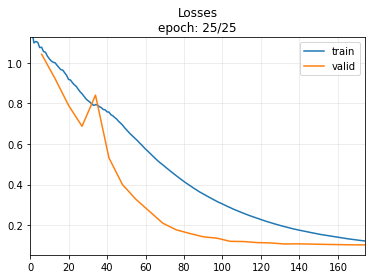

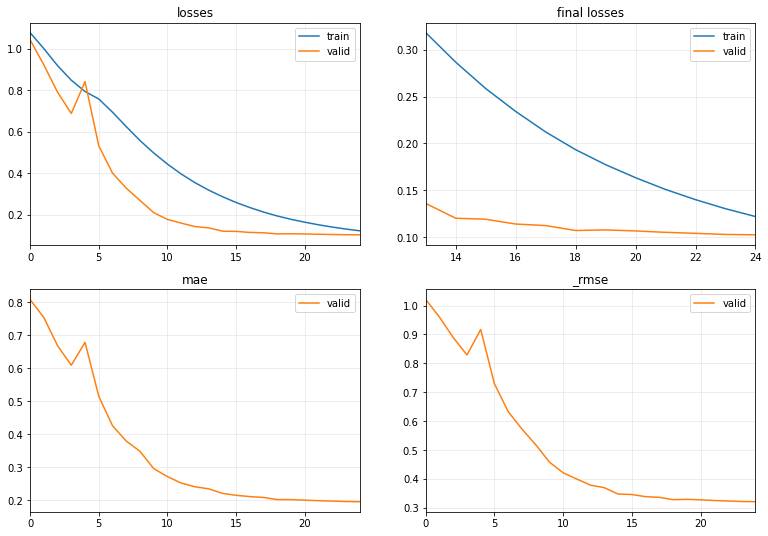

-IMF 3 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


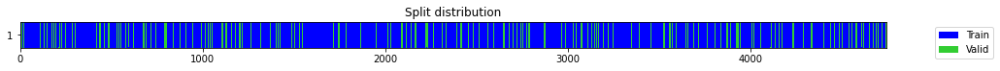

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.120175,0.963921,0.758985,0.981795,00:00
1,1.044203,0.893090,0.721950,0.945034,00:00
2,0.968922,0.789874,0.657445,0.888748,00:00
3,0.904553,0.748865,0.625362,0.865370,00:00
4,0.846750,0.676951,0.594648,0.822770,00:00
5,0.796858,0.682490,0.591913,0.826130,00:00
6,0.752988,0.611697,0.555783,0.782110,00:00
7,0.702092,0.430762,0.446513,0.656325,00:00
8,0.635173,0.308265,0.371297,0.555216,00:00
9,0.565960,0.220280,0.306605,0.469340,00:00


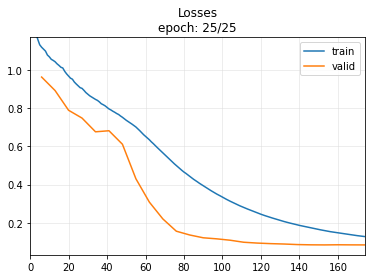

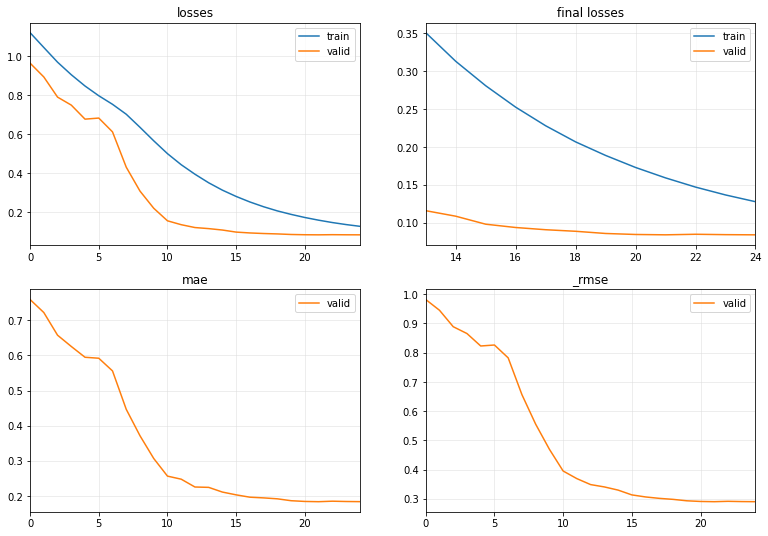

-IMF 4 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


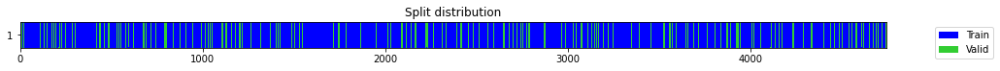

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.135949,0.988072,0.771705,0.994018,00:00
1,1.068484,0.909298,0.735173,0.953571,00:00
2,0.988447,0.817150,0.681199,0.903963,00:00
3,0.926801,0.752014,0.640043,0.867187,00:00
4,0.871558,0.724480,0.619662,0.851164,00:00
5,0.824945,0.691397,0.591983,0.831503,00:00
6,0.775237,0.554812,0.523270,0.744857,00:00
7,0.705799,0.360744,0.410499,0.600619,00:00
8,0.626875,0.244383,0.329546,0.494351,00:00
9,0.551085,0.182834,0.277675,0.427591,00:00


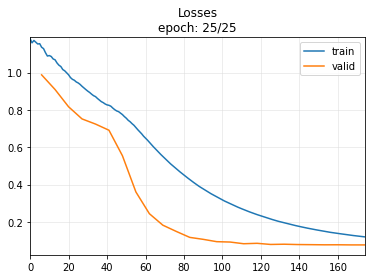

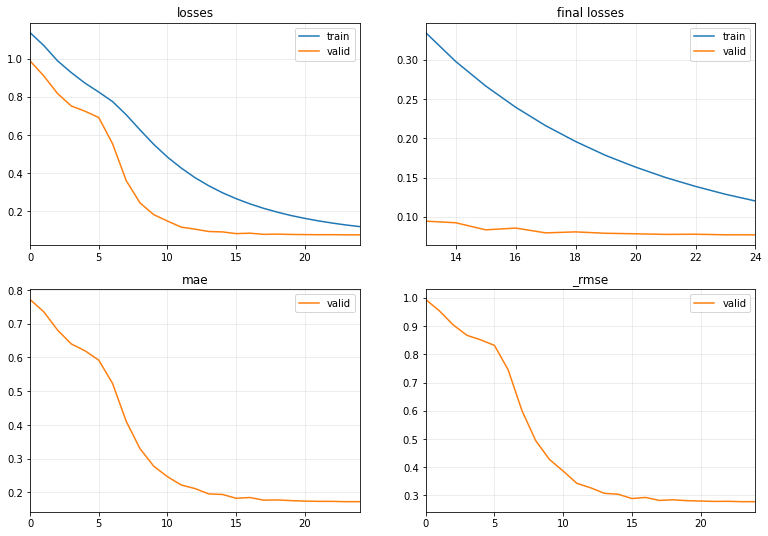

-IMF 5 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


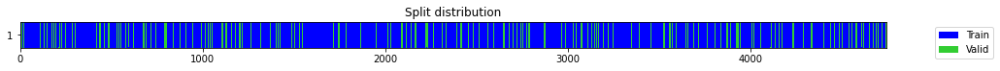

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.151827,0.991876,0.753354,0.995930,00:00
1,1.084813,0.946246,0.732323,0.972752,00:00
2,1.017199,0.865721,0.685008,0.930441,00:00
3,0.949455,0.821436,0.643407,0.906331,00:00
4,0.905073,0.827852,0.629986,0.909863,00:00
5,0.866095,0.753918,0.605821,0.868285,00:00
6,0.810034,0.601931,0.526002,0.775842,00:00
7,0.738571,0.422366,0.428570,0.649897,00:00
8,0.660994,0.285082,0.364063,0.533931,00:00
9,0.587091,0.212312,0.302387,0.460773,00:00


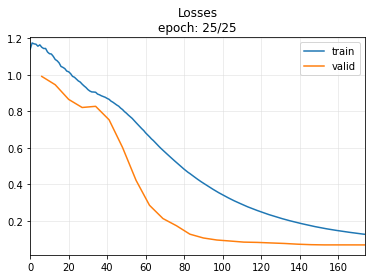

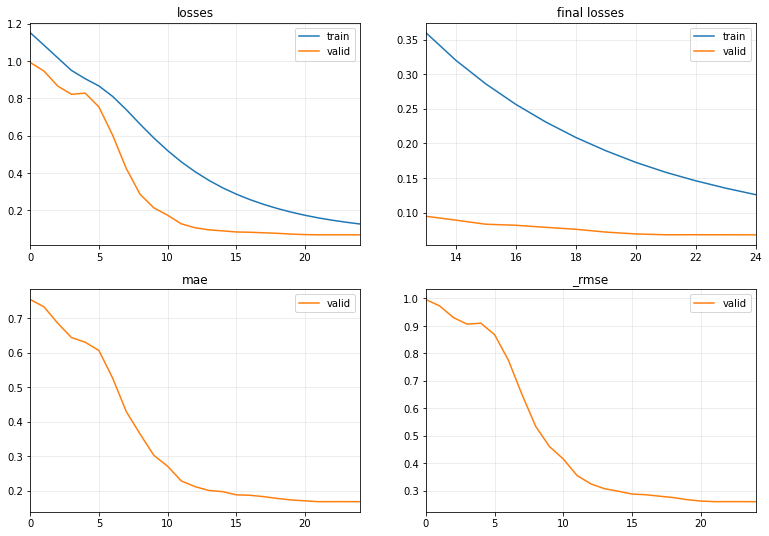

-IMF 6 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


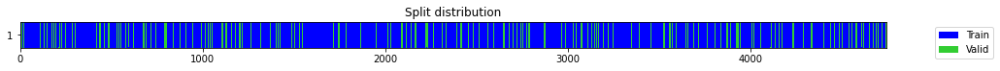

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.095895,1.034427,0.765258,1.017068,00:00
1,1.044455,0.995532,0.750394,0.997763,00:00
2,0.986672,0.940078,0.716571,0.969576,00:00
3,0.936870,0.895217,0.676617,0.946159,00:00
4,0.893459,0.877392,0.667363,0.936692,00:00
5,0.853782,0.801108,0.632928,0.895046,00:00
6,0.799002,0.650824,0.560228,0.806737,00:00
7,0.731477,0.457968,0.461313,0.676733,00:00
8,0.651885,0.313079,0.363834,0.559535,00:00
9,0.575178,0.255060,0.319524,0.505035,00:00


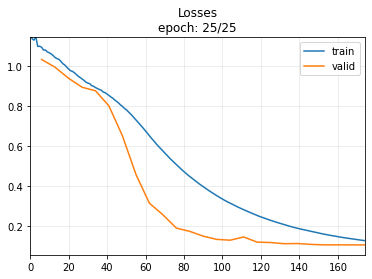

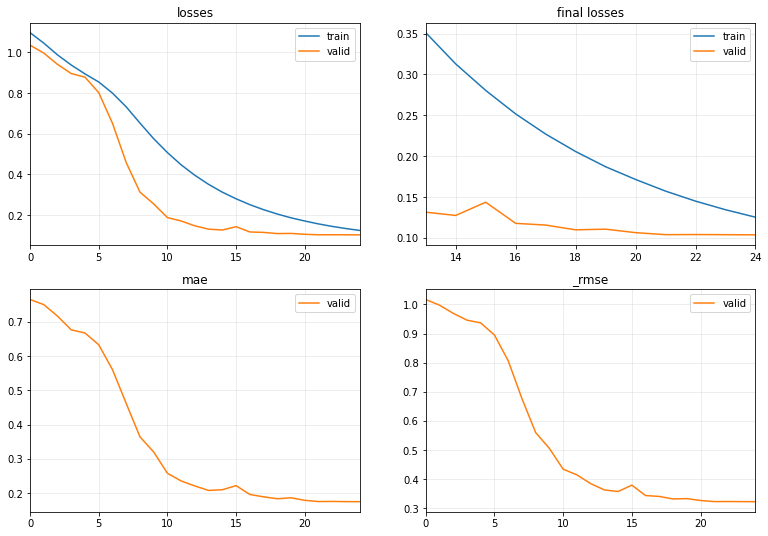

-IMF 7 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


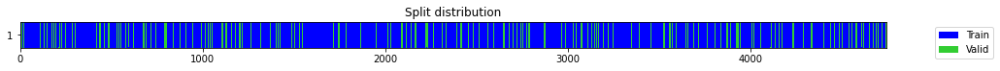

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.140236,0.982614,0.758095,0.991269,00:00
1,1.077000,0.946943,0.747136,0.973110,00:00
2,1.017186,0.898325,0.717712,0.947800,00:00
3,0.964716,0.869554,0.692996,0.932499,00:00
4,0.920414,0.813640,0.664723,0.902020,00:00
5,0.872743,0.756635,0.633465,0.869848,00:00
6,0.820855,0.652269,0.591398,0.807632,00:00
7,0.766541,0.472843,0.497815,0.687636,00:00
8,0.691515,0.365946,0.435179,0.604935,00:00
9,0.611737,0.223490,0.323543,0.472748,00:00


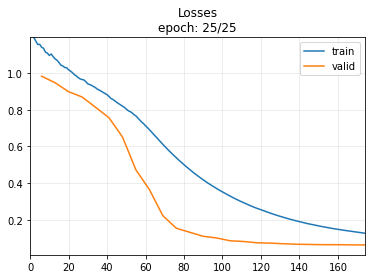

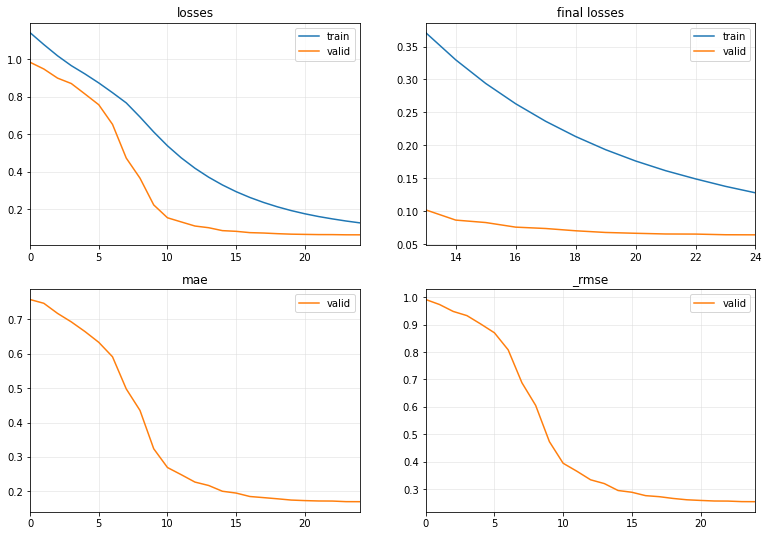

-IMF 8 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


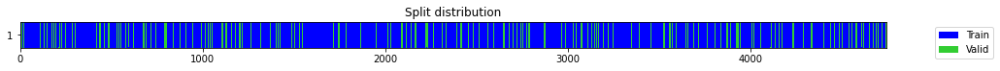

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.159419,1.006288,0.751316,1.003139,00:00
1,1.101592,0.966317,0.732187,0.983014,00:00
2,1.037099,0.902964,0.696825,0.950244,00:00
3,0.979594,0.879507,0.677764,0.937820,00:00
4,0.931776,0.851555,0.667182,0.922797,00:00
5,0.893291,0.845070,0.647608,0.919277,00:00
6,0.847328,0.728639,0.602130,0.853603,00:00
7,0.793811,0.568480,0.542525,0.753976,00:00
8,0.727231,0.397112,0.453634,0.630168,00:00
9,0.651884,0.287371,0.376798,0.536070,00:00


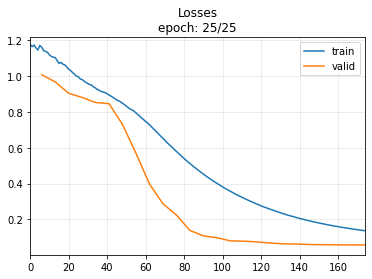

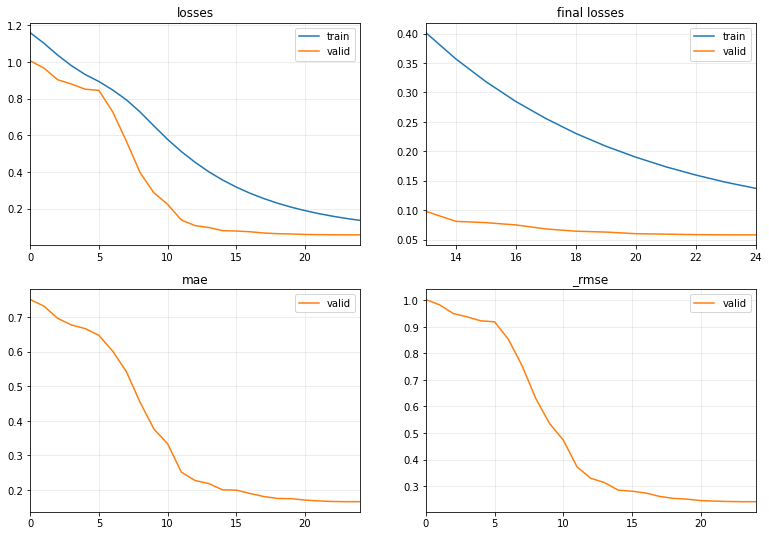

-IMF 9 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


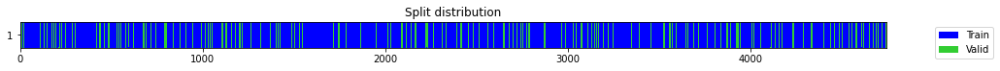

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.161604,1.012727,0.753319,1.006343,00:00
1,1.095100,0.976446,0.744479,0.988153,00:00
2,1.032187,0.914021,0.713458,0.956045,00:00
3,0.979970,0.848585,0.678297,0.921187,00:00
4,0.931993,0.862135,0.686407,0.928512,00:00
5,0.881706,0.781331,0.644482,0.883929,00:00
6,0.830251,0.697147,0.603348,0.834953,00:00
7,0.771599,0.519437,0.534195,0.720720,00:00
8,0.700772,0.338407,0.415205,0.581727,00:00
9,0.622125,0.250287,0.345403,0.500287,00:00


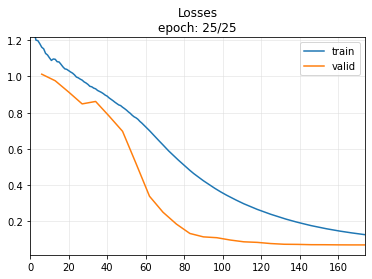

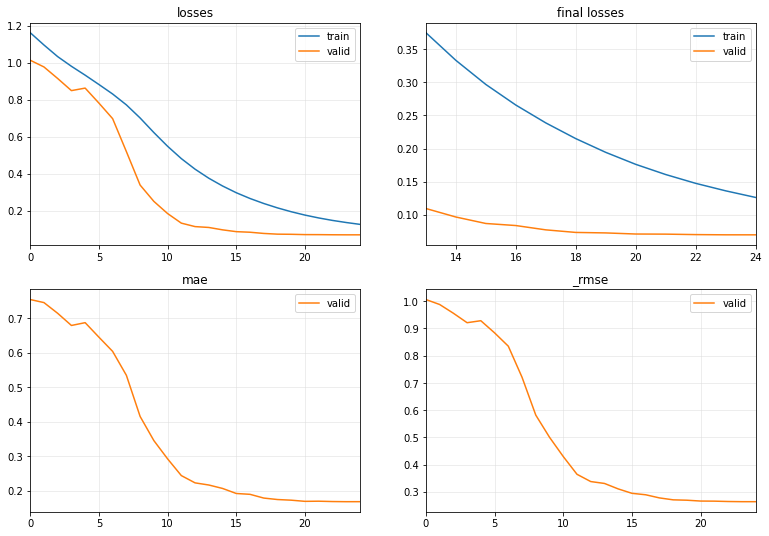

-IMF 10 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


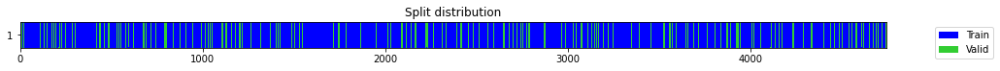

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.120827,1.001955,0.743010,1.000977,00:00
1,1.068505,0.970602,0.731039,0.985191,00:00
2,1.004719,0.914218,0.701284,0.956147,00:00
3,0.945469,0.847539,0.671868,0.920619,00:00
4,0.888826,0.833893,0.663758,0.913177,00:00
5,0.832375,0.776914,0.632708,0.881427,00:00
6,0.781526,0.648929,0.570089,0.805561,00:00
7,0.715465,0.541750,0.521966,0.736037,00:00
8,0.641847,0.324535,0.402348,0.569680,00:00
9,0.566434,0.237799,0.338121,0.487646,00:00


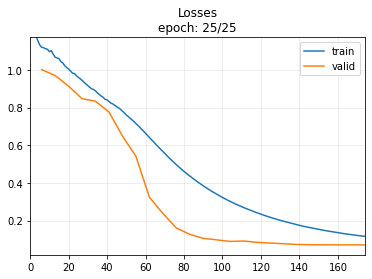

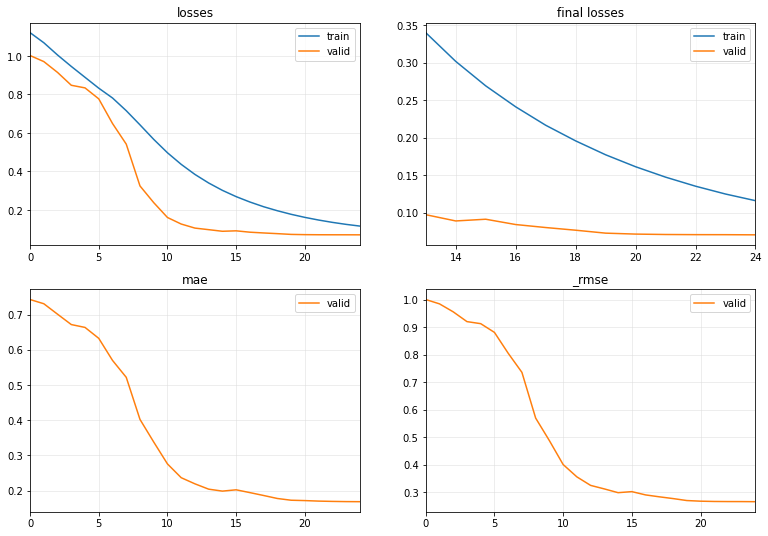

-IMF 11 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


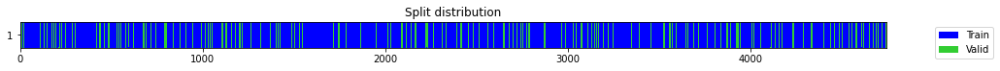

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.158251,0.982809,0.730852,0.991367,00:01
1,1.079042,0.944146,0.717429,0.971672,00:00
2,1.001453,0.860804,0.679995,0.927795,00:00
3,0.930481,0.774052,0.646978,0.879802,00:00
4,0.862170,0.747403,0.617323,0.864525,00:00
5,0.808893,0.717705,0.607964,0.847175,00:00
6,0.750718,0.556293,0.523476,0.745851,00:00
7,0.683502,0.436149,0.472136,0.660416,00:00
8,0.611384,0.293759,0.376547,0.541996,00:00
9,0.541008,0.199717,0.299215,0.446897,00:00


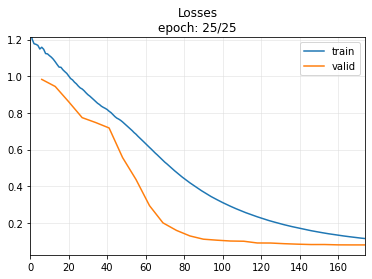

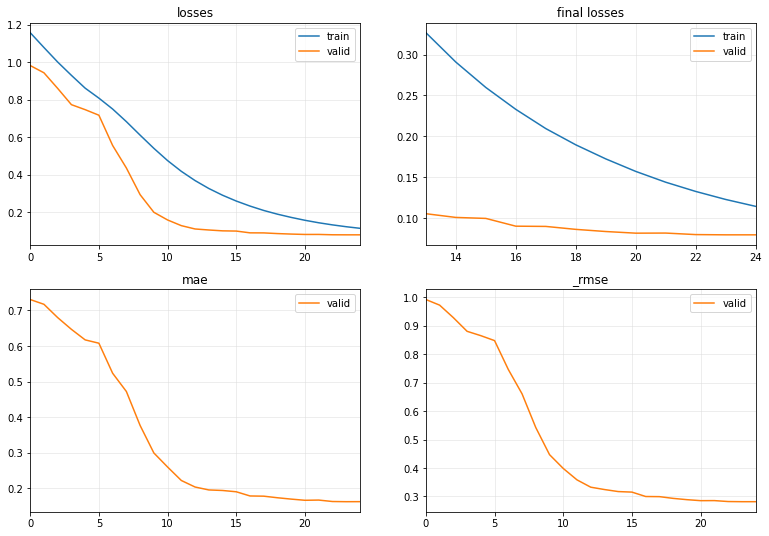

-IMF 12 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


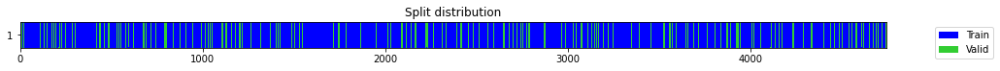

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.133457,1.004519,0.732753,1.002257,00:00
1,1.070984,0.935908,0.716832,0.967424,00:00
2,1.007577,0.855449,0.679126,0.924905,00:00
3,0.940315,0.796344,0.645465,0.892381,00:00
4,0.879786,0.748814,0.627649,0.865340,00:00
5,0.826182,0.720394,0.620512,0.848760,00:00
6,0.773361,0.616634,0.562018,0.785260,00:00
7,0.711338,0.438032,0.471321,0.661840,00:00
8,0.641330,0.320761,0.406103,0.566357,00:00
9,0.570714,0.239599,0.347894,0.489489,00:00


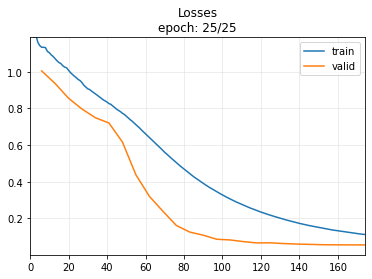

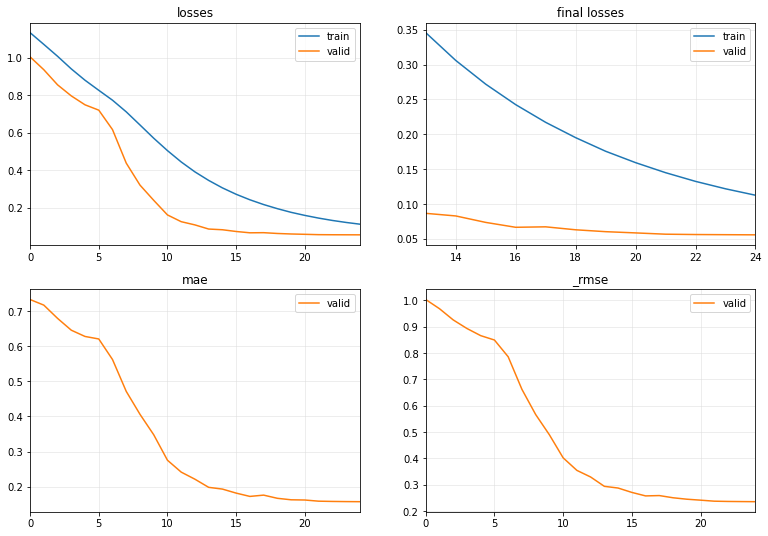

-IMF 13 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


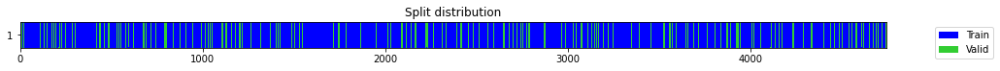

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.112138,1.007418,0.720812,1.003702,00:00
1,1.034981,0.926266,0.682630,0.962427,00:00
2,0.963785,0.841998,0.643057,0.917604,00:00
3,0.892555,0.793831,0.599378,0.890972,00:00
4,0.836345,0.818739,0.583515,0.904842,00:00
5,0.794540,0.761163,0.583796,0.872447,00:00
6,0.738020,0.590751,0.520292,0.768603,00:00
7,0.668021,0.436876,0.458195,0.660966,00:00
8,0.598954,0.270001,0.353660,0.519616,00:00
9,0.527999,0.210716,0.304123,0.459038,00:00


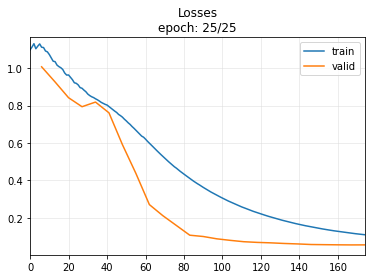

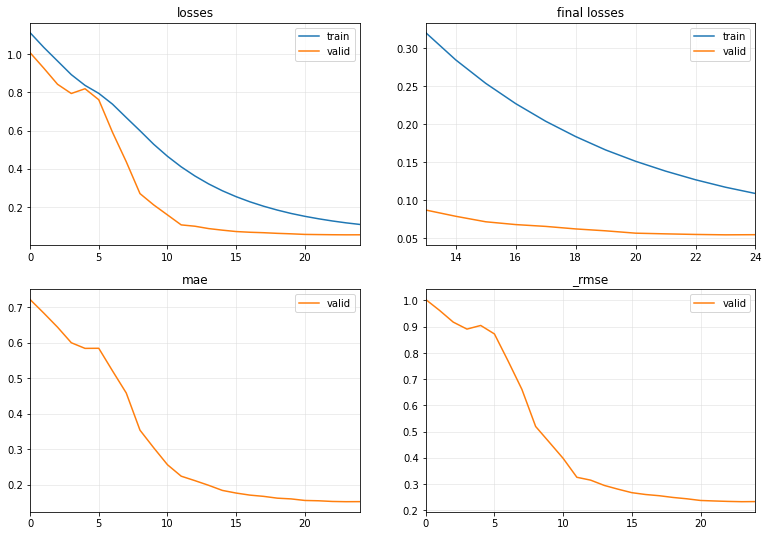

-IMF 14 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


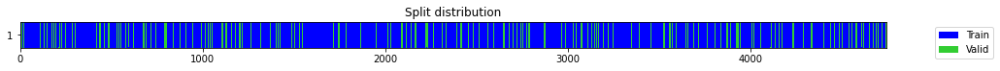

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.131465,1.005143,0.725618,1.002568,00:00
1,1.049941,0.904982,0.692717,0.951305,00:00
2,0.966716,0.774357,0.639436,0.879975,00:00
3,0.890283,0.709685,0.615880,0.842428,00:00
4,0.830349,0.635139,0.564837,0.796956,00:00
5,0.773245,0.549185,0.544590,0.741070,00:00
6,0.715111,0.514007,0.535677,0.716943,00:00
7,0.652777,0.326638,0.412846,0.571523,00:00
8,0.580835,0.193914,0.326215,0.440357,00:00
9,0.509573,0.147089,0.279781,0.383521,00:00


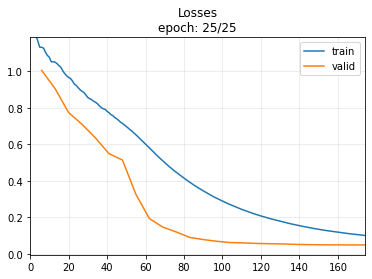

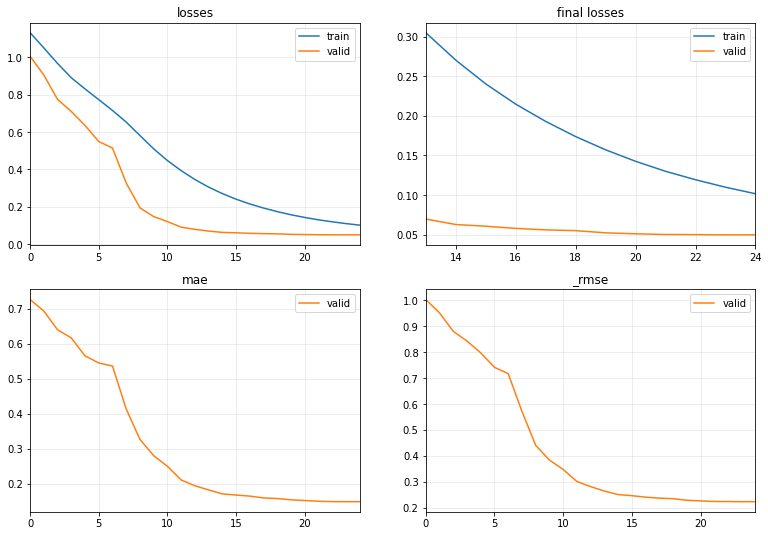

-IMF 15 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


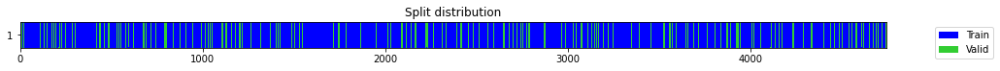

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.135731,0.969932,0.711711,0.984851,00:00
1,1.066936,0.889226,0.682789,0.942988,00:00
2,0.984083,0.757653,0.632594,0.870432,00:00
3,0.908813,0.690454,0.594963,0.830936,00:00
4,0.851177,0.607929,0.560596,0.779698,00:00
5,0.784603,0.551080,0.546020,0.742348,00:00
6,0.722765,0.413351,0.465681,0.642924,00:00
7,0.655334,0.312481,0.409161,0.559000,00:00
8,0.586892,0.232098,0.346061,0.481765,00:00
9,0.520996,0.176112,0.307946,0.419658,00:00


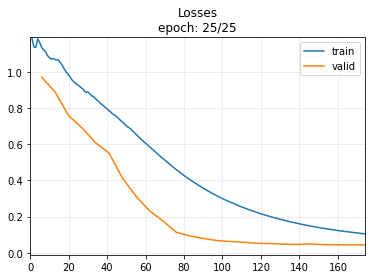

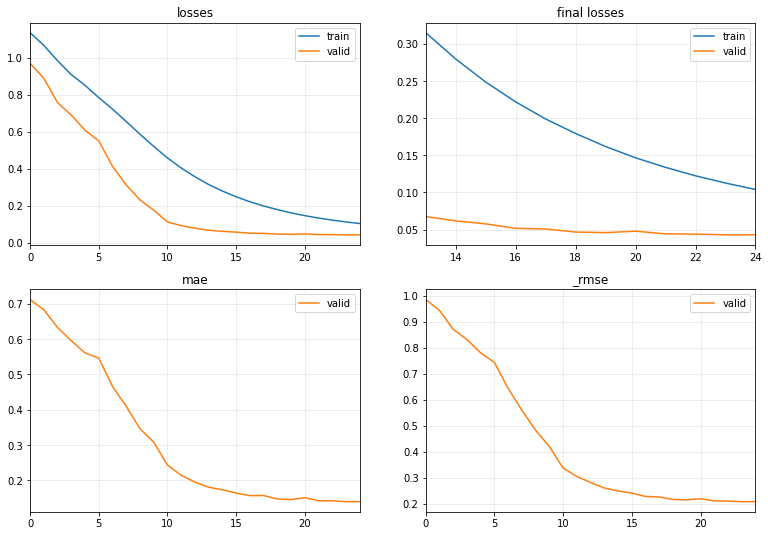

-IMF 16 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


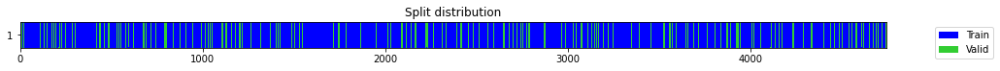

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.073088,0.983692,0.704131,0.991813,00:00
1,0.978677,0.876215,0.663417,0.936064,00:00
2,0.905899,0.794394,0.620666,0.891288,00:00
3,0.837219,0.711797,0.575191,0.843681,00:00
4,0.780731,0.612110,0.541757,0.782375,00:01
5,0.716449,0.475459,0.478138,0.689536,00:00
6,0.643223,0.351379,0.436389,0.592772,00:00
7,0.572515,0.274725,0.384340,0.524143,00:00
8,0.507502,0.210959,0.309920,0.459303,00:00
9,0.447041,0.136092,0.267234,0.368906,00:00


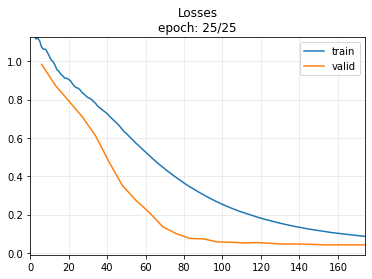

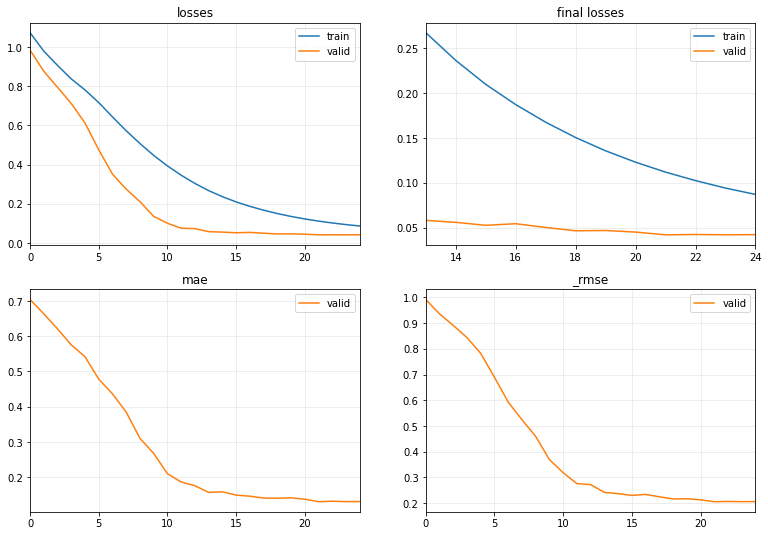

-IMF 17 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


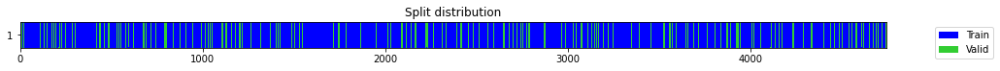

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.089412,0.911845,0.685842,0.954906,00:01
1,0.972229,0.808444,0.655481,0.899135,00:00
2,0.891134,0.700521,0.620473,0.836971,00:00
3,0.819567,0.573984,0.559328,0.757617,00:00
4,0.748190,0.519113,0.533759,0.720495,00:00
5,0.694501,0.456410,0.499916,0.675581,00:00
6,0.651625,0.424494,0.477607,0.651532,00:01
7,0.592520,0.266731,0.374635,0.516460,00:00
8,0.524714,0.173602,0.300769,0.416655,00:00
9,0.460200,0.125066,0.250391,0.353646,00:01


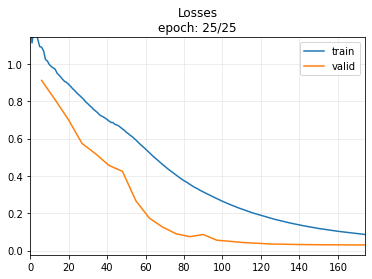

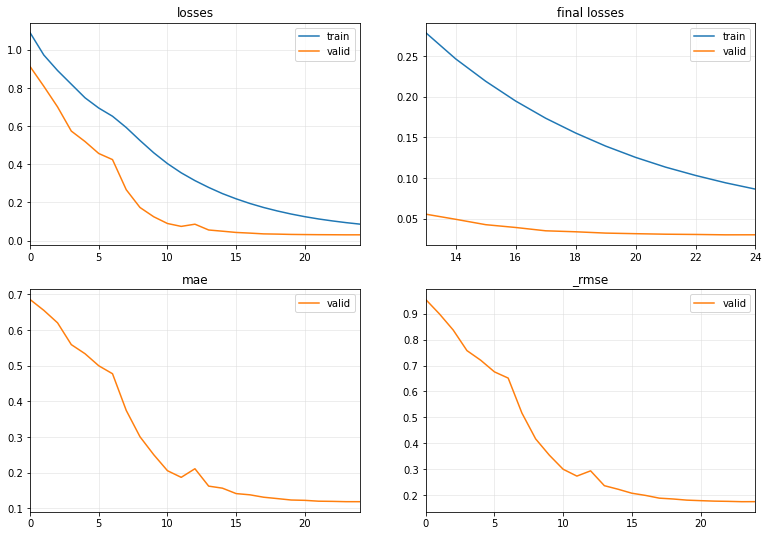

-IMF 18 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


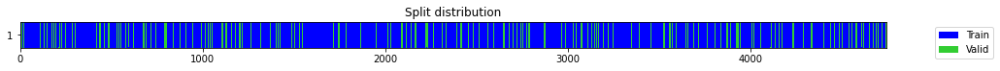

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.128940,0.898073,0.686919,0.947667,00:00
1,0.997499,0.766290,0.638341,0.875380,00:00
2,0.894694,0.659132,0.582610,0.811870,00:00
3,0.805773,0.580194,0.546971,0.761705,00:00
4,0.727013,0.489788,0.497296,0.699849,00:00
5,0.661887,0.506781,0.533992,0.711886,00:00
6,0.610663,0.442966,0.454391,0.665557,00:00
7,0.552600,0.210390,0.320759,0.458683,00:00
8,0.488066,0.188748,0.319290,0.434452,00:00
9,0.431685,0.112966,0.236297,0.336105,00:00


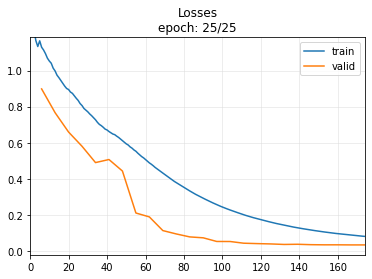

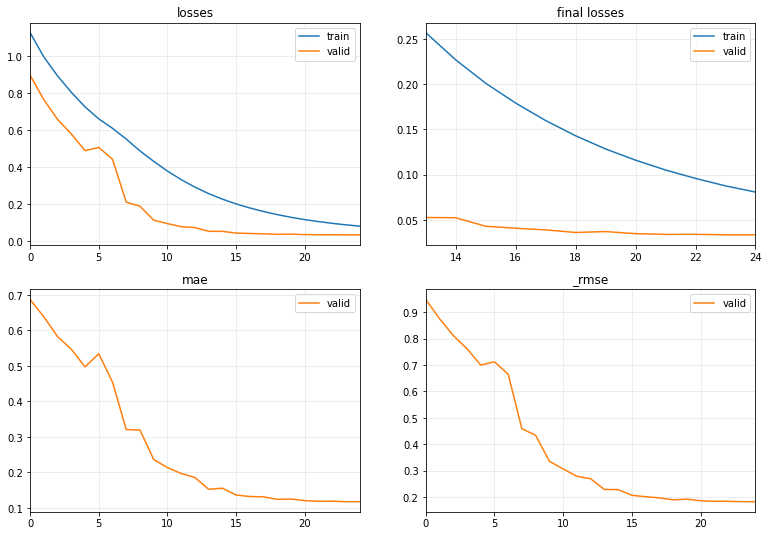

-IMF 19 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


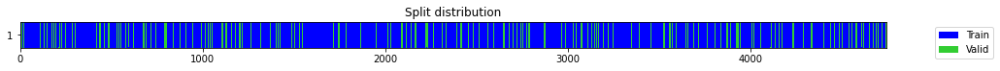

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.107803,0.859724,0.651452,0.927213,00:01
1,0.917093,0.636143,0.566505,0.797585,00:00
2,0.814158,0.489019,0.499143,0.699299,00:00
3,0.719082,0.453475,0.486042,0.673405,00:00
4,0.642452,0.370628,0.440639,0.608793,00:00
5,0.582532,0.326895,0.418633,0.571747,00:00
6,0.519941,0.271016,0.383332,0.520592,00:00
7,0.461323,0.166150,0.287285,0.407614,00:00
8,0.404002,0.094555,0.226453,0.307498,00:00
9,0.352865,0.064346,0.181046,0.253664,00:00


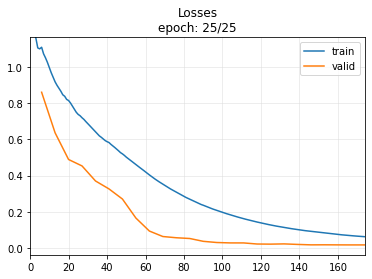

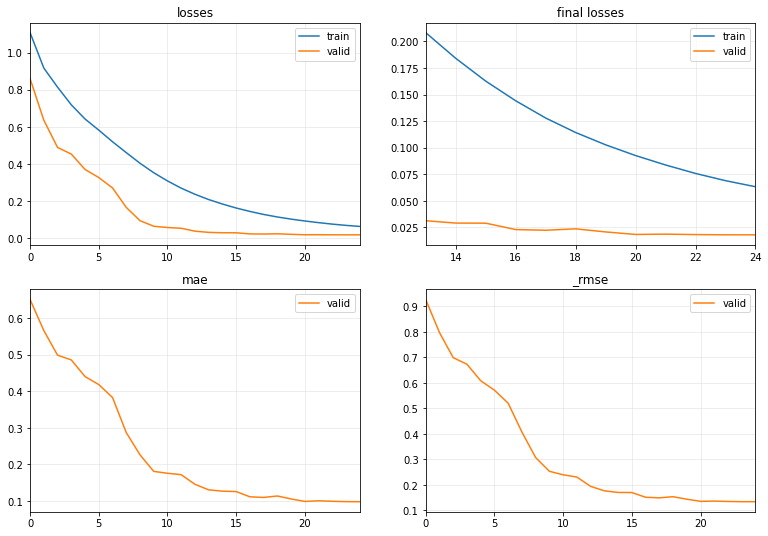

-IMF 20 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


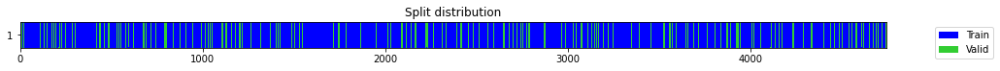

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.993833,1.090490,0.682480,1.044265,00:01
1,0.857631,0.729599,0.593125,0.854165,00:01
2,0.742585,0.528994,0.489505,0.727320,00:00
3,0.647454,0.438599,0.461267,0.662268,00:00
4,0.568462,0.313231,0.386616,0.559671,00:01
5,0.499245,0.266349,0.362627,0.516090,00:00
6,0.438065,0.203336,0.325274,0.450928,00:00
7,0.378866,0.086836,0.201655,0.294680,00:00
8,0.323065,0.075803,0.198227,0.275323,00:01
9,0.277011,0.046851,0.156585,0.216451,00:00


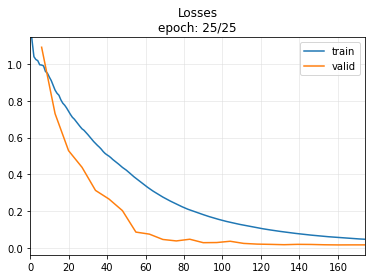

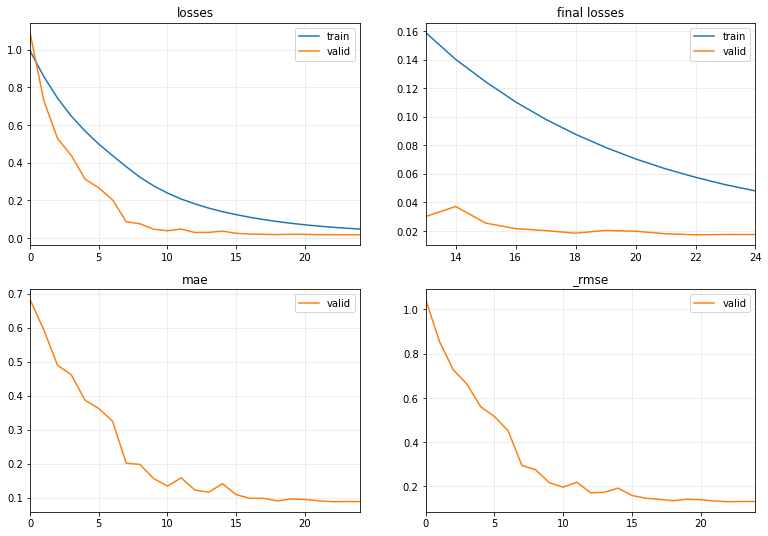

-IMF 21 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


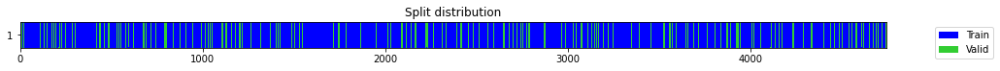

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.220931,0.759992,0.605217,0.871775,00:00
1,0.967629,0.511778,0.508071,0.715387,00:00
2,0.784713,0.324174,0.398693,0.569363,00:00
3,0.647210,0.268391,0.368738,0.518065,00:00
4,0.547604,0.248819,0.368797,0.498817,00:00
5,0.473741,0.280342,0.406480,0.529474,00:00
6,0.415477,0.183168,0.308329,0.427982,00:00
7,0.363341,0.131886,0.238679,0.363162,00:01
8,0.320018,0.152101,0.269828,0.390001,00:00
9,0.288964,0.119648,0.226502,0.345902,00:01


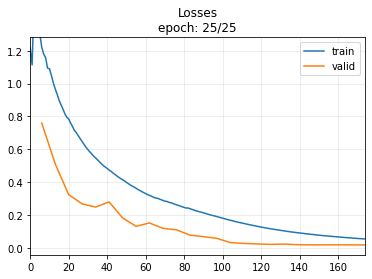

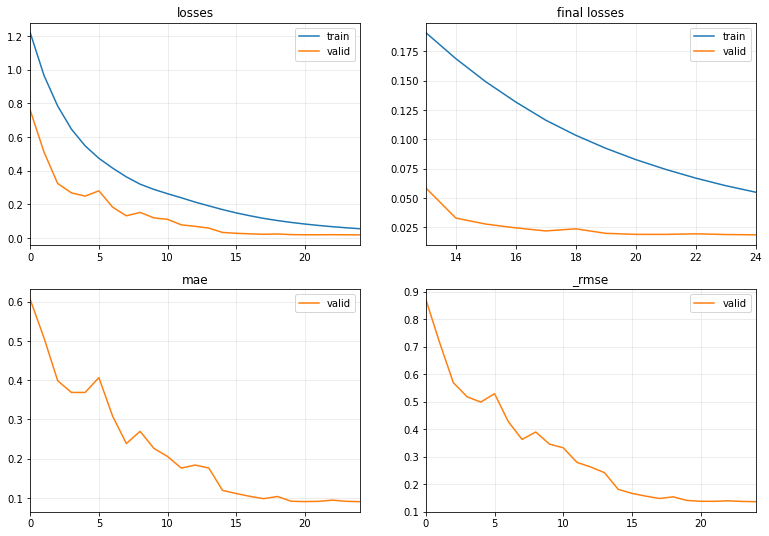

-IMF 22 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


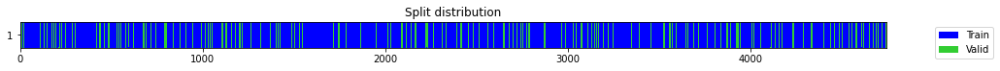

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.981264,0.847795,0.600951,0.920758,00:00
1,0.754538,0.467649,0.470367,0.683849,00:00
2,0.615389,0.269409,0.353607,0.519047,00:00
3,0.498935,0.204564,0.318017,0.452288,00:01
4,0.411886,0.127821,0.239304,0.357521,00:00
5,0.345637,0.136237,0.261828,0.369103,00:00
6,0.294992,0.103914,0.221363,0.322357,00:00
7,0.259436,0.087426,0.192932,0.295678,00:00
8,0.229783,0.055993,0.151406,0.236628,00:00
9,0.206046,0.175461,0.342086,0.418881,00:00


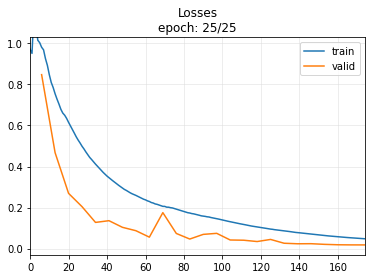

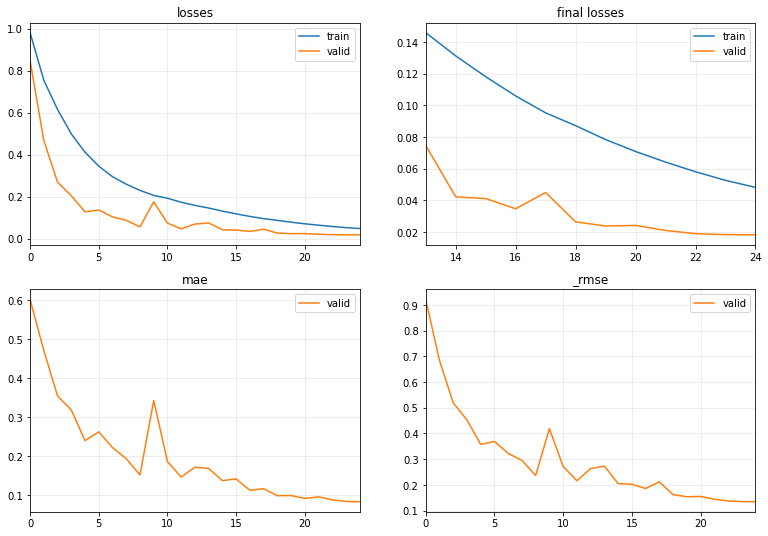

-IMF 23 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


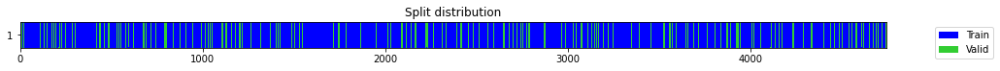

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.010401,0.864356,0.585653,0.929708,00:01
1,0.756807,0.348370,0.397574,0.590229,00:00
2,0.597135,0.201237,0.288972,0.448595,00:00
3,0.484709,0.130093,0.245911,0.360684,00:00
4,0.391322,0.104066,0.233468,0.322592,00:00
5,0.322625,0.107254,0.229274,0.327496,00:00
6,0.272152,0.060869,0.167938,0.246716,00:00
7,0.233290,0.091652,0.239111,0.302741,00:00
8,0.203136,0.042354,0.136746,0.205800,00:00
9,0.175601,0.035621,0.123042,0.188735,00:00


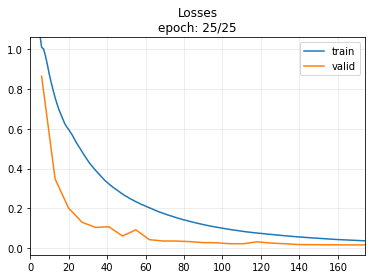

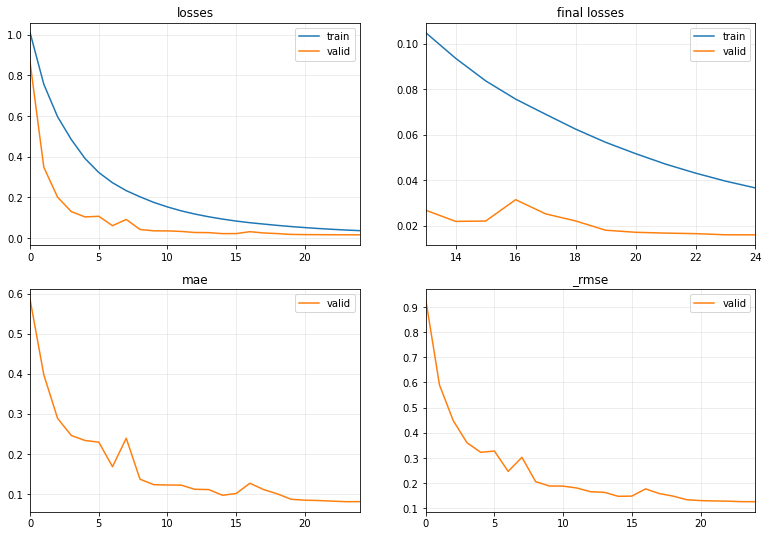

-IMF 24 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


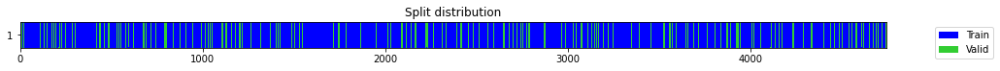

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.759556,0.664542,0.509340,0.815195,00:01
1,0.538534,0.220933,0.328159,0.470035,00:01
2,0.442451,0.136569,0.271467,0.369552,00:00
3,0.361093,0.125161,0.265856,0.353781,00:01
4,0.295142,0.081976,0.218569,0.286315,00:00
5,0.246290,0.070664,0.201923,0.265827,00:01
6,0.209503,0.043038,0.153251,0.207457,00:01
7,0.177845,0.034311,0.137328,0.185232,00:01
8,0.156871,0.090128,0.242129,0.300213,00:00
9,0.139586,0.030743,0.131354,0.175338,00:01


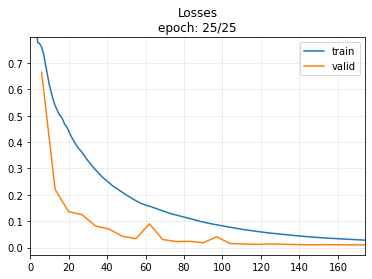

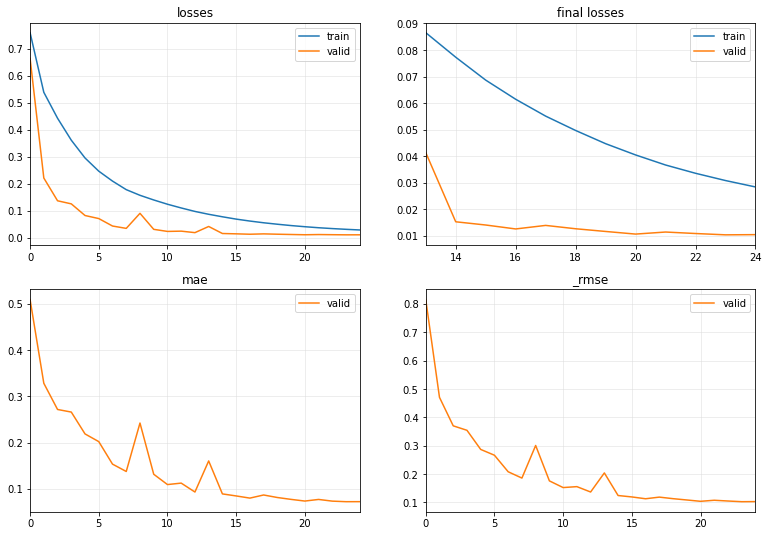

-IMF 25 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


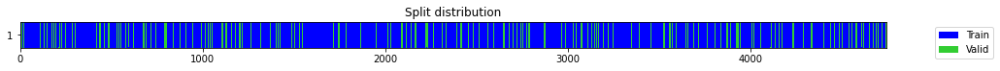

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.832525,0.607893,0.491689,0.779675,00:01
1,0.557192,0.166808,0.284593,0.408422,00:01
2,0.457501,0.185289,0.305399,0.430452,00:01
3,0.365306,0.112277,0.251386,0.335077,00:00
4,0.294196,0.078594,0.206684,0.280347,00:00
5,0.242756,0.048043,0.161053,0.219187,00:00
6,0.202176,0.036292,0.136413,0.190504,00:00
7,0.172214,0.097035,0.253151,0.311505,00:01
8,0.152179,0.038761,0.149413,0.196879,00:00
9,0.133173,0.051754,0.185006,0.227495,00:00


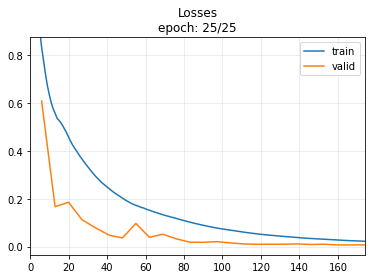

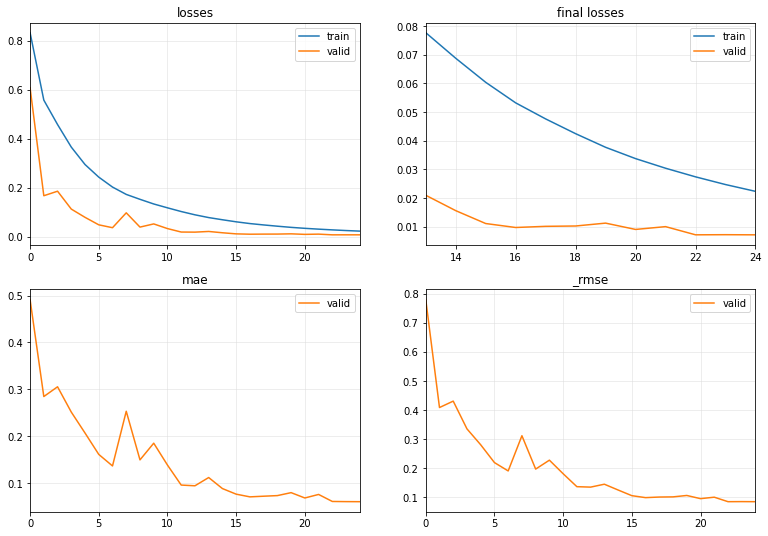

-IMF 26 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


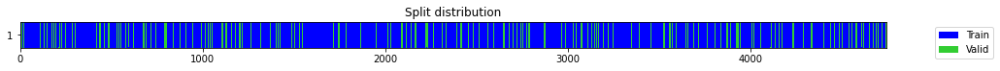

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.805445,0.422744,0.424843,0.650188,00:00
1,0.519039,0.122645,0.252499,0.350206,00:00
2,0.456463,0.193634,0.328732,0.440038,00:00
3,0.370396,0.131208,0.276766,0.362226,00:01
4,0.299449,0.061544,0.181152,0.248080,00:00
5,0.245441,0.061393,0.184917,0.247775,00:00
6,0.202977,0.045049,0.161426,0.212247,00:01
7,0.171184,0.026582,0.124357,0.163039,00:00
8,0.144907,0.018349,0.099091,0.135459,00:00
9,0.123456,0.036208,0.156651,0.190283,00:01


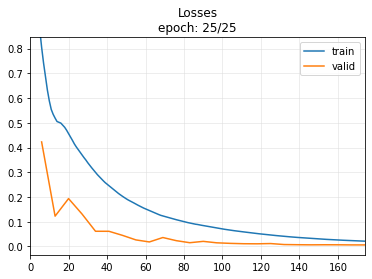

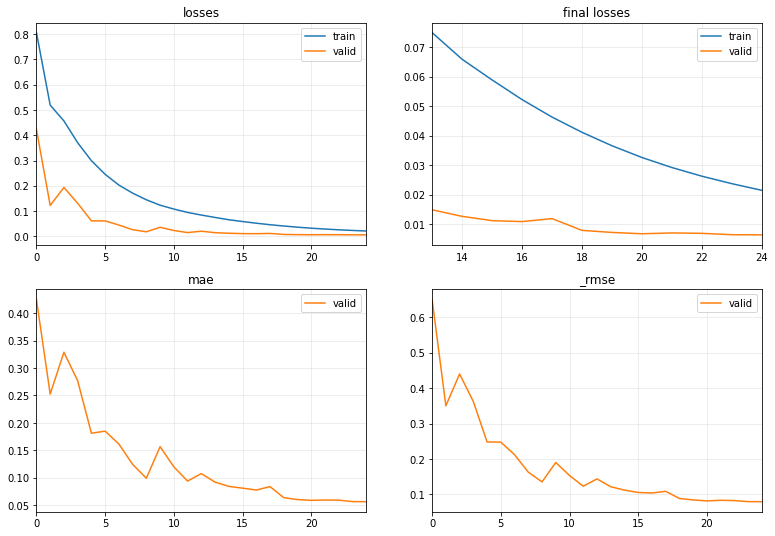

-IMF 27 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


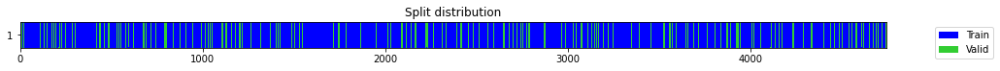

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.865502,0.554509,0.477524,0.744654,00:00
1,0.627331,0.255022,0.318477,0.504997,00:00
2,0.516693,0.325424,0.381020,0.570459,00:01
3,0.421835,0.115647,0.240006,0.340070,00:01
4,0.337146,0.051146,0.170987,0.226155,00:01
5,0.270273,0.033230,0.133946,0.182291,00:00
6,0.221966,0.030942,0.131370,0.175902,00:01
7,0.184304,0.018974,0.101398,0.137745,00:01
8,0.156079,0.034605,0.144702,0.186025,00:01
9,0.133782,0.015348,0.095035,0.123889,00:01


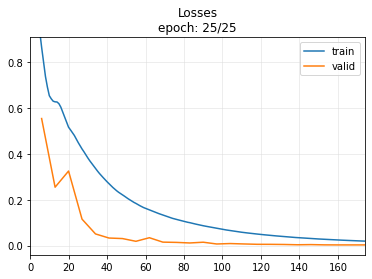

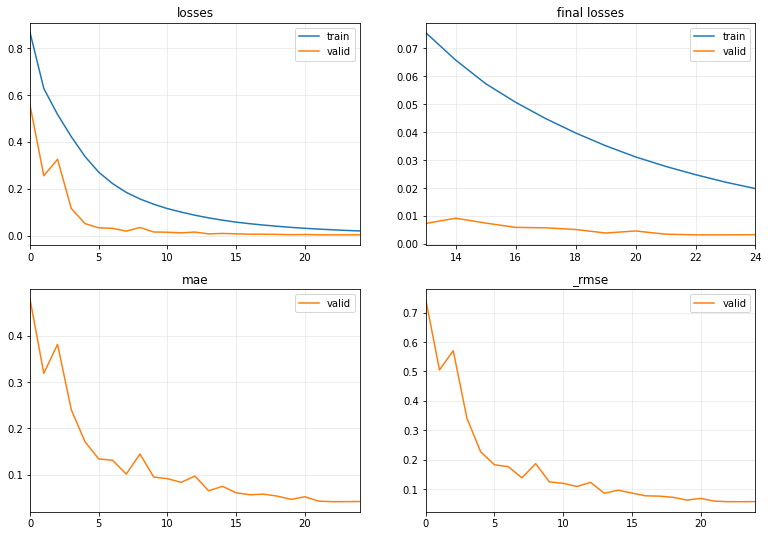

-IMF 28 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


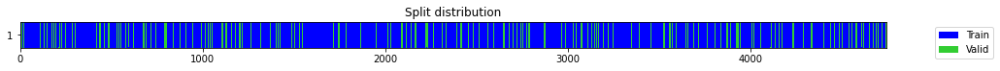

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.687003,0.562634,0.428114,0.750089,00:00
1,0.424895,0.067309,0.185025,0.259440,00:00
2,0.380561,0.149729,0.259623,0.386948,00:01
3,0.307728,0.124380,0.252618,0.352675,00:00
4,0.247528,0.088892,0.201244,0.298148,00:00
5,0.202760,0.036785,0.142127,0.191794,00:01
6,0.172321,0.044520,0.162829,0.210999,00:01
7,0.146481,0.025935,0.121755,0.161045,00:00
8,0.124550,0.047431,0.187446,0.217787,00:01
9,0.107844,0.022252,0.113390,0.149173,00:00


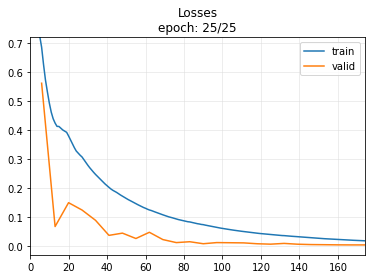

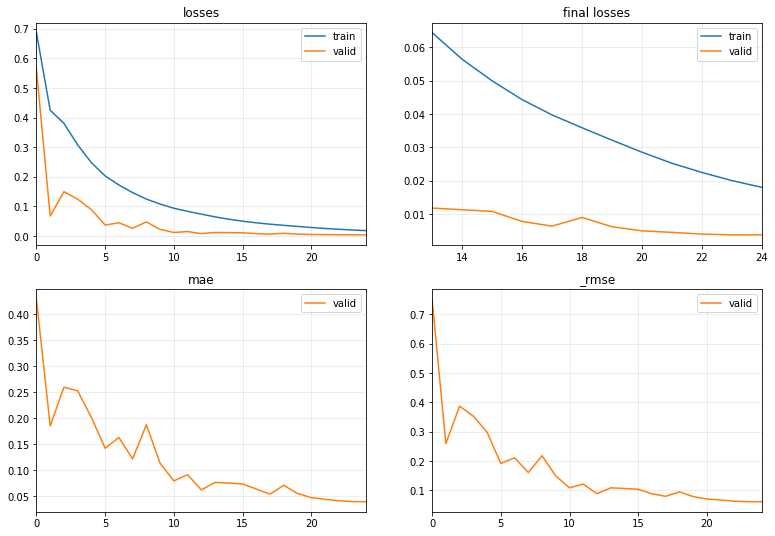

-IMF 29 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


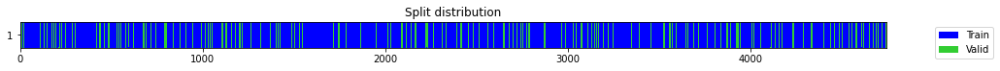

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.772359,0.375857,0.479701,0.613072,00:01
1,0.531733,0.074945,0.202420,0.273760,00:00
2,0.433606,0.294035,0.419820,0.542250,00:01
3,0.348962,0.074164,0.218070,0.272330,00:00
4,0.278121,0.050285,0.175430,0.224242,00:01
5,0.223610,0.022333,0.116634,0.149443,00:00
6,0.180795,0.011134,0.082549,0.105516,00:01
7,0.149505,0.013921,0.090472,0.117986,00:01
8,0.124758,0.015617,0.092389,0.124966,00:00
9,0.105358,0.007157,0.065309,0.084598,00:00


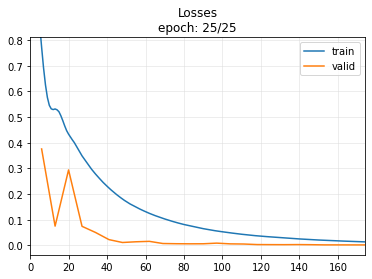

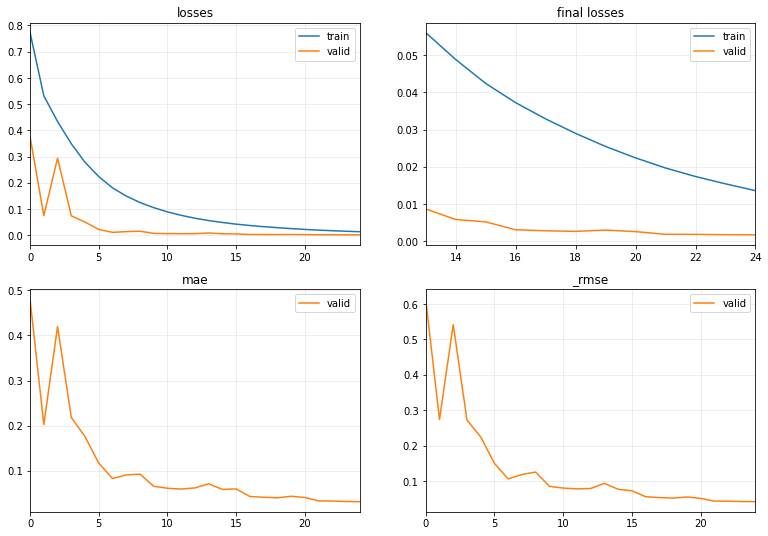

-IMF 30 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


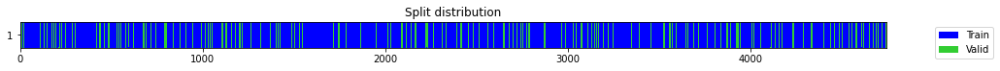

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.707128,0.327619,0.460886,0.572380,00:00
1,0.507429,0.076561,0.207174,0.276697,00:01
2,0.410517,0.303376,0.444745,0.550796,00:01
3,0.327815,0.069119,0.207640,0.262904,00:01
4,0.261279,0.041905,0.163372,0.204708,00:00
5,0.209470,0.019793,0.111470,0.140686,00:01
6,0.173935,0.012194,0.084564,0.110427,00:01
7,0.144160,0.071528,0.241811,0.267447,00:00
8,0.124326,0.069797,0.248402,0.264192,00:00
9,0.108727,0.007294,0.066649,0.085404,00:00


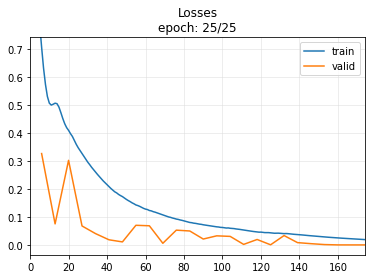

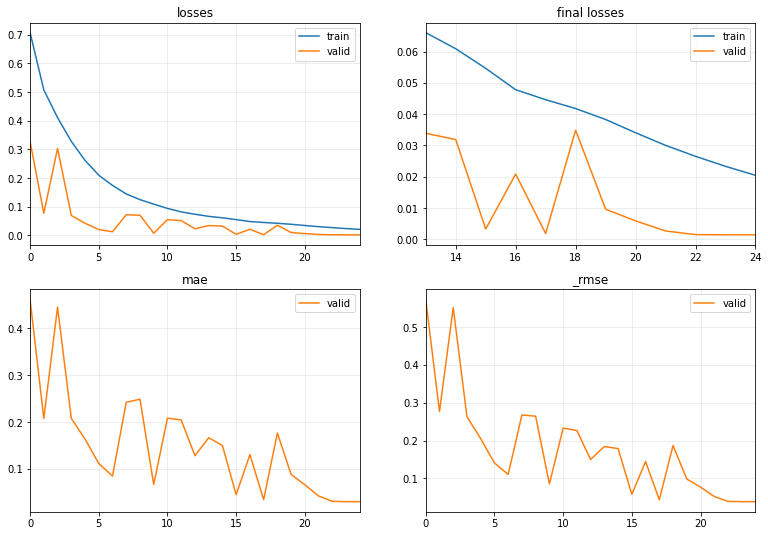

-IMF 31 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


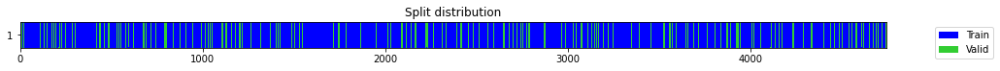

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.118040,0.975888,0.734513,0.987870,00:01
1,1.056121,0.940062,0.717989,0.969568,00:01
2,0.990889,0.878173,0.689904,0.937109,00:00
3,0.937894,0.842465,0.678607,0.917859,00:01
4,0.893098,0.863800,0.691680,0.929409,00:00
5,0.867150,0.939015,0.719914,0.969028,00:01
6,0.842407,0.884738,0.694550,0.940605,00:01
7,0.820687,0.857002,0.686350,0.925744,00:01
8,0.798154,0.816514,0.663215,0.903612,00:00
9,0.778252,0.848671,0.679191,0.921233,00:01


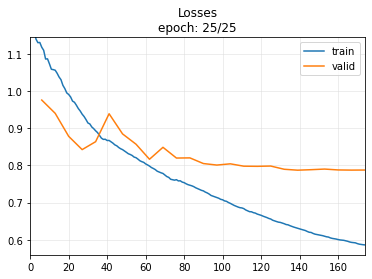

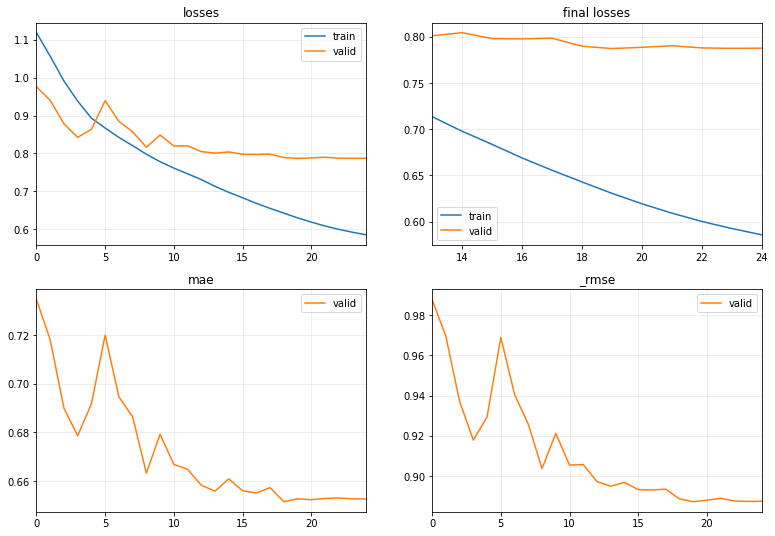

Targets and Predictions shapes (1187,) (1187,)
InceptionTimePlus : MAPE =  1.3363219045910288 MAE =  0.017570725606823462 RMSE =  0.021597202533357795


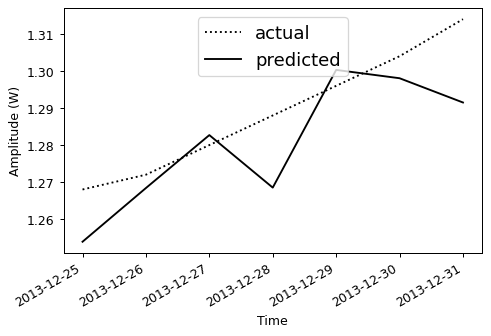

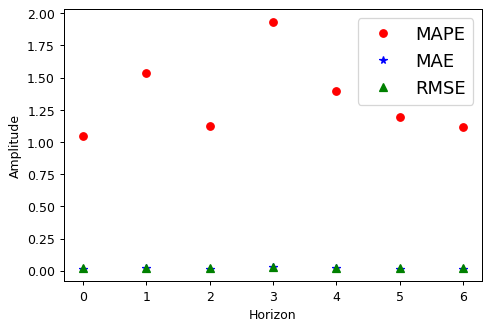

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Thick_data = to3d(VMD_Thick.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with EMD - Thickness + time info.

In [ ]:
exec('bottleneck = True')
exec('coord = True')
exec('separable = True')
exec('zero_norm = True')
exec('nf = 48')
exec('ks = 60')
exec('conv_dropout = 0.225672865601702')
exec('fc_dropout = 0.0191174699417543')
exec('learning_rate = 0.00367854986560518')

par = {'bottleneck':bottleneck,'coord':coord,'separable':separable,'zero_norm':zero_norm,'nf':nf,'ks':ks,'conv_dropout':conv_dropout,'fc_dropout':fc_dropout}

In [ ]:
ind = 'EMD4IMFs';
mode = 'ThickTime_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
VMD_Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + ind + '_' + season + '.csv')
VMD_Thick = VMD_Thick.drop(columns='Element0')
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,1.951,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,...,2.035,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069
1,1.955,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,...,2.038,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071
2,1.962,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,...,2.039,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065
3,1.965,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,...,2.046,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064
4,1.973,1.981,1.986,1.984,1.977,1.974,1.974,1.977,1.984,1.987,...,2.050,2.054,2.058,2.061,2.066,2.069,2.071,2.065,2.064,2.067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,1.503,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,...,1.646,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672
5932,1.507,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,...,1.648,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676
5933,1.513,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,...,1.647,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681
5934,1.519,1.526,1.528,1.539,1.547,1.551,1.556,1.559,1.563,1.566,...,1.653,1.653,1.656,1.660,1.665,1.666,1.672,1.676,1.681,1.687


In [ ]:
split_indx = 30

print('Processing Thick and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Thick and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


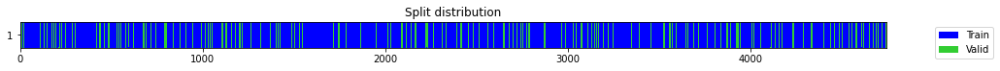

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.945148,1.430685,0.596835,1.196113,00:01
1,0.870409,1.204552,0.598795,1.097521,00:01
2,0.818599,1.049106,0.599033,1.024259,00:01
3,0.787932,1.061158,0.651804,1.030125,00:01
4,0.805461,1.239592,0.759126,1.113370,00:01
5,0.832973,0.987121,0.621804,0.993540,00:01
6,0.810673,0.949652,0.611089,0.974501,00:01
7,0.774078,0.952246,0.615252,0.975831,00:01
8,0.734244,0.890254,0.598886,0.943533,00:01
9,0.702452,0.899394,0.592763,0.948364,00:01


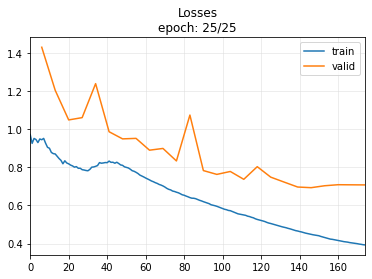

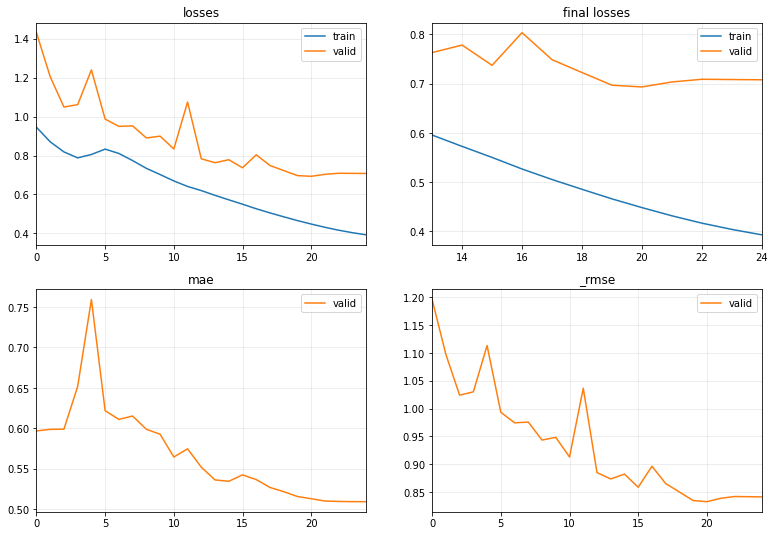

-IMF 1 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


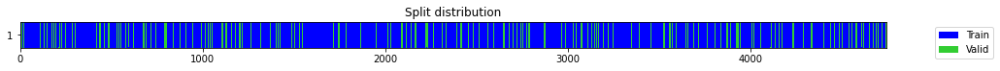

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.980564,0.895792,0.621006,0.946463,00:01
1,0.876248,0.723298,0.573801,0.850469,00:01
2,0.784462,0.592696,0.533299,0.769868,00:01
3,0.719000,0.629127,0.573668,0.793175,00:01
4,0.695915,0.734176,0.664846,0.856841,00:01
5,0.696200,0.613842,0.555832,0.783481,00:01
6,0.664207,0.626240,0.554016,0.791354,00:01
7,0.617872,0.507179,0.488415,0.712165,00:01
8,0.566834,0.378693,0.413616,0.615381,00:01
9,0.521357,0.367494,0.413335,0.606212,00:01


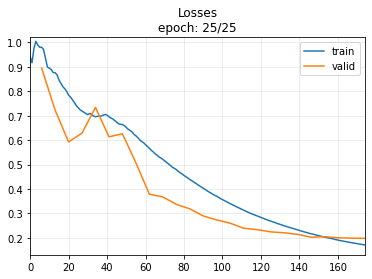

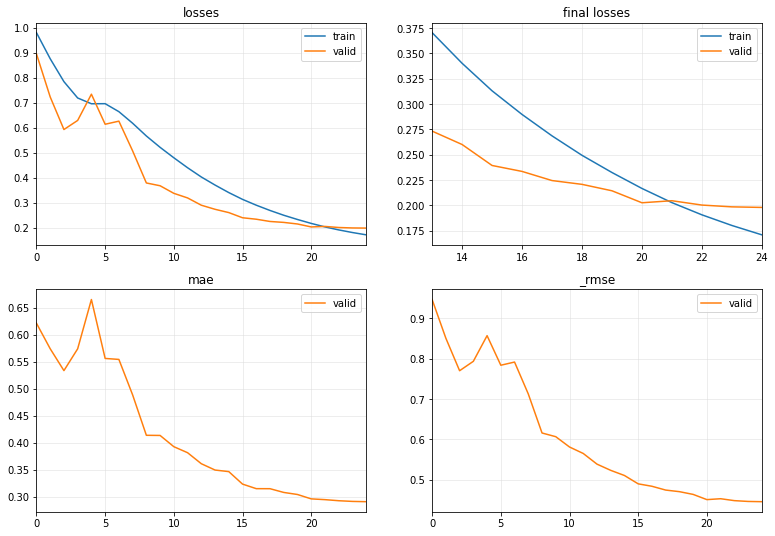

-IMF 2 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


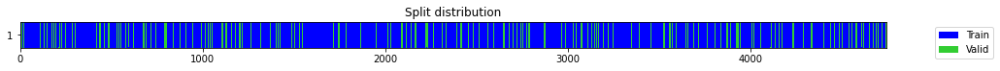

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.715988,0.539064,0.416460,0.734210,00:01
1,0.628968,0.431525,0.394179,0.656906,00:01
2,0.549394,0.378362,0.370642,0.615111,00:01
3,0.494122,0.420560,0.433699,0.648506,00:01
4,0.496511,0.440277,0.453103,0.663534,00:01
5,0.505905,0.435215,0.423348,0.659708,00:01
6,0.471283,0.303914,0.337630,0.551284,00:01
7,0.429652,0.320460,0.329725,0.566092,00:01
8,0.394955,0.244004,0.284726,0.493967,00:01
9,0.360493,0.237494,0.274763,0.487334,00:01


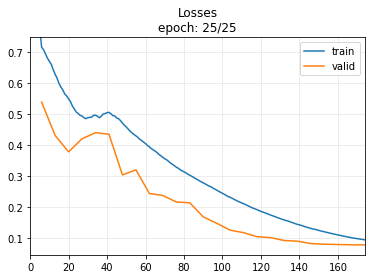

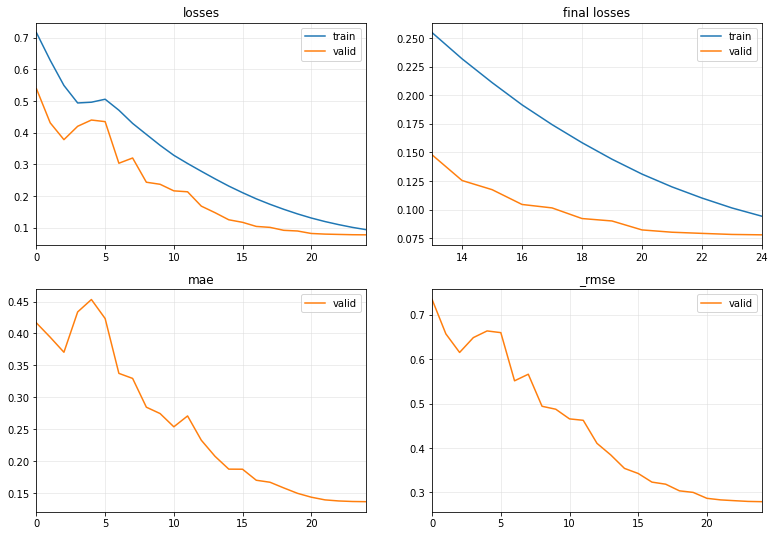

-IMF 3 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


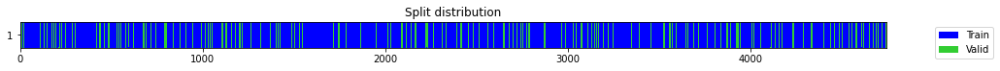

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.730086,0.180410,0.210467,0.424747,00:01
1,0.666326,0.185299,0.218801,0.430464,00:01
2,0.549374,0.139165,0.208877,0.373049,00:01
3,0.466013,0.267450,0.278532,0.517156,00:01
4,0.425161,0.701781,0.587901,0.837724,00:01
5,0.458436,0.292927,0.328147,0.541227,00:01
6,0.449381,0.614553,0.403106,0.783934,00:01
7,0.428987,0.328978,0.369655,0.573566,00:01
8,0.411061,0.302821,0.312042,0.550291,00:01
9,0.372807,0.110294,0.196760,0.332105,00:01


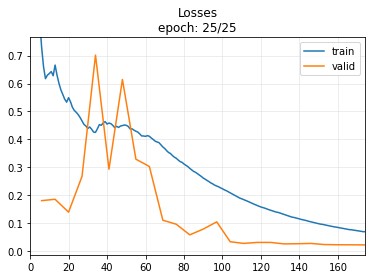

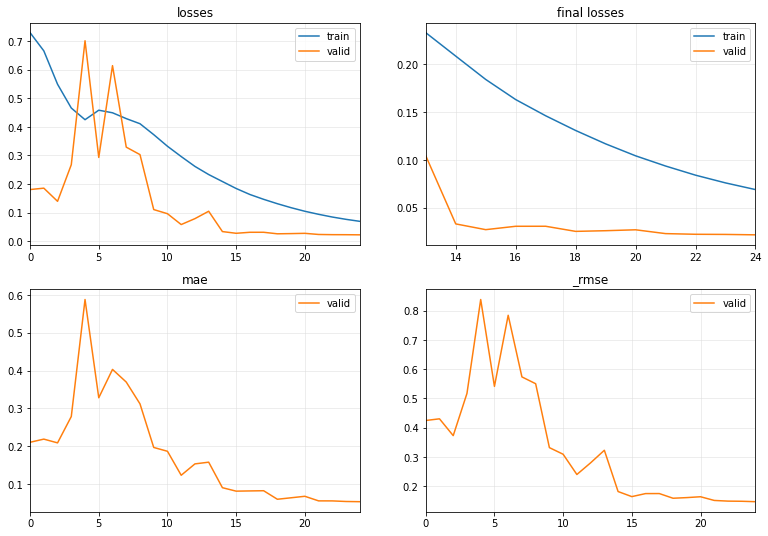

-IMF 4 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


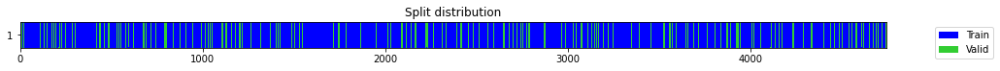

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.465926,0.105729,0.257932,0.325160,00:01
1,0.382631,0.357683,0.494969,0.598066,00:01
2,0.324039,0.150945,0.306820,0.388516,00:01
3,0.270963,0.115182,0.255483,0.339385,00:01
4,0.236245,0.113505,0.279278,0.336904,00:01
5,0.334590,0.307755,0.423970,0.554757,00:01
6,0.324788,0.132492,0.290608,0.363994,00:01
7,0.284068,0.052132,0.168555,0.228325,00:01
8,0.246211,0.041751,0.168159,0.204330,00:01
9,0.208947,0.021004,0.113158,0.144928,00:01


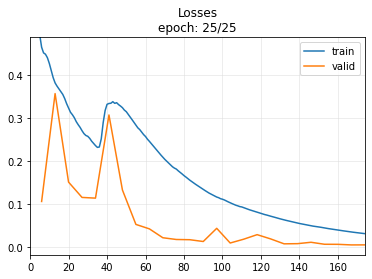

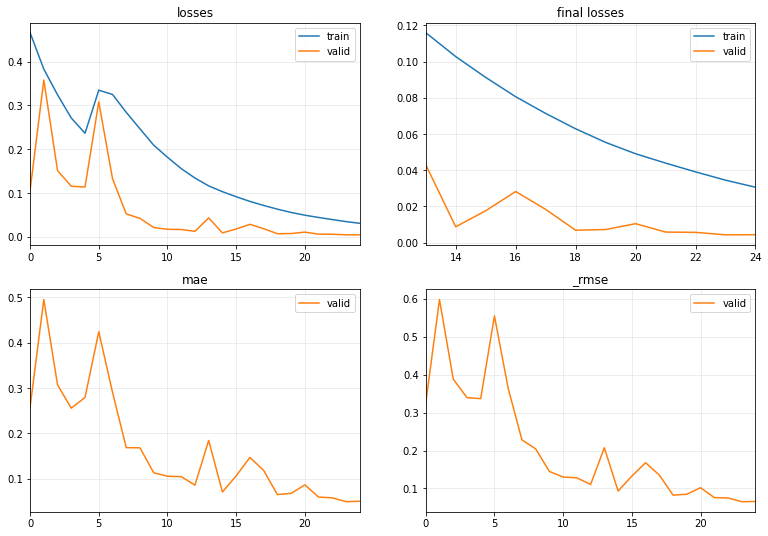

Targets and Predictions shapes (1187,) (1187,)
InceptionTimePlus : MAPE =  2.028462530495255 MAE =  0.02701666292494344 RMSE =  0.033389462757713


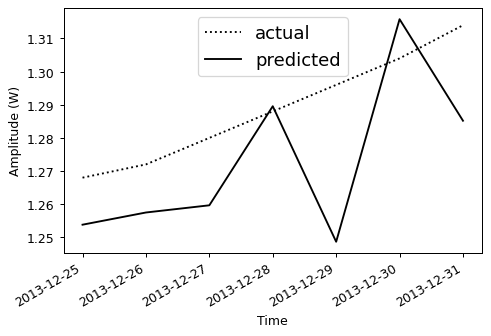

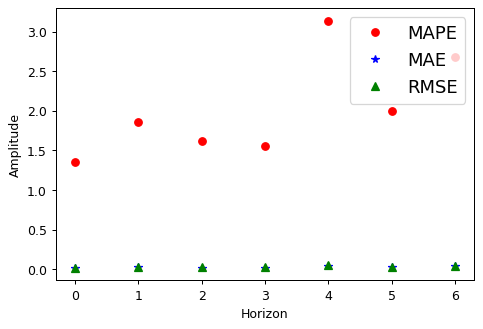

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Thick_data = to3d(VMD_Thick.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


## season2

In [ ]:
season = season2

### no VMD - Thickness + time info.

In [ ]:
ind = ''
mode = 'ThickTime_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,2.223,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,...,2.394,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444
1,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,...,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452
2,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,...,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458
3,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,...,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461
4,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,2.308,...,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461,2.465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,1.791,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,...,1.635,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553
6812,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,...,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536
6813,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,...,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513
6814,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,1.730,...,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513,1.501


#### Hyperparameter tuning

Processing Thickness data..
splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


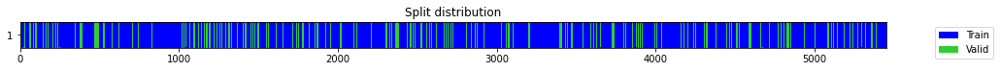

In [ ]:
split_indx = 30

print('Processing Thickness data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Thick_data = to3d(Thick.iloc[:,:].values)
# Temp_data = to3d(Temp.iloc[:,:].values)
data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1)  #, TS_Mend, TS_Mstart
data_X = data[:,:,:split_indx]
data_y = data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

In [ ]:
import optuna
from optuna.integration import FastAIPruningCallback

def objective(trial:optuna.Trial):
    
    # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
    # nf = trial.suggest_categorical('num_filters', [32, 64, 96]) # search through all categorical values in the provided list
    n_layers = trial.suggest_int('n_layers', 3, 8, step=1) 
    bias = trial.suggest_categorical('bias', [True,False]) 
    rnn_dropout = trial.suggest_float("rnn_dropout",0, 0.5) 
    bidirectional = trial.suggest_categorical('bidirectional', [True,False])
    fc_dropout = trial.suggest_float('fc_dropout', 0,0.5) 
    bn = trial.suggest_categorical('bn', [True,False])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True) 

    learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512,
                         arch=model_name, arch_config={'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn},
                         metrics=rmse)# , cbs=FastAIPruningCallback(trial))

    with ContextManagers([learn.no_logging(), learn.no_bar()]): # [Optional] this prevents fastai from printing anything during training
        learn.fit_one_cycle(5, lr_max=learning_rate)

    # Return the objective value
    return learn.recorder.values[-1][1] # return the validation loss value of the last epoch 

study = optuna.create_study(direction='minimize')
print(f"Sampler is {study.sampler.__class__.__name__}")

study.optimize(objective, n_trials=100)

print("**Study statistics: ")
print("  Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("{}".format(value))


[I 2022-07-23 21:50:35,018] A new study created in memory with name: no-name-bdaab0de-898c-455f-bd3b-6df24f326aaa


Sampler is TPESampler


[I 2022-07-23 21:50:42,422] Trial 0 finished with value: 0.02352006547152996 and parameters: {'bottleneck': True, 'coord': True, 'separable': False, 'zero_norm': True, 'nf': 40, 'ks': 80, 'conv_dropout': 0.036947853584330614, 'fc_dropout': 0.4448873265613687, 'learning_rate': 0.0027547717030953654}. Best is trial 0 with value: 0.02352006547152996.
[I 2022-07-23 21:50:49,476] Trial 1 finished with value: 0.023785440251231194 and parameters: {'bottleneck': True, 'coord': True, 'separable': True, 'zero_norm': True, 'nf': 24, 'ks': 60, 'conv_dropout': 0.13735462430174056, 'fc_dropout': 0.12370283519283332, 'learning_rate': 0.0018790178804814657}. Best is trial 0 with value: 0.02352006547152996.
[I 2022-07-23 21:50:54,487] Trial 2 finished with value: 0.19770032167434692 and parameters: {'bottleneck': False, 'coord': False, 'separable': False, 'zero_norm': False, 'nf': 8, 'ks': 80, 'conv_dropout': 0.09482772935707745, 'fc_dropout': 0.38923860763654344, 'learning_rate': 7.239813631626692e-05

**Study statistics: 
  Number of finished trials:  100
Best trial:
  Value:  0.013125311583280563
  Params: 
False
False
False
False
32
80
0.03770070342659
0.2095407519297085
0.002935226709999871


#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.360181,0.552389,0.606230,0.743229,00:01
1,0.208948,0.125996,0.277611,0.354959,00:01
2,0.148697,0.084899,0.210810,0.291375,00:01
3,0.139325,0.179072,0.298656,0.423169,00:01
4,0.122283,0.277012,0.408391,0.526319,00:01
5,0.111671,0.042793,0.165546,0.206866,00:01
6,0.093715,0.022716,0.118675,0.150718,00:01
7,0.078991,0.011160,0.081187,0.105642,00:01
8,0.068688,0.023604,0.120149,0.153636,00:01
9,0.061060,0.036733,0.166692,0.191658,00:01


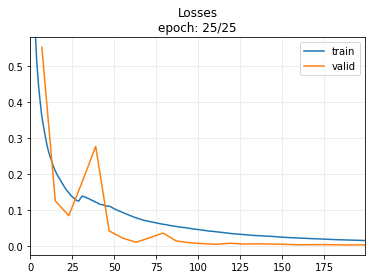

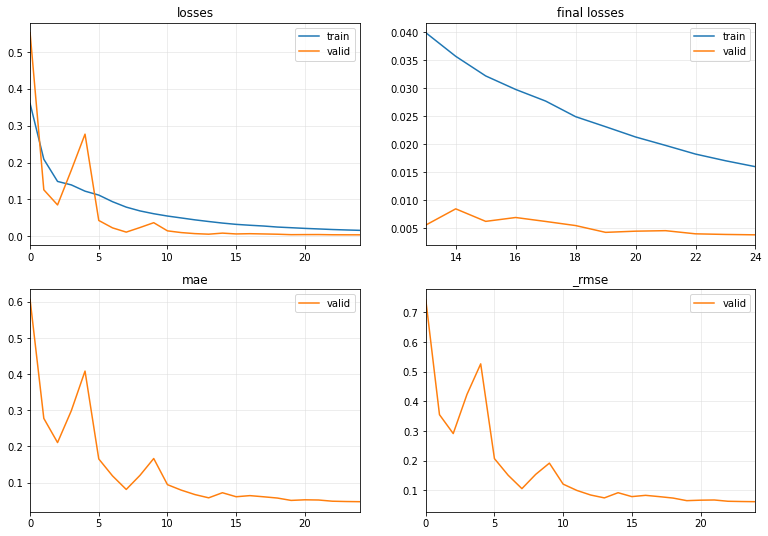

Targets and Predictions shapes (1363, 7) (1363, 7)
InceptionTimePlus : MAPE =  1.8738711151914267 MAE =  0.026817011806454103 RMSE =  0.03340868068271178


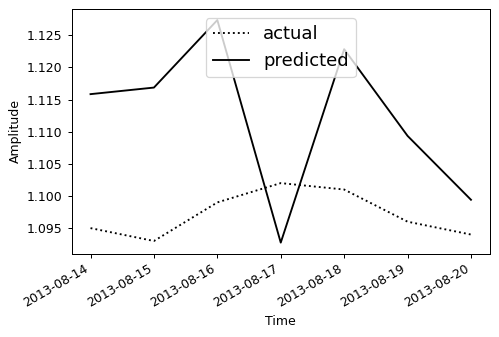

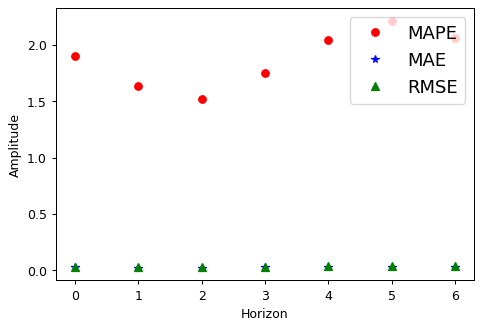

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### no VMD - Time info. only

In [ ]:
ind = ''
mode = 'Time_'
Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,2.223,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,...,2.394,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444
1,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,...,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452
2,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,...,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458
3,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,...,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461
4,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,2.308,...,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461,2.465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,1.791,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,...,1.635,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553
6812,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,...,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536
6813,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,...,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513
6814,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,1.730,...,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513,1.501


Processing Thickness data..
splitting data..
Standardizing data..
training set:  (5453, 3, 30) (5453, 7) , testing set:  (1363, 3, 30) (1363, 7)


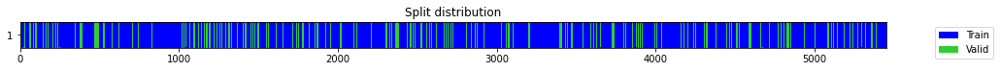

In [ ]:
split_indx = 30

print('Processing Thickness data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Thick_data = to3d(Thick.iloc[:,:].values)
data = np.concatenate([TS_D, TS_Y, TS_M],axis=1) 
data_X = data[:,:,:split_indx]
data_y = Thick_data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.384784,0.633043,0.643516,0.795640,00:01
1,0.260788,0.248008,0.399885,0.498004,00:01
2,0.205447,0.258868,0.414370,0.508791,00:01
3,0.201618,1.348081,0.890992,1.161069,00:01
4,0.207252,0.512292,0.591974,0.715746,00:01
5,0.185415,0.315909,0.441335,0.562058,00:01
6,0.166022,0.132173,0.281291,0.363557,00:01
7,0.150019,0.097114,0.252244,0.311632,00:01
8,0.135040,0.076239,0.208069,0.276114,00:01
9,0.123160,0.102389,0.238883,0.319983,00:01


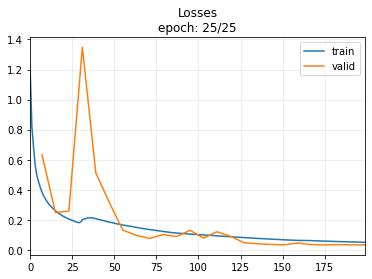

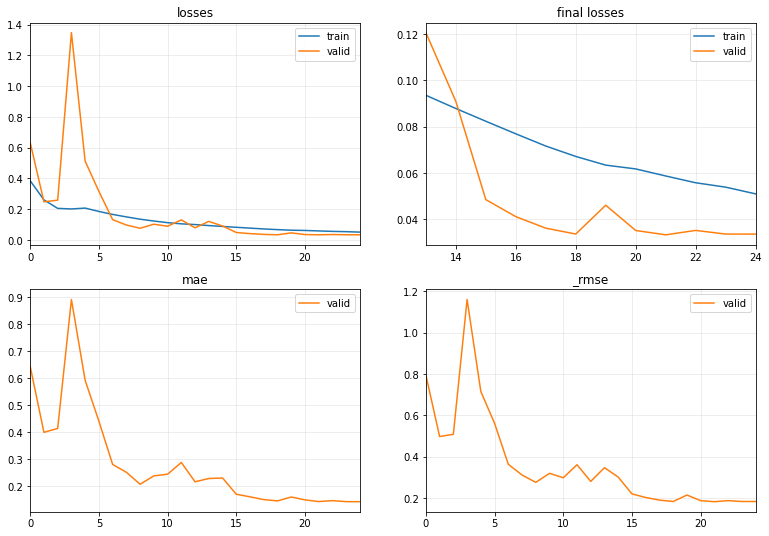

Targets and Predictions shapes (1363, 7) (1363, 7)
InceptionTimePlus : MAPE =  7.979198710133141 MAE =  0.10955043309779934 RMSE =  0.14903847939104506


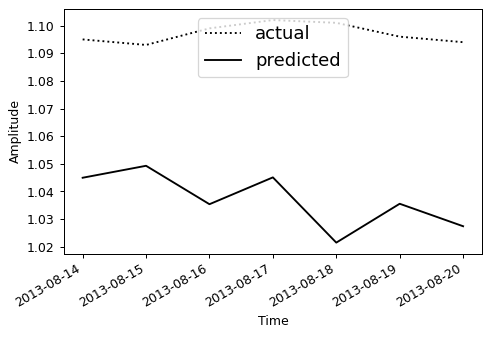

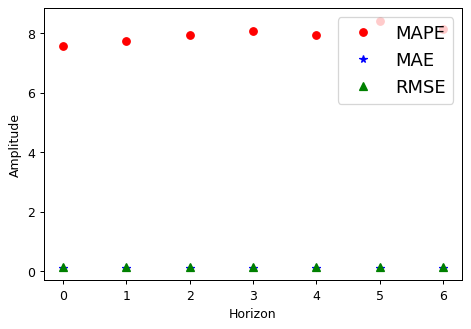

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with VMD - Thickness + time info.

In [ ]:
ind = '31IMFs';
mode = 'ThickTime_'

Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
VMD_Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + ind + '_' + season + '.csv')
VMD_Thick = VMD_Thick.drop(columns='Element0')
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,2.223,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,...,2.394,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444
1,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,...,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452
2,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,...,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458
3,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,...,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461
4,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,2.308,...,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461,2.465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,1.791,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,...,1.635,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553
6812,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,...,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536
6813,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,...,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513
6814,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,1.730,...,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513,1.501


In [ ]:
split_indx = 30

print('Processing Thick and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}

Processing Thick and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


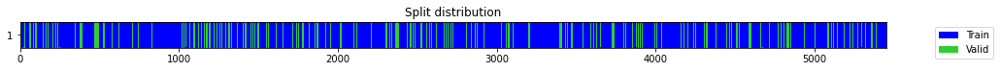

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.010377,0.890832,0.707783,0.943839,00:01
1,0.771175,0.555060,0.535272,0.745024,00:01
2,0.628465,0.319356,0.377886,0.565116,00:01
3,0.535691,0.620169,0.588078,0.787508,00:01
4,0.479295,0.324054,0.387722,0.569257,00:01
5,0.414650,0.268917,0.362153,0.518572,00:01
6,0.361768,0.186549,0.295477,0.431913,00:01
7,0.314485,0.153148,0.239016,0.391341,00:01
8,0.273806,0.143844,0.232615,0.379268,00:01
9,0.240144,0.148497,0.241306,0.385353,00:01


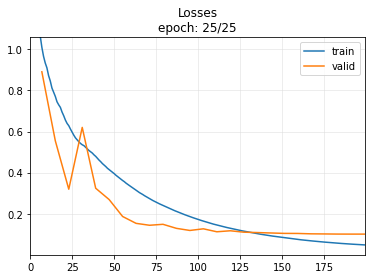

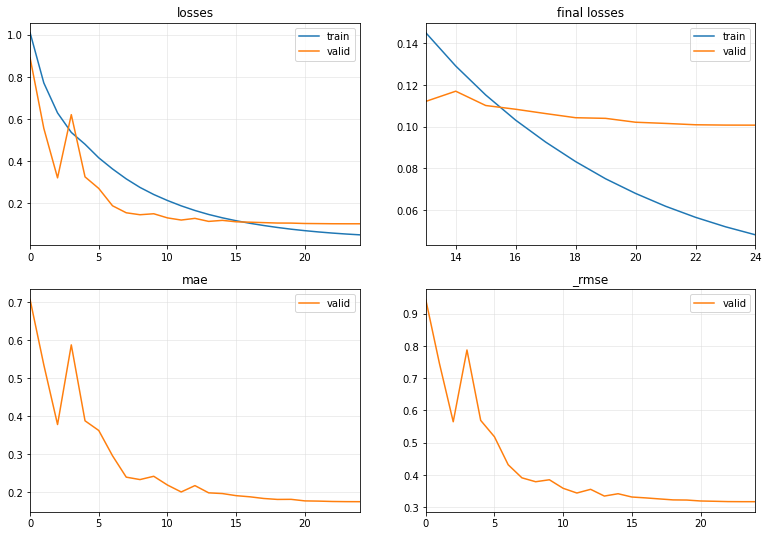

-IMF 1 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


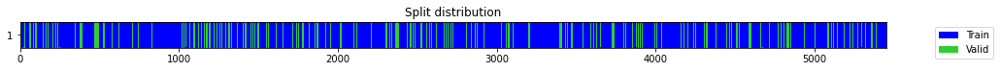

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.109998,0.956871,0.767724,0.978198,00:01
1,0.852409,0.702031,0.649264,0.837873,00:01
2,0.708483,0.423794,0.471942,0.650995,00:01
3,0.586947,0.333023,0.407802,0.577081,00:01
4,0.508642,0.457272,0.507296,0.676219,00:01
5,0.442807,0.211553,0.315863,0.459949,00:01
6,0.379014,0.142440,0.256494,0.377412,00:01
7,0.325989,0.127807,0.247148,0.357501,00:01
8,0.281106,0.113217,0.234396,0.336478,00:01
9,0.245341,0.117528,0.242246,0.342823,00:01


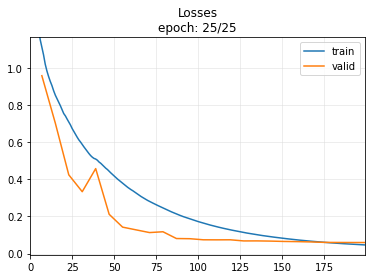

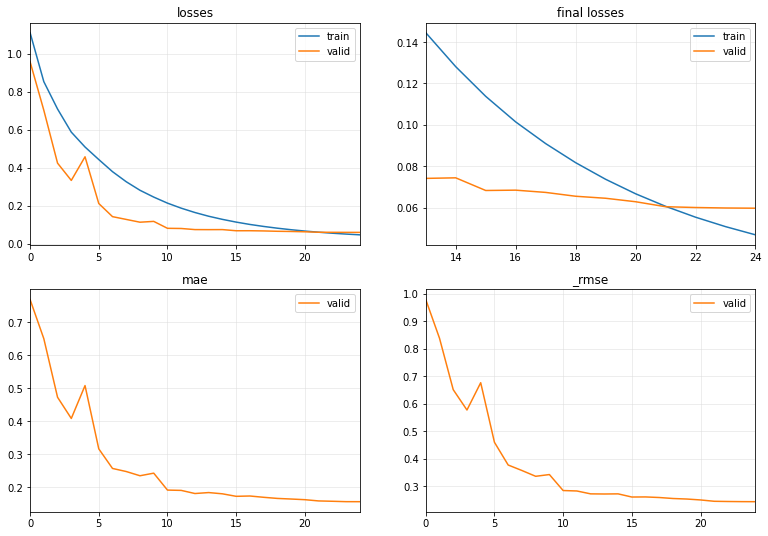

-IMF 2 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


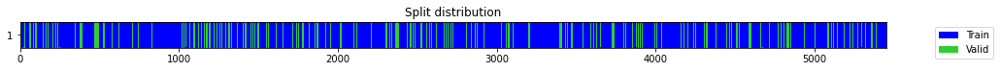

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.158612,0.950668,0.742504,0.975022,00:01
1,0.924054,0.709696,0.636121,0.842434,00:01
2,0.768906,0.517622,0.520625,0.719459,00:01
3,0.647539,0.348240,0.417804,0.590119,00:01
4,0.544318,0.328209,0.414263,0.572895,00:01
5,0.461059,0.228814,0.349684,0.478345,00:01
6,0.392176,0.148924,0.274709,0.385907,00:01
7,0.333428,0.109477,0.237428,0.330873,00:01
8,0.284566,0.106226,0.233406,0.325923,00:01
9,0.244247,0.089397,0.210695,0.298994,00:01


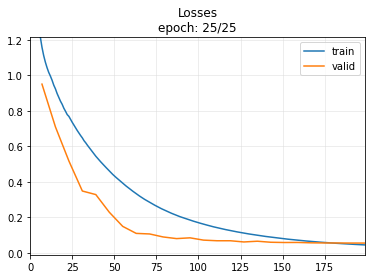

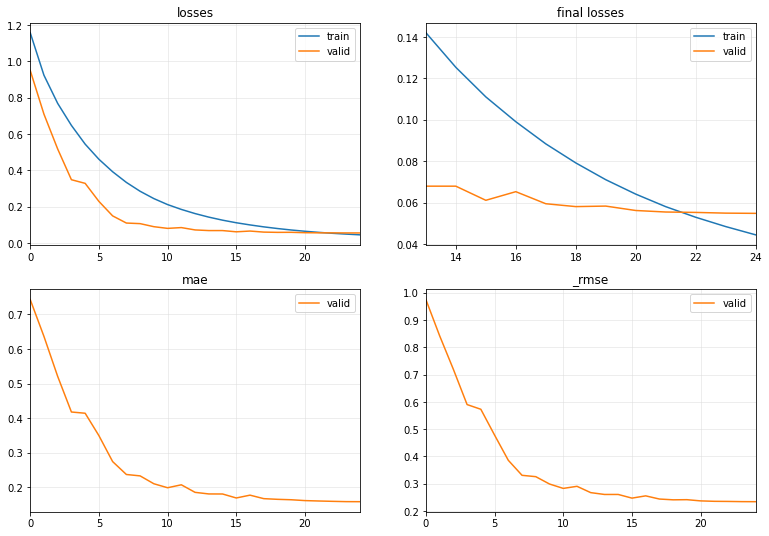

-IMF 3 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


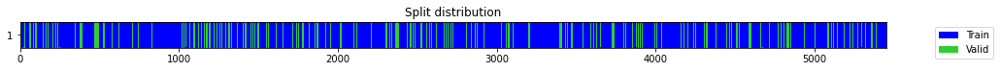

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.171748,0.992775,0.763449,0.996381,00:01
1,0.958032,0.796145,0.674686,0.892270,00:01
2,0.807893,0.572485,0.553674,0.756628,00:01
3,0.664897,0.373982,0.432518,0.611541,00:01
4,0.565293,0.306748,0.381392,0.553848,00:01
5,0.468542,0.193575,0.288874,0.439971,00:01
6,0.389016,0.143972,0.237379,0.379436,00:01
7,0.326180,0.128454,0.213238,0.358405,00:01
8,0.277076,0.118502,0.211473,0.344241,00:01
9,0.237201,0.103231,0.195720,0.321296,00:01


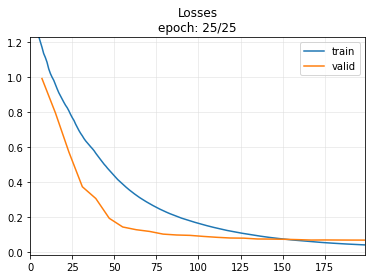

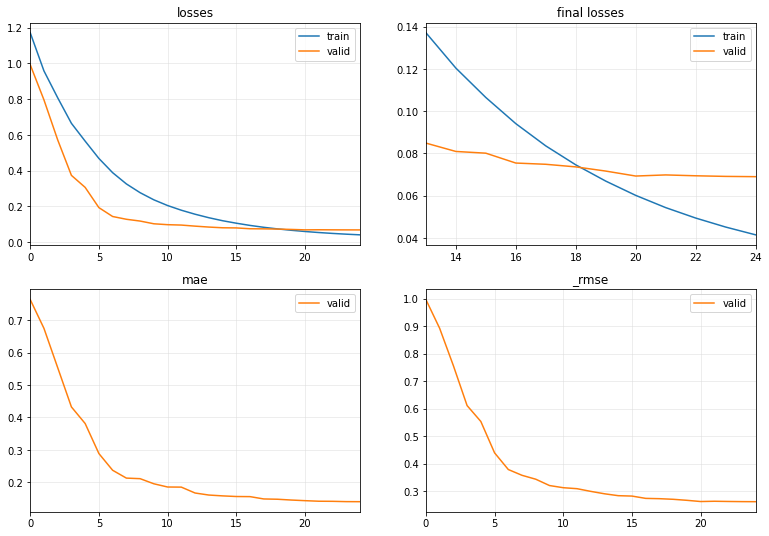

-IMF 4 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


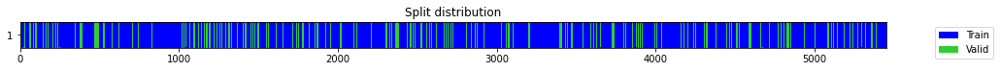

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.187949,1.050879,0.778032,1.025124,00:01
1,0.981752,0.862233,0.706731,0.928565,00:01
2,0.825012,0.585752,0.573625,0.765345,00:01
3,0.679769,0.341399,0.393900,0.584294,00:01
4,0.564816,0.264721,0.368765,0.514511,00:01
5,0.473503,0.199940,0.312614,0.447146,00:01
6,0.396965,0.127871,0.257311,0.357590,00:01
7,0.333080,0.108170,0.234451,0.328892,00:01
8,0.283016,0.103035,0.236355,0.320991,00:01
9,0.241755,0.079182,0.192863,0.281393,00:01


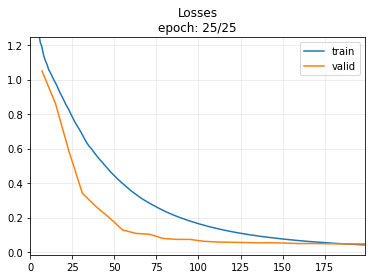

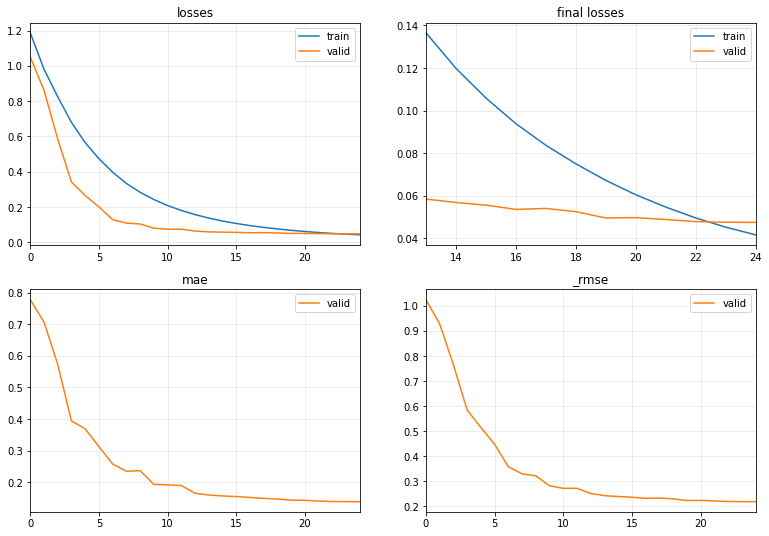

-IMF 5 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


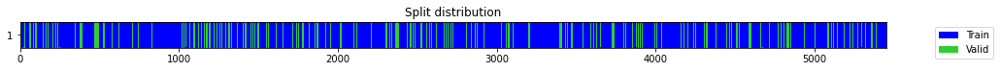

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.179612,1.098933,0.789557,1.048300,00:01
1,0.981462,0.916106,0.719958,0.957134,00:01
2,0.827536,0.643391,0.602166,0.802117,00:01
3,0.687612,0.443519,0.502940,0.665972,00:01
4,0.567638,0.394683,0.455265,0.628238,00:01
5,0.467340,0.193865,0.306105,0.440301,00:01
6,0.387775,0.148944,0.265287,0.385932,00:01
7,0.324304,0.099827,0.215168,0.315954,00:01
8,0.273262,0.081340,0.195228,0.285202,00:01
9,0.232148,0.077192,0.191510,0.277834,00:01


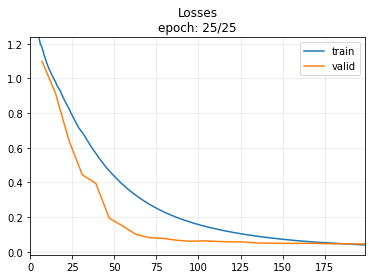

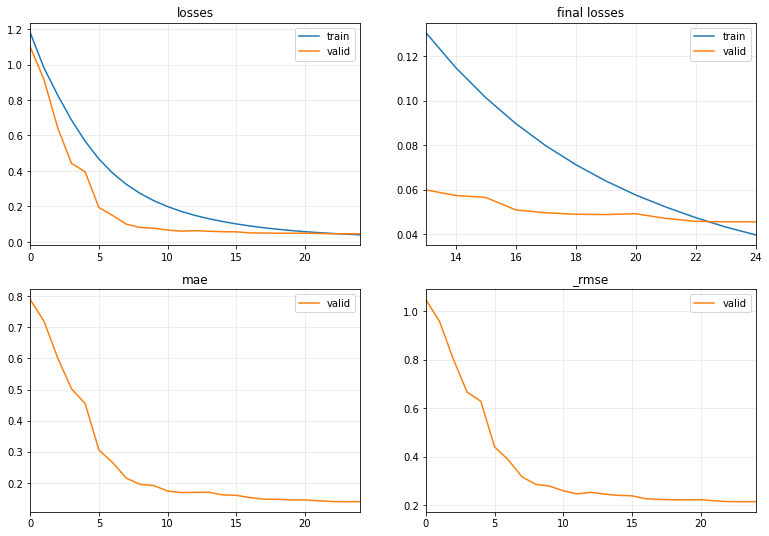

-IMF 6 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


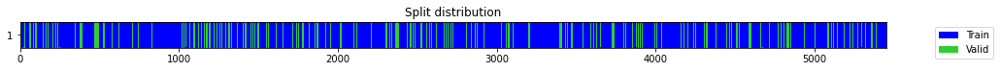

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.149998,1.103168,0.789633,1.050318,00:01
1,0.947219,0.929335,0.726889,0.964020,00:01
2,0.798782,0.639632,0.602874,0.799770,00:01
3,0.655177,0.366138,0.417159,0.605094,00:01
4,0.539478,0.268870,0.361292,0.518527,00:01
5,0.444603,0.191624,0.313684,0.437749,00:01
6,0.368705,0.123930,0.243401,0.352037,00:01
7,0.308739,0.109902,0.242372,0.331514,00:01
8,0.260932,0.076406,0.188755,0.276415,00:01
9,0.222218,0.072567,0.181141,0.269382,00:01


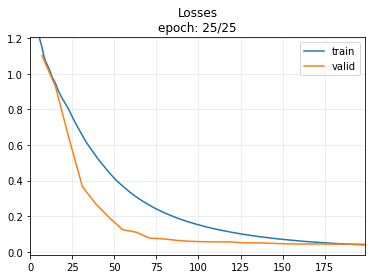

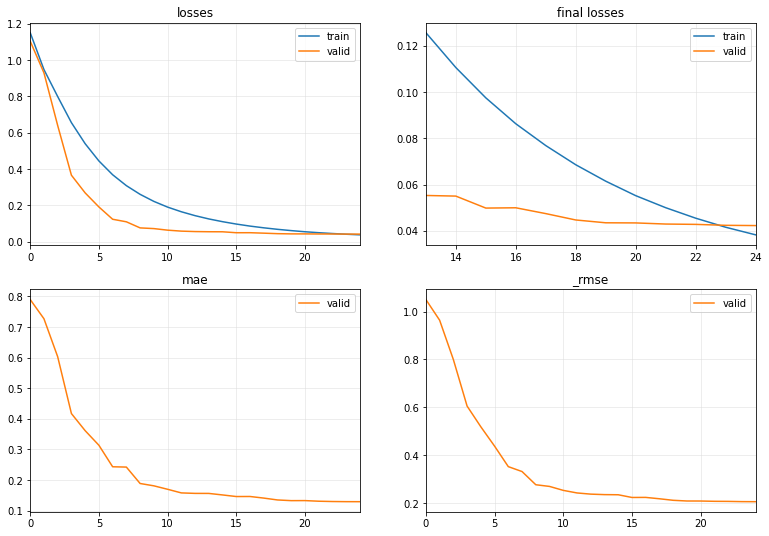

-IMF 7 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


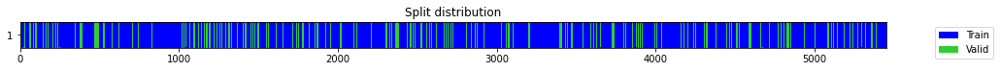

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.192959,0.960440,0.744157,0.980021,00:01
1,0.975241,0.826256,0.693483,0.908986,00:01
2,0.816873,0.586014,0.588842,0.765515,00:01
3,0.686677,0.317605,0.419761,0.563564,00:01
4,0.563255,0.219003,0.333710,0.467978,00:01
5,0.463256,0.133026,0.256468,0.364727,00:01
6,0.381894,0.111203,0.240086,0.333471,00:01
7,0.318877,0.085485,0.202825,0.292378,00:01
8,0.268901,0.083621,0.202232,0.289173,00:01
9,0.229209,0.079769,0.194283,0.282433,00:01


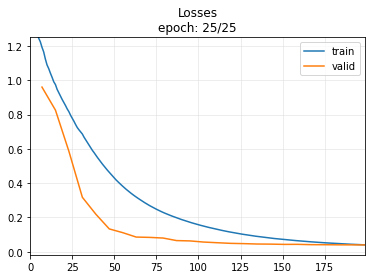

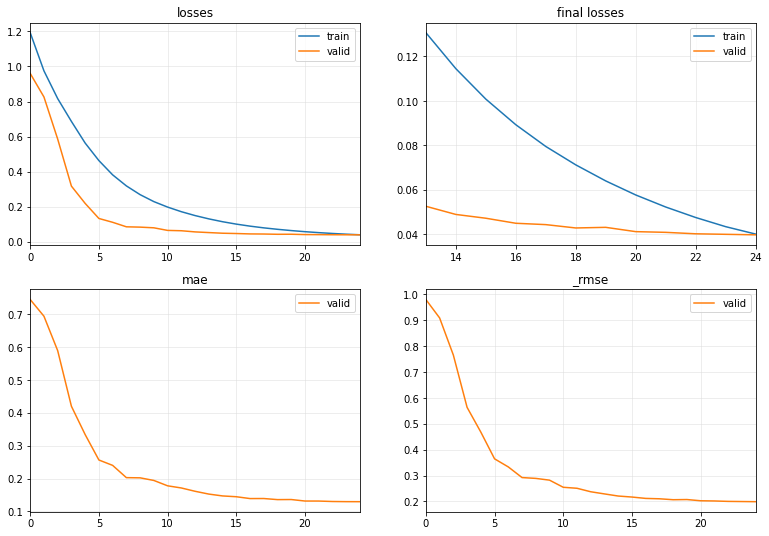

-IMF 8 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


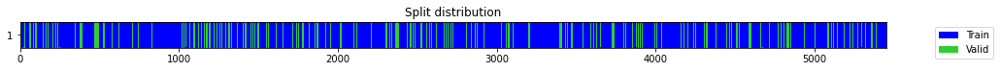

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.147963,0.940515,0.737072,0.969801,00:01
1,0.938515,0.780238,0.677271,0.883311,00:01
2,0.782578,0.532091,0.553578,0.729446,00:01
3,0.655585,0.317664,0.424653,0.563617,00:01
4,0.545769,0.269918,0.372762,0.519536,00:01
5,0.454145,0.166464,0.297280,0.408000,00:01
6,0.377031,0.122634,0.255158,0.350191,00:01
7,0.317532,0.094732,0.225701,0.307786,00:01
8,0.269153,0.076967,0.197686,0.277429,00:01
9,0.229727,0.057613,0.171411,0.240027,00:01


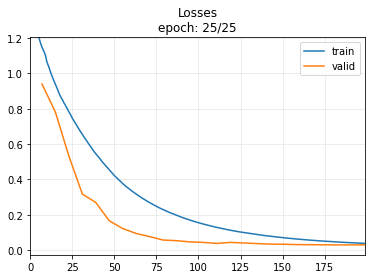

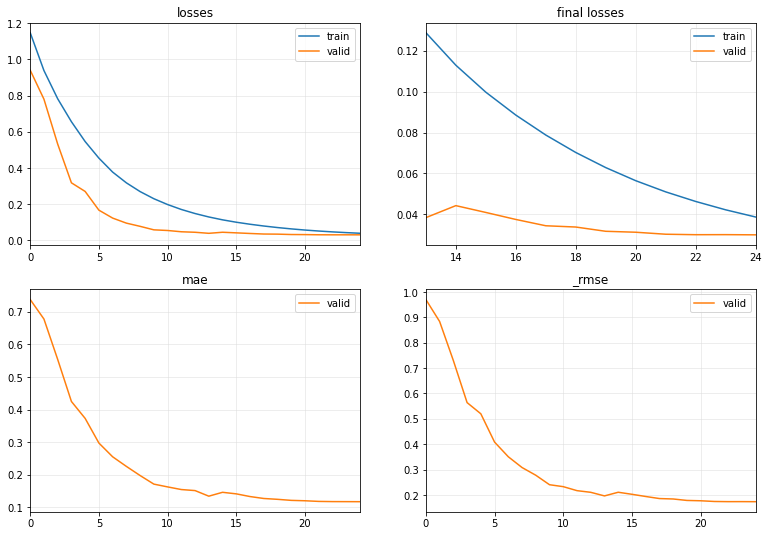

-IMF 9 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


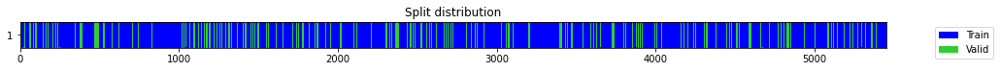

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.118882,0.994469,0.742742,0.997231,00:01
1,0.901590,0.798227,0.679383,0.893435,00:01
2,0.752866,0.544008,0.560903,0.737569,00:01
3,0.649499,0.435204,0.503612,0.659700,00:01
4,0.545497,0.219857,0.352787,0.468889,00:01
5,0.452442,0.118989,0.251599,0.344948,00:01
6,0.377578,0.129366,0.231027,0.359675,00:01
7,0.317695,0.096536,0.213820,0.310702,00:01
8,0.269528,0.076111,0.188707,0.275883,00:01
9,0.229433,0.062356,0.170623,0.249712,00:01


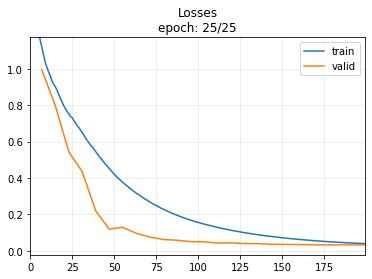

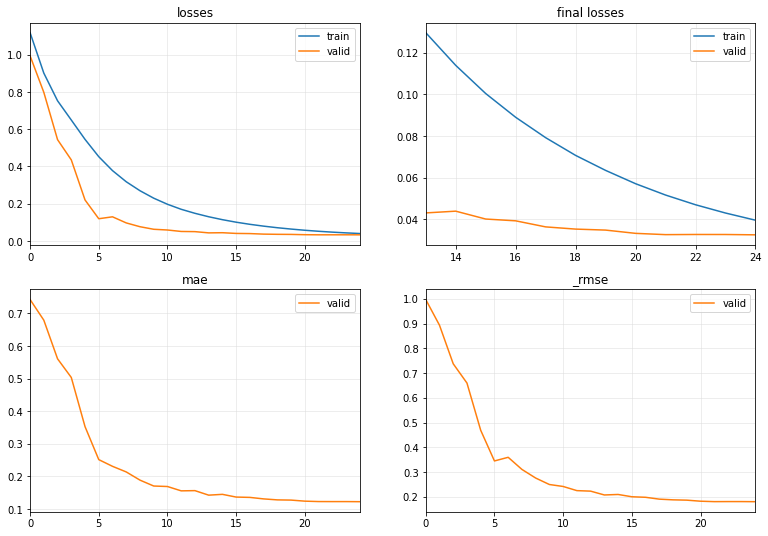

-IMF 10 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


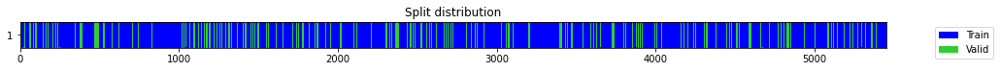

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.093296,0.947077,0.719512,0.973179,00:01
1,0.865115,0.770872,0.663414,0.877993,00:01
2,0.711340,0.480125,0.530460,0.692911,00:01
3,0.591311,0.371315,0.445076,0.609357,00:01
4,0.493248,0.182782,0.310099,0.427530,00:01
5,0.409468,0.177669,0.310786,0.421508,00:01
6,0.345552,0.104695,0.225504,0.323565,00:01
7,0.291185,0.081518,0.202762,0.285514,00:01
8,0.247732,0.065950,0.179220,0.256807,00:01
9,0.212164,0.066549,0.183302,0.257971,00:01


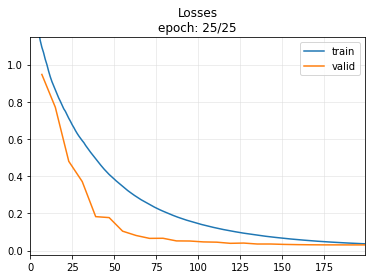

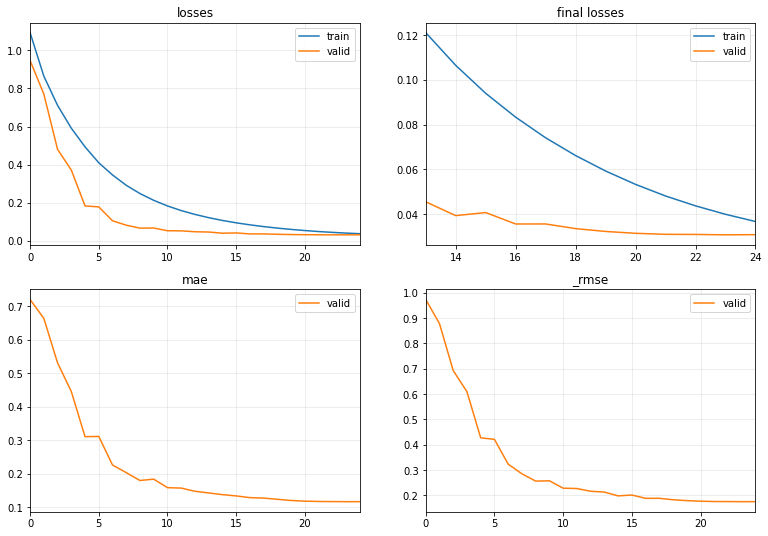

-IMF 11 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


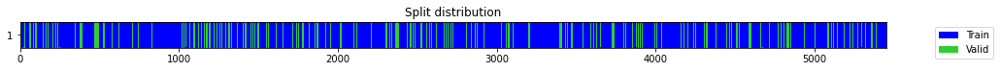

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.047434,1.008131,0.728021,1.004057,00:01
1,0.853720,0.810406,0.669416,0.900225,00:01
2,0.702266,0.518756,0.538798,0.720247,00:01
3,0.587263,0.343625,0.415533,0.586195,00:01
4,0.491192,0.413406,0.448587,0.642967,00:01
5,0.424163,0.258251,0.344311,0.508184,00:01
6,0.358686,0.145105,0.237239,0.380927,00:01
7,0.302555,0.129984,0.214087,0.360533,00:01
8,0.256483,0.096562,0.172579,0.310744,00:01
9,0.218545,0.087934,0.156093,0.296538,00:01


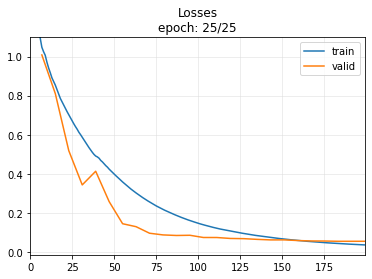

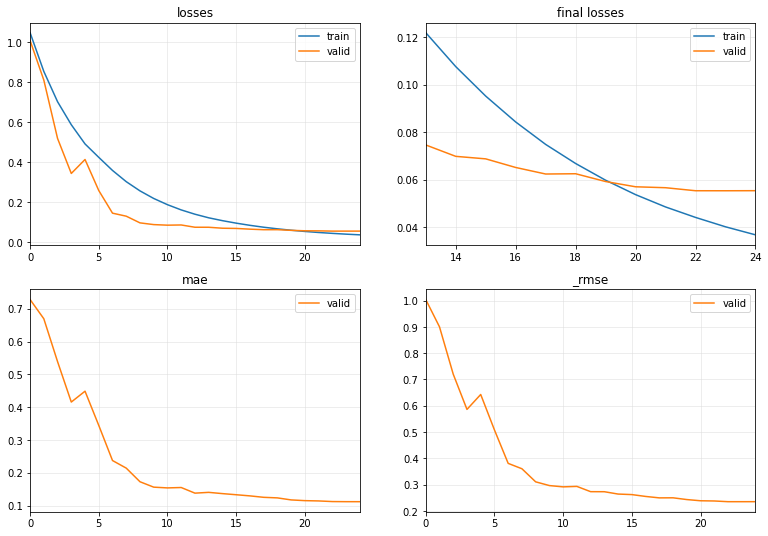

-IMF 12 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


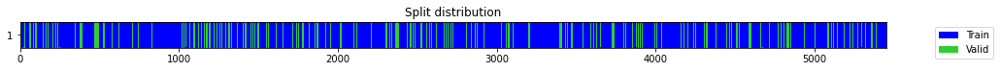

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.171558,0.980299,0.706056,0.990100,00:01
1,0.915368,0.711889,0.641360,0.843735,00:01
2,0.775890,0.535764,0.540165,0.731959,00:01
3,0.664320,0.349442,0.452896,0.591136,00:01
4,0.560107,0.254447,0.349520,0.504428,00:01
5,0.467984,0.163717,0.286640,0.404619,00:01
6,0.390289,0.101448,0.221490,0.318509,00:01
7,0.330578,0.085954,0.205824,0.293178,00:01
8,0.281730,0.066219,0.181216,0.257330,00:01
9,0.241036,0.056702,0.167307,0.238122,00:01


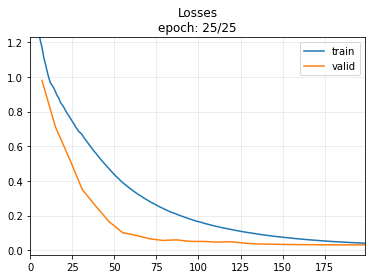

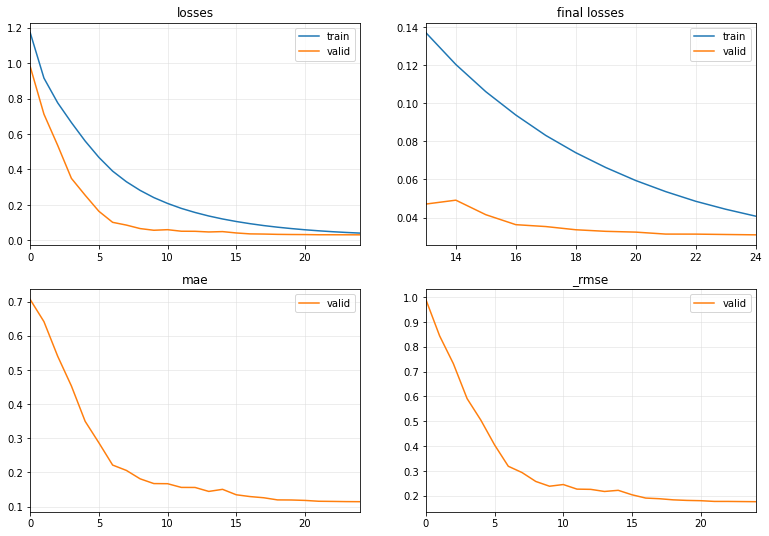

-IMF 13 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


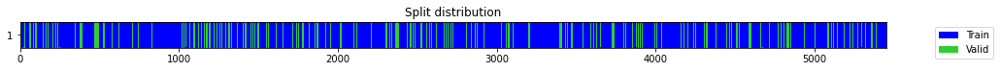

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.997834,0.902604,0.674890,0.950055,00:01
1,0.779640,0.666617,0.607581,0.816466,00:01
2,0.644483,0.396550,0.480234,0.629722,00:01
3,0.541474,0.372429,0.419834,0.610269,00:01
4,0.458428,0.239768,0.365583,0.489661,00:01
5,0.390855,0.145029,0.280291,0.380827,00:01
6,0.331595,0.114483,0.240981,0.338354,00:01
7,0.282333,0.092988,0.215728,0.304939,00:01
8,0.242291,0.070369,0.188492,0.265271,00:01
9,0.208521,0.063147,0.173165,0.251290,00:01


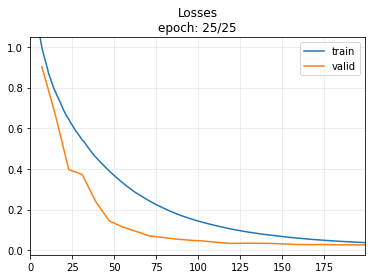

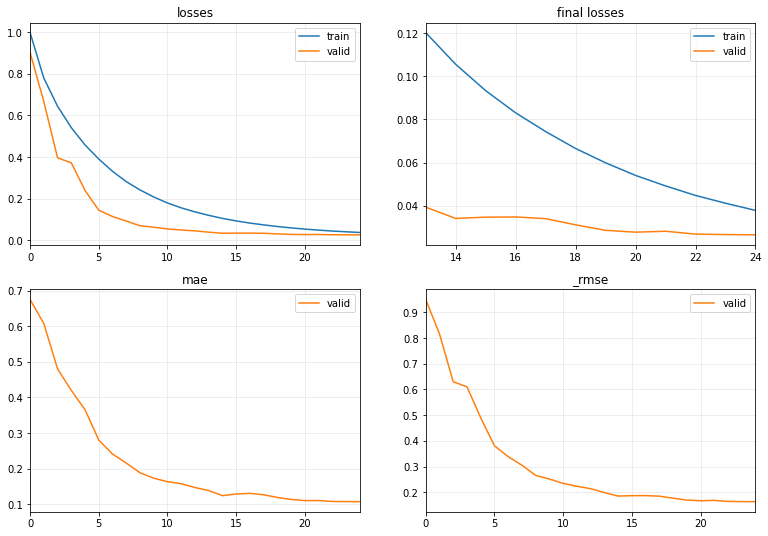

-IMF 14 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


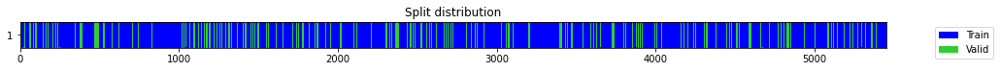

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.938917,0.949141,0.696041,0.974238,00:01
1,0.715307,0.704850,0.624554,0.839554,00:01
2,0.569472,0.377054,0.465124,0.614047,00:01
3,0.480808,0.295106,0.394333,0.543236,00:01
4,0.397852,0.255261,0.364454,0.505234,00:01
5,0.344762,0.132397,0.268530,0.363864,00:01
6,0.290889,0.100706,0.231795,0.317342,00:01
7,0.245630,0.077624,0.200257,0.278611,00:01
8,0.210051,0.059897,0.173920,0.244739,00:01
9,0.180235,0.058709,0.169496,0.242299,00:01


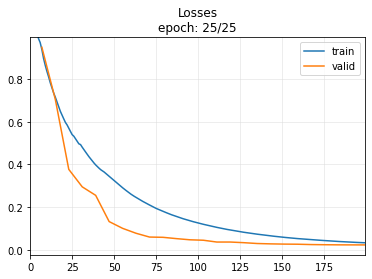

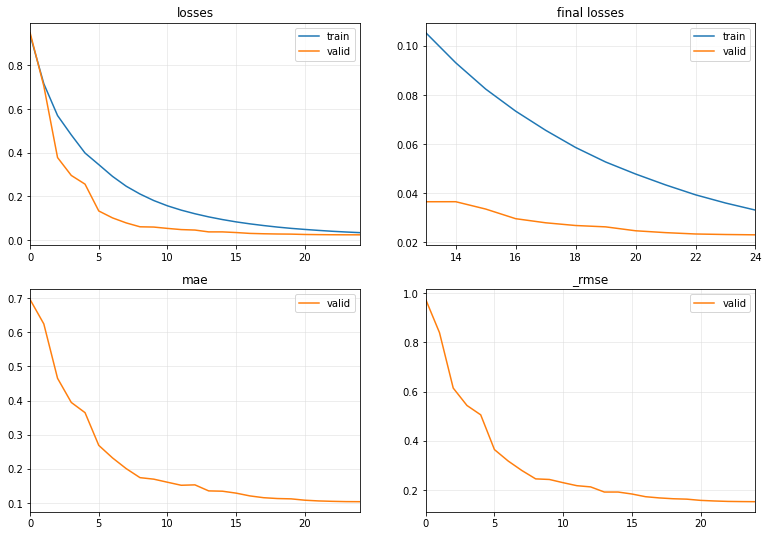

-IMF 15 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


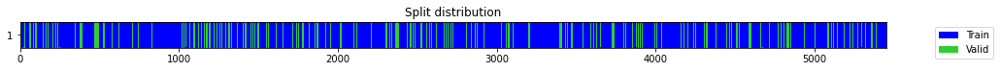

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.033128,0.982475,0.661341,0.991199,00:01
1,0.778213,0.695375,0.587941,0.833891,00:01
2,0.624400,0.514156,0.492921,0.717047,00:01
3,0.531830,0.334451,0.432475,0.578317,00:01
4,0.468238,0.234015,0.341846,0.483751,00:01
5,0.394460,0.133921,0.269248,0.365952,00:01
6,0.330653,0.087915,0.210409,0.296505,00:01
7,0.280985,0.083821,0.212198,0.289519,00:01
8,0.242515,0.086469,0.203518,0.294055,00:01
9,0.213886,0.073205,0.174247,0.270565,00:01


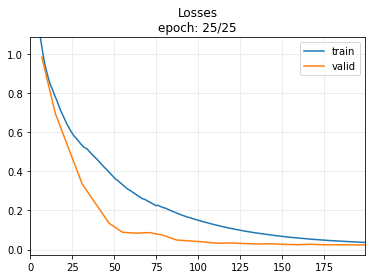

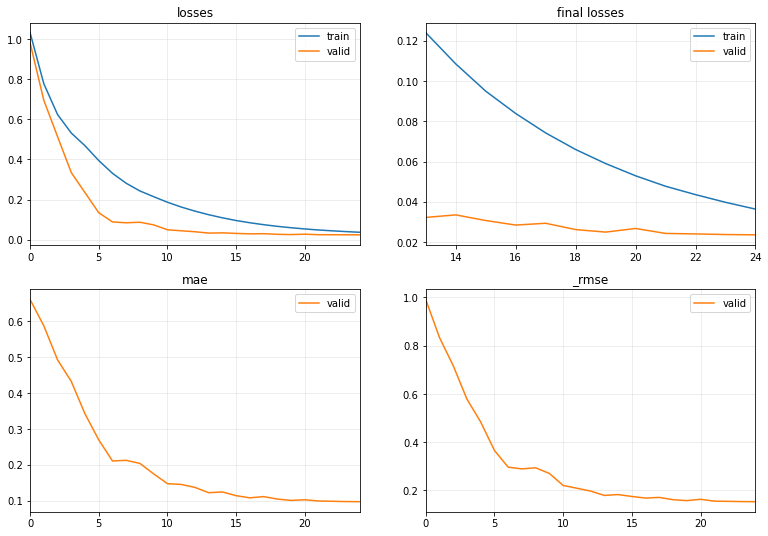

-IMF 16 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


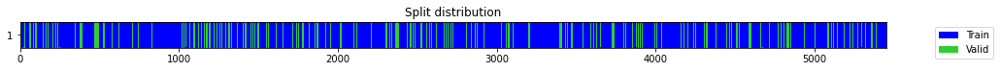

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.960905,0.903668,0.652168,0.950615,00:01
1,0.731204,0.620397,0.572232,0.787653,00:01
2,0.595569,0.357657,0.455059,0.598044,00:01
3,0.498272,0.324803,0.424525,0.569915,00:01
4,0.421145,0.210046,0.327735,0.458307,00:01
5,0.355268,0.109808,0.245799,0.331372,00:01
6,0.299794,0.078154,0.204424,0.279560,00:01
7,0.252253,0.068010,0.182063,0.260787,00:01
8,0.213923,0.053662,0.161469,0.231651,00:01
9,0.184452,0.052301,0.161380,0.228694,00:01


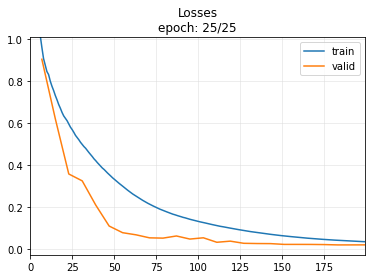

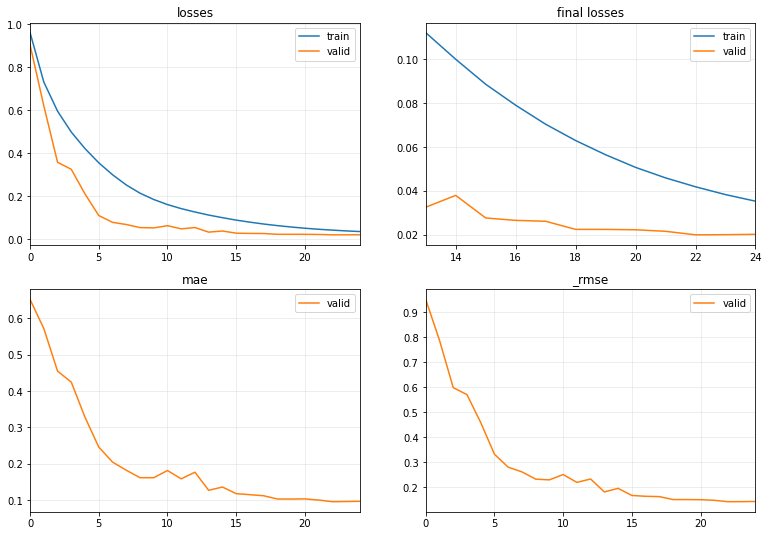

-IMF 17 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


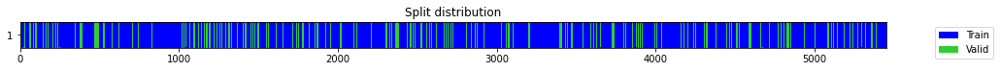

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.858559,1.012149,0.659875,1.006056,00:01
1,0.639842,0.631822,0.561745,0.794873,00:01
2,0.512380,0.358136,0.440265,0.598445,00:01
3,0.422083,0.425122,0.375645,0.652014,00:01
4,0.366750,0.287205,0.365674,0.535915,00:01
5,0.314126,0.130241,0.249303,0.360889,00:01
6,0.268199,0.083361,0.214429,0.288723,00:01
7,0.233083,0.069774,0.188952,0.264148,00:01
8,0.199699,0.070879,0.189981,0.266230,00:01
9,0.171652,0.067774,0.187339,0.260334,00:01


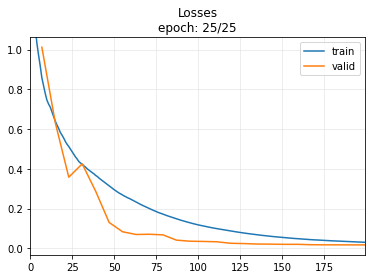

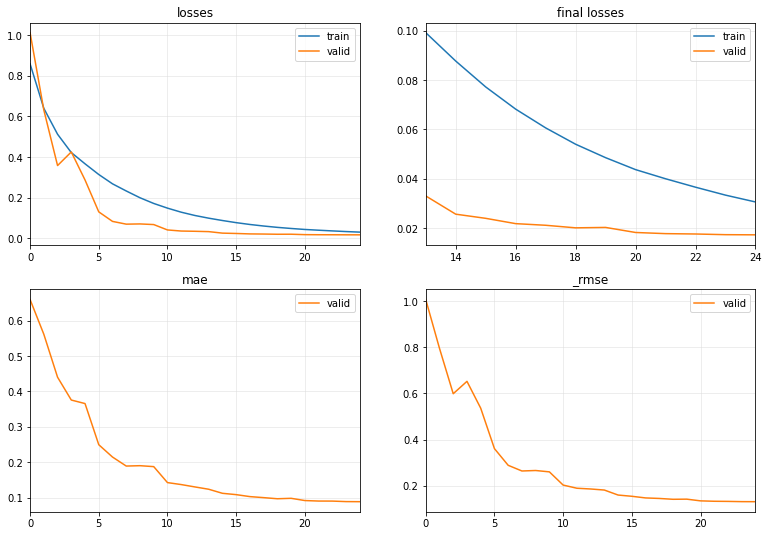

-IMF 18 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


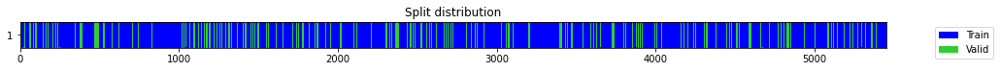

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.930605,0.930800,0.651901,0.964780,00:01
1,0.661632,0.598300,0.547832,0.773498,00:01
2,0.519165,0.351487,0.423115,0.592863,00:01
3,0.419571,0.183785,0.312757,0.428701,00:01
4,0.348870,0.272839,0.400406,0.522340,00:01
5,0.304680,0.160626,0.259902,0.400781,00:01
6,0.258644,0.085883,0.201523,0.293057,00:01
7,0.224482,0.067996,0.176969,0.260760,00:01
8,0.192141,0.065203,0.170005,0.255349,00:01
9,0.165385,0.051537,0.160018,0.227017,00:01


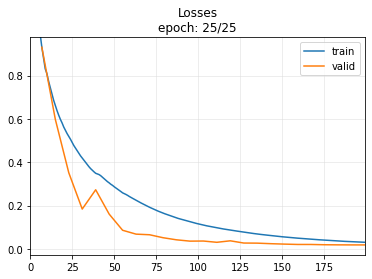

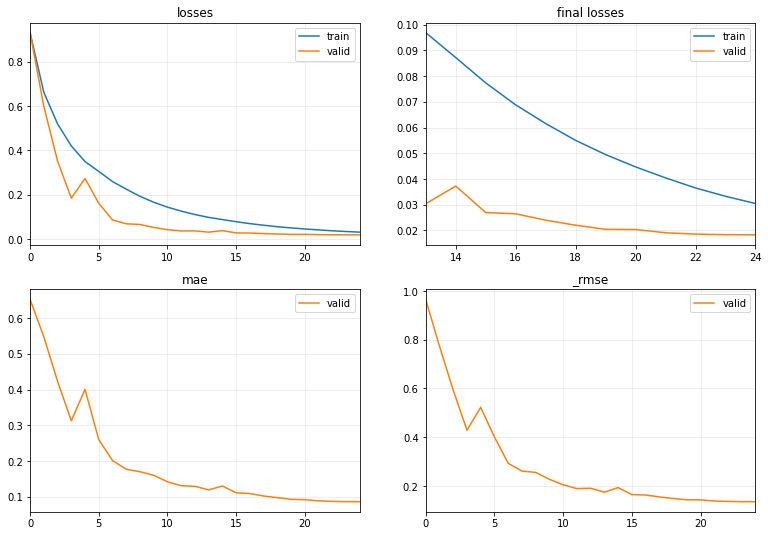

-IMF 19 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


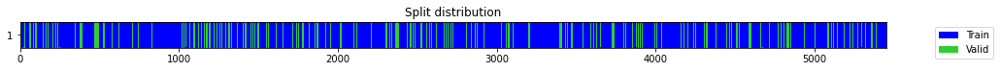

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.788475,0.977861,0.636484,0.988869,00:01
1,0.560877,0.559426,0.517793,0.747948,00:01
2,0.446976,0.295126,0.383286,0.543255,00:01
3,0.372746,0.300983,0.364159,0.548619,00:01
4,0.326115,0.286881,0.350486,0.535612,00:01
5,0.283849,0.139977,0.246253,0.374135,00:01
6,0.246862,0.114001,0.229434,0.337641,00:01
7,0.212041,0.067317,0.164420,0.259455,00:01
8,0.183480,0.079295,0.187654,0.281594,00:01
9,0.160185,0.048689,0.152364,0.220656,00:01


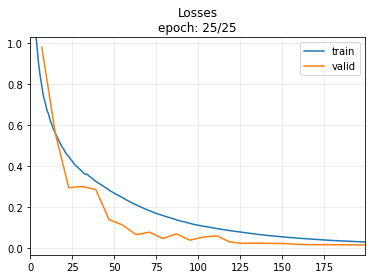

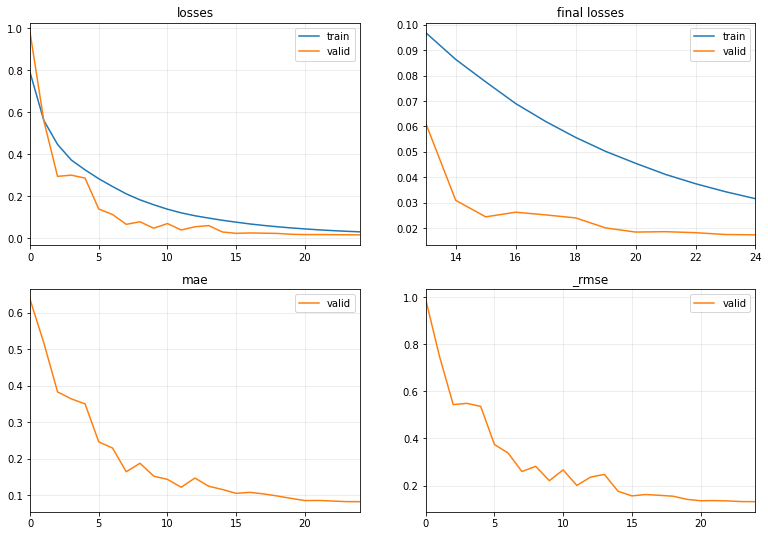

-IMF 20 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


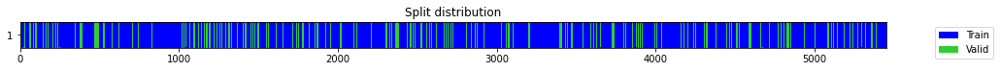

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.663416,0.855415,0.589082,0.924886,00:01
1,0.474808,0.437519,0.458110,0.661452,00:01
2,0.371640,0.275962,0.359044,0.525320,00:01
3,0.309770,0.235889,0.294847,0.485684,00:01
4,0.271170,0.337717,0.410455,0.581134,00:01
5,0.238615,0.173834,0.236262,0.416934,00:01
6,0.204214,0.136567,0.219630,0.369550,00:01
7,0.181689,0.107968,0.223827,0.328585,00:01
8,0.159256,0.058484,0.150999,0.241834,00:01
9,0.138297,0.056983,0.154563,0.238711,00:01


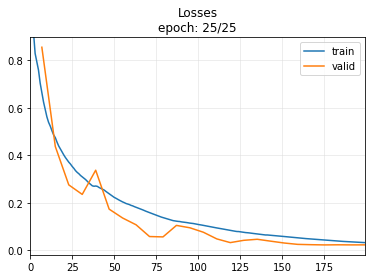

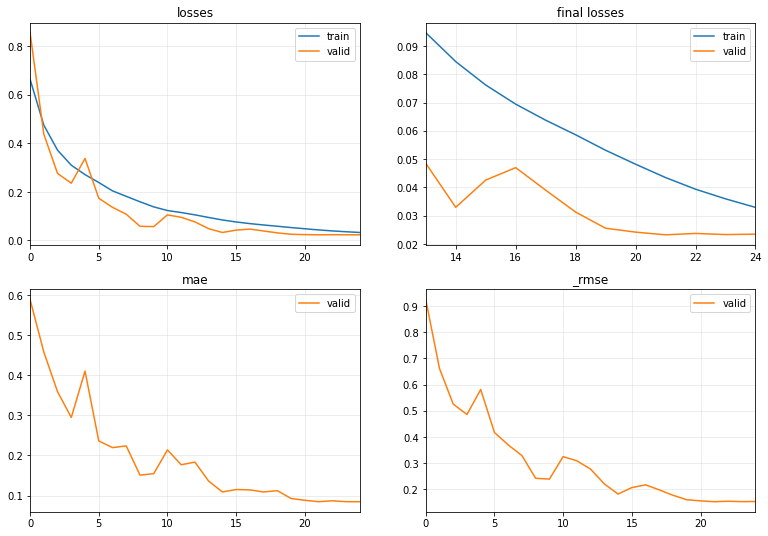

-IMF 21 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


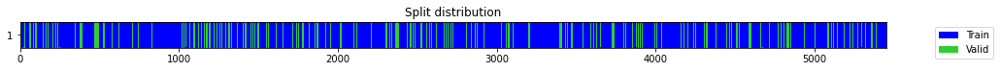

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.568244,0.946979,0.617120,0.973128,00:01
1,0.385761,0.445920,0.455679,0.667773,00:01
2,0.304834,0.325487,0.433283,0.570515,00:01
3,0.261897,0.377276,0.372703,0.614228,00:01
4,0.248052,0.277834,0.370168,0.527100,00:01
5,0.220089,0.128311,0.234673,0.358205,00:01
6,0.191189,0.140396,0.252630,0.374695,00:01
7,0.172114,0.130578,0.244395,0.361356,00:01
8,0.156891,0.060518,0.179379,0.246004,00:01
9,0.137794,0.060510,0.158465,0.245987,00:01


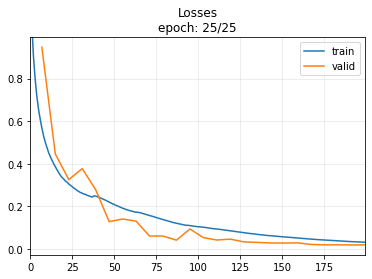

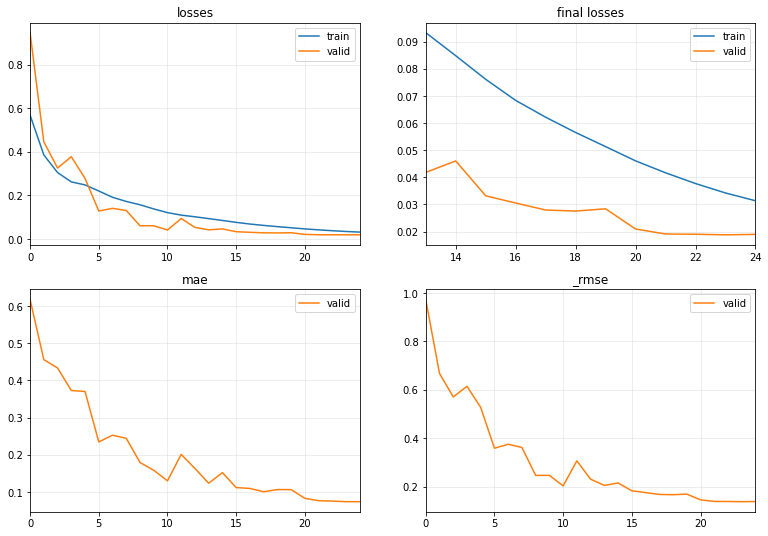

-IMF 22 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


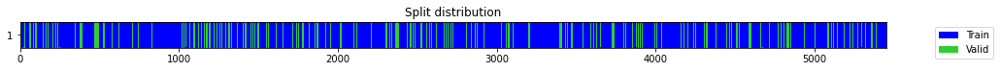

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.579063,0.858413,0.572298,0.926506,00:01
1,0.386962,0.322375,0.394012,0.567781,00:01
2,0.293288,0.169580,0.283577,0.411801,00:01
3,0.237544,0.239074,0.365100,0.488952,00:01
4,0.210134,0.428726,0.464925,0.654771,00:01
5,0.196191,0.099472,0.219112,0.315392,00:01
6,0.173942,0.071518,0.196078,0.267428,00:01
7,0.154664,0.044017,0.146970,0.209803,00:01
8,0.133299,0.031121,0.117936,0.176411,00:01
9,0.115925,0.029661,0.114975,0.172225,00:01


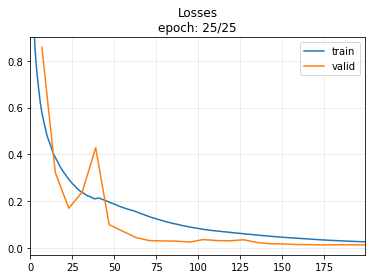

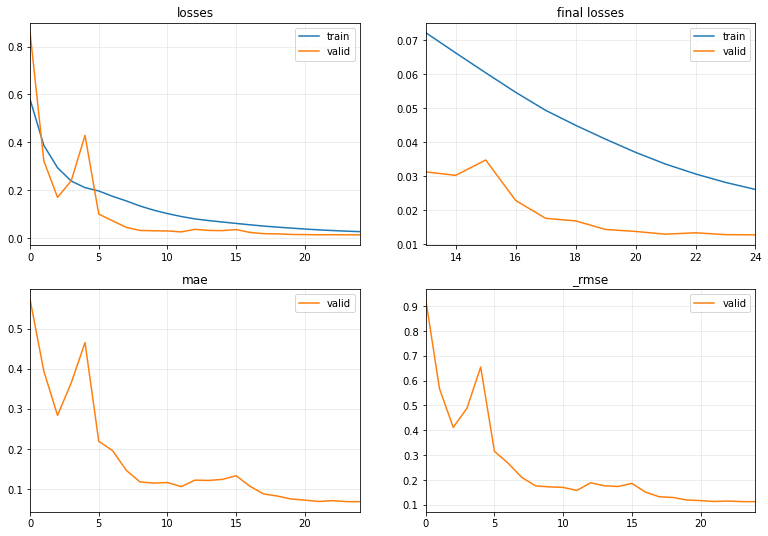

-IMF 23 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


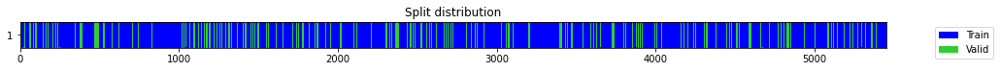

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.506513,0.720381,0.542590,0.848753,00:01
1,0.318047,0.215432,0.332984,0.464147,00:01
2,0.242080,0.124405,0.267460,0.352711,00:01
3,0.194808,0.241592,0.374350,0.491520,00:01
4,0.169585,0.265544,0.348324,0.515310,00:01
5,0.151132,0.063935,0.174468,0.252855,00:01
6,0.148217,0.131895,0.208266,0.363173,00:01
7,0.134348,0.054680,0.163323,0.233838,00:01
8,0.117239,0.031702,0.117758,0.178052,00:01
9,0.102160,0.024854,0.106788,0.157652,00:01


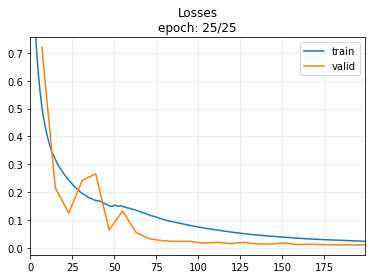

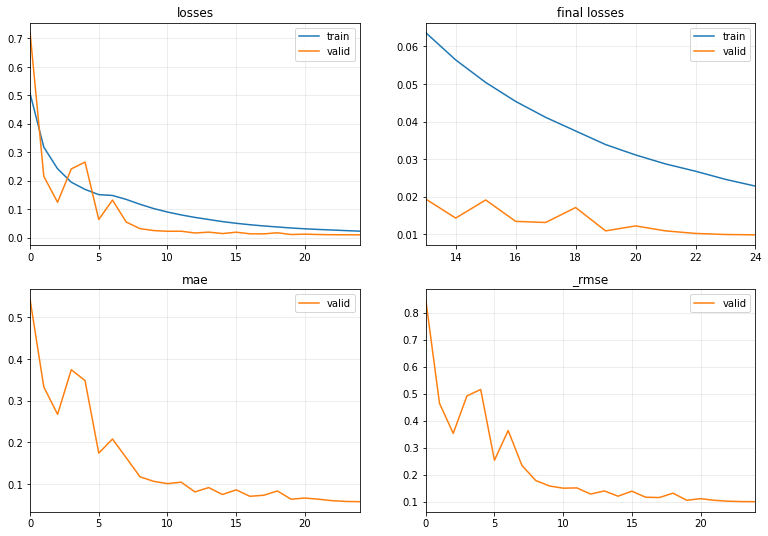

-IMF 24 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


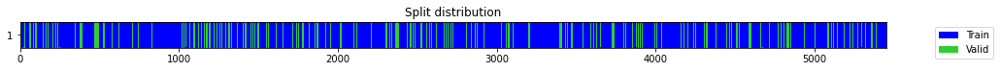

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.497536,0.761894,0.529489,0.872865,00:01
1,0.305526,0.223926,0.319115,0.473209,00:01
2,0.223791,0.190939,0.267526,0.436966,00:01
3,0.180937,0.124034,0.237717,0.352185,00:01
4,0.165630,0.235746,0.322194,0.485537,00:01
5,0.147508,0.085246,0.198088,0.291968,00:01
6,0.128487,0.038818,0.128027,0.197022,00:01
7,0.109618,0.030728,0.127198,0.175294,00:01
8,0.096071,0.021792,0.108826,0.147622,00:01
9,0.086906,0.032263,0.137021,0.179620,00:01


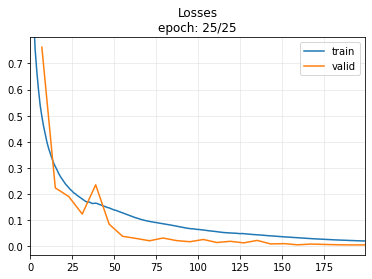

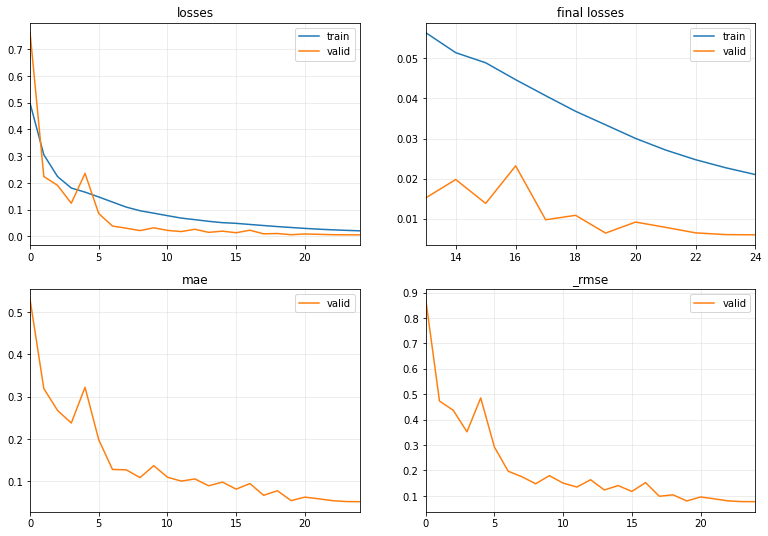

-IMF 25 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


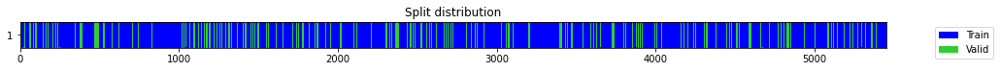

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.409722,0.707125,0.536897,0.840907,00:01
1,0.253543,0.261205,0.340383,0.511082,00:01
2,0.186223,0.098083,0.219121,0.313182,00:01
3,0.145609,0.091353,0.225379,0.302247,00:01
4,0.145341,0.123305,0.243972,0.351148,00:01
5,0.129839,0.114995,0.246152,0.339108,00:01
6,0.114836,0.088920,0.181691,0.298194,00:01
7,0.100556,0.046840,0.150189,0.216426,00:01
8,0.090792,0.024391,0.108169,0.156175,00:01
9,0.081279,0.027541,0.121563,0.165954,00:01


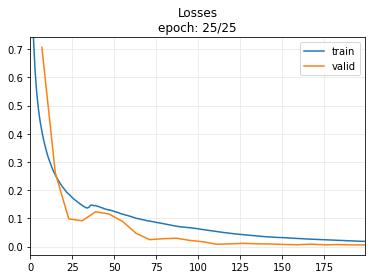

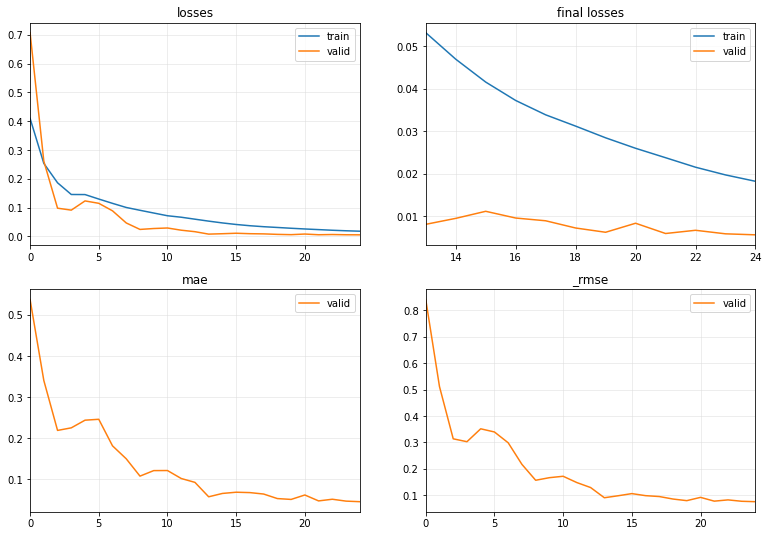

-IMF 26 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


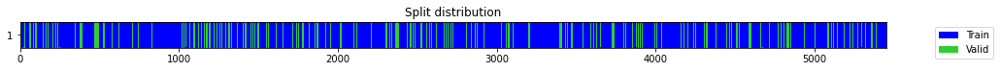

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.431459,0.738954,0.555193,0.859624,00:01
1,0.264683,0.311654,0.382830,0.558260,00:01
2,0.191517,0.115170,0.240430,0.339367,00:01
3,0.160007,0.137239,0.271237,0.370457,00:01
4,0.131732,0.060740,0.179748,0.246456,00:01
5,0.114000,0.134338,0.284961,0.366522,00:01
6,0.106956,0.037087,0.144791,0.192580,00:01
7,0.094567,0.032053,0.126725,0.179033,00:01
8,0.083933,0.017175,0.098191,0.131054,00:01
9,0.072980,0.015190,0.092024,0.123246,00:01


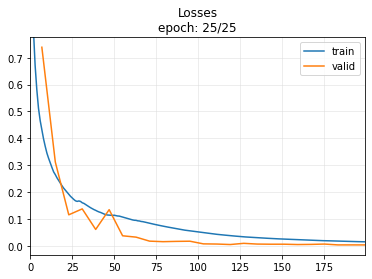

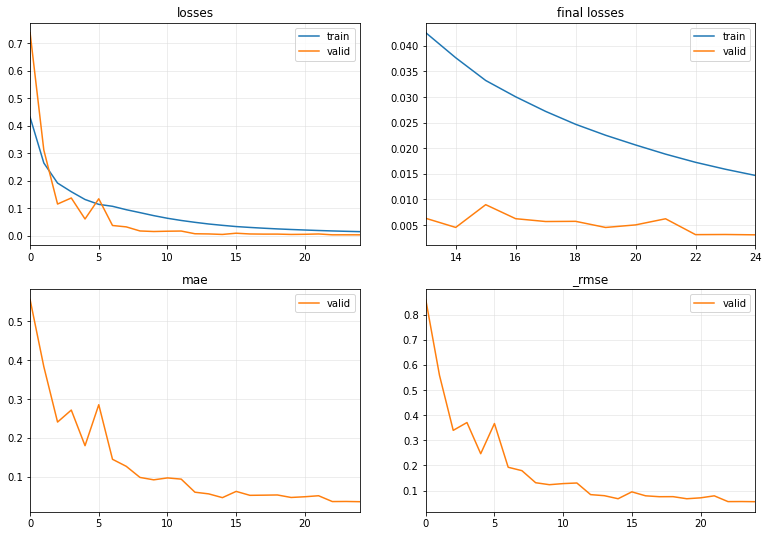

-IMF 27 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


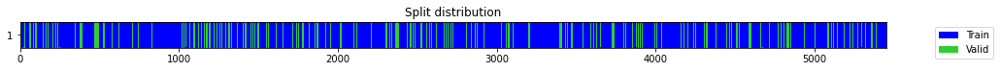

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.460871,0.649145,0.526964,0.805696,00:01
1,0.284584,0.251608,0.335363,0.501606,00:01
2,0.205592,0.140429,0.265893,0.374738,00:01
3,0.161089,0.140510,0.257681,0.374846,00:01
4,0.146900,0.083059,0.196446,0.288200,00:01
5,0.131721,0.050473,0.155901,0.224663,00:01
6,0.114817,0.057319,0.151137,0.239414,00:01
7,0.101005,0.033192,0.137065,0.182186,00:01
8,0.088285,0.035115,0.116383,0.187391,00:01
9,0.078350,0.045471,0.174003,0.213239,00:01


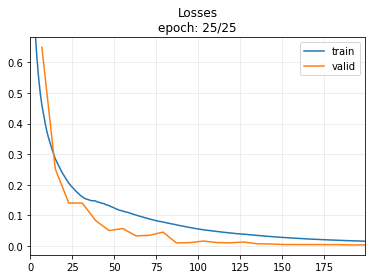

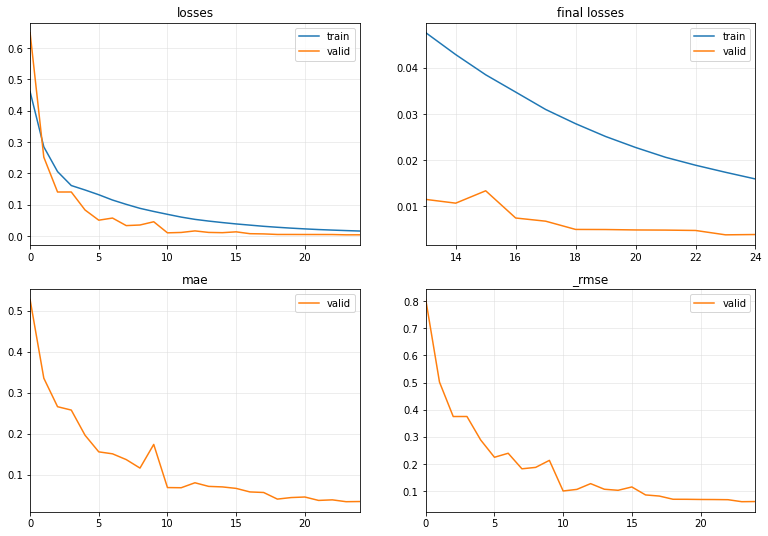

-IMF 28 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


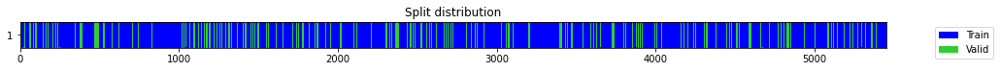

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.358250,0.716684,0.523284,0.846572,00:01
1,0.235724,0.263817,0.324486,0.513631,00:01
2,0.181736,0.211879,0.303084,0.460303,00:01
3,0.162172,0.108285,0.231002,0.329066,00:01
4,0.138063,0.225383,0.296428,0.474746,00:01
5,0.121484,0.103972,0.228651,0.322447,00:01
6,0.106929,0.080231,0.183797,0.283251,00:01
7,0.097364,0.074412,0.234641,0.272785,00:01
8,0.088653,0.024737,0.099955,0.157279,00:01
9,0.079860,0.037866,0.100106,0.194591,00:01


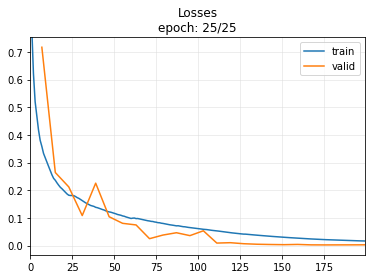

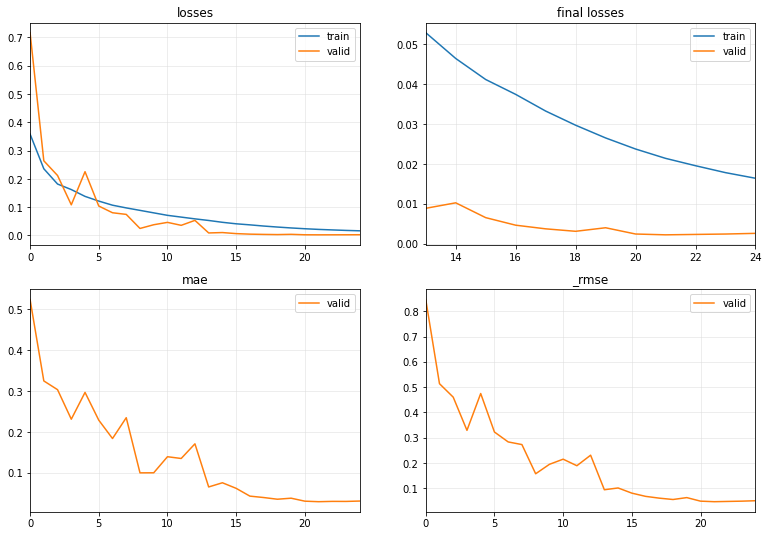

-IMF 29 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


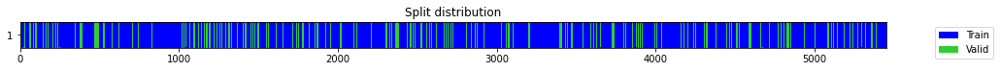

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.308900,0.553920,0.618806,0.744258,00:01
1,0.179733,0.173955,0.348744,0.417079,00:01
2,0.125919,0.146091,0.261219,0.382219,00:01
3,0.118187,0.359708,0.479575,0.599756,00:01
4,0.119043,0.072027,0.204966,0.268378,00:01
5,0.103765,0.040237,0.155515,0.200591,00:01
6,0.086093,0.019168,0.103772,0.138448,00:01
7,0.072802,0.007003,0.063101,0.083685,00:01
8,0.061005,0.006063,0.061522,0.077868,00:01
9,0.052141,0.008829,0.077497,0.093963,00:01


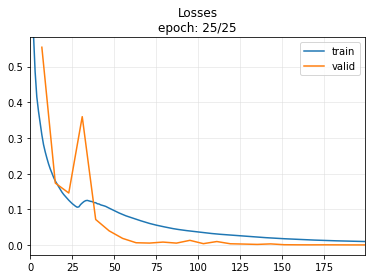

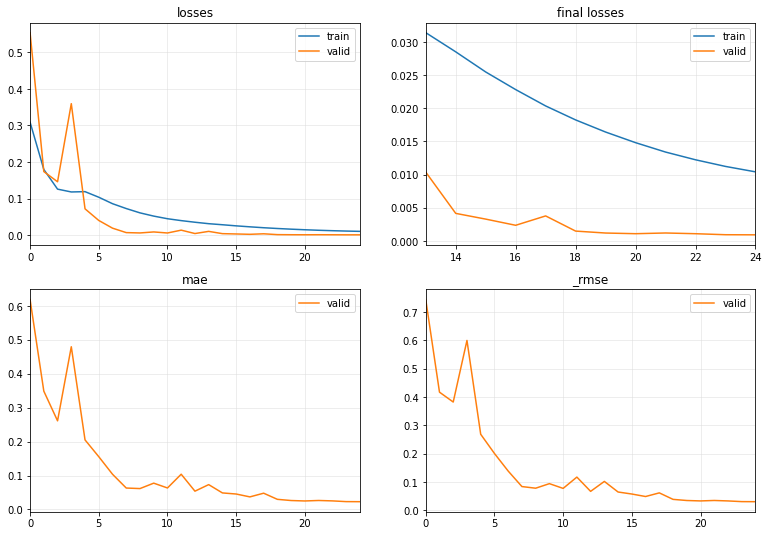

-IMF 30 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


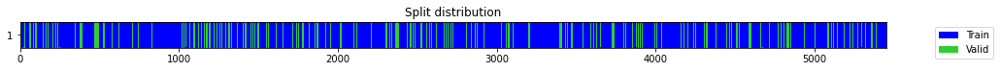

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.365812,0.552222,0.596445,0.743116,00:01
1,0.211682,0.121805,0.273277,0.349006,00:01
2,0.152727,0.111467,0.251405,0.333866,00:01
3,0.124504,0.165716,0.318054,0.407082,00:01
4,0.117591,0.079958,0.227624,0.282768,00:01
5,0.098700,0.022117,0.119612,0.148719,00:01
6,0.085634,0.028912,0.129625,0.170036,00:01
7,0.078623,0.028078,0.144379,0.167564,00:01
8,0.072029,0.037206,0.156233,0.192888,00:01
9,0.064404,0.013530,0.098871,0.116318,00:01


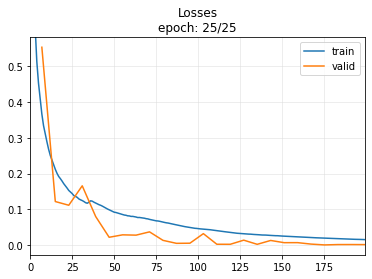

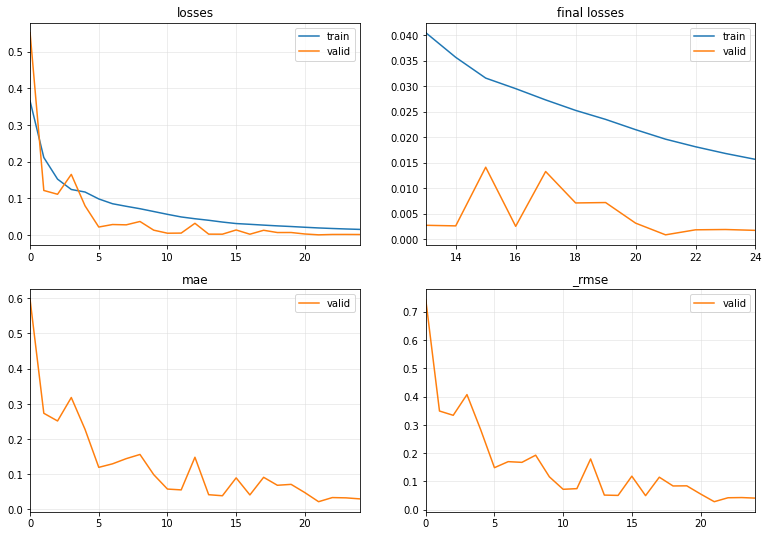

-IMF 31 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


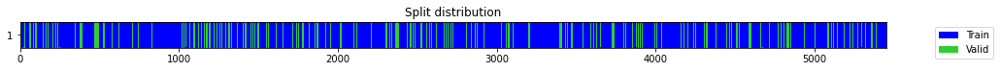

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.145135,1.058409,0.740928,1.028790,00:01
1,0.968952,0.924404,0.687580,0.961459,00:01
2,0.870412,1.042927,0.734672,1.021238,00:01
3,0.820653,0.990700,0.708085,0.995339,00:01
4,0.774990,0.937096,0.691501,0.968037,00:01
5,0.746983,0.977732,0.712062,0.988804,00:01
6,0.709911,0.937870,0.682962,0.968437,00:01
7,0.666515,0.870631,0.659206,0.933076,00:01
8,0.621570,0.890497,0.662481,0.943662,00:01
9,0.575651,0.866752,0.654177,0.930995,00:01


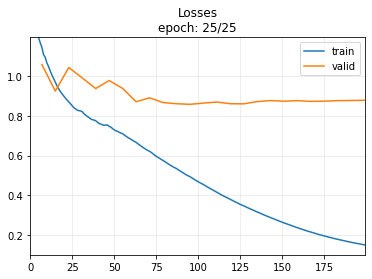

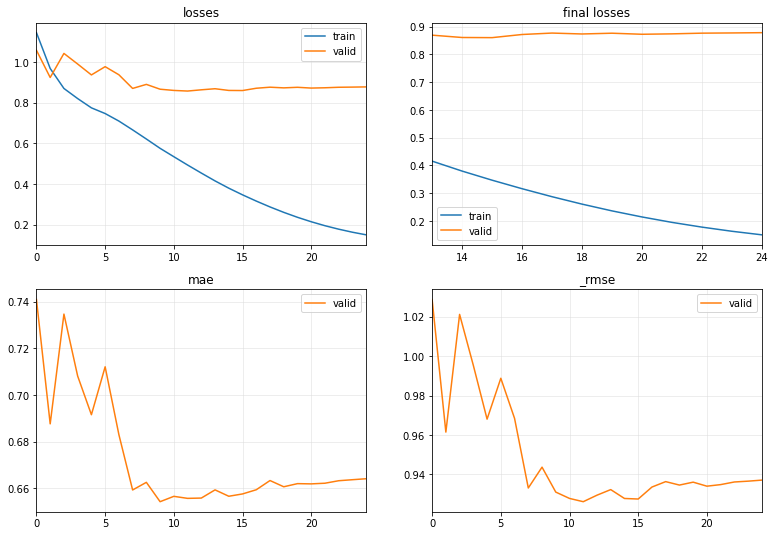

Targets and Predictions shapes (1363,) (1363,)
InceptionTimePlus : MAPE =  0.9595393422307306 MAE =  0.01333025452384763 RMSE =  0.016492509382448384


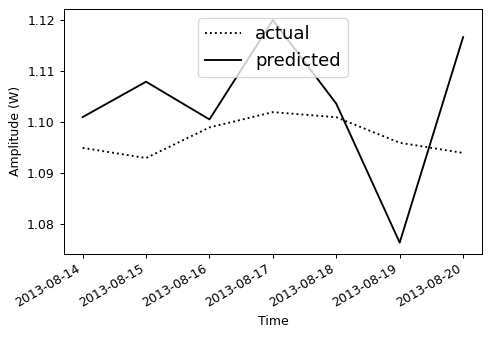

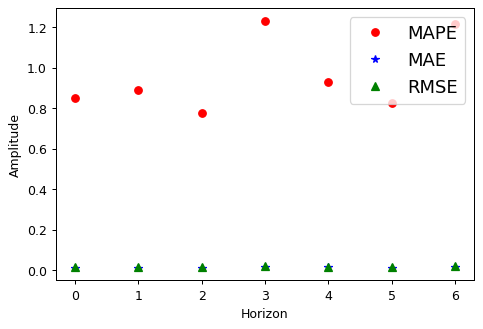

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Thick_data = to3d(VMD_Thick.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with EMD - Thickness + time info.

In [ ]:
exec('bottleneck = True')
exec('coord = True')
exec('separable = True')
exec('zero_norm = True')
exec('nf = 56')
exec('ks = 80')
exec('conv_dropout = 0.0546061672197213')
exec('fc_dropout = 0.189623211755169')
exec('learning_rate = 0.00115104331889339')

par = {'bottleneck':bottleneck,'coord':coord,'separable':separable,'zero_norm':zero_norm,'nf':nf,'ks':ks,'conv_dropout':conv_dropout,'fc_dropout':fc_dropout}

In [ ]:
ind = 'EMD4IMFs';
mode = 'ThickTime_'

Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + season + '.csv',header=None)
VMD_Thick = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Thicksequences_' + ind + '_' + season + '.csv')
VMD_Thick = VMD_Thick.drop(columns='Element0')
Thick

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,2.223,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,...,2.394,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444
1,2.234,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,...,2.401,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452
2,2.244,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,...,2.402,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458
3,2.256,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,...,2.407,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461
4,2.263,2.271,2.277,2.279,2.282,2.291,2.295,2.302,2.305,2.308,...,2.413,2.422,2.424,2.432,2.440,2.444,2.452,2.458,2.461,2.465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,1.791,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,...,1.635,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553
6812,1.788,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,...,1.633,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536
6813,1.789,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,...,1.622,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513
6814,1.785,1.781,1.776,1.769,1.762,1.759,1.754,1.746,1.739,1.730,...,1.612,1.605,1.601,1.593,1.582,1.568,1.553,1.536,1.513,1.501


In [ ]:
split_indx = 30

print('Processing Thick and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}

Processing Thick and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


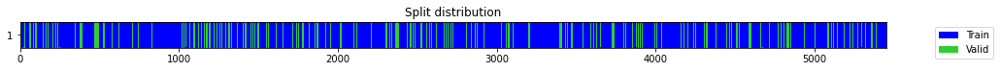

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.087580,1.083408,0.570681,1.040869,00:01
1,0.987458,0.992916,0.573654,0.996452,00:01
2,0.913095,0.860428,0.566299,0.927592,00:01
3,0.861352,0.860223,0.591255,0.927482,00:01
4,0.819276,0.816393,0.576584,0.903545,00:01
5,0.801790,0.969780,0.626300,0.984774,00:01
6,0.792168,0.768972,0.573296,0.876910,00:01
7,0.767723,0.832570,0.597402,0.912453,00:01
8,0.745578,0.783345,0.577085,0.885068,00:01
9,0.720124,0.752297,0.573986,0.867350,00:01


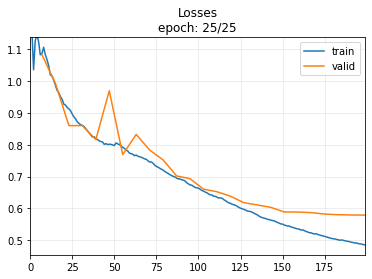

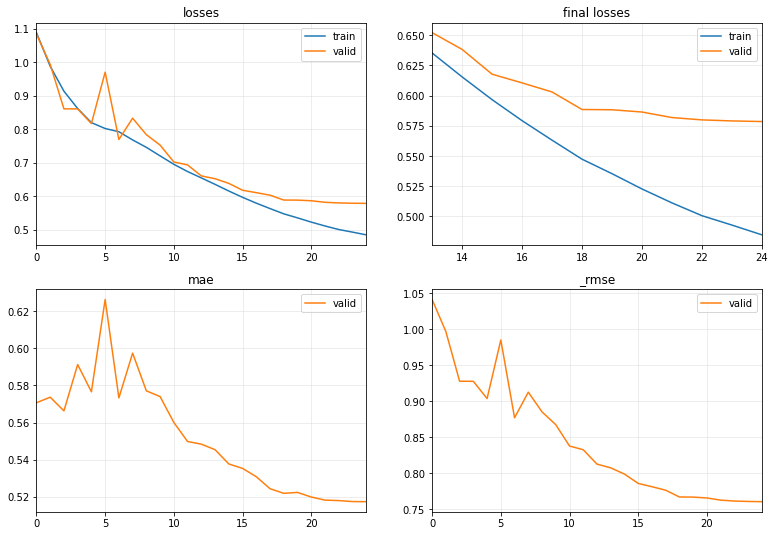

-IMF 1 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


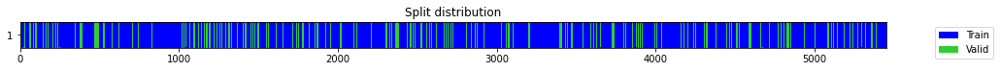

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.084990,1.074226,0.665367,1.036449,00:01
1,0.957528,0.876995,0.631994,0.936480,00:01
2,0.883930,0.753836,0.597360,0.868237,00:01
3,0.805962,0.692682,0.572253,0.832275,00:01
4,0.745341,0.653564,0.558125,0.808433,00:01
5,0.701259,0.642965,0.545401,0.801851,00:01
6,0.664132,0.653823,0.548390,0.808593,00:01
7,0.633583,0.684295,0.543952,0.827222,00:01
8,0.604543,0.577030,0.507044,0.759625,00:01
9,0.578008,0.599088,0.498018,0.774008,00:01


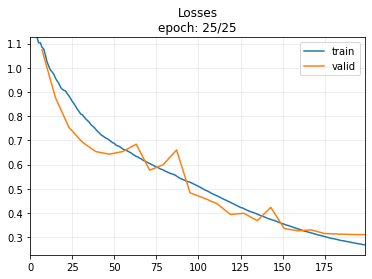

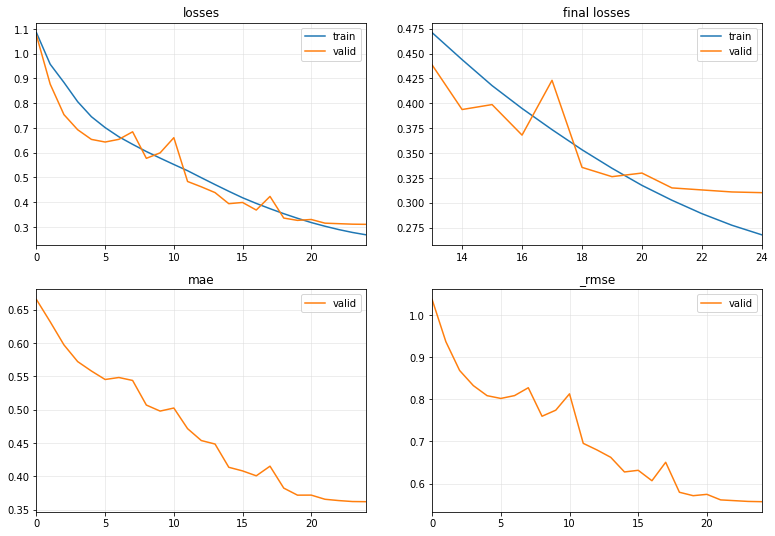

-IMF 2 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


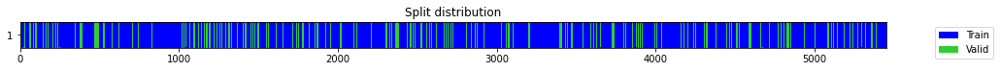

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.897902,0.751035,0.549947,0.866623,00:01
1,0.706262,0.464105,0.374736,0.681253,00:01
2,0.636865,0.416839,0.390676,0.645631,00:01
3,0.557103,0.330384,0.335927,0.574790,00:01
4,0.496738,0.308811,0.335507,0.555708,00:01
5,0.449483,0.284338,0.319933,0.533234,00:01
6,0.409778,0.258045,0.291960,0.507981,00:01
7,0.377397,0.270489,0.326075,0.520086,00:01
8,0.352816,0.225258,0.263729,0.474614,00:01
9,0.329545,0.213262,0.247203,0.461803,00:01


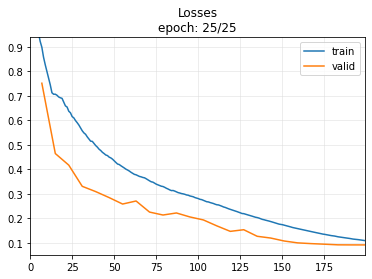

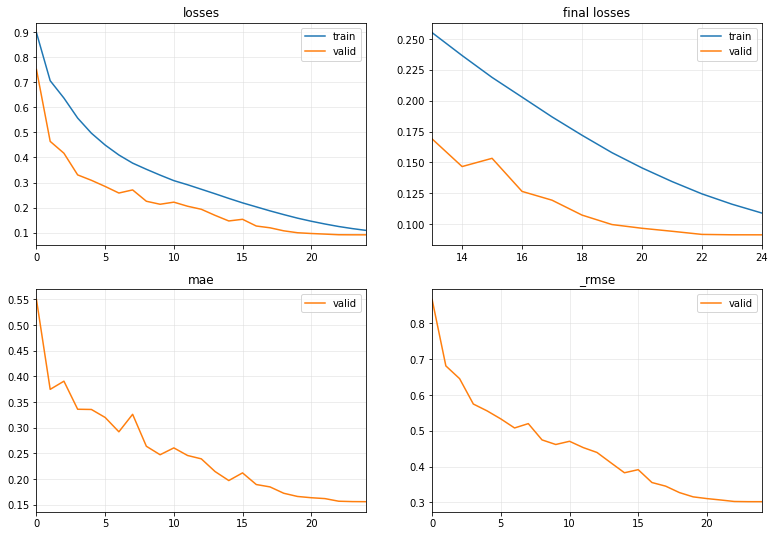

-IMF 3 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


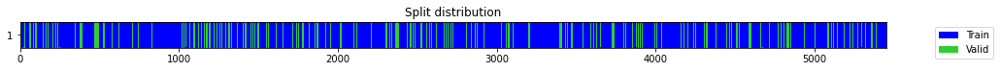

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.750618,0.395353,0.244786,0.628771,00:01
1,0.510879,0.131132,0.168490,0.362122,00:01
2,0.451841,0.182476,0.196415,0.427172,00:01
3,0.376482,0.124334,0.208088,0.352611,00:01
4,0.322235,0.155522,0.226012,0.394363,00:01
5,0.283620,0.084138,0.156062,0.290065,00:01
6,0.241100,0.081292,0.150447,0.285118,00:01
7,0.211926,0.082147,0.143100,0.286613,00:01
8,0.194962,0.105886,0.174661,0.325402,00:01
9,0.174459,0.079244,0.137348,0.281503,00:01


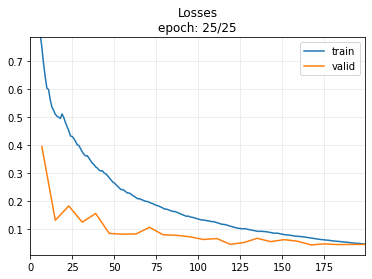

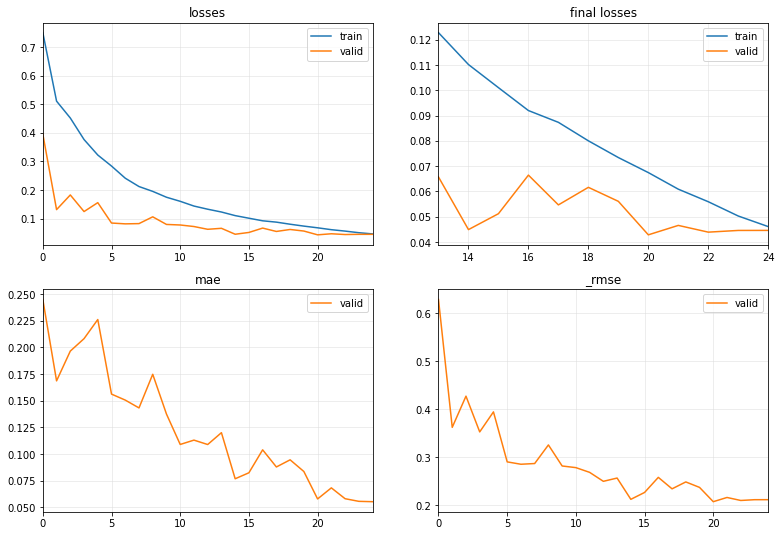

-IMF 4 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


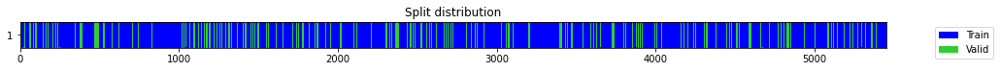

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.570056,0.290795,0.430151,0.539254,00:01
1,0.423366,0.102989,0.251089,0.320920,00:01
2,0.330237,0.217693,0.363286,0.466576,00:01
3,0.262898,0.058405,0.186534,0.241672,00:01
4,0.208556,0.032487,0.137502,0.180240,00:01
5,0.164729,0.017184,0.102009,0.131089,00:01
6,0.136325,0.012814,0.088711,0.113200,00:01
7,0.117271,0.013204,0.088226,0.114909,00:01
8,0.100909,0.020070,0.106502,0.141670,00:01
9,0.087826,0.015359,0.101251,0.123931,00:01


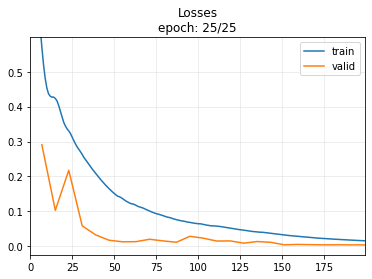

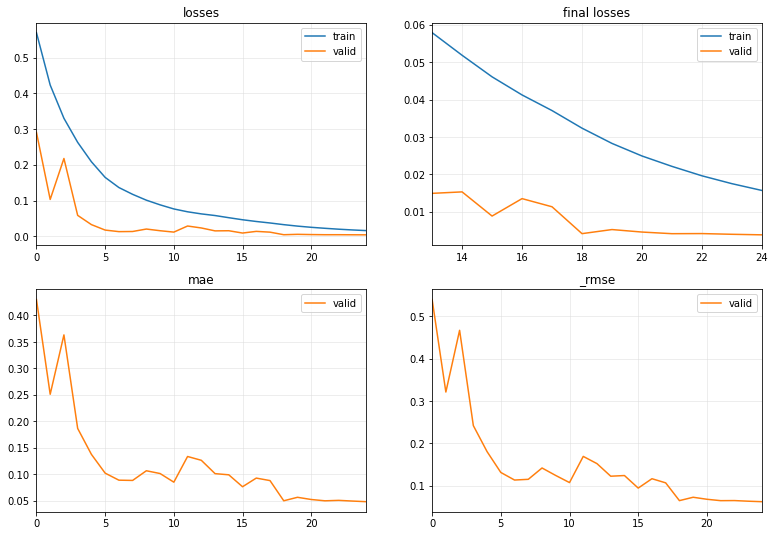

Targets and Predictions shapes (1363,) (1363,)
InceptionTimePlus : MAPE =  2.5040680947662577 MAE =  0.0347819310526249 RMSE =  0.04858580637692441


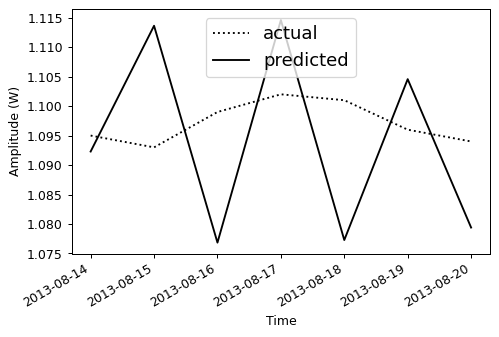

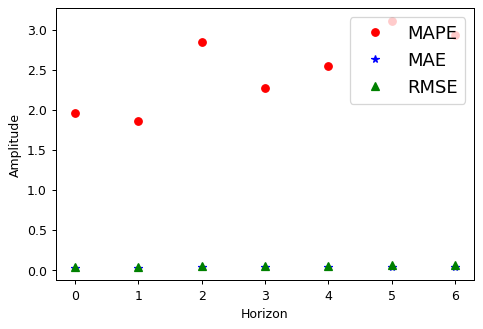

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Thick_data = to3d(VMD_Thick.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Thick_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_THICKF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


# Volume forecasting next week

## season1

In [ ]:
season = season1

### no VMD - Volume + time info.

In [ ]:
ind = ''
mode = 'VolTime_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,26.405,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,...,28.828,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594
1,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,...,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671
2,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,...,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744
3,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,...,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822
4,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,27.552,...,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822,29.911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,20.223,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,...,21.798,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348
5932,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,...,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398
5933,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,...,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441
5934,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,21.117,...,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441,22.489


#### Hyperparameter tuning

Processing Volume data..
splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


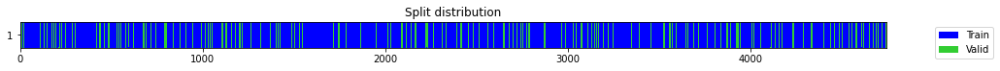

In [ ]:
split_indx = 30

print('Processing Volume data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Vol_data = to3d(Vol.iloc[:,:].values)
# Temp_data = to3d(Temp.iloc[:,:].values)
data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1)  #, TS_Mend, TS_Mstart
data_X = data[:,:,:split_indx]
data_y = data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

In [ ]:
import optuna
from optuna.integration import FastAIPruningCallback

def objective(trial:optuna.Trial):
    
    # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
    # nf = trial.suggest_categorical('num_filters', [32, 64, 96]) # search through all categorical values in the provided list
    n_layers = trial.suggest_int('n_layers', 3, 8, step=1) 
    bias = trial.suggest_categorical('bias', [True,False]) 
    rnn_dropout = trial.suggest_float("rnn_dropout",0, 0.5) 
    bidirectional = trial.suggest_categorical('bidirectional', [True,False])
    fc_dropout = trial.suggest_float('fc_dropout', 0,0.5) 
    bn = trial.suggest_categorical('bn', [True,False])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True) 

    learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512,
                         arch=model_name, arch_config={'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn},
                         metrics=rmse)# , cbs=FastAIPruningCallback(trial))

    with ContextManagers([learn.no_logging(), learn.no_bar()]): # [Optional] this prevents fastai from printing anything during training
        learn.fit_one_cycle(5, lr_max=learning_rate)

    # Return the objective value
    return learn.recorder.values[-1][1] # return the validation loss value of the last epoch 

study = optuna.create_study(direction='minimize')
print(f"Sampler is {study.sampler.__class__.__name__}")

study.optimize(objective, n_trials=100)

print("**Study statistics: ")
print("  Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("{}".format(value))

[I 2022-07-23 23:28:15,840] A new study created in memory with name: no-name-f849890e-f908-4831-990e-9ae0897fae9b


Sampler is TPESampler


[I 2022-07-23 23:28:18,557] Trial 0 finished with value: 0.9683747887611389 and parameters: {'n_layers': 5, 'bias': False, 'rnn_dropout': 0.2882206264609011, 'bidirectional': False, 'fc_dropout': 0.27386194488684973, 'bn': True, 'learning_rate': 0.0002083655180008532}. Best is trial 0 with value: 0.9683747887611389.
[I 2022-07-23 23:28:21,868] Trial 1 finished with value: 0.21064700186252594 and parameters: {'n_layers': 7, 'bias': False, 'rnn_dropout': 0.4770428525200795, 'bidirectional': False, 'fc_dropout': 0.4930985759287635, 'bn': True, 'learning_rate': 0.0019923331147318193}. Best is trial 1 with value: 0.21064700186252594.
[I 2022-07-23 23:28:27,133] Trial 2 finished with value: 0.021572478115558624 and parameters: {'n_layers': 8, 'bias': False, 'rnn_dropout': 0.15943772786967486, 'bidirectional': True, 'fc_dropout': 0.20306211919412787, 'bn': True, 'learning_rate': 0.0011215649497301617}. Best is trial 2 with value: 0.021572478115558624.
[I 2022-07-23 23:28:30,014] Trial 3 finis

**Study statistics: 
  Number of finished trials:  100
Best trial:
  Value:  0.002877806546166539
  Params: 
5
True
0.07098537457229065
True
0.18365504336685134
True
0.0024945115102649983


#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.870943,0.537246,0.596211,0.732970,00:00
1,0.566696,0.127594,0.299369,0.357203,00:00
2,0.397089,0.072704,0.215154,0.269636,00:00
3,0.295646,0.051328,0.176169,0.226556,00:00
4,0.225727,0.008002,0.065877,0.089456,00:00
5,0.176140,0.005064,0.053650,0.071159,00:00
6,0.140152,0.003334,0.046216,0.057743,00:00
7,0.113409,0.002543,0.041319,0.050425,00:00
8,0.093001,0.001621,0.031478,0.040266,00:00
9,0.077079,0.001308,0.027013,0.036161,00:00


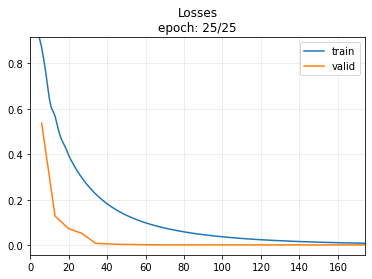

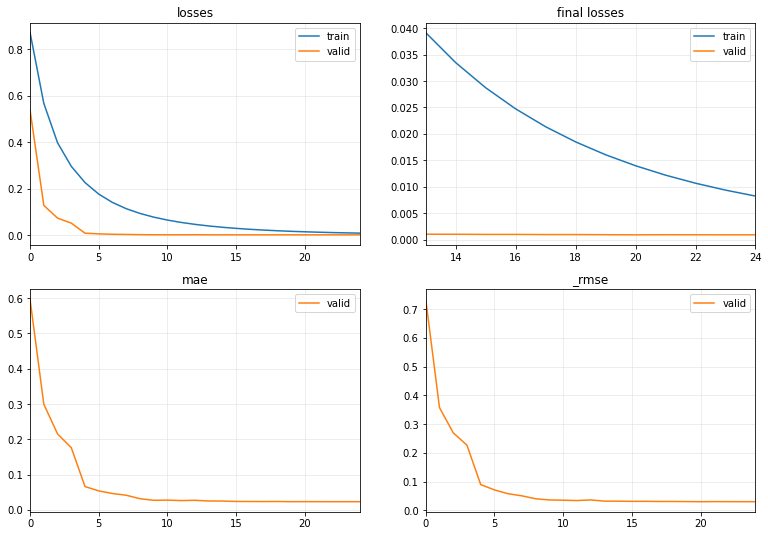

Targets and Predictions shapes (1187, 7) (1187, 7)
LSTMPlus : MAPE =  1.4971171679837272 MAE =  0.20482587897704185 RMSE =  0.2570086611559207


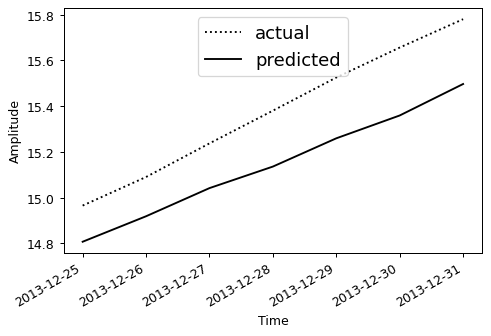

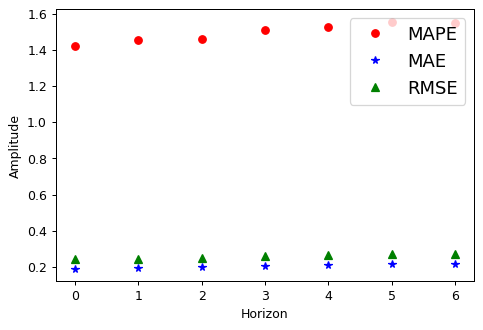

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### no VMD - Time info. only

In [ ]:
ind = ''
mode = 'Time_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,26.405,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,...,28.828,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594
1,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,...,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671
2,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,...,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744
3,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,...,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822
4,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,27.552,...,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822,29.911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,20.223,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,...,21.798,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348
5932,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,...,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398
5933,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,...,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441
5934,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,21.117,...,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441,22.489


Processing Volume data..
splitting data..
Standardizing data..
training set:  (4749, 3, 30) (4749, 7) , testing set:  (1187, 3, 30) (1187, 7)


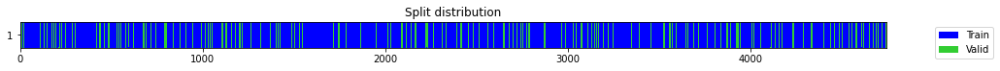

In [ ]:
split_indx = 30

print('Processing Volume data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Vol_data = to3d(Vol.iloc[:,:].values)
data = np.concatenate([TS_D, TS_Y, TS_M],axis=1) 
data_X = data[:,:,:split_indx]
data_y = Vol_data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.879069,0.647371,0.659043,0.804594,00:00
1,0.672765,0.330979,0.478655,0.575308,00:00
2,0.539060,0.265679,0.437530,0.515441,00:00
3,0.444890,0.140415,0.292631,0.374720,00:00
4,0.366505,0.085946,0.226640,0.293166,00:00
5,0.296386,0.047337,0.167551,0.217570,00:00
6,0.242680,0.029615,0.132064,0.172091,00:00
7,0.201523,0.037106,0.152926,0.192630,00:00
8,0.170405,0.035727,0.145396,0.189016,00:00
9,0.146021,0.028342,0.125775,0.168350,00:00


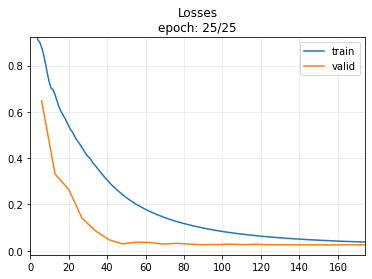

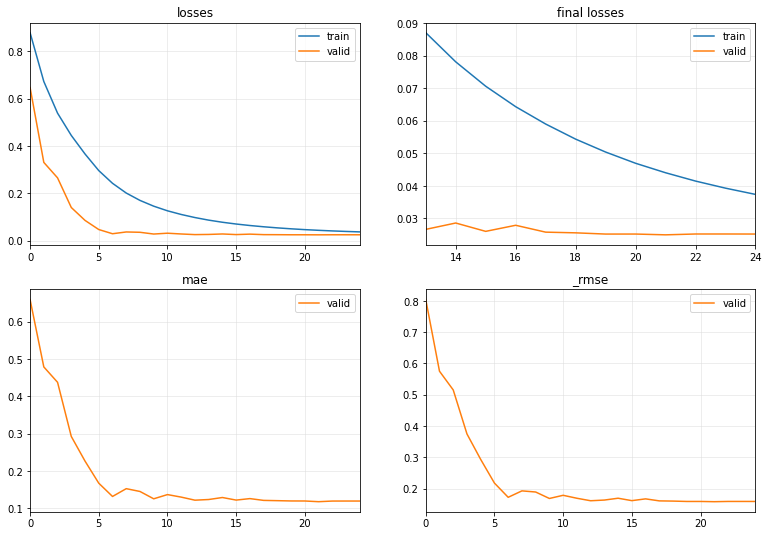

Targets and Predictions shapes (1187, 7) (1187, 7)
LSTMPlus : MAPE =  13.284662312502055 MAE =  1.965530413224087 RMSE =  2.2220327433489238


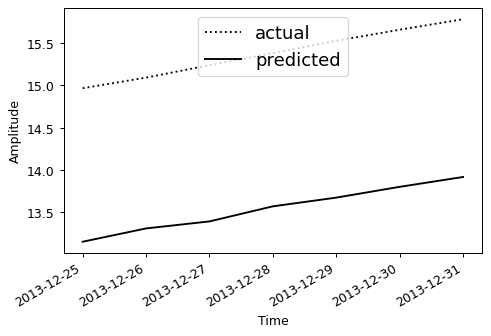

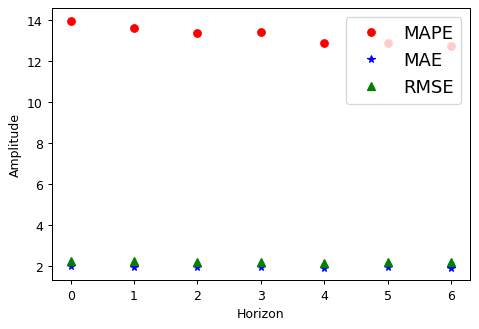

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with VMD - Volume + time info.

In [ ]:
ind = '31IMFs';
mode = 'VolTime_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
VMD_Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + ind + '_' + season + '.csv')
VMD_Vol = VMD_Vol.drop(columns='Element0')
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,26.405,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,...,28.828,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594
1,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,...,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671
2,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,...,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744
3,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,...,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822
4,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,27.552,...,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822,29.911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,20.223,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,...,21.798,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348
5932,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,...,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398
5933,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,...,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441
5934,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,21.117,...,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441,22.489


In [ ]:
split_indx = 30

print('Processing Vol and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Vol and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


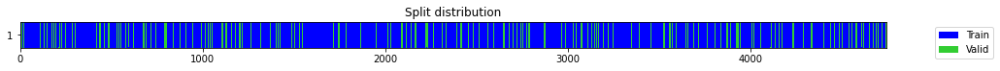

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.008026,1.012369,0.688574,1.006166,00:00
1,1.002564,1.011894,0.686800,1.005930,00:00
2,0.989347,0.994349,0.682173,0.997170,00:00
3,0.973013,0.903454,0.628029,0.950502,00:00
4,0.991175,1.007829,0.695135,1.003907,00:00
5,0.976722,0.877730,0.631325,0.936872,00:00
6,0.943551,0.984420,0.698512,0.992179,00:00
7,0.924951,0.860646,0.590432,0.927710,00:00
8,0.896300,0.812239,0.592333,0.901243,00:00
9,0.862763,0.727710,0.514032,0.853059,00:00


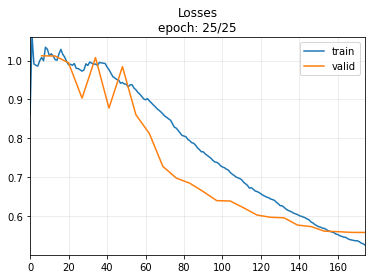

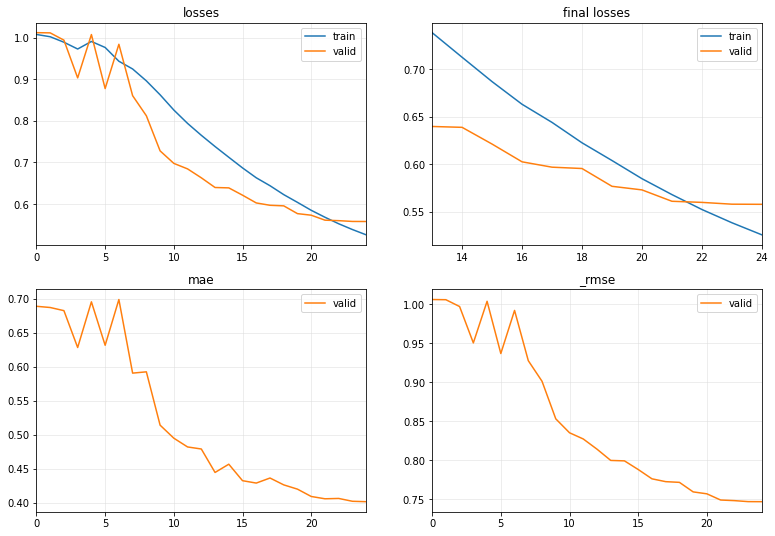

-IMF 1 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


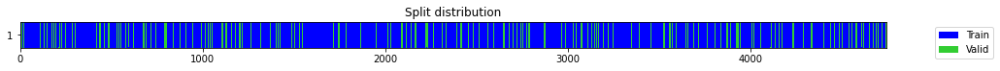

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.957340,1.141752,0.758604,1.068528,00:00
1,0.964682,1.142581,0.759132,1.068916,00:00
2,0.963324,1.120117,0.755119,1.058356,00:00
3,0.959044,1.095313,0.745404,1.046572,00:00
4,0.974119,1.124590,0.761563,1.060467,00:00
5,0.962537,1.035355,0.729770,1.017524,00:00
6,0.955967,1.022575,0.724262,1.011225,00:00
7,0.960216,1.086513,0.763647,1.042359,00:00
8,0.946077,0.966264,0.704790,0.982987,00:00
9,0.922817,0.946053,0.687971,0.972652,00:00


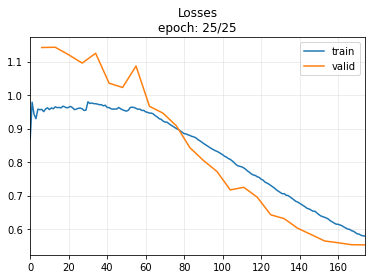

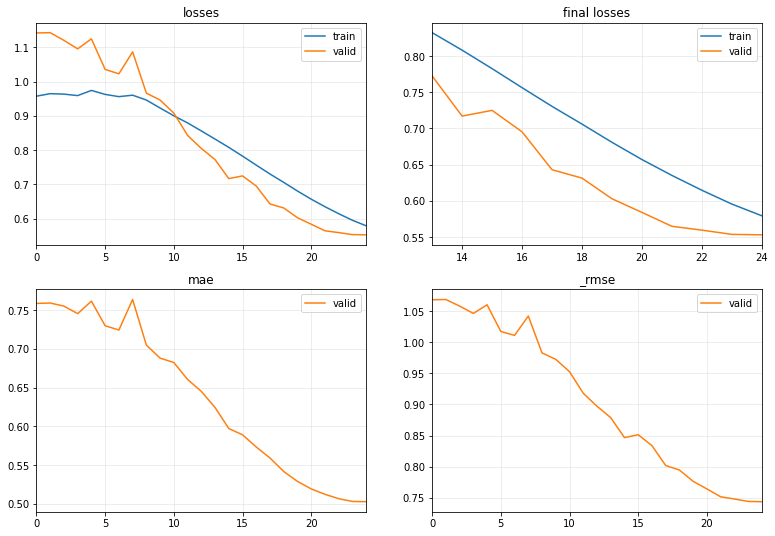

-IMF 2 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


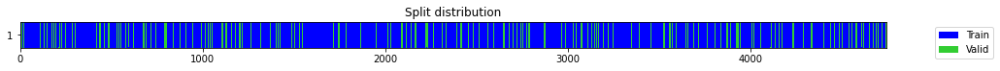

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.972689,1.113979,0.746655,1.055452,00:00
1,0.966659,1.104570,0.744623,1.050985,00:00
2,0.964124,1.006573,0.726372,1.003281,00:00
3,0.950481,1.067207,0.736704,1.033057,00:00
4,0.940113,1.006931,0.729679,1.003460,00:00
5,0.912076,0.893557,0.690945,0.945281,00:00
6,0.879155,0.788585,0.653150,0.888023,00:00
7,0.841450,0.718792,0.625643,0.847816,00:00
8,0.806821,0.738722,0.615488,0.859489,00:00
9,0.772518,0.677212,0.601646,0.822929,00:00


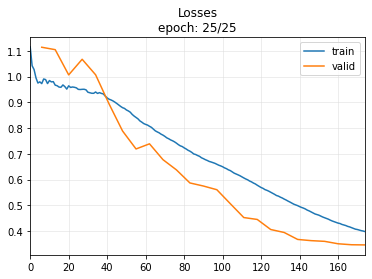

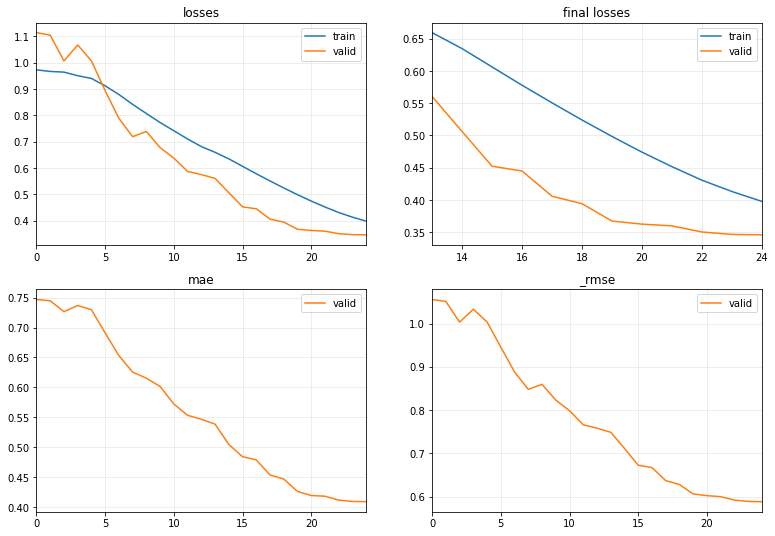

-IMF 3 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


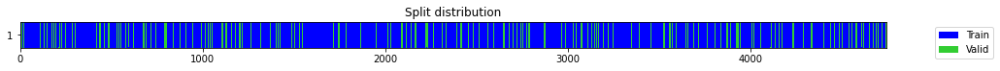

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.960830,1.139614,0.746397,1.067527,00:00
1,0.963030,1.125242,0.743192,1.060774,00:00
2,0.944454,1.197067,0.808799,1.094106,00:00
3,0.929587,0.989069,0.709621,0.994520,00:00
4,0.891662,0.954230,0.692190,0.976847,00:00
5,0.851153,0.808150,0.648733,0.898972,00:00
6,0.808448,0.760293,0.629958,0.871948,00:00
7,0.773503,0.691489,0.612988,0.831558,00:00
8,0.736613,0.670321,0.579546,0.818731,00:00
9,0.704445,0.599407,0.562464,0.774214,00:00


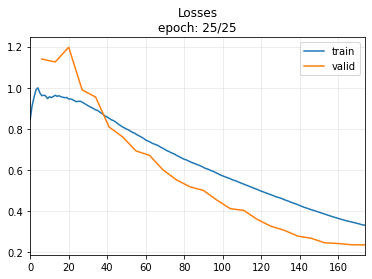

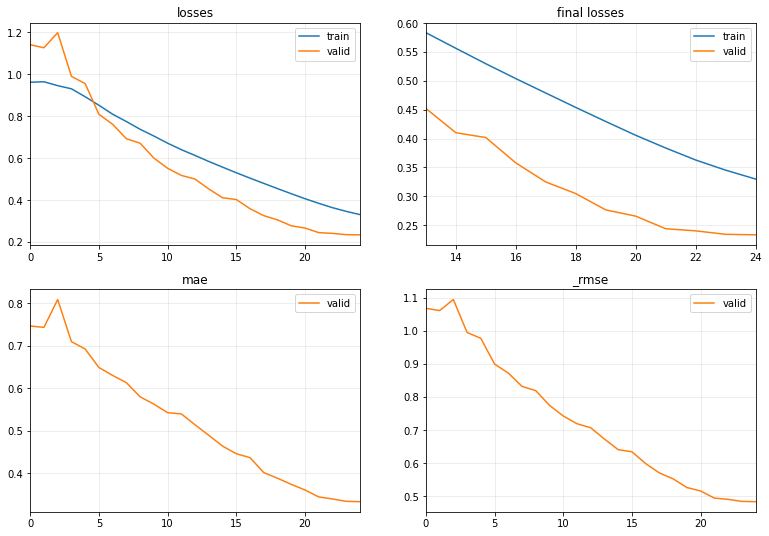

-IMF 4 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


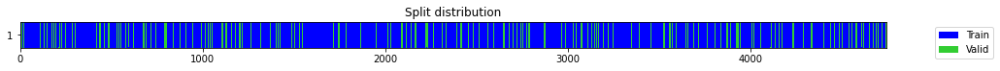

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.950656,1.164037,0.746073,1.078905,00:00
1,0.931150,1.087939,0.732849,1.043043,00:00
2,0.904165,0.899870,0.698261,0.948615,00:00
3,0.872334,0.830194,0.677719,0.911150,00:00
4,0.832815,0.802912,0.666000,0.896053,00:00
5,0.790175,0.696752,0.620475,0.834716,00:00
6,0.746874,0.638280,0.598615,0.798925,00:00
7,0.721379,0.718005,0.629695,0.847352,00:00
8,0.695500,0.634234,0.592727,0.796388,00:00
9,0.664881,0.550905,0.551000,0.742230,00:00


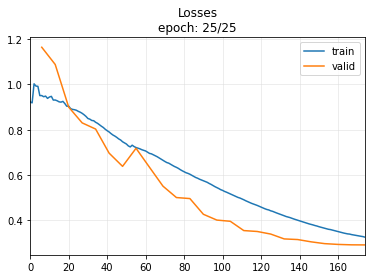

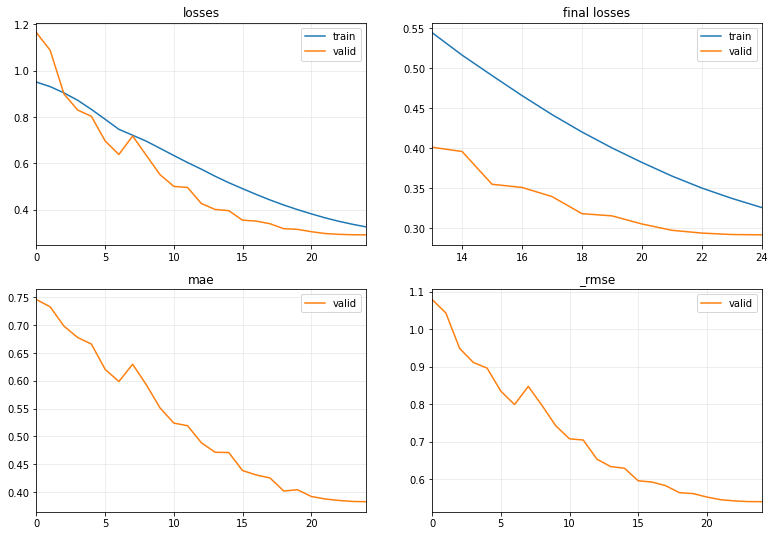

-IMF 5 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


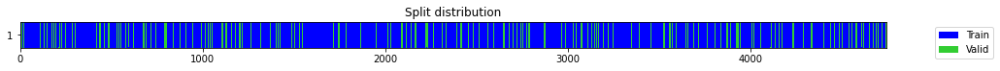

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.965100,1.058892,0.714133,1.029025,00:00
1,0.959694,0.966907,0.700672,0.983315,00:00
2,0.919767,0.907343,0.707589,0.952545,00:00
3,0.890346,0.767918,0.652746,0.876309,00:00
4,0.870430,0.761751,0.638717,0.872784,00:00
5,0.832836,0.618297,0.574213,0.786319,00:00
6,0.784354,0.556407,0.564185,0.745927,00:00
7,0.736519,0.504904,0.530726,0.710566,00:00
8,0.689552,0.440321,0.501824,0.663567,00:00
9,0.646892,0.402796,0.473954,0.634662,00:00


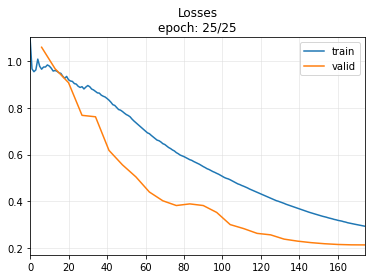

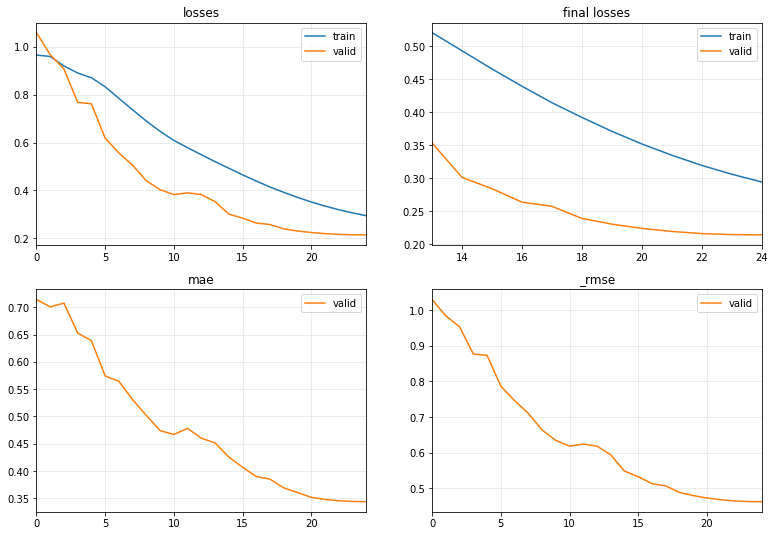

-IMF 6 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


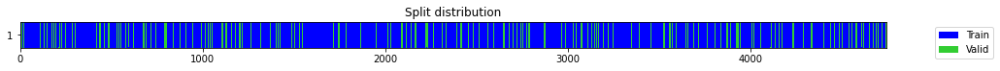

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.982856,1.089832,0.722457,1.043950,00:00
1,0.965559,0.930459,0.692665,0.964603,00:00
2,0.896445,0.774445,0.647128,0.880025,00:00
3,0.841121,0.725962,0.640988,0.852034,00:00
4,0.794142,0.598273,0.582928,0.773481,00:00
5,0.748257,0.594625,0.585814,0.771120,00:00
6,0.704771,0.472970,0.525706,0.687728,00:00
7,0.657882,0.486781,0.531461,0.697697,00:00
8,0.616740,0.373482,0.461446,0.611132,00:00
9,0.573513,0.368016,0.456198,0.606644,00:00


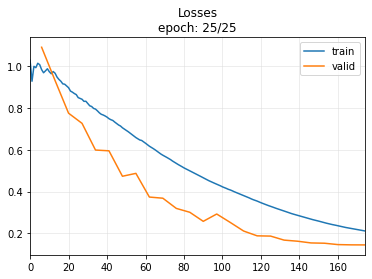

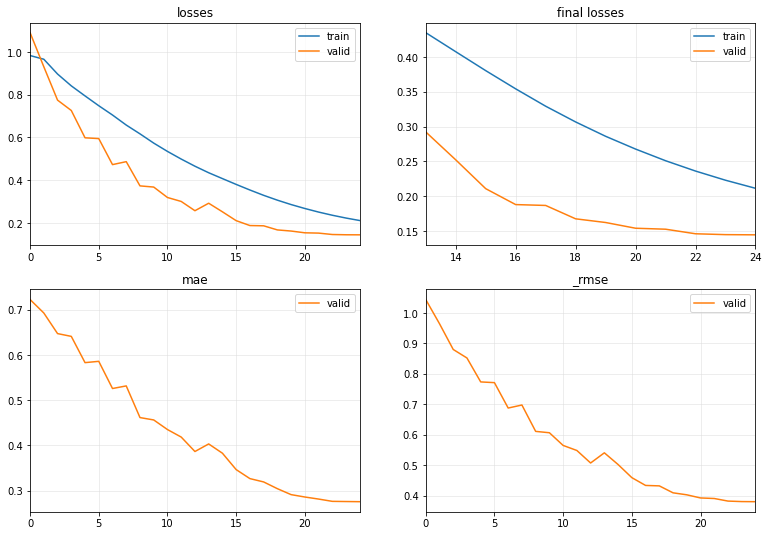

-IMF 7 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


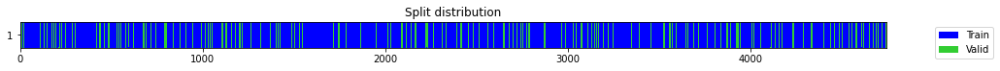

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.976611,1.067551,0.724468,1.033224,00:00
1,0.955428,0.898792,0.690177,0.948047,00:00
2,0.895517,0.753845,0.661574,0.868242,00:00
3,0.840133,0.615064,0.586141,0.784260,00:00
4,0.801019,0.687837,0.625786,0.829360,00:00
5,0.772314,0.570314,0.571841,0.755191,00:00
6,0.730122,0.525217,0.558109,0.724719,00:00
7,0.685912,0.459000,0.508015,0.677495,00:00
8,0.640865,0.403781,0.478517,0.635437,00:00
9,0.595334,0.377317,0.460502,0.614261,00:00


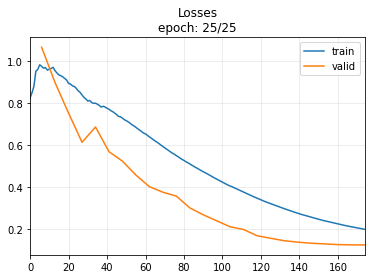

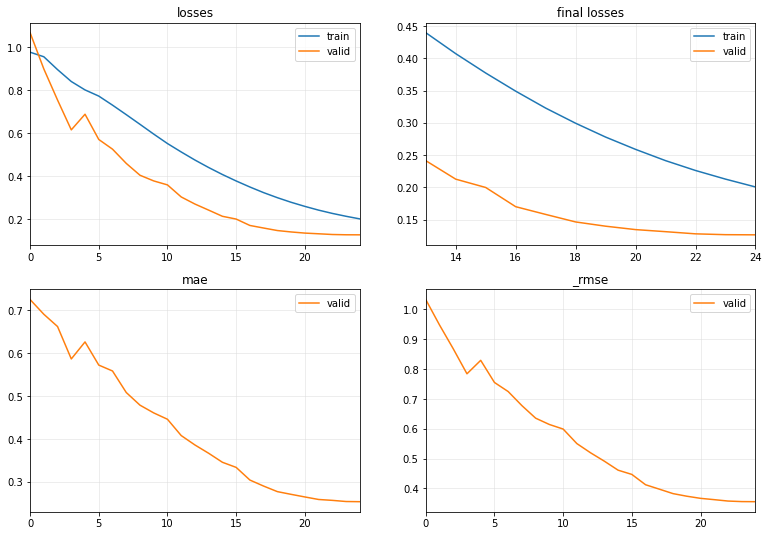

-IMF 8 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


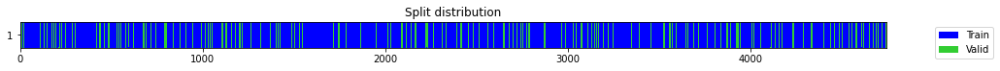

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.928492,1.183571,0.723644,1.087920,00:00
1,0.915823,0.944741,0.675338,0.971978,00:00
2,0.846229,0.791847,0.631291,0.889858,00:00
3,0.787526,0.706335,0.598347,0.840437,00:00
4,0.733684,0.586827,0.550570,0.766047,00:00
5,0.674356,0.548210,0.547605,0.740412,00:00
6,0.631584,0.452854,0.494768,0.672945,00:00
7,0.586574,0.390386,0.460791,0.624809,00:00
8,0.539288,0.317595,0.416952,0.563555,00:00
9,0.493126,0.257598,0.371351,0.507541,00:00


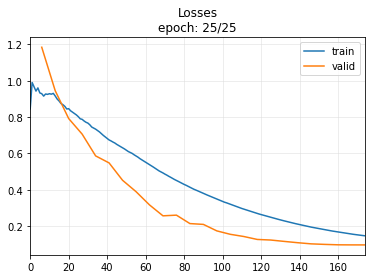

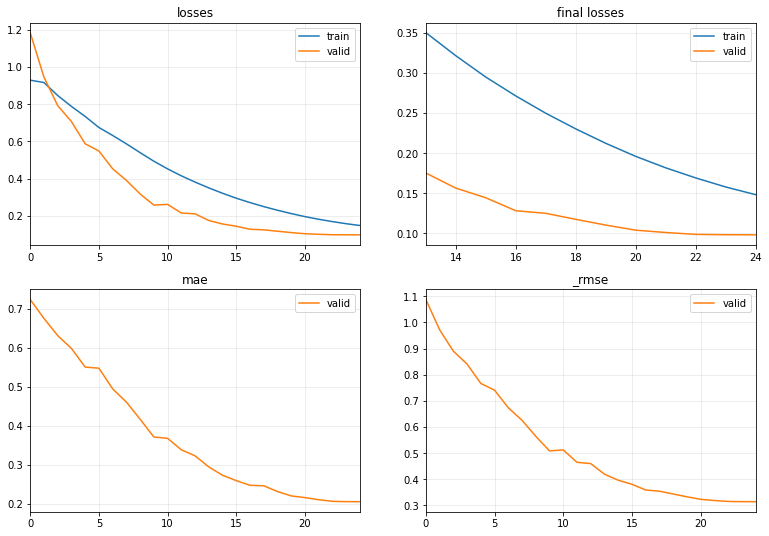

-IMF 9 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


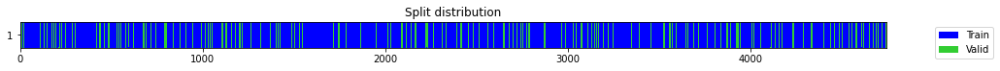

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.955704,1.115963,0.700629,1.056392,00:00
1,0.945631,0.994649,0.674212,0.997321,00:00
2,0.905075,0.717156,0.595920,0.846851,00:00
3,0.839998,0.591369,0.541892,0.769005,00:00
4,0.761563,0.435439,0.485199,0.659878,00:00
5,0.683803,0.367407,0.454193,0.606141,00:00
6,0.613274,0.298900,0.402527,0.546717,00:00
7,0.553328,0.304462,0.409146,0.551781,00:00
8,0.500558,0.245634,0.369223,0.495615,00:00
9,0.451464,0.181436,0.310887,0.425953,00:00


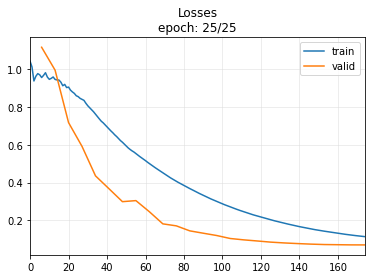

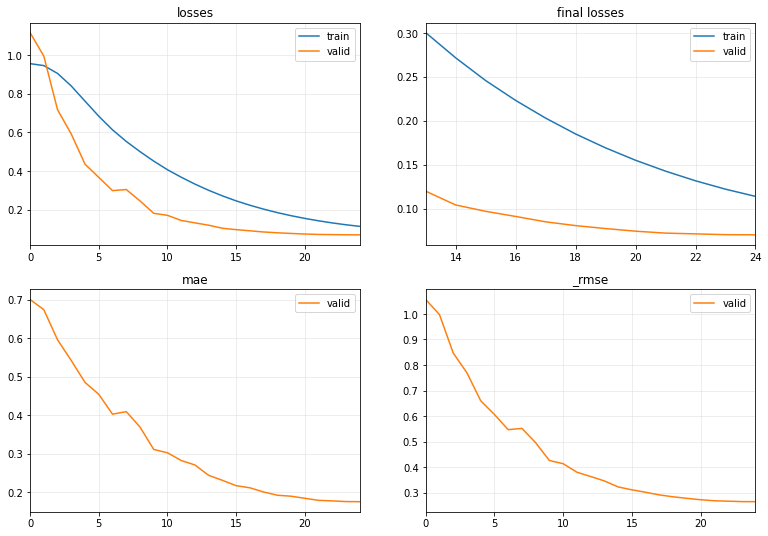

-IMF 10 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


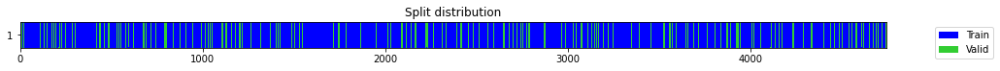

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.007197,0.971259,0.673981,0.985524,00:00
1,0.981662,0.833796,0.649126,0.913124,00:00
2,0.929597,0.694997,0.639320,0.833665,00:00
3,0.872068,0.526516,0.549285,0.725614,00:00
4,0.793886,0.431429,0.481234,0.656832,00:00
5,0.722587,0.381913,0.468262,0.617991,00:00
6,0.663517,0.383889,0.453171,0.619587,00:00
7,0.609614,0.371397,0.452874,0.609423,00:00
8,0.559182,0.290625,0.397415,0.539096,00:00
9,0.509967,0.250214,0.365137,0.500214,00:00


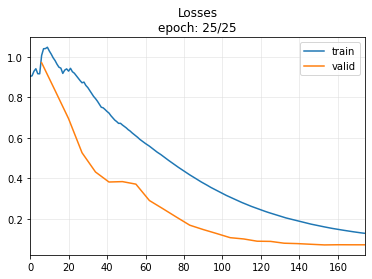

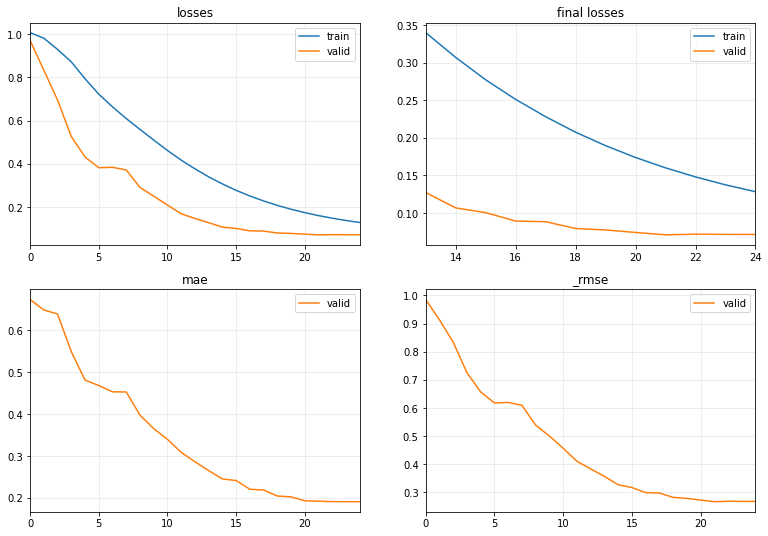

-IMF 11 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


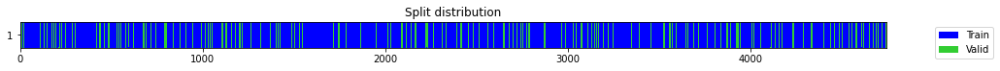

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.986038,1.030607,0.704687,1.015188,00:00
1,0.958858,0.942998,0.682227,0.971081,00:00
2,0.899880,0.610501,0.574516,0.781346,00:00
3,0.817366,0.594812,0.585887,0.771240,00:00
4,0.745775,0.459627,0.503042,0.677958,00:00
5,0.674318,0.375383,0.440913,0.612685,00:00
6,0.610841,0.335138,0.418111,0.578911,00:00
7,0.548967,0.270924,0.380972,0.520503,00:00
8,0.493174,0.235901,0.357634,0.485696,00:00
9,0.447051,0.238090,0.361868,0.487945,00:00


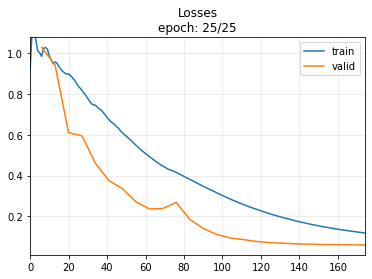

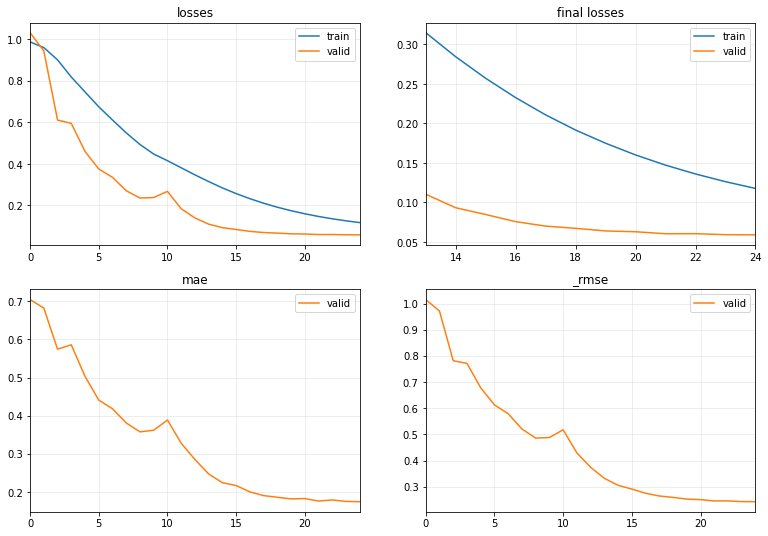

-IMF 12 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


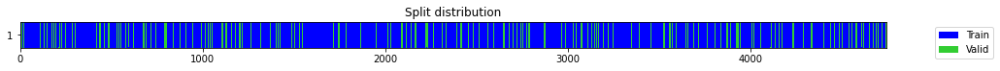

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.969446,1.060475,0.674190,1.029794,00:00
1,0.944894,0.852695,0.627828,0.923415,00:00
2,0.866856,0.657651,0.590996,0.810957,00:00
3,0.787722,0.505314,0.502995,0.710855,00:00
4,0.696663,0.416456,0.458098,0.645334,00:00
5,0.624368,0.389373,0.445197,0.623998,00:00
6,0.561718,0.323110,0.393625,0.568428,00:00
7,0.503992,0.208769,0.339841,0.456913,00:00
8,0.451601,0.194456,0.330465,0.440972,00:00
9,0.406045,0.157167,0.293921,0.396443,00:00


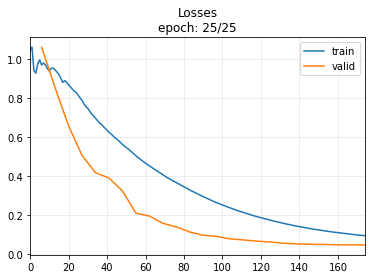

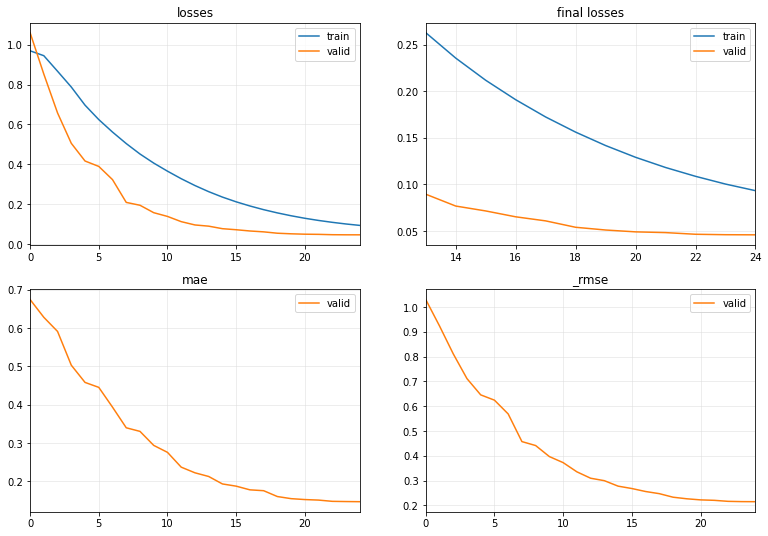

-IMF 13 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


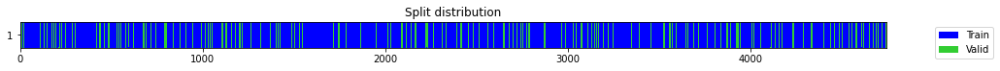

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.978932,1.088989,0.689829,1.043546,00:00
1,0.926331,0.807494,0.622074,0.898607,00:00
2,0.814223,0.504317,0.527550,0.710153,00:00
3,0.711373,0.398039,0.447026,0.630904,00:00
4,0.617044,0.348601,0.405739,0.590424,00:00
5,0.546176,0.337529,0.416879,0.580973,00:00
6,0.490634,0.318002,0.387844,0.563917,00:00
7,0.445987,0.285212,0.374579,0.534053,00:00
8,0.406173,0.211694,0.345283,0.460102,00:00
9,0.366700,0.186791,0.322235,0.432193,00:00


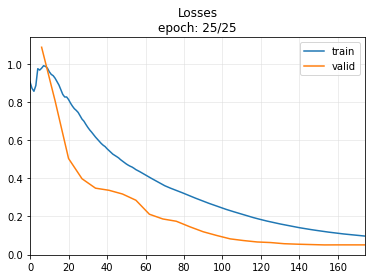

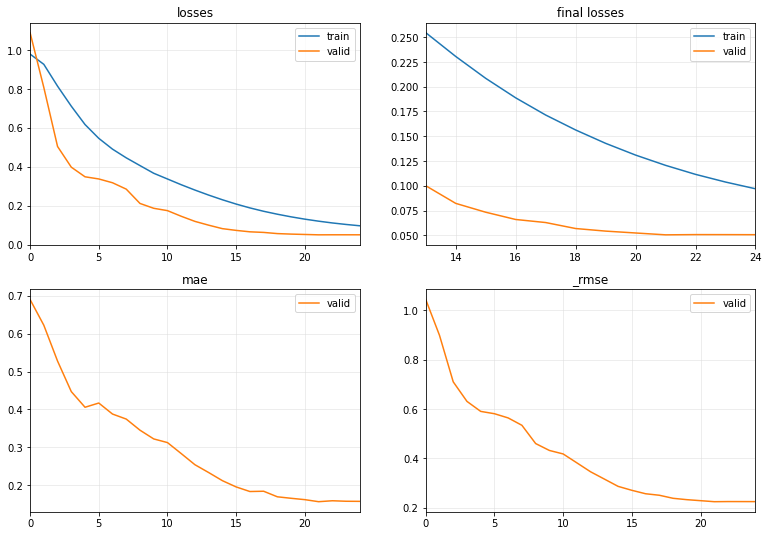

-IMF 14 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


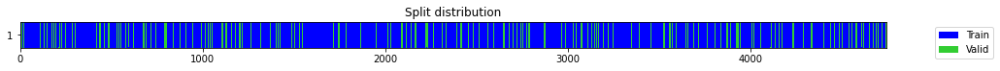

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.941044,1.159160,0.666542,1.076643,00:00
1,0.889532,0.744218,0.576449,0.862681,00:00
2,0.761085,0.409364,0.458046,0.639816,00:00
3,0.673050,0.407929,0.488242,0.638694,00:00
4,0.609927,0.294916,0.401119,0.543062,00:00
5,0.547147,0.317284,0.397854,0.563280,00:00
6,0.494528,0.263450,0.373599,0.513274,00:00
7,0.443776,0.193118,0.324021,0.439452,00:00
8,0.395878,0.151705,0.292547,0.389494,00:00
9,0.351568,0.121060,0.267799,0.347937,00:00


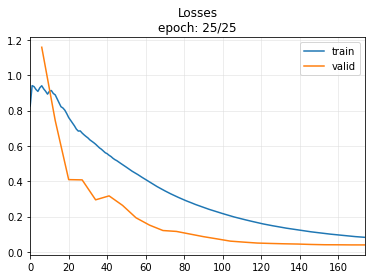

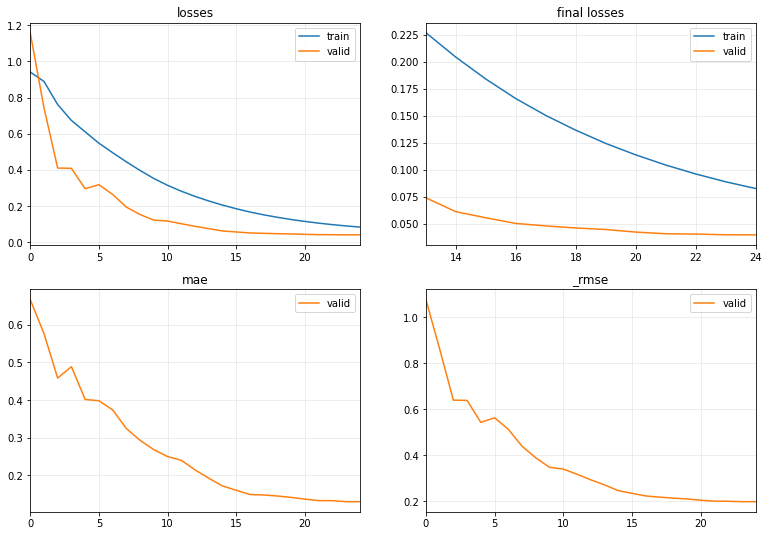

-IMF 15 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


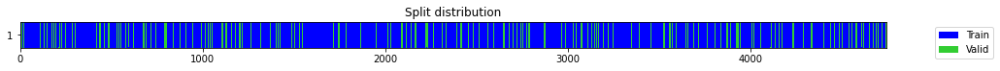

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.995663,0.891388,0.625976,0.944134,00:00
1,0.918924,0.481479,0.497937,0.693887,00:00
2,0.784432,0.383801,0.448177,0.619516,00:00
3,0.675653,0.335382,0.436186,0.579122,00:00
4,0.595611,0.275443,0.394331,0.524827,00:00
5,0.528879,0.230554,0.355295,0.480160,00:00
6,0.473501,0.197910,0.329301,0.444870,00:00
7,0.426340,0.184169,0.313902,0.429149,00:00
8,0.386695,0.156114,0.286116,0.395113,00:00
9,0.349180,0.130513,0.285970,0.361266,00:00


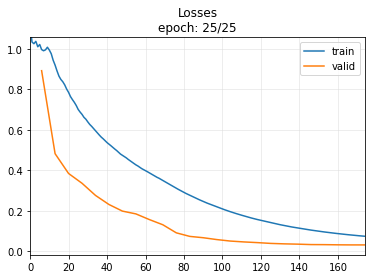

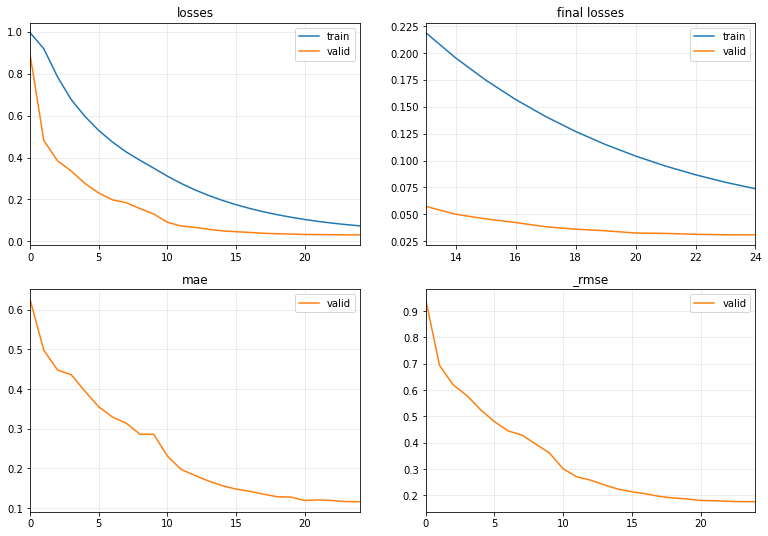

-IMF 16 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


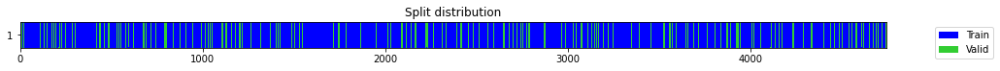

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.913243,1.091864,0.643592,1.044923,00:00
1,0.835585,0.535572,0.490451,0.731828,00:00
2,0.698641,0.440190,0.453578,0.663468,00:00
3,0.594066,0.298785,0.384023,0.546612,00:00
4,0.511304,0.235467,0.337255,0.485249,00:00
5,0.448210,0.222781,0.335175,0.471997,00:00
6,0.402888,0.215776,0.334080,0.464517,00:00
7,0.363150,0.185376,0.296478,0.430553,00:00
8,0.328408,0.163129,0.296952,0.403892,00:00
9,0.296370,0.166049,0.287224,0.407492,00:00


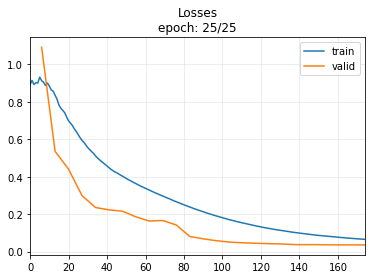

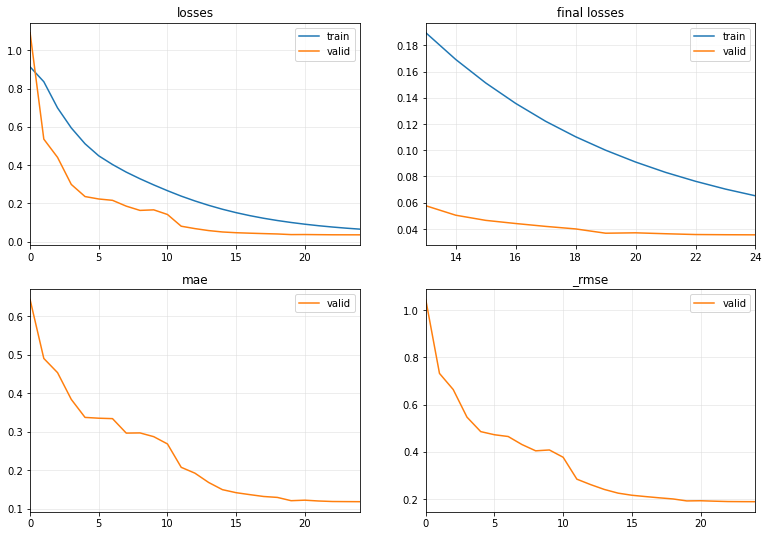

-IMF 17 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


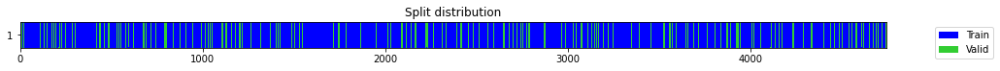

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.952389,1.034692,0.657326,1.017198,00:00
1,0.861213,0.511979,0.489848,0.715527,00:00
2,0.718039,0.465478,0.457406,0.682260,00:00
3,0.617298,0.351598,0.419052,0.592957,00:00
4,0.533974,0.259183,0.334210,0.509100,00:00
5,0.467876,0.214565,0.300742,0.463212,00:00
6,0.420028,0.256090,0.335559,0.506053,00:00
7,0.385972,0.229600,0.317447,0.479166,00:00
8,0.351864,0.171023,0.277770,0.413549,00:00
9,0.316644,0.146581,0.252794,0.382860,00:00


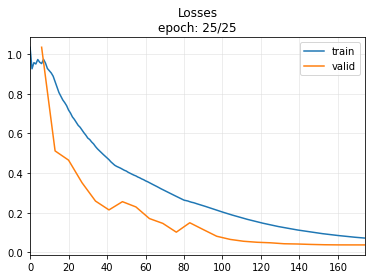

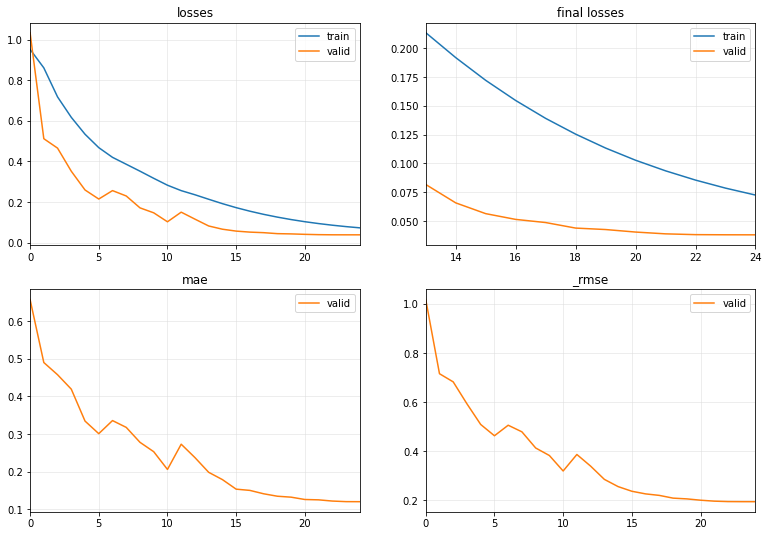

-IMF 18 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


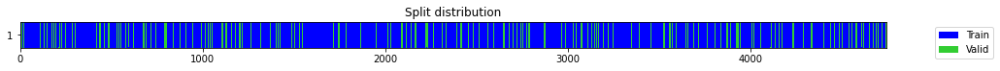

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.952556,0.964021,0.643867,0.981846,00:00
1,0.864396,0.465446,0.466305,0.682236,00:00
2,0.714143,0.410253,0.432360,0.640510,00:00
3,0.612027,0.334771,0.417247,0.578594,00:00
4,0.528828,0.247014,0.324484,0.497005,00:00
5,0.457993,0.202565,0.301141,0.450073,00:00
6,0.404514,0.182596,0.294709,0.427312,00:00
7,0.359791,0.133357,0.244050,0.365180,00:00
8,0.320832,0.143696,0.256693,0.379073,00:00
9,0.285335,0.090310,0.203797,0.300516,00:00


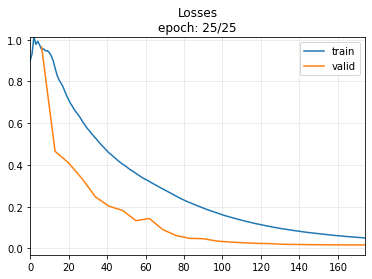

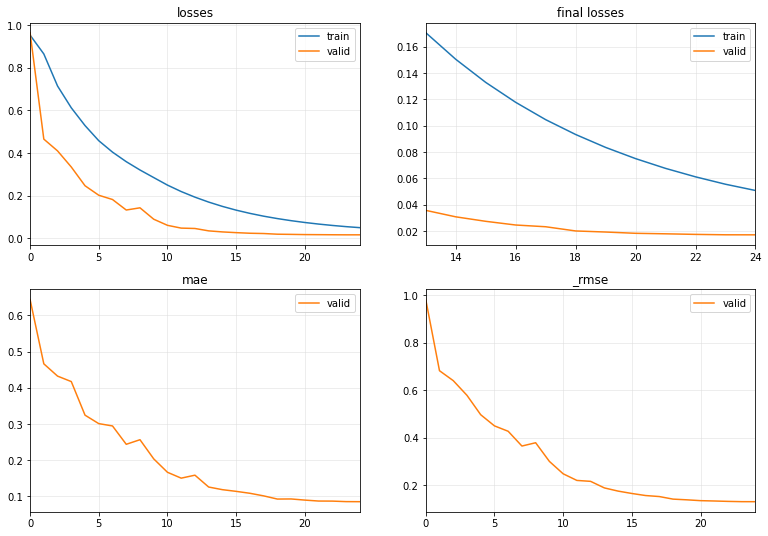

-IMF 19 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


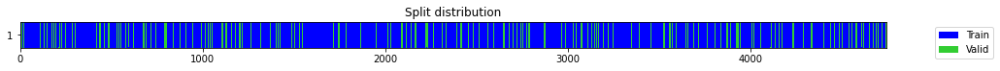

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.972243,0.935212,0.645602,0.967063,00:00
1,0.888766,0.451328,0.474478,0.671809,00:00
2,0.730785,0.407012,0.444851,0.637975,00:00
3,0.622143,0.289202,0.375683,0.537775,00:00
4,0.526483,0.202731,0.293739,0.450257,00:00
5,0.451157,0.197280,0.301711,0.444163,00:00
6,0.394580,0.160839,0.271236,0.401047,00:00
7,0.347104,0.126638,0.240646,0.355862,00:00
8,0.303599,0.079559,0.198090,0.282062,00:00
9,0.262323,0.057014,0.171300,0.238775,00:00


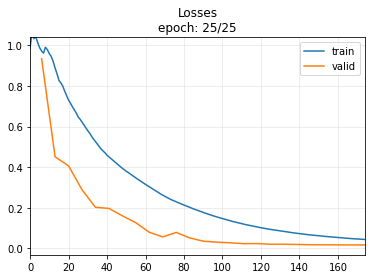

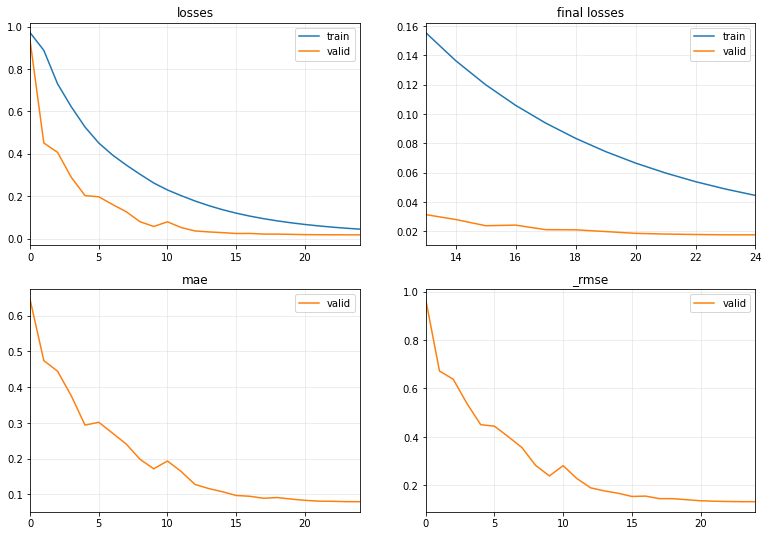

-IMF 20 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


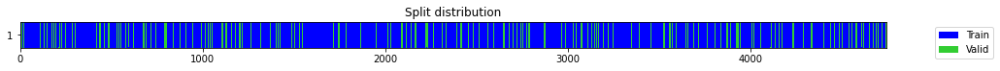

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.992206,0.857045,0.634566,0.925767,00:00
1,0.870249,0.389794,0.434772,0.624335,00:00
2,0.707589,0.349169,0.420789,0.590905,00:00
3,0.596223,0.314224,0.401818,0.560557,00:00
4,0.505860,0.210440,0.287186,0.458737,00:00
5,0.434390,0.152346,0.267644,0.390315,00:00
6,0.375649,0.126842,0.238220,0.356149,00:00
7,0.327742,0.113093,0.227628,0.336293,00:00
8,0.287319,0.093246,0.206134,0.305362,00:00
9,0.253979,0.087100,0.208854,0.295127,00:00


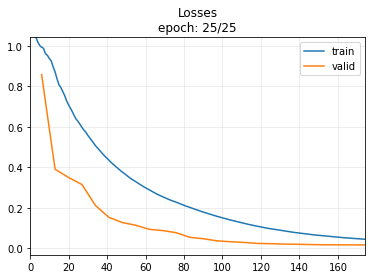

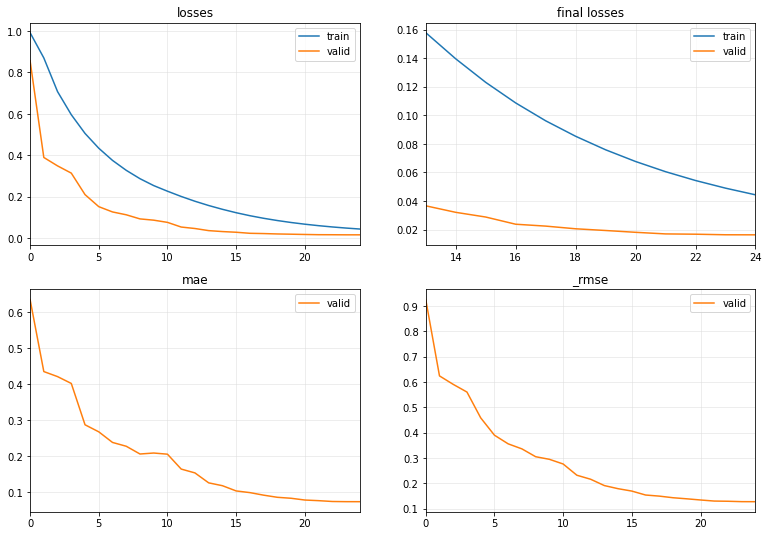

-IMF 21 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


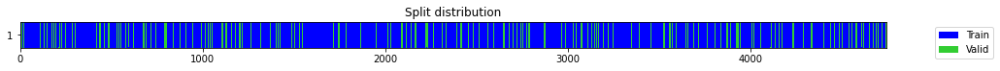

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.985264,0.931966,0.652905,0.965384,00:00
1,0.875173,0.391228,0.425043,0.625483,00:00
2,0.698388,0.338617,0.384258,0.581908,00:00
3,0.578412,0.227411,0.321343,0.476876,00:00
4,0.481790,0.145678,0.258769,0.381677,00:00
5,0.404636,0.118939,0.229923,0.344875,00:00
6,0.349476,0.123325,0.234677,0.351176,00:00
7,0.303036,0.093063,0.201986,0.305061,00:00
8,0.265063,0.085319,0.185419,0.292094,00:00
9,0.232974,0.071051,0.168088,0.266555,00:00


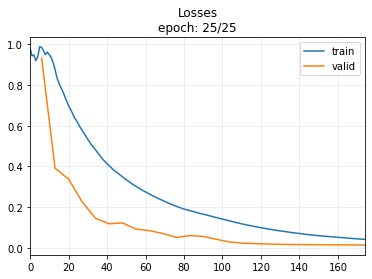

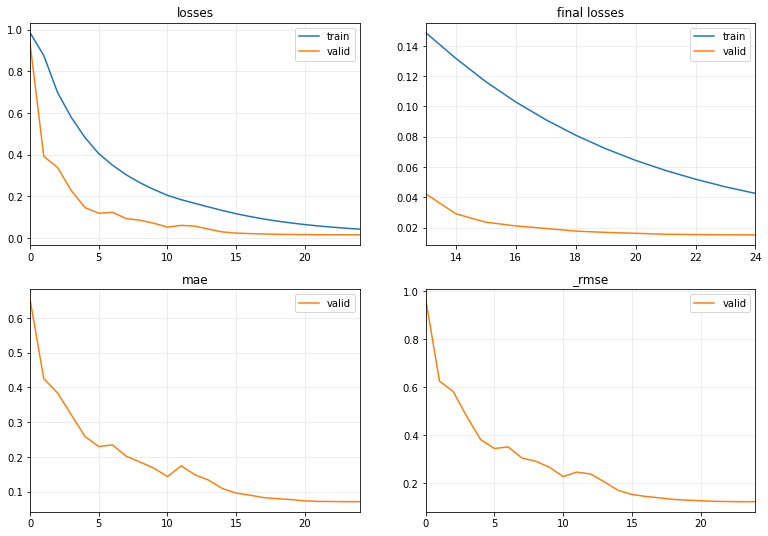

-IMF 22 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


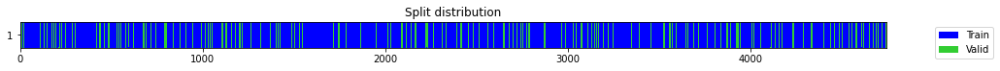

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.985374,0.885862,0.649608,0.941202,00:00
1,0.865349,0.380465,0.425277,0.616818,00:00
2,0.689631,0.299099,0.360071,0.546900,00:00
3,0.564217,0.193002,0.284244,0.439320,00:00
4,0.463228,0.151055,0.261505,0.388658,00:00
5,0.384038,0.093946,0.212735,0.306506,00:00
6,0.324135,0.076600,0.184192,0.276767,00:00
7,0.275886,0.054643,0.139982,0.233759,00:00
8,0.236957,0.059350,0.164537,0.243619,00:00
9,0.205506,0.044252,0.130921,0.210361,00:00


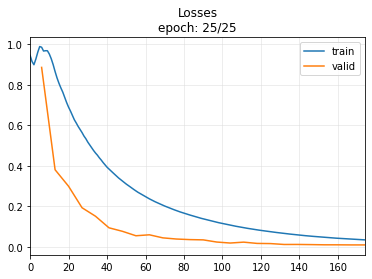

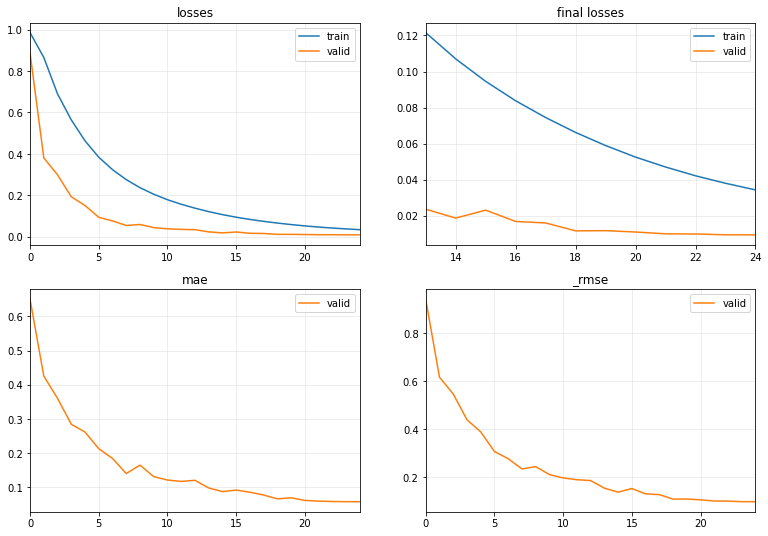

-IMF 23 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


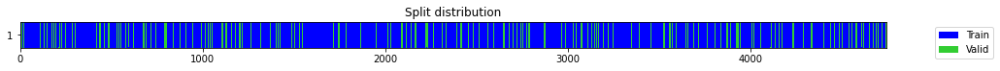

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.979321,0.914247,0.643805,0.956163,00:00
1,0.858761,0.343728,0.394558,0.586284,00:00
2,0.665684,0.249457,0.319644,0.499457,00:00
3,0.536211,0.197283,0.277043,0.444166,00:00
4,0.445026,0.122927,0.227066,0.350610,00:00
5,0.371393,0.111140,0.237203,0.333377,00:00
6,0.312274,0.069831,0.187120,0.264255,00:00
7,0.263324,0.043128,0.142419,0.207674,00:00
8,0.222395,0.021624,0.081098,0.147053,00:00
9,0.188869,0.020934,0.083518,0.144686,00:00


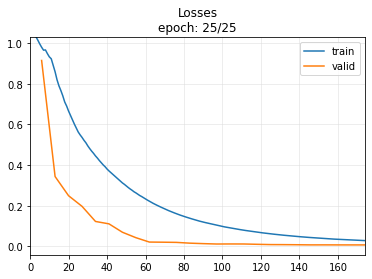

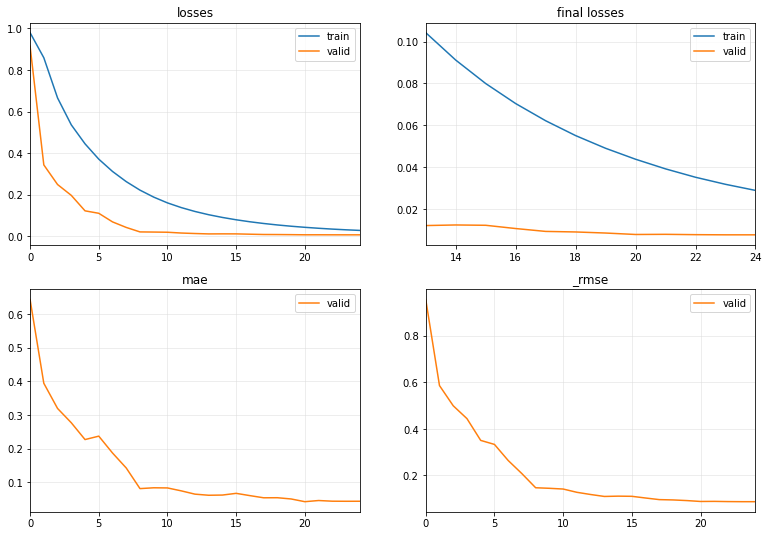

-IMF 24 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


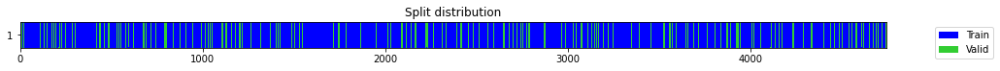

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.955692,0.944405,0.659268,0.971805,00:00
1,0.835740,0.318942,0.375090,0.564749,00:00
2,0.629159,0.221317,0.294655,0.470443,00:00
3,0.491846,0.133112,0.206647,0.364845,00:00
4,0.396585,0.087365,0.174624,0.295575,00:00
5,0.325386,0.061194,0.140409,0.247374,00:00
6,0.269983,0.039329,0.116617,0.198316,00:00
7,0.225512,0.019956,0.094232,0.141266,00:00
8,0.189612,0.026644,0.123190,0.163231,00:00
9,0.159975,0.013906,0.068903,0.117924,00:00


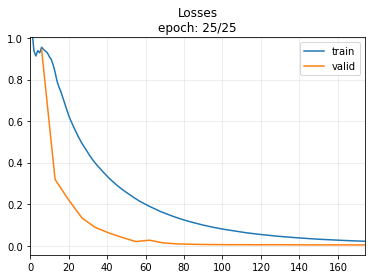

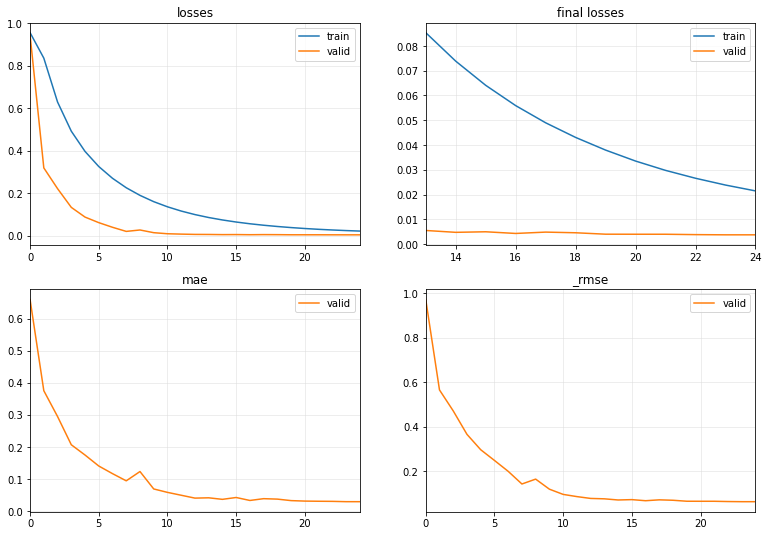

-IMF 25 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


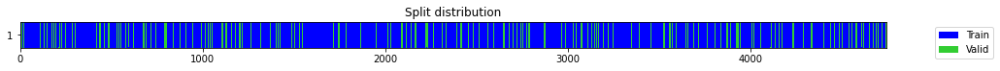

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.983256,0.844900,0.628743,0.919184,00:00
1,0.852715,0.245017,0.367054,0.494992,00:00
2,0.622474,0.171792,0.264416,0.414478,00:00
3,0.476033,0.086061,0.216438,0.293362,00:00
4,0.376186,0.104197,0.243391,0.322796,00:00
5,0.306982,0.049562,0.165218,0.222625,00:00
6,0.252071,0.028659,0.118388,0.169288,00:00
7,0.209299,0.019044,0.087528,0.138000,00:00
8,0.175751,0.014124,0.067165,0.118843,00:00
9,0.149121,0.011790,0.067784,0.108584,00:00


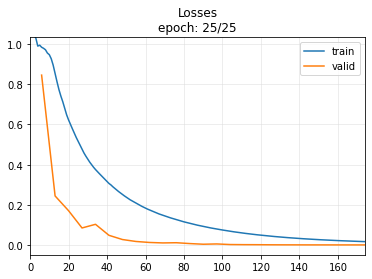

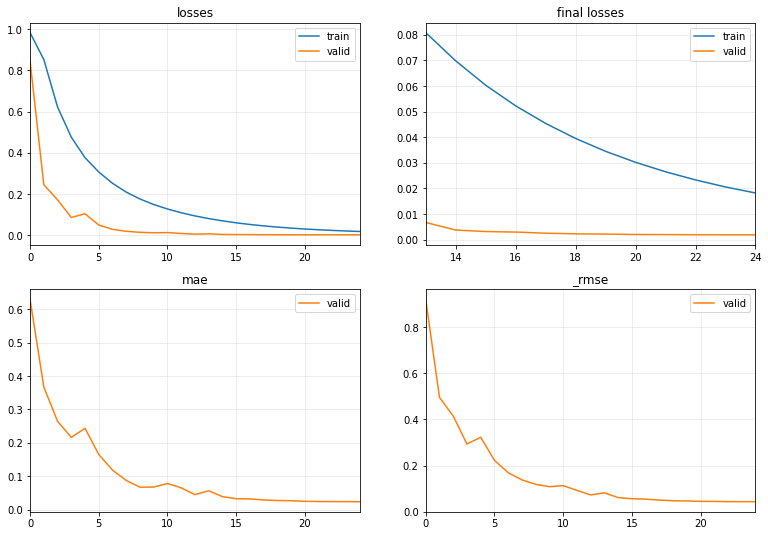

-IMF 26 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


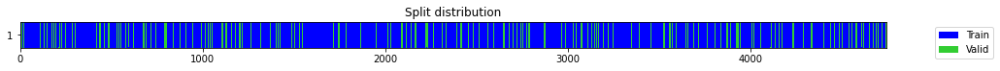

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.957792,0.849039,0.604393,0.921433,00:00
1,0.795342,0.312797,0.409189,0.559283,00:00
2,0.586810,0.210906,0.246353,0.459246,00:00
3,0.454171,0.117203,0.240796,0.342349,00:00
4,0.355282,0.048484,0.144189,0.220190,00:00
5,0.280048,0.016276,0.082415,0.127576,00:00
6,0.224416,0.011037,0.061504,0.105059,00:00
7,0.183086,0.009146,0.064561,0.095633,00:00
8,0.152508,0.014890,0.077785,0.122025,00:00
9,0.127565,0.005775,0.042535,0.075996,00:00


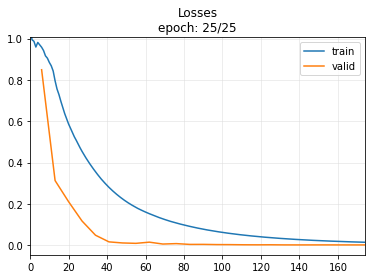

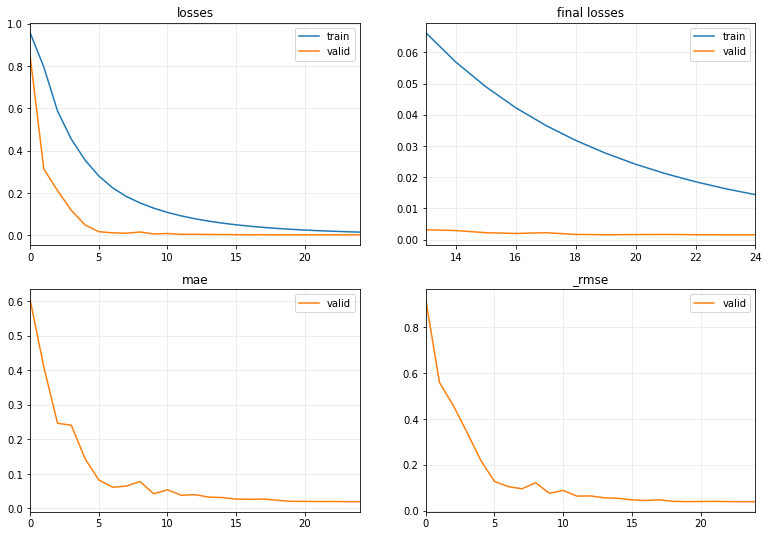

-IMF 27 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


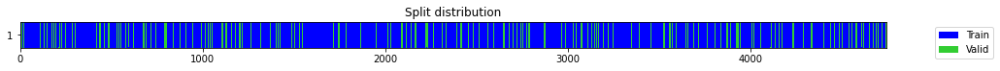

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.986843,0.731362,0.569062,0.855197,00:00
1,0.780905,0.310240,0.381055,0.556992,00:00
2,0.601315,0.148256,0.191966,0.385040,00:00
3,0.479004,0.133169,0.258460,0.364923,00:00
4,0.393356,0.028010,0.113798,0.167362,00:00
5,0.326806,0.057534,0.133438,0.239863,00:00
6,0.272308,0.030691,0.117604,0.175190,00:00
7,0.227330,0.103067,0.085812,0.321040,00:00
8,0.207028,0.288964,0.472680,0.537554,00:00
9,0.193081,0.044738,0.123999,0.211513,00:00


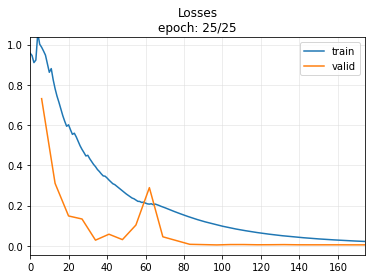

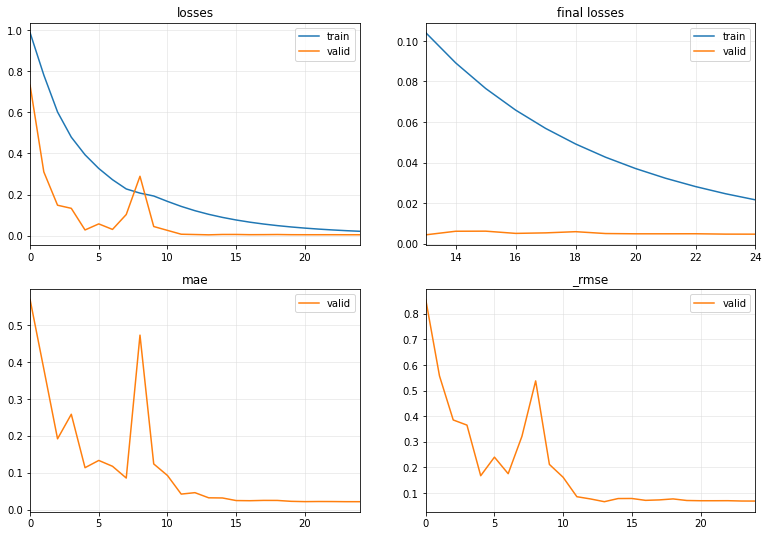

-IMF 28 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


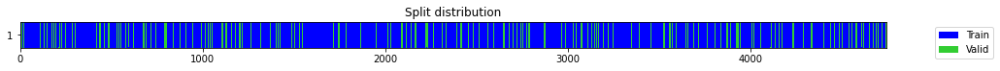

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.978629,0.839044,0.500656,0.915994,00:00
1,0.806437,0.457969,0.403625,0.676734,00:00
2,0.655551,0.259955,0.209659,0.509858,00:00
3,0.504234,0.057845,0.160420,0.240509,00:00
4,0.387274,0.025279,0.101787,0.158993,00:00
5,0.309143,0.053691,0.144023,0.231713,00:00
6,0.251845,0.010567,0.067410,0.102797,00:00
7,0.207080,0.010509,0.074582,0.102513,00:00
8,0.173531,0.019395,0.064991,0.139265,00:00
9,0.146220,0.033069,0.043142,0.181848,00:00


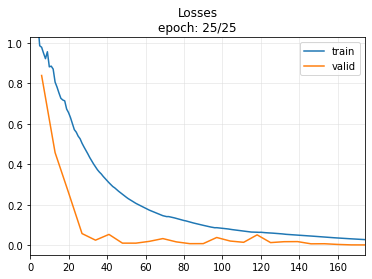

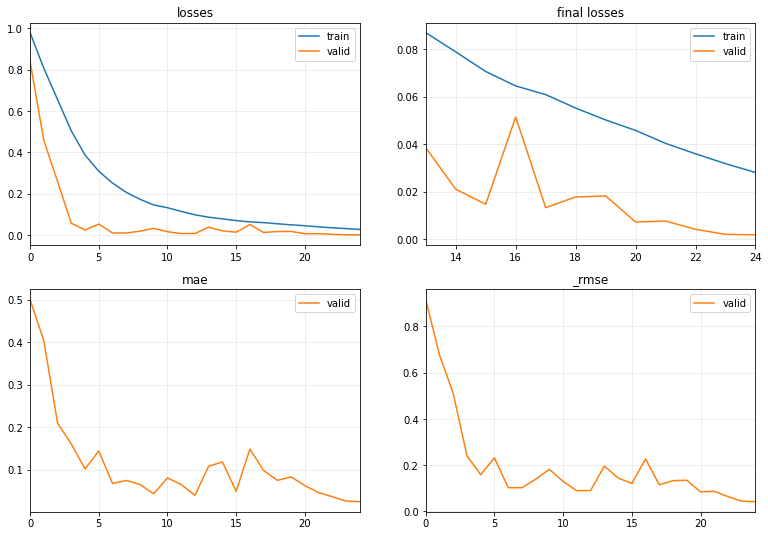

-IMF 29 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


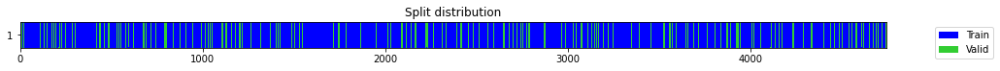

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.922505,0.682925,0.641395,0.826393,00:00
1,0.665609,0.176328,0.356761,0.419914,00:00
2,0.446424,0.090515,0.241220,0.300858,00:00
3,0.325607,0.031939,0.116399,0.178715,00:00
4,0.247410,0.011330,0.084623,0.106443,00:00
5,0.192401,0.002193,0.032595,0.046830,00:00
6,0.152511,0.001165,0.026193,0.034129,00:00
7,0.123029,0.000360,0.013226,0.018970,00:00
8,0.100649,0.000958,0.024137,0.030956,00:00
9,0.083213,0.000165,0.008576,0.012833,00:00


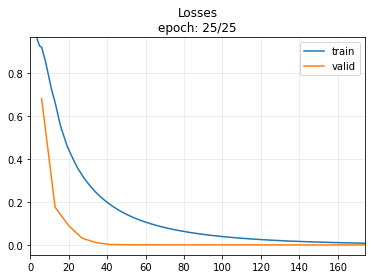

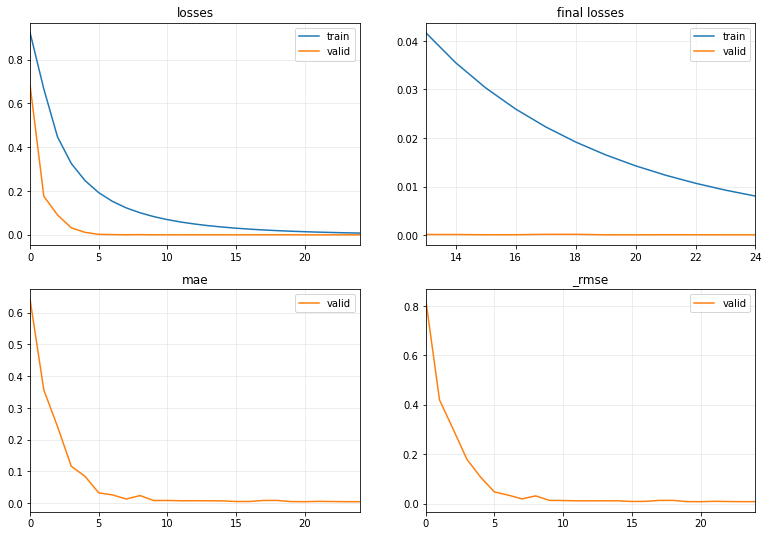

-IMF 30 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


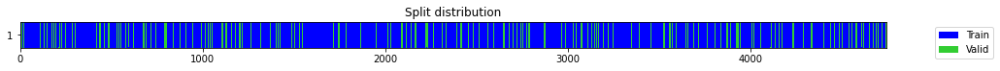

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.838409,0.505403,0.571673,0.710917,00:00
1,0.548557,0.110606,0.287478,0.332574,00:00
2,0.384501,0.073370,0.221932,0.270870,00:00
3,0.285528,0.054688,0.185071,0.233855,00:00
4,0.218241,0.010873,0.079515,0.104274,00:00
5,0.170208,0.009932,0.078885,0.099661,00:00
6,0.135648,0.003628,0.046703,0.060231,00:00
7,0.109700,0.000855,0.022504,0.029235,00:00
8,0.089827,0.000703,0.019848,0.026523,00:00
9,0.074311,0.000676,0.021286,0.026002,00:00


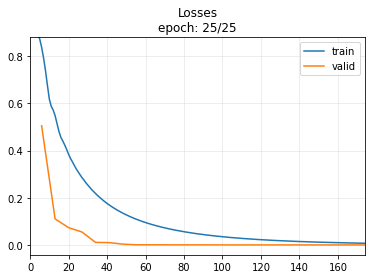

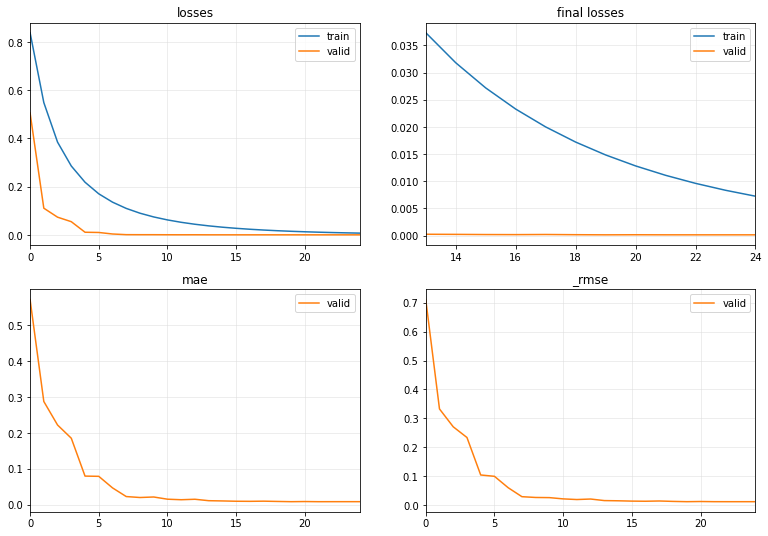

-IMF 31 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


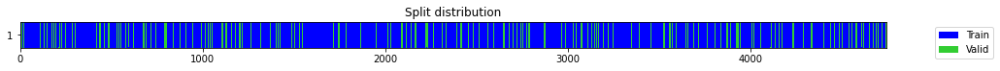

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.967352,1.148657,0.717742,1.071754,00:00
1,0.964812,1.138260,0.712773,1.066893,00:00
2,0.950050,1.081890,0.697926,1.040139,00:00
3,0.937002,1.053479,0.681173,1.026391,00:00
4,0.923511,1.040091,0.674911,1.019849,00:00
5,0.910954,1.032158,0.672187,1.015952,00:00
6,0.895612,1.050181,0.685202,1.024783,00:00
7,0.885365,0.995138,0.656843,0.997566,00:00
8,0.872538,0.986232,0.652980,0.993092,00:00
9,0.862921,0.978126,0.651206,0.989003,00:00


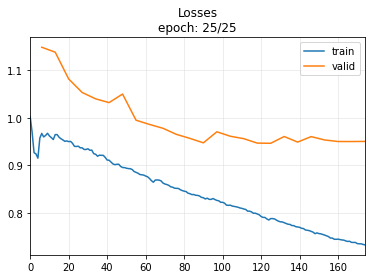

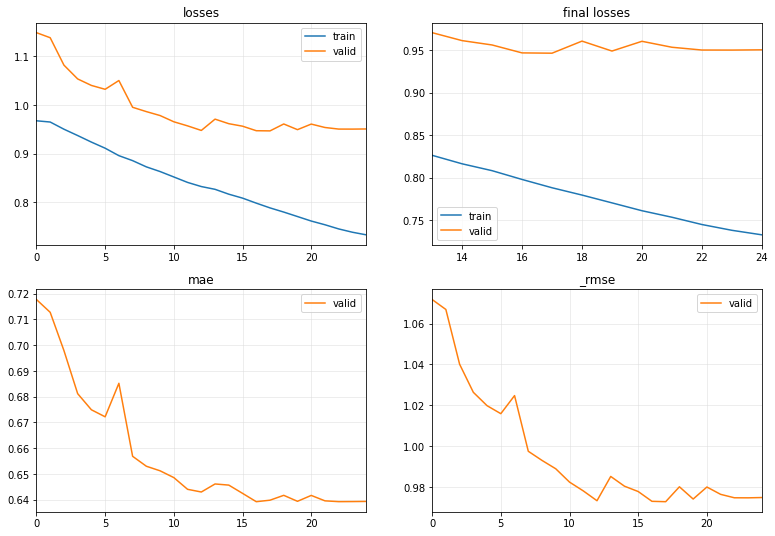

Targets and Predictions shapes (1187,) (1187,)
LSTMPlus : MAPE =  0.9726460765622102 MAE =  0.14017486093206905 RMSE =  0.17275952096129474


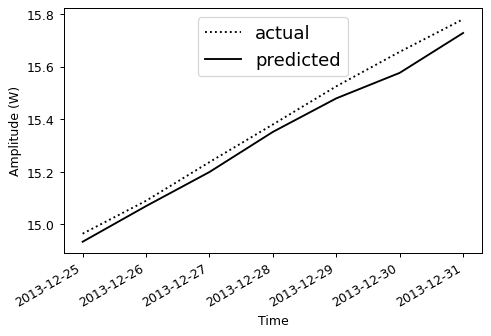

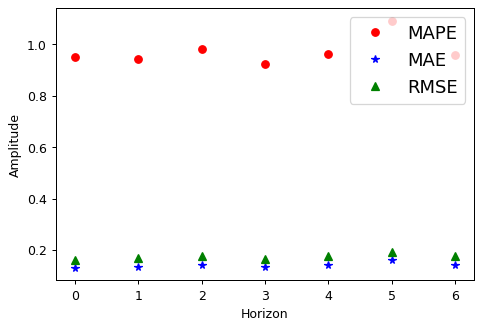

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Vol_data = to3d(VMD_Vol.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with EMD - Volume + time info.

In [ ]:
exec('bottleneck = True')
exec('coord = True')
exec('separable = False')
exec('zero_norm = True')
exec('nf = 8')
exec('ks = 20')
exec('conv_dropout = 0.484472617985568')
exec('fc_dropout = 0.321080928343938')
exec('learning_rate = 0.00997652067119318')

par = {'bottleneck':bottleneck,'coord':coord,'separable':separable,'zero_norm':zero_norm,'nf':nf,'ks':ks,'conv_dropout':conv_dropout,'fc_dropout':fc_dropout}

In [ ]:
ind = 'EMD4IMFs';
mode = 'VolTime_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
VMD_Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + ind + '_' + season + '.csv')
VMD_Vol = VMD_Vol.drop(columns='Element0')
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,26.405,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,...,28.828,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594
1,26.496,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,...,28.921,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671
2,26.582,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,...,29.009,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744
3,26.672,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,...,29.091,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822
4,26.770,26.867,26.940,27.013,27.095,27.185,27.286,27.381,27.463,27.552,...,29.190,29.248,29.324,29.418,29.505,29.594,29.671,29.744,29.822,29.911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5931,20.223,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,...,21.798,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348
5932,20.325,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,...,21.866,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398
5933,20.424,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,...,21.914,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441
5934,20.515,20.595,20.679,20.740,20.798,20.824,20.882,20.963,21.039,21.117,...,21.981,22.045,22.097,22.152,22.235,22.312,22.348,22.398,22.441,22.489


In [ ]:
split_indx = 30

print('Processing Vol and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Vol and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


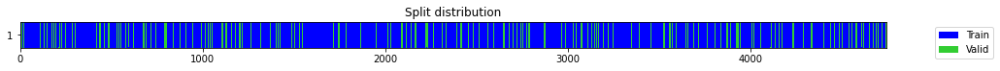

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.187143,1.077534,0.537889,1.038044,00:00
1,1.079918,0.982202,0.547155,0.991061,00:00
2,0.982029,0.853553,0.540474,0.923879,00:00
3,0.900828,0.780283,0.533877,0.883336,00:00
4,0.847251,0.745974,0.525742,0.863698,00:00
5,0.799051,0.688568,0.513726,0.829800,00:00
6,0.814424,1.041342,0.735735,1.020462,00:00
7,0.817201,0.786476,0.578466,0.886835,00:00
8,0.785336,0.675441,0.514538,0.821852,00:00
9,0.743654,0.616533,0.485043,0.785196,00:00


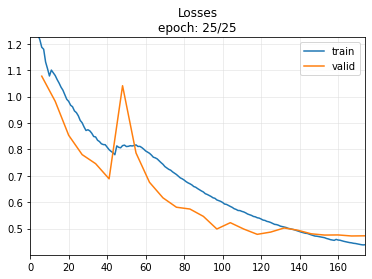

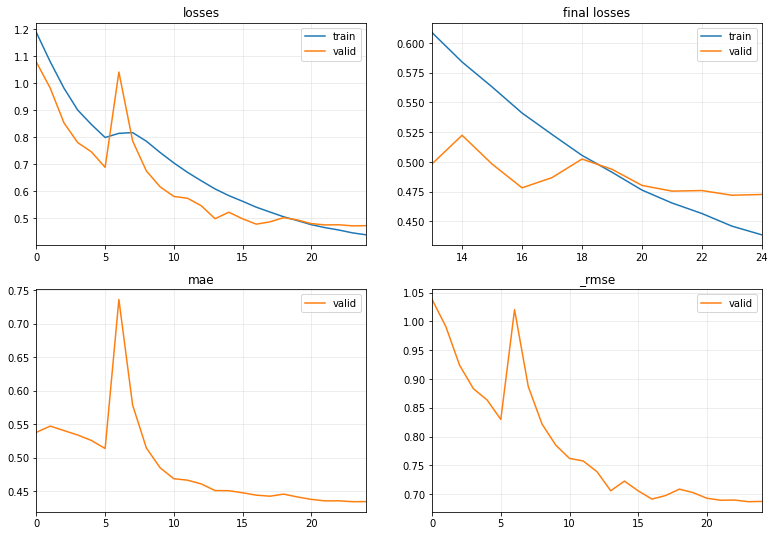

-IMF 1 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


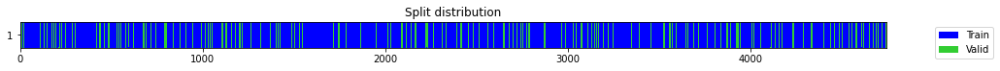

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.058280,0.902098,0.632714,0.949788,00:00
1,0.920790,0.757549,0.601723,0.870373,00:00
2,0.840350,0.670026,0.563232,0.818551,00:00
3,0.767473,0.602859,0.528813,0.776440,00:00
4,0.712747,0.540743,0.512760,0.735352,00:00
5,0.657387,0.458176,0.452840,0.676887,00:00
6,0.616497,0.489850,0.498824,0.699893,00:00
7,0.588259,0.472988,0.461397,0.687741,00:00
8,0.563766,0.494808,0.461342,0.703426,00:00
9,0.537567,0.393408,0.409245,0.627222,00:00


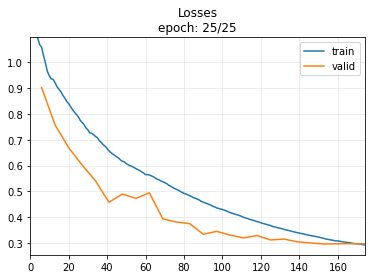

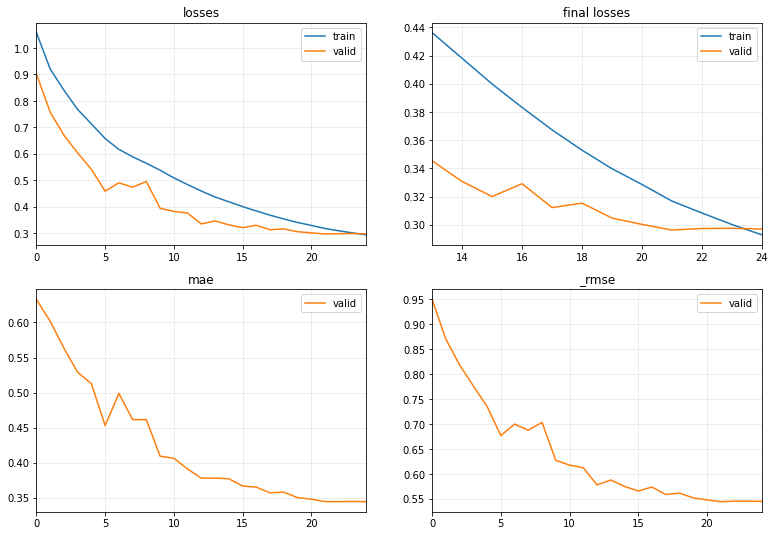

-IMF 2 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


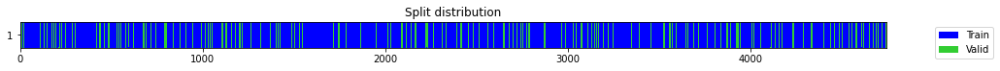

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.902600,0.854493,0.560575,0.924388,00:00
1,0.692201,0.497746,0.368500,0.705511,00:00
2,0.610136,0.433548,0.357773,0.658444,00:00
3,0.525449,0.346270,0.310965,0.588447,00:00
4,0.457361,0.332687,0.319846,0.576790,00:00
5,0.409988,0.360071,0.372716,0.600059,00:00
6,0.368407,0.277384,0.275936,0.526672,00:00
7,0.337970,0.276960,0.292409,0.526269,00:00
8,0.312689,0.240333,0.231383,0.490238,00:00
9,0.285150,0.227790,0.234581,0.477274,00:00


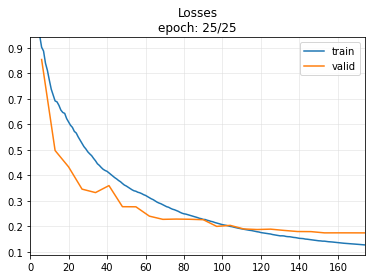

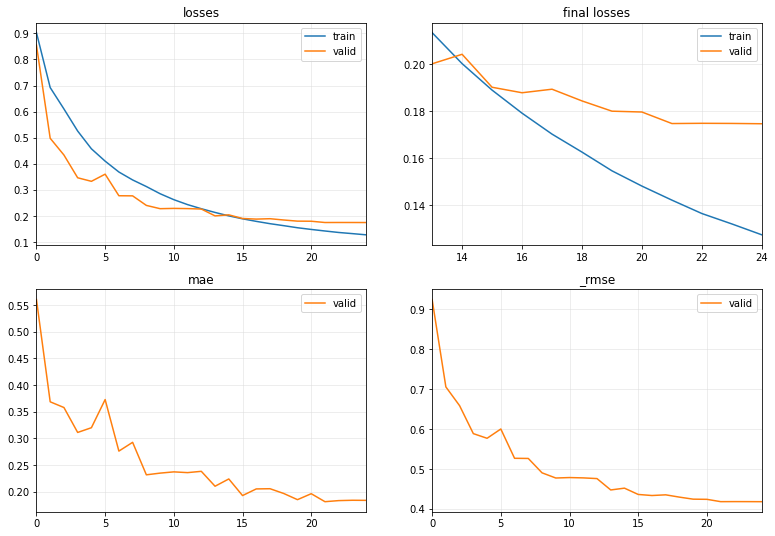

-IMF 3 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


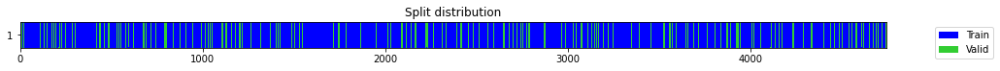

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.733660,1.297268,0.257149,1.138977,00:00
1,0.472286,0.847511,0.198267,0.920603,00:00
2,0.432392,0.941431,0.248378,0.970274,00:00
3,0.357714,0.899181,0.247131,0.948251,00:00
4,0.292354,0.819866,0.190102,0.905465,00:00
5,0.239432,0.781032,0.134884,0.883760,00:00
6,0.197363,0.745114,0.097138,0.863200,00:00
7,0.165140,0.759030,0.129205,0.871223,00:00
8,0.141641,0.767378,0.103109,0.876001,00:00
9,0.123593,0.728831,0.091525,0.853716,00:00


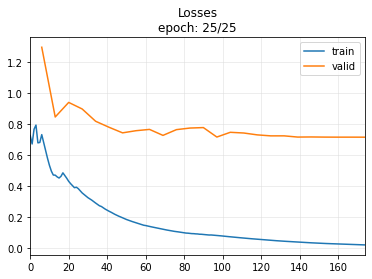

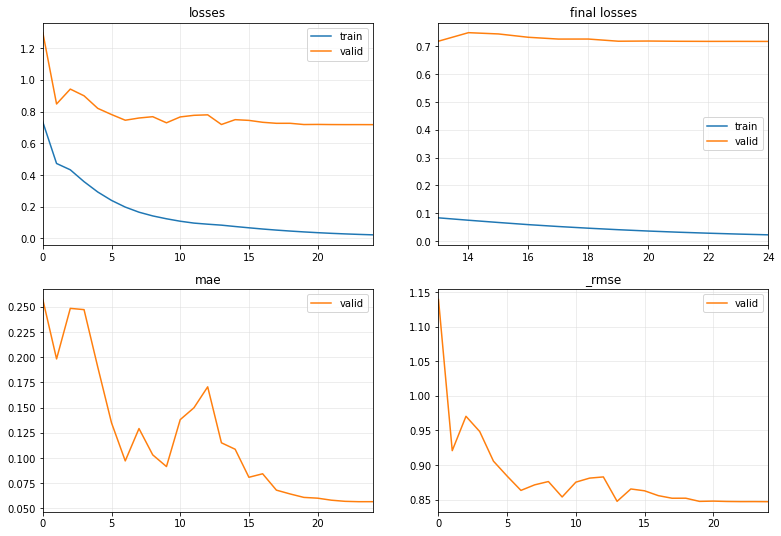

-IMF 4 , splitting data..
Standardizing data..
training set:  (4749, 4, 30) (4749, 7) , testing set:  (1187, 4, 30) (1187, 7)


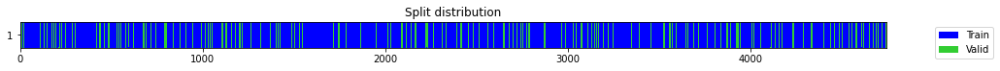

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.816282,0.361517,0.493782,0.601263,00:00
1,0.537650,0.128035,0.292160,0.357820,00:00
2,0.429523,0.292590,0.457004,0.540916,00:00
3,0.346713,0.090306,0.238778,0.300509,00:00
4,0.280772,0.097125,0.240926,0.311649,00:00
5,0.226837,0.028150,0.127167,0.167781,00:00
6,0.184485,0.027395,0.135947,0.165515,00:00
7,0.152242,0.008961,0.075457,0.094664,00:00
8,0.127550,0.013528,0.093000,0.116311,00:00
9,0.110264,0.020820,0.127563,0.144290,00:00


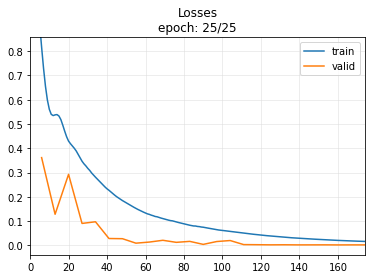

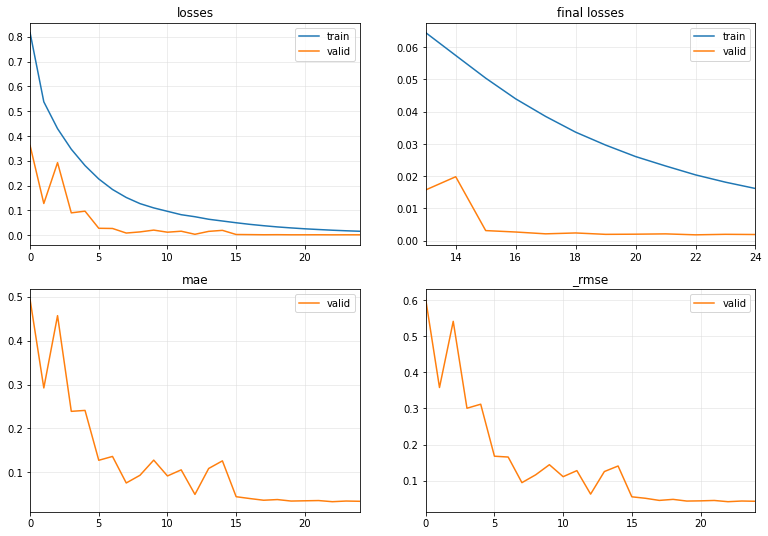

Targets and Predictions shapes (1187,) (1187,)
InceptionTimePlus : MAPE =  2.29952320614249 MAE =  0.34724552216046783 RMSE =  0.42882283061882526


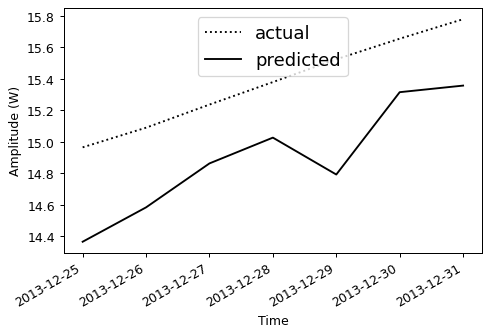

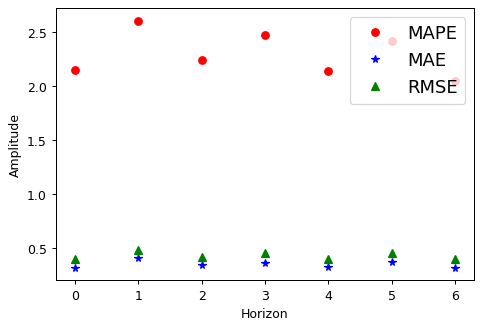

In [ ]:
for x in range(0,IMFS_count+1,1):
  del data
  print('-IMF',x,', splitting data..')
  Vol_data = to3d(VMD_Vol.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


## season2

In [ ]:
season = season2

### no VMD - Volume + time info.

In [ ]:
ind = ''
mode = 'VolTime_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,32.423,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,...,32.984,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025
1,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,...,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013
2,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,...,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968
3,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,...,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934
4,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,32.841,...,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934,32.897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,21.583,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,...,16.915,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660
6812,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,...,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330
6813,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,...,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975
6814,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,19.868,...,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975,13.719


#### Hyperparameter tuning

Processing Volume data..
splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


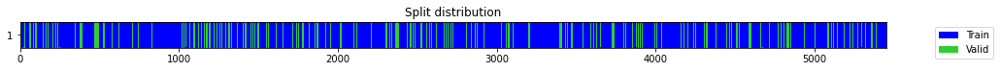

In [ ]:
split_indx = 30

print('Processing Volume data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Vol_data = to3d(Vol.iloc[:,:].values)
# Temp_data = to3d(Temp.iloc[:,:].values)
data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1)  #, TS_Mend, TS_Mstart
data_X = data[:,:,:split_indx]
data_y = data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

In [ ]:
import optuna
from optuna.integration import FastAIPruningCallback

def objective(trial:optuna.Trial):
    
    # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
    # nf = trial.suggest_categorical('num_filters', [32, 64, 96]) # search through all categorical values in the provided list
    n_layers = trial.suggest_int('n_layers', 3, 8, step=1) 
    bias = trial.suggest_categorical('bias', [True,False]) 
    rnn_dropout = trial.suggest_float("rnn_dropout",0, 0.5) 
    bidirectional = trial.suggest_categorical('bidirectional', [True,False])
    fc_dropout = trial.suggest_float('fc_dropout', 0,0.5) 
    bn = trial.suggest_categorical('bn', [True,False])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True) 

    learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512,
                         arch=model_name, arch_config={'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn},
                         metrics=rmse)# , cbs=FastAIPruningCallback(trial))

    with ContextManagers([learn.no_logging(), learn.no_bar()]): # [Optional] this prevents fastai from printing anything during training
        learn.fit_one_cycle(5, lr_max=learning_rate)

    # Return the objective value
    return learn.recorder.values[-1][1] # return the validation loss value of the last epoch 

study = optuna.create_study(direction='minimize')
print(f"Sampler is {study.sampler.__class__.__name__}")

study.optimize(objective, n_trials=100)

print("**Study statistics: ")
print("  Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("{}".format(value))


[I 2022-07-23 23:47:32,583] A new study created in memory with name: no-name-6168a077-d3ca-48c5-9591-1b3ca2ea837b


Sampler is TPESampler


[I 2022-07-23 23:47:36,199] Trial 0 finished with value: 1.0263751745224 and parameters: {'n_layers': 7, 'bias': False, 'rnn_dropout': 0.18140957210245856, 'bidirectional': False, 'fc_dropout': 0.14551465684885584, 'bn': False, 'learning_rate': 3.0084772142526585e-05}. Best is trial 0 with value: 1.0263751745224.
[I 2022-07-23 23:47:41,064] Trial 1 finished with value: 0.10885211080312729 and parameters: {'n_layers': 6, 'bias': False, 'rnn_dropout': 0.27317410013421506, 'bidirectional': True, 'fc_dropout': 0.03813328230456725, 'bn': True, 'learning_rate': 0.004335635353236239}. Best is trial 1 with value: 0.10885211080312729.
[I 2022-07-23 23:47:43,868] Trial 2 finished with value: 1.022243857383728 and parameters: {'n_layers': 4, 'bias': False, 'rnn_dropout': 0.2581125013595421, 'bidirectional': False, 'fc_dropout': 0.2027686150726068, 'bn': False, 'learning_rate': 3.995347473595486e-05}. Best is trial 1 with value: 0.10885211080312729.
[I 2022-07-23 23:47:46,774] Trial 3 finished wit

**Study statistics: 
  Number of finished trials:  100
Best trial:
  Value:  0.004407414700835943
  Params: 
3
True
0.28647339601696314
True
0.15847501232966105
False
0.0031758666685899866


#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.706163,0.200708,0.375467,0.448004,00:00
1,0.424274,0.031923,0.141454,0.178669,00:00
2,0.298061,0.104560,0.280182,0.323357,00:00
3,0.218023,0.039109,0.169252,0.197759,00:00
4,0.164797,0.016369,0.105008,0.127940,00:00
5,0.127345,0.002969,0.043897,0.054492,00:00
6,0.100340,0.003581,0.045766,0.059845,00:00
7,0.080426,0.002179,0.037900,0.046683,00:00
8,0.065270,0.001431,0.029894,0.037828,00:00
9,0.053500,0.001351,0.029139,0.036755,00:00


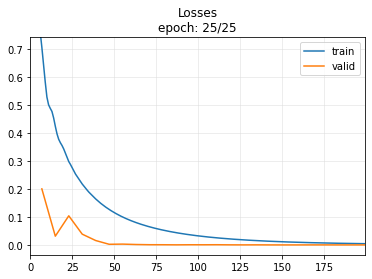

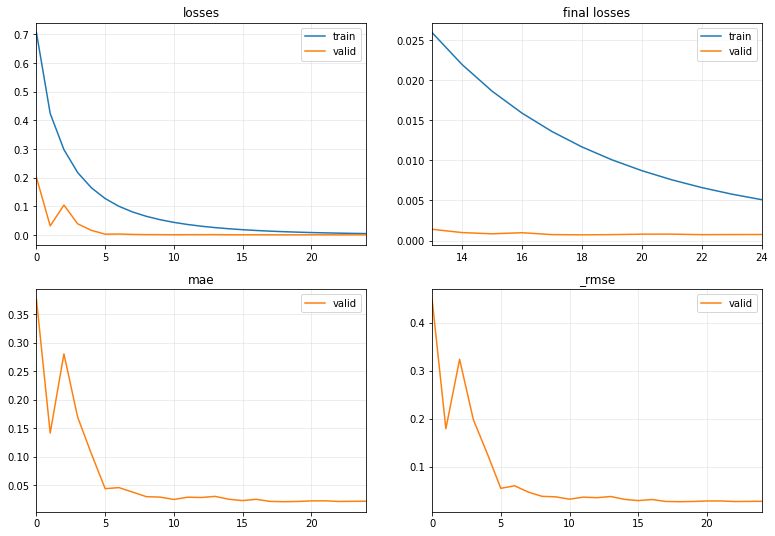

Targets and Predictions shapes (1363, 7) (1363, 7)
LSTMPlus : MAPE =  4.158977518649507 MAE =  0.3926322191044237 RMSE =  0.44935919321031725


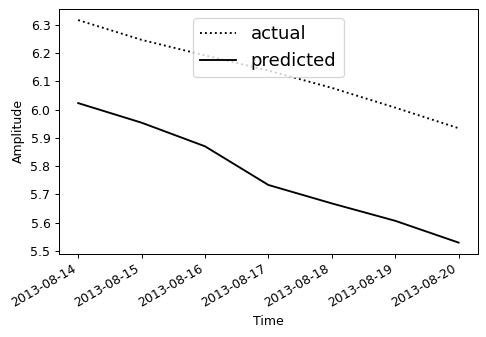

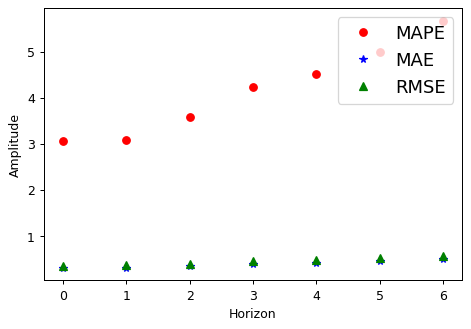

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### no VMD - Time info. only

In [ ]:
ind = ''
mode = 'Time_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,32.423,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,...,32.984,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025
1,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,...,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013
2,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,...,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968
3,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,...,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934
4,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,32.841,...,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934,32.897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,21.583,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,...,16.915,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660
6812,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,...,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330
6813,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,...,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975
6814,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,19.868,...,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975,13.719


Processing Volume data..
splitting data..
Standardizing data..
training set:  (5453, 3, 30) (5453, 7) , testing set:  (1363, 3, 30) (1363, 7)


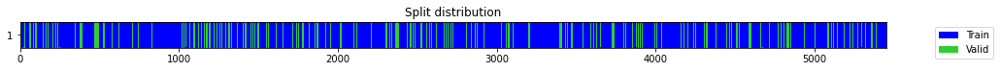

In [ ]:
split_indx = 30

print('Processing Volume data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ['Signal']
row = ["feature{}".format(x) for x in np.array(range(10))] #Change this number to higher if necessary!
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

test_targetdata={}
test_predsdata={}

test_targetdata={}
test_predsdata={}

print('splitting data..')
Vol_data = to3d(Vol.iloc[:,:].values)
data = np.concatenate([TS_D, TS_Y, TS_M],axis=1) 
data_X = data[:,:,:split_indx]
data_y = Vol_data[:,0,split_indx:]
X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
print('Standardizing data..')
for i in range(X_train.shape[1]): #normalize IN data
  scalersIN['Signal']["feature{}".format(i)] = StandardScaler()
  X_train[:, i, :] = scalersIN['Signal']["feature{}".format(i)].fit_transform(X_train[:, i, :])    
scalersOUT['Signal'] = StandardScaler() #normalize OUT data
y_train = scalersOUT['Signal'][0].fit_transform(y_train)  
print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
tfms  = [None, [ToFloat(), ToNumpyTensor()]]
dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])    
#**************#**************#**************#**************#**************#**************#**************#**************

#### Model learning

epoch,train_loss,valid_loss,mae,_rmse,time
0,0.724098,0.293996,0.467126,0.542214,00:00
1,0.448638,0.068498,0.208408,0.261722,00:00
2,0.321045,0.087198,0.232004,0.295293,00:00
3,0.241003,0.052545,0.182948,0.229226,00:00
4,0.187004,0.033593,0.147619,0.183285,00:00
5,0.148526,0.023486,0.126709,0.153252,00:00
6,0.120597,0.025414,0.119679,0.159419,00:00
7,0.099831,0.019320,0.109910,0.138997,00:00
8,0.083881,0.018354,0.109072,0.135478,00:00
9,0.071438,0.019158,0.109119,0.138412,00:00


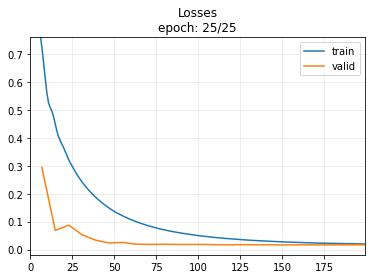

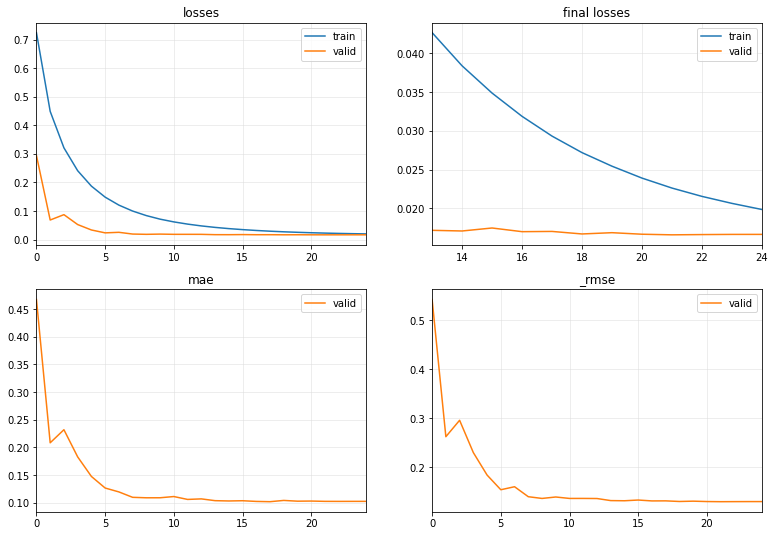

Targets and Predictions shapes (1363, 7) (1363, 7)
LSTMPlus : MAPE =  44.1476144168257 MAE =  3.721618535543585 RMSE =  3.9613438008962807


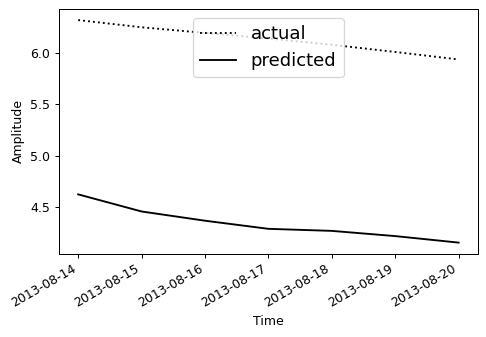

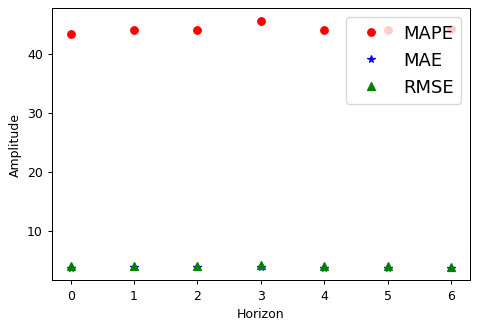

In [ ]:
# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}
#Model learning
learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
learn.fit_one_cycle(freeze_epoch, learning_rate)
# #save trained model
# learn.save_all(path='/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export', dls_fname='dls', model_fname='WP_TIME_multistep_' + learn.model.__class__.__name__ + '_' + HOUSE, learner_fname='learner')
valid_dl = dls.valid

# Labeled test data
for i in range(X_test.shape[1]): #normalize IN data
  X_test[:, i, :] = scalersIN['Signal']["feature{}".format(i)].transform(X_test[:, i, :])    
y_test = scalersOUT['Signal'][0].transform(y_test)  
test_ds = valid_dl.dataset.add_test(X_test, y_test)
test_dl = valid_dl.new(test_ds)
_, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
#denormalize data
test_predsdata = scalersOUT['Signal'][0].inverse_transform(temp_preds)  
test_targetdata = scalersOUT['Signal'][0].inverse_transform(temp_targets)    
del temp_targets, temp_preds
# RMSE.append(rmse(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# MAE.append(mae(test_targetdata["test_targets"+str(x)].data, test_predsdata["test_preds"+str(x)].data))
# print(f'RMSE: {RMSE[x]:10.6f}, MAE: {MAE[x]:10.6f}')
d = pd.DataFrame([])
d = test_targetdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', d, delimiter=',')
dp = pd.DataFrame([])
dp = test_predsdata
np.savetxt('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv', dp, delimiter=',')

#TEST MODEL
import numpy as np
import matplotlib.pyplot as plt
print('Targets and Predictions shapes', d.shape, dp.shape)

MAPE = []
MAE  = []
RMSE = []
for i in range(d.shape[1]): 
  MAPE.append(np.mean(np.abs((d[:,i] - dp[:,i]) / d[:,i]))*100)
  MAE.append(np.mean(np.abs((d[:,i] - dp[:,i]))))
  RMSE.append(np.sqrt(np.mean((d[:,i] - dp[:,i])**2)))
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], d[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dp[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(TS.shape[1] - split_indx)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with VMD - Volume + time info.

In [ ]:
ind = '31IMFs';
mode = 'VolTime_'

Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
VMD_Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + ind + '_' + season + '.csv')
VMD_Vol = VMD_Vol.drop(columns='Element0')
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,32.423,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,...,32.984,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025
1,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,...,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013
2,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,...,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968
3,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,...,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934
4,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,32.841,...,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934,32.897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,21.583,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,...,16.915,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660
6812,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,...,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330
6813,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,...,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975
6814,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,19.868,...,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975,13.719


In [ ]:
split_indx = 30

print('Processing Vol and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# define ordinal encoding
encoder_H = OrdinalEncoder()
encoder_D = OrdinalEncoder()
encoder_month = OrdinalEncoder()
# encoder_monthstart = OrdinalEncoder()
# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))
# TS_Mstart = to3d(encoder_monthstart.fit_transform(TS_Mstart))

# Get the best nf and dropout rate from the best trial object
trial = study.best_trial
for key, value in trial.params.items():
  if  key != 'act':
    exec('{} = {}'.format(key,value))
  if key == 'act':
    exec("act = '%s'" % (value))

par = {'n_layers':n_layers, 'bias':bias, 'rnn_dropout':rnn_dropout, 'bidirectional':bidirectional,'fc_dropout':fc_dropout, 'bn':bn}

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Vol and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


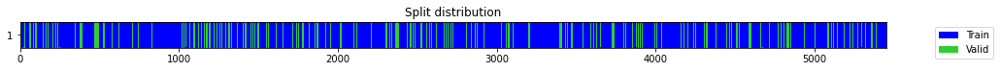

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.024400,0.935228,0.622470,0.967072,00:00
1,1.023099,0.926486,0.618021,0.962542,00:00
2,1.012872,0.915073,0.620968,0.956595,00:00
3,0.972544,0.948608,0.677915,0.973965,00:00
4,0.947032,0.814916,0.571025,0.902727,00:00
5,0.902798,0.729045,0.487624,0.853841,00:00
6,0.853485,0.683321,0.457630,0.826632,00:00
7,0.816946,0.679580,0.452091,0.824366,00:00
8,0.780367,0.609235,0.430129,0.780535,00:00
9,0.748922,0.645242,0.443738,0.803269,00:00


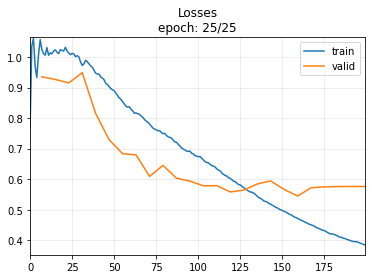

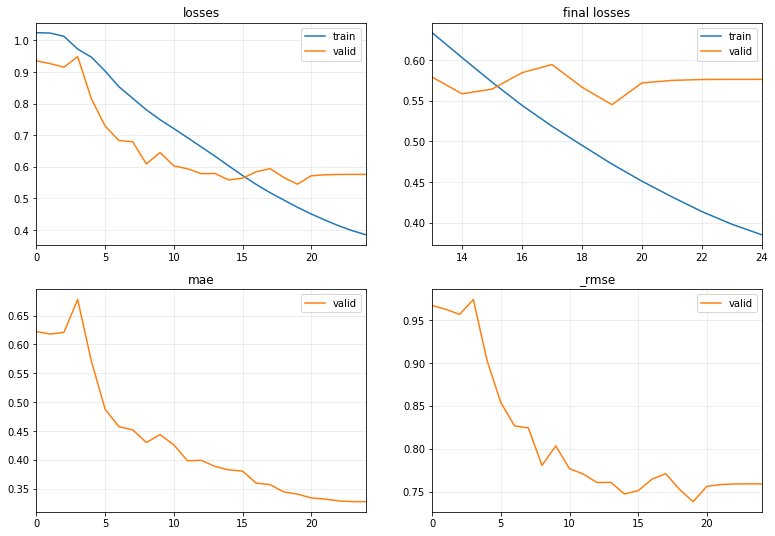

-IMF 1 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


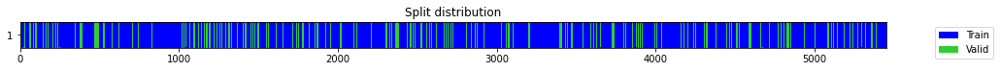

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.027626,0.939132,0.658802,0.969088,00:00
1,1.017954,0.925645,0.649429,0.962104,00:00
2,1.005503,0.908452,0.644718,0.953127,00:00
3,0.987709,0.972674,0.701366,0.986242,00:00
4,0.969562,0.781248,0.596647,0.883882,00:00
5,0.929747,0.755738,0.574041,0.869332,00:00
6,0.886195,0.683179,0.534774,0.826546,00:00
7,0.843960,0.674507,0.556560,0.821284,00:00
8,0.805585,0.647391,0.520499,0.804606,00:00
9,0.765090,0.589738,0.502024,0.767944,00:00


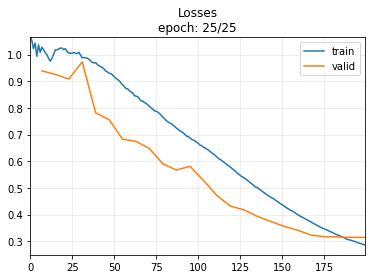

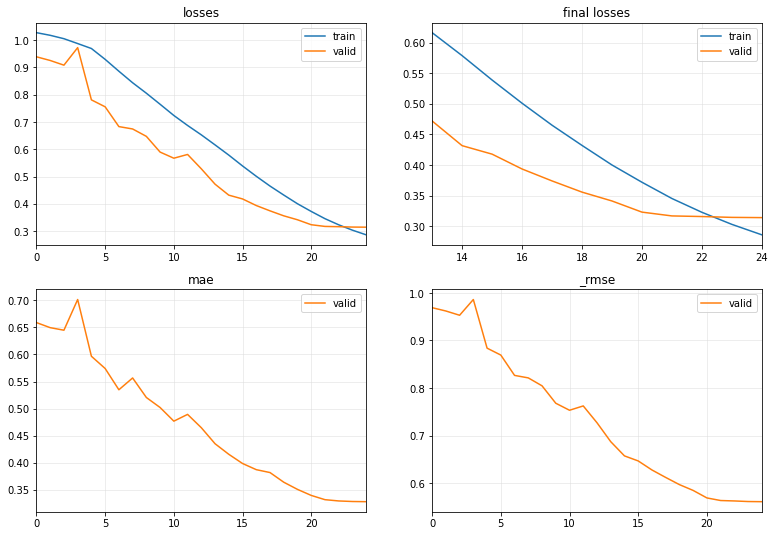

-IMF 2 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


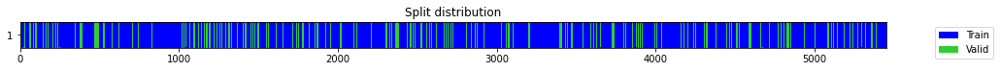

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.991000,0.987700,0.653943,0.993831,00:00
1,0.985933,0.950608,0.643454,0.974991,00:00
2,0.970454,0.903358,0.632290,0.950451,00:00
3,0.938120,0.844958,0.625283,0.919216,00:00
4,0.897065,0.692078,0.578537,0.831912,00:00
5,0.845779,0.640445,0.554701,0.800278,00:00
6,0.792991,0.605161,0.545811,0.777921,00:00
7,0.746676,0.564981,0.522242,0.751652,00:00
8,0.705108,0.539314,0.507475,0.734380,00:00
9,0.663278,0.474502,0.470056,0.688841,00:00


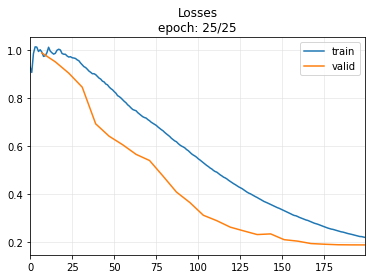

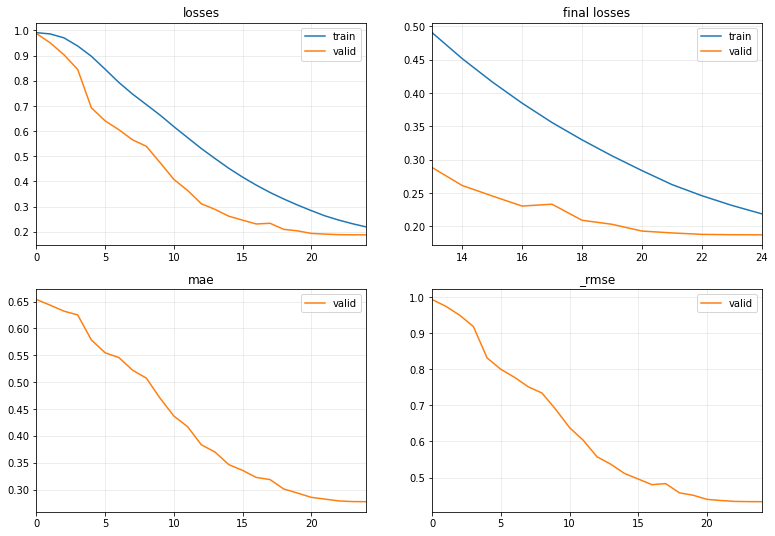

-IMF 3 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


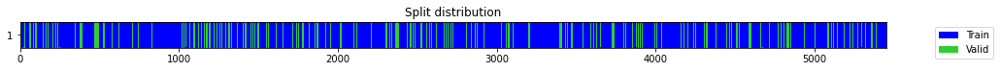

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.002171,0.992899,0.649575,0.996443,00:00
1,0.977069,0.933549,0.634575,0.966203,00:00
2,0.939929,0.867490,0.624309,0.931392,00:00
3,0.903121,0.782744,0.591088,0.884728,00:00
4,0.892113,0.822863,0.638961,0.907118,00:00
5,0.851948,0.696336,0.574372,0.834468,00:00
6,0.795095,0.579132,0.522288,0.761007,00:00
7,0.731739,0.516442,0.493023,0.718639,00:00
8,0.674548,0.491426,0.478392,0.701018,00:00
9,0.623861,0.453263,0.452371,0.673248,00:00


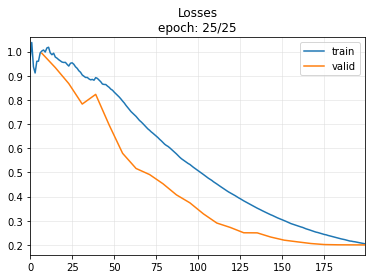

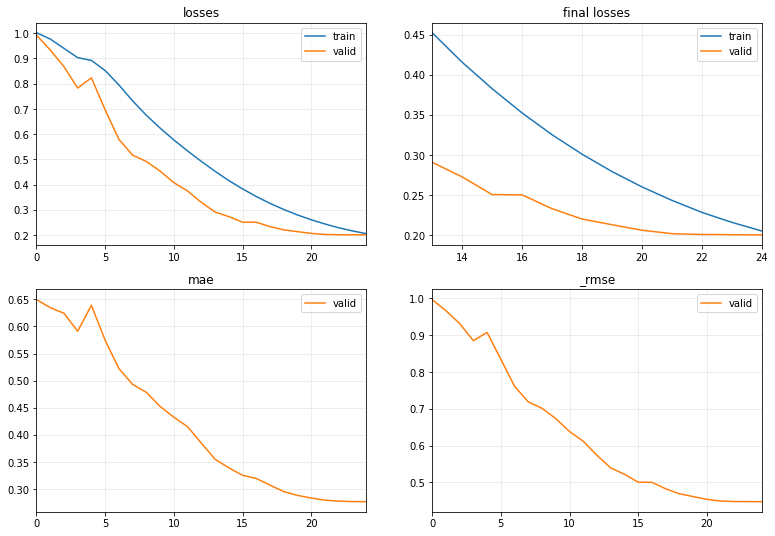

-IMF 4 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


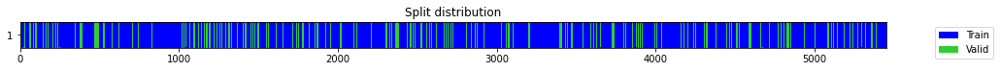

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.956360,1.039964,0.660711,1.019786,00:00
1,0.953687,0.953579,0.639457,0.976514,00:00
2,0.922007,0.858684,0.648425,0.926652,00:00
3,0.867499,0.746761,0.621262,0.864153,00:00
4,0.816583,0.676464,0.575180,0.822475,00:00
5,0.755947,0.591170,0.534917,0.768876,00:00
6,0.700248,0.523532,0.498546,0.723555,00:00
7,0.648590,0.498732,0.490667,0.706210,00:00
8,0.598621,0.431693,0.450781,0.657034,00:00
9,0.555138,0.406522,0.449857,0.637591,00:00


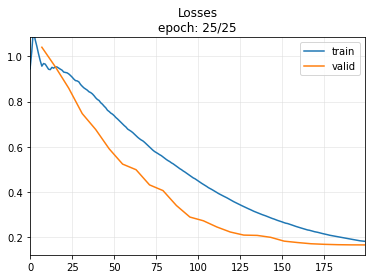

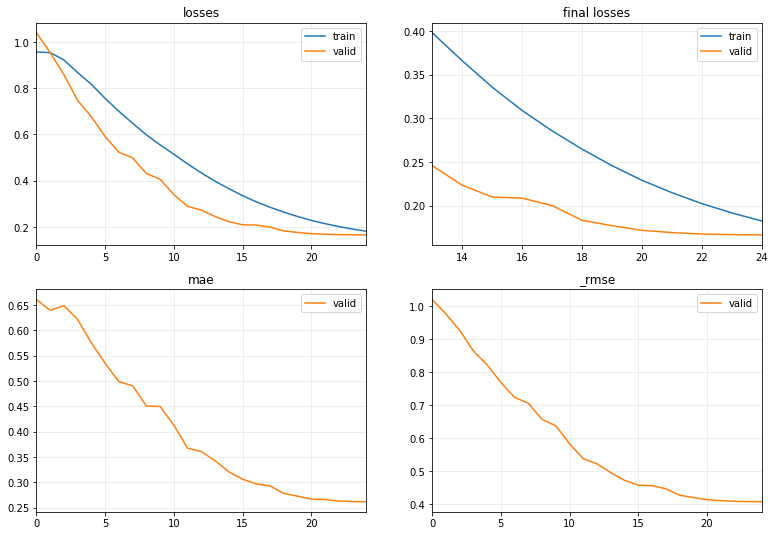

-IMF 5 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


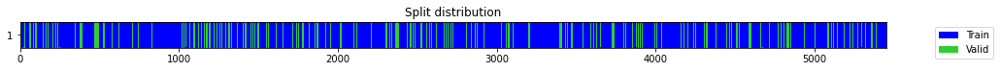

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.972483,1.081579,0.656030,1.039990,00:00
1,0.938586,0.956506,0.634974,0.978011,00:00
2,0.888055,0.822406,0.627816,0.906866,00:00
3,0.820812,0.761781,0.596846,0.872801,00:00
4,0.779054,0.644698,0.561320,0.802931,00:00
5,0.716761,0.543189,0.502284,0.737013,00:00
6,0.657286,0.570320,0.549891,0.755196,00:00
7,0.609771,0.441229,0.463079,0.664250,00:00
8,0.562326,0.381552,0.434483,0.617699,00:00
9,0.519153,0.346117,0.416884,0.588317,00:00


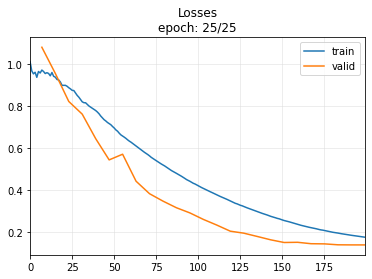

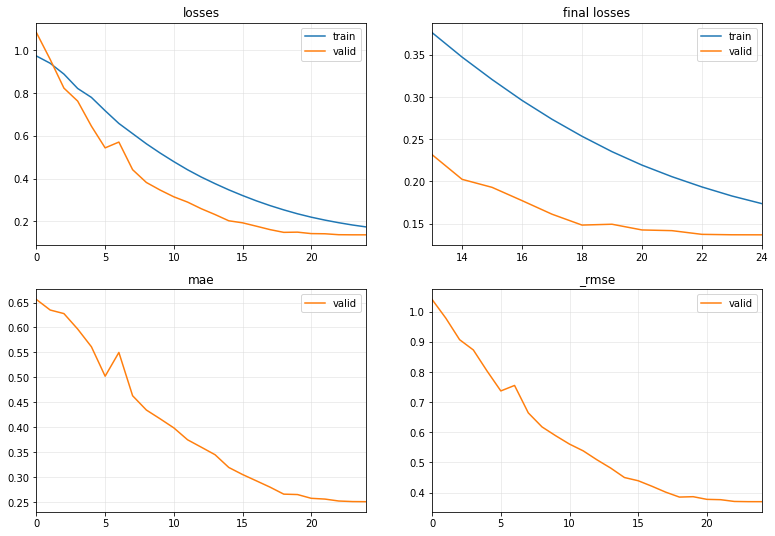

-IMF 6 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


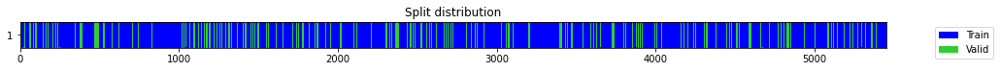

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.967490,0.971514,0.637338,0.985654,00:00
1,0.931526,0.789432,0.602214,0.888500,00:00
2,0.845808,0.694572,0.587308,0.833410,00:00
3,0.766901,0.609475,0.548377,0.780689,00:00
4,0.691848,0.510064,0.491779,0.714187,00:00
5,0.640800,0.502897,0.492108,0.709152,00:00
6,0.593449,0.420627,0.453908,0.648558,00:00
7,0.543927,0.386941,0.442119,0.622046,00:00
8,0.500866,0.309804,0.398115,0.556601,00:00
9,0.459947,0.279263,0.374635,0.528454,00:00


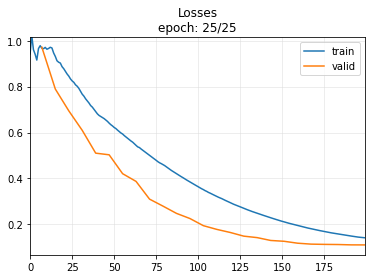

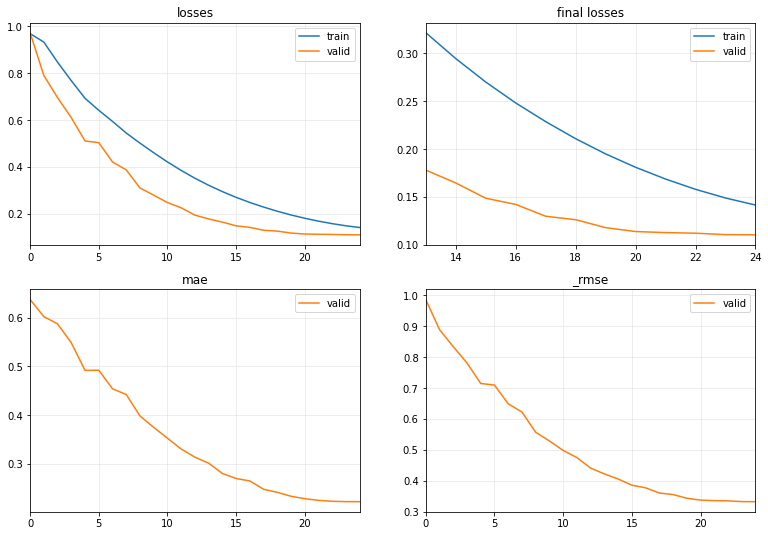

-IMF 7 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


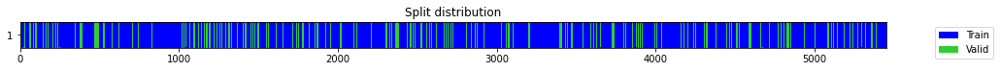

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.958006,1.080979,0.652233,1.039701,00:00
1,0.930073,0.866042,0.613307,0.930614,00:00
2,0.874698,0.748006,0.594640,0.864873,00:00
3,0.802234,0.605775,0.535530,0.778316,00:00
4,0.720521,0.427370,0.477469,0.653736,00:00
5,0.656245,0.438908,0.479101,0.662502,00:00
6,0.599418,0.373007,0.442298,0.610743,00:00
7,0.545808,0.312218,0.405794,0.558764,00:00
8,0.497224,0.281110,0.385165,0.530198,00:00
9,0.454008,0.261615,0.369710,0.511483,00:00


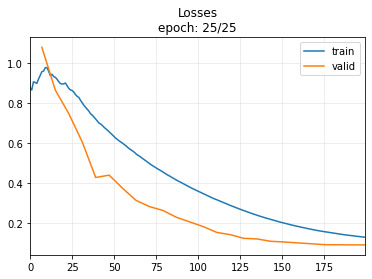

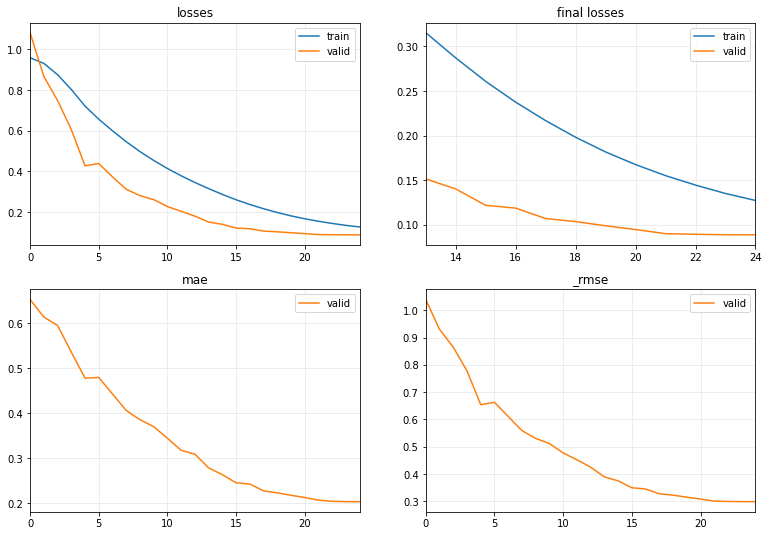

-IMF 8 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


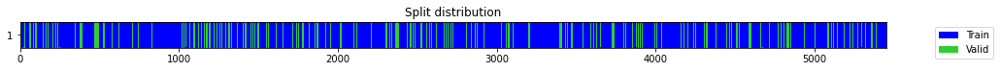

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.945421,1.115695,0.645115,1.056265,00:00
1,0.921303,1.000943,0.624404,1.000471,00:00
2,0.842832,0.899294,0.599602,0.948311,00:00
3,0.751921,0.621817,0.531550,0.788554,00:00
4,0.661876,0.488168,0.469038,0.698690,00:00
5,0.590270,0.396917,0.441663,0.630014,00:00
6,0.530310,0.336523,0.400135,0.580106,00:00
7,0.478261,0.313681,0.390256,0.560073,00:00
8,0.435209,0.256298,0.346886,0.506259,00:00
9,0.393424,0.228121,0.325011,0.477620,00:00


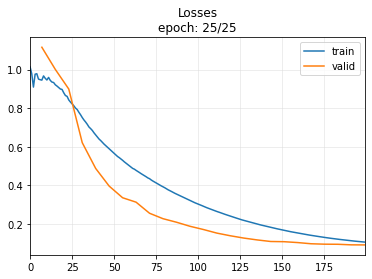

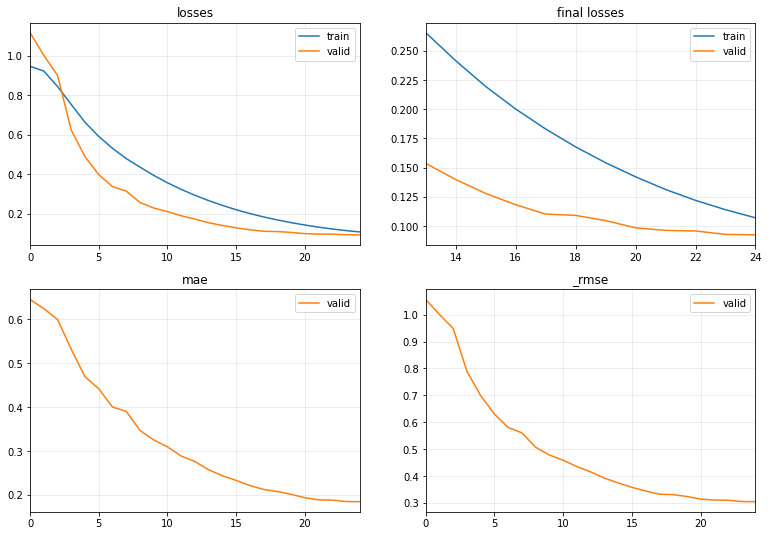

-IMF 9 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


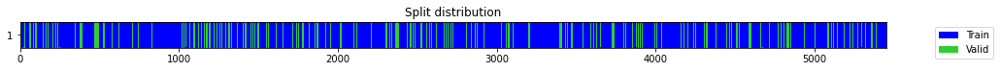

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.004398,0.978182,0.646528,0.989031,00:00
1,0.953646,0.778980,0.599444,0.882598,00:00
2,0.832452,0.636807,0.549905,0.798002,00:00
3,0.729147,0.517573,0.488647,0.719425,00:00
4,0.646046,0.404628,0.441809,0.636104,00:00
5,0.578701,0.352865,0.423770,0.594024,00:00
6,0.516633,0.262498,0.371719,0.512345,00:00
7,0.471708,0.256156,0.373597,0.506118,00:00
8,0.426710,0.224118,0.355023,0.473411,00:00
9,0.382875,0.162559,0.294959,0.403186,00:00


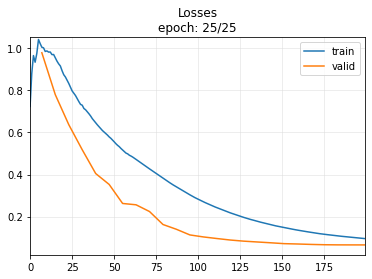

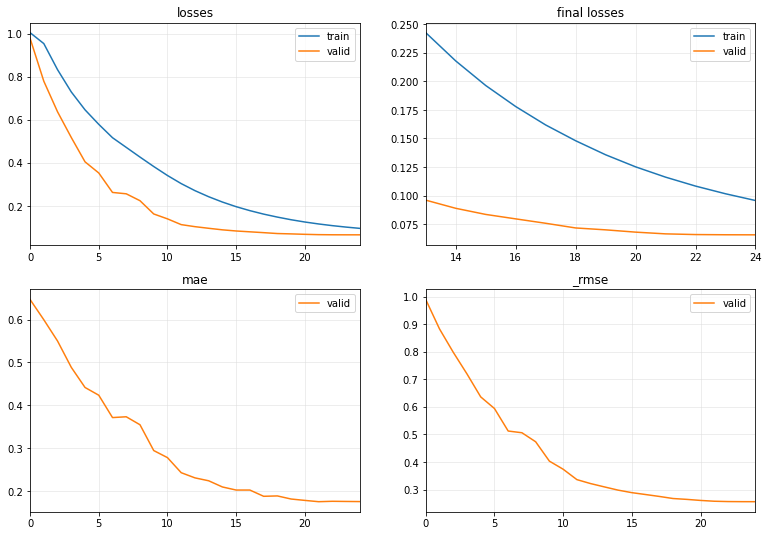

-IMF 10 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


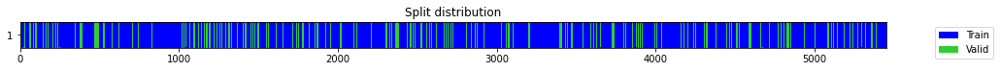

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.986201,0.972128,0.632369,0.985965,00:00
1,0.948462,0.759752,0.577305,0.871638,00:00
2,0.821851,0.609958,0.541568,0.780998,00:00
3,0.714097,0.508833,0.480085,0.713326,00:00
4,0.634315,0.434715,0.453792,0.659329,00:00
5,0.565910,0.381222,0.428131,0.617432,00:00
6,0.507968,0.291643,0.378083,0.540040,00:00
7,0.454731,0.224233,0.340320,0.473533,00:00
8,0.403356,0.181400,0.306725,0.425911,00:00
9,0.357579,0.153651,0.275478,0.391984,00:00


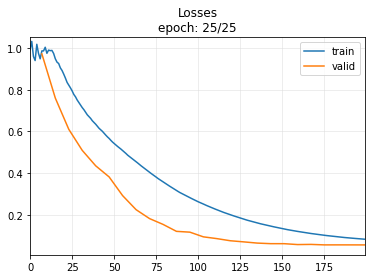

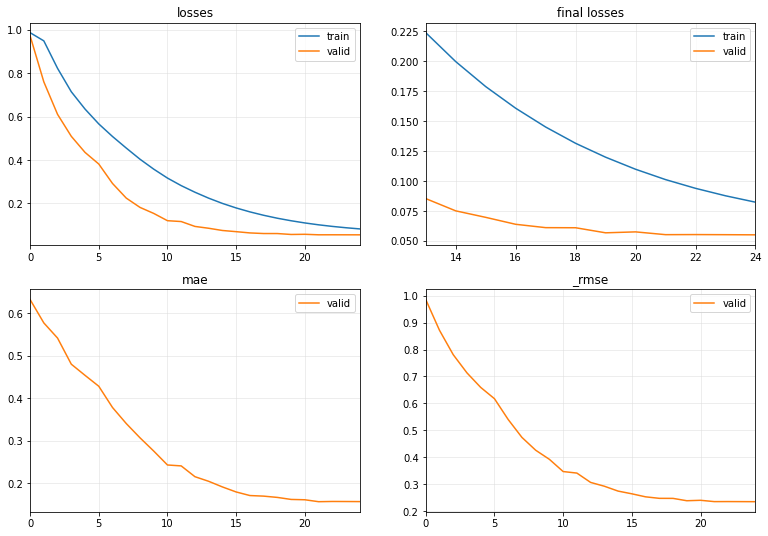

-IMF 11 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


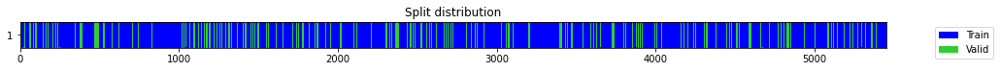

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.972397,1.043494,0.668263,1.021515,00:00
1,0.921801,0.813463,0.605303,0.901922,00:00
2,0.811496,0.630657,0.550840,0.794139,00:00
3,0.705054,0.502354,0.484806,0.708770,00:00
4,0.624081,0.427606,0.468169,0.653916,00:00
5,0.552751,0.309572,0.395133,0.556392,00:00
6,0.493029,0.247791,0.347484,0.497786,00:00
7,0.439386,0.206324,0.321833,0.454229,00:00
8,0.390232,0.171262,0.291132,0.413838,00:00
9,0.345847,0.147477,0.274400,0.384027,00:00


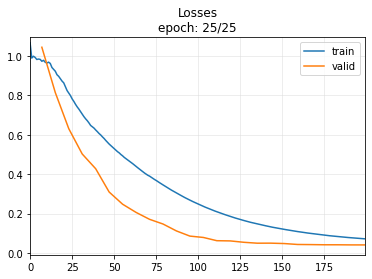

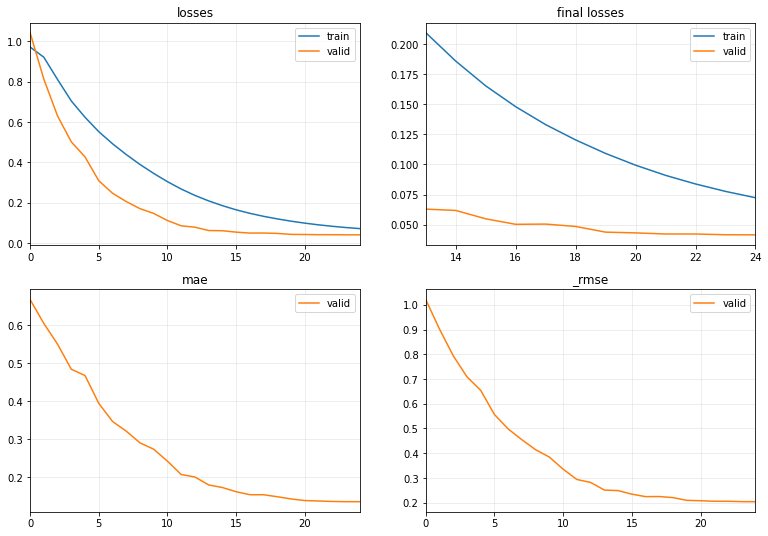

-IMF 12 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


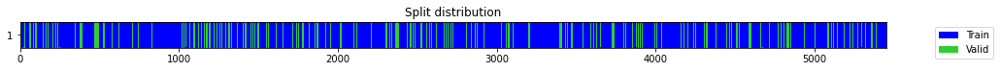

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.947778,1.044118,0.658371,1.021821,00:00
1,0.916219,0.796629,0.610709,0.892541,00:00
2,0.815802,0.515860,0.501694,0.718234,00:00
3,0.715989,0.427265,0.449622,0.653655,00:00
4,0.629358,0.343637,0.421848,0.586205,00:00
5,0.552388,0.295578,0.393996,0.543670,00:00
6,0.484581,0.223498,0.335976,0.472756,00:00
7,0.425674,0.191699,0.314938,0.437835,00:00
8,0.372814,0.135791,0.262153,0.368498,00:00
9,0.326292,0.121787,0.243630,0.348980,00:00


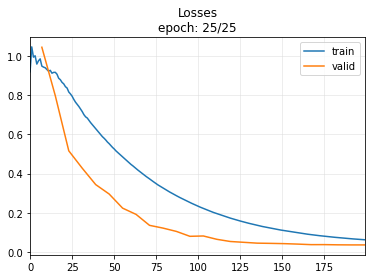

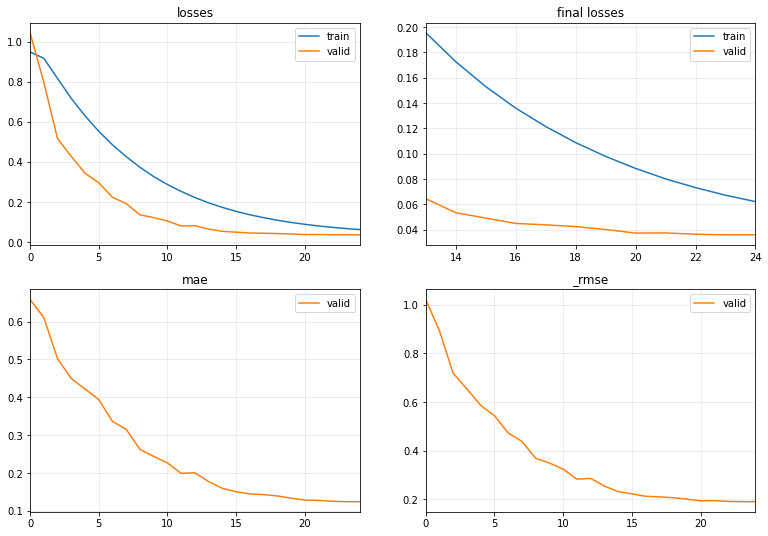

-IMF 13 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


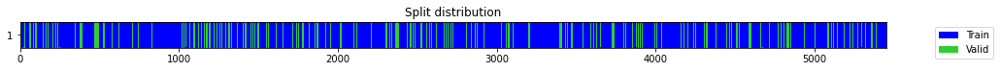

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.939987,1.103249,0.688672,1.050357,00:00
1,0.904573,0.861423,0.625909,0.928128,00:00
2,0.781902,0.598110,0.553977,0.773376,00:00
3,0.676856,0.411457,0.472820,0.641449,00:00
4,0.578755,0.317353,0.409931,0.563341,00:00
5,0.499026,0.301968,0.393466,0.549516,00:00
6,0.435954,0.204857,0.318166,0.452612,00:00
7,0.380364,0.155916,0.282249,0.394863,00:00
8,0.331032,0.120604,0.243366,0.347281,00:00
9,0.289380,0.097366,0.216299,0.312036,00:00


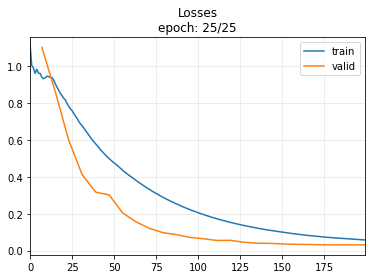

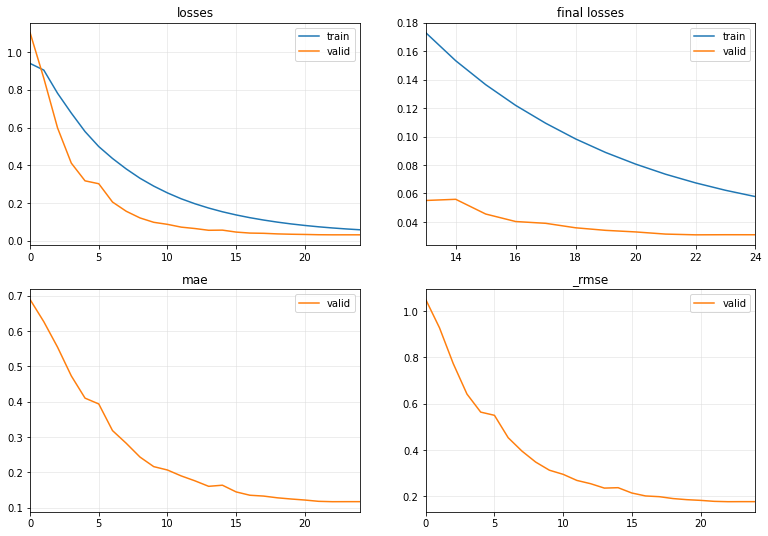

-IMF 14 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


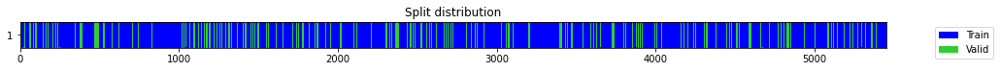

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.968913,0.975189,0.637477,0.987516,00:00
1,0.879755,0.649576,0.560598,0.805963,00:00
2,0.740060,0.461952,0.484503,0.679670,00:00
3,0.637345,0.390732,0.430716,0.625086,00:00
4,0.555183,0.325700,0.407955,0.570701,00:00
5,0.480265,0.227105,0.338273,0.476555,00:00
6,0.414973,0.206174,0.320845,0.454064,00:00
7,0.361222,0.141165,0.264701,0.375719,00:00
8,0.314257,0.107298,0.232342,0.327564,00:00
9,0.273498,0.086914,0.204897,0.294812,00:00


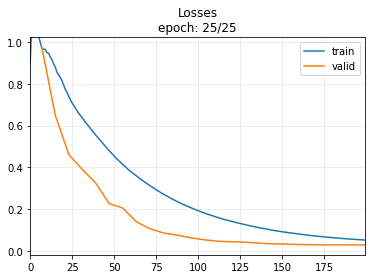

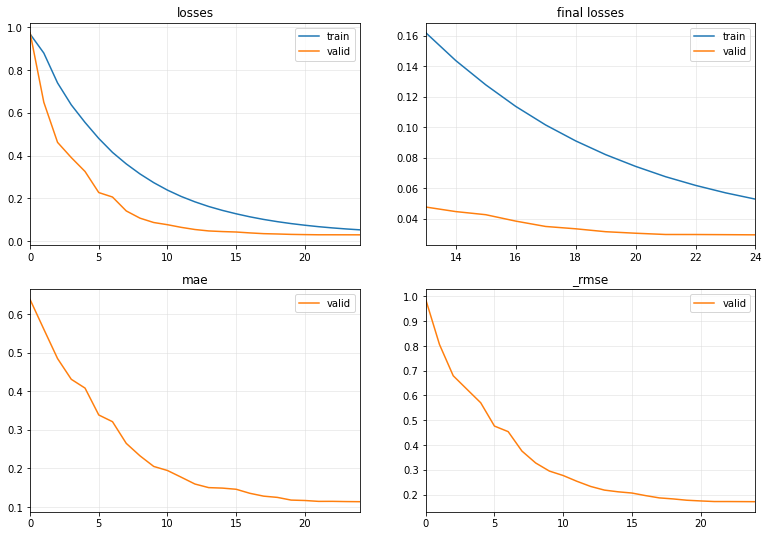

-IMF 15 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


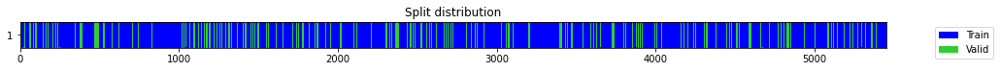

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.982686,0.923335,0.621735,0.960903,00:00
1,0.882795,0.531946,0.517713,0.729347,00:00
2,0.717582,0.383485,0.438221,0.619262,00:00
3,0.607967,0.345419,0.417698,0.587723,00:00
4,0.524001,0.282651,0.391871,0.531649,00:00
5,0.452763,0.193951,0.316454,0.440399,00:00
6,0.388998,0.149215,0.281653,0.386284,00:00
7,0.333675,0.133608,0.267112,0.365524,00:00
8,0.290423,0.090881,0.213983,0.301465,00:00
9,0.251094,0.068116,0.176734,0.260990,00:00


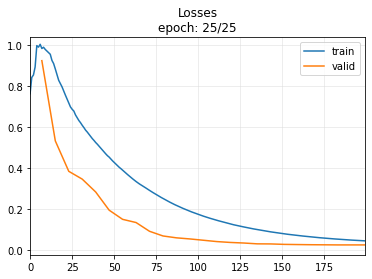

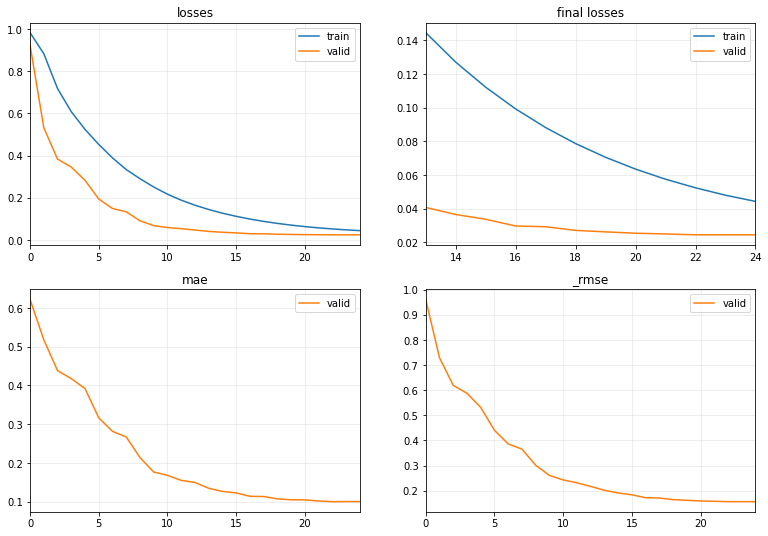

-IMF 16 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


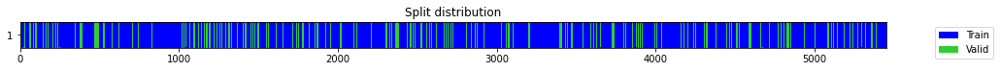

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.937060,1.012134,0.621821,1.006049,00:00
1,0.821298,0.479319,0.483945,0.692329,00:00
2,0.675090,0.450139,0.455524,0.670924,00:00
3,0.571777,0.309101,0.391035,0.555969,00:00
4,0.493298,0.252564,0.351981,0.502557,00:00
5,0.432835,0.203705,0.315527,0.451337,00:00
6,0.373992,0.148539,0.271136,0.385407,00:00
7,0.322561,0.117633,0.235735,0.342977,00:00
8,0.278891,0.110255,0.220801,0.332046,00:00
9,0.240275,0.070235,0.169168,0.265019,00:00


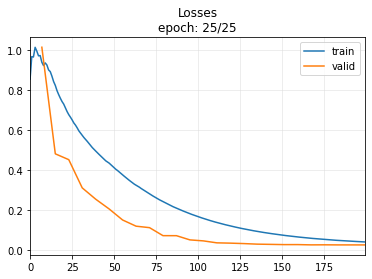

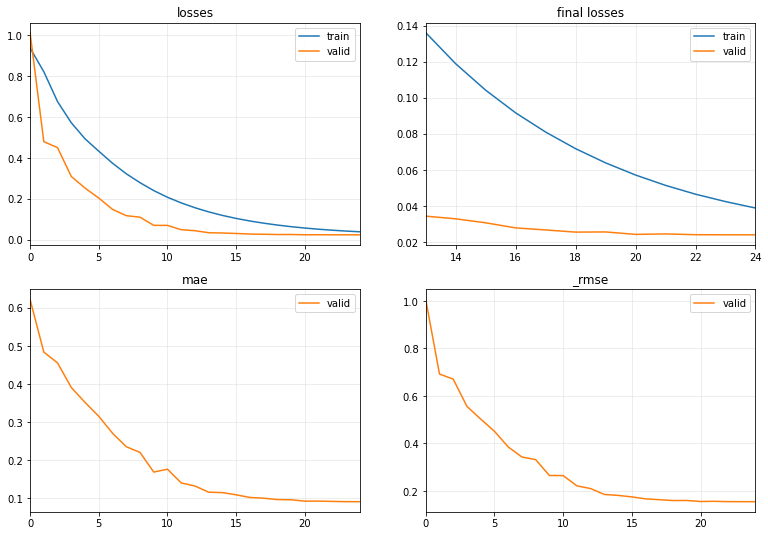

-IMF 17 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


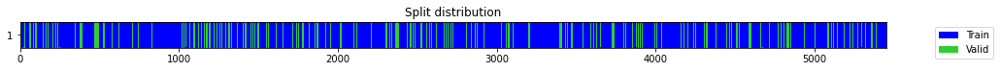

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.952004,0.858675,0.617849,0.926647,00:00
1,0.820611,0.482297,0.487895,0.694476,00:00
2,0.681858,0.402887,0.414445,0.634733,00:00
3,0.578839,0.296973,0.374181,0.544952,00:00
4,0.494650,0.243215,0.342255,0.493168,00:00
5,0.427041,0.173626,0.286240,0.416685,00:00
6,0.365049,0.109946,0.227510,0.331582,00:00
7,0.310616,0.088610,0.204667,0.297675,00:00
8,0.265375,0.069827,0.170437,0.264249,00:00
9,0.227634,0.073145,0.181486,0.270453,00:00


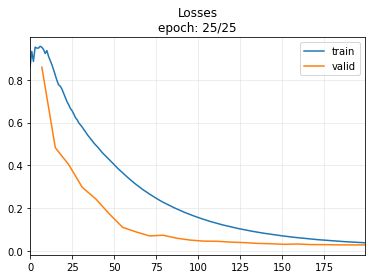

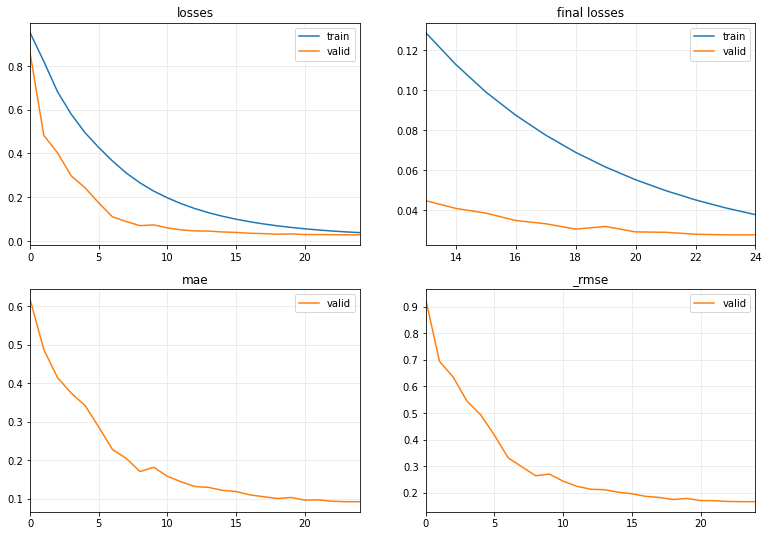

-IMF 18 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


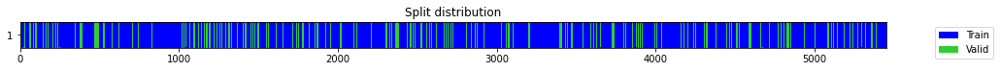

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.927641,1.050284,0.631564,1.024834,00:00
1,0.802305,0.698913,0.516075,0.836010,00:00
2,0.663839,0.456133,0.414320,0.675376,00:00
3,0.550408,0.372718,0.394577,0.610506,00:00
4,0.466711,0.261521,0.326250,0.511392,00:00
5,0.399731,0.185132,0.281187,0.430270,00:00
6,0.345653,0.188869,0.273737,0.434590,00:00
7,0.304890,0.167395,0.246298,0.409140,00:00
8,0.266600,0.126797,0.231265,0.356086,00:00
9,0.233430,0.090639,0.200838,0.301063,00:00


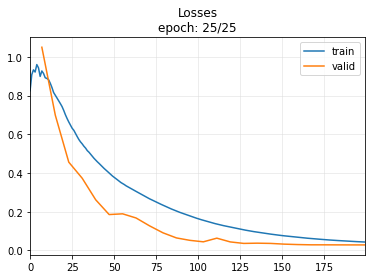

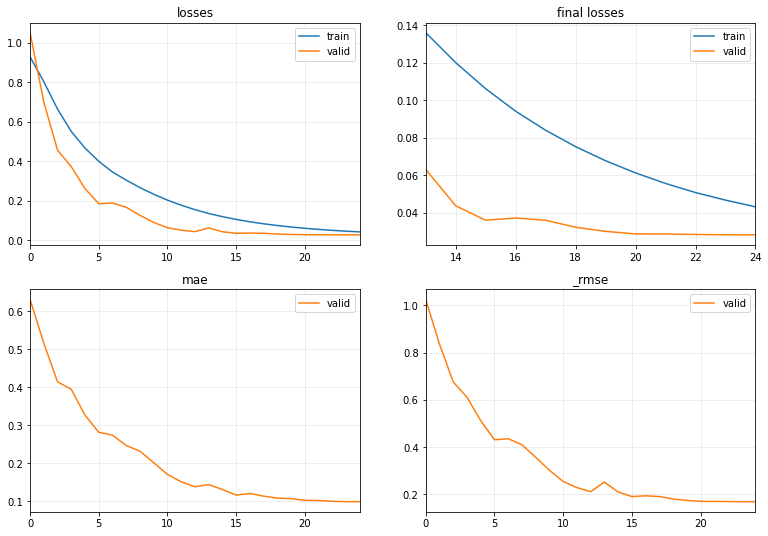

-IMF 19 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


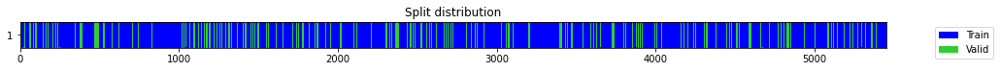

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.908539,1.030204,0.634943,1.014990,00:00
1,0.777705,0.592952,0.482997,0.770034,00:00
2,0.621179,0.383928,0.395383,0.619619,00:00
3,0.507148,0.274506,0.331850,0.523934,00:00
4,0.421287,0.233493,0.288029,0.483211,00:00
5,0.355809,0.171793,0.261083,0.414479,00:00
6,0.303566,0.143728,0.237336,0.379115,00:00
7,0.263443,0.143430,0.216715,0.378721,00:00
8,0.226987,0.115619,0.195190,0.340028,00:00
9,0.195892,0.075373,0.154118,0.274541,00:00


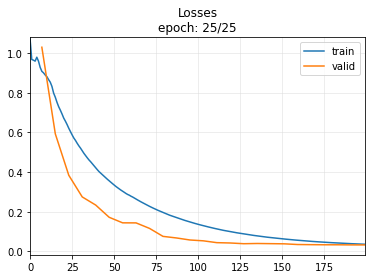

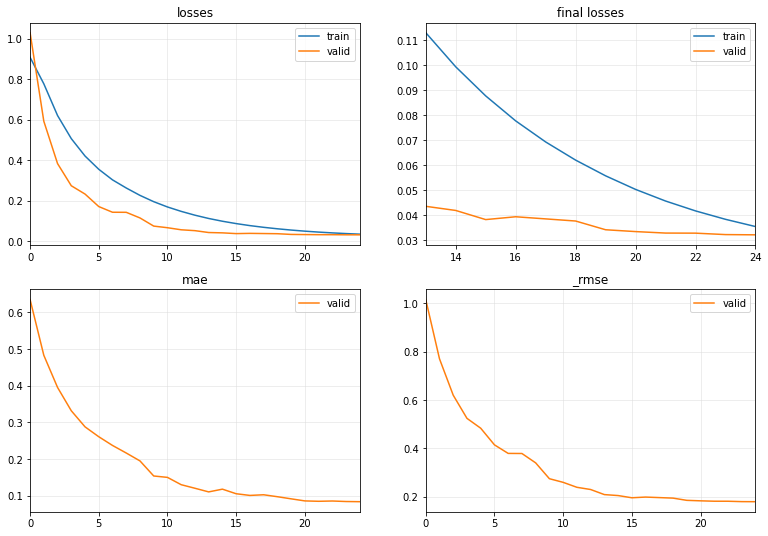

-IMF 20 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


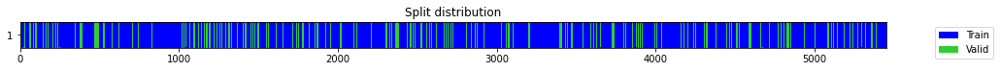

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.934732,1.033352,0.633250,1.016539,00:00
1,0.786220,0.434682,0.424183,0.659304,00:00
2,0.622821,0.303599,0.352992,0.550998,00:00
3,0.500884,0.159493,0.282965,0.399366,00:00
4,0.406231,0.122971,0.233262,0.350673,00:00
5,0.337574,0.094024,0.195547,0.306634,00:00
6,0.283741,0.080253,0.184660,0.283289,00:00
7,0.241712,0.068550,0.165867,0.261820,00:00
8,0.205721,0.056763,0.151307,0.238250,00:00
9,0.176022,0.048813,0.144156,0.220937,00:00


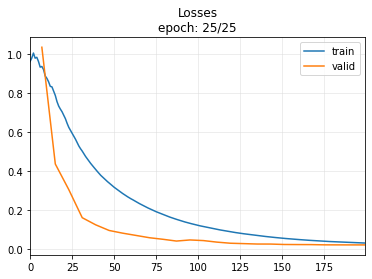

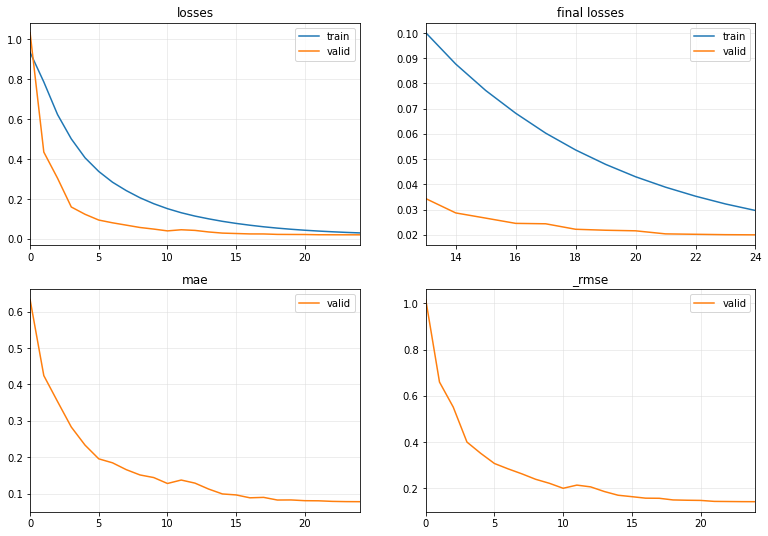

-IMF 21 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


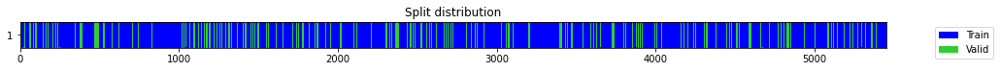

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.927941,0.934910,0.605583,0.966907,00:00
1,0.731583,0.394739,0.443726,0.628283,00:00
2,0.575392,0.243672,0.315955,0.493631,00:00
3,0.453500,0.106256,0.204420,0.325969,00:00
4,0.361100,0.098697,0.204843,0.314161,00:00
5,0.294217,0.078865,0.179096,0.280829,00:00
6,0.243203,0.069919,0.160751,0.264422,00:00
7,0.203945,0.053930,0.131583,0.232229,00:00
8,0.173595,0.043596,0.130850,0.208795,00:00
9,0.148478,0.042153,0.117839,0.205311,00:00


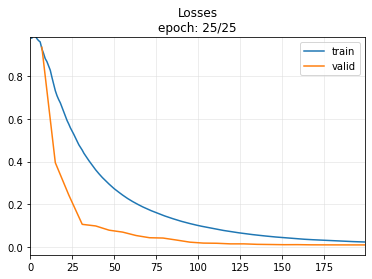

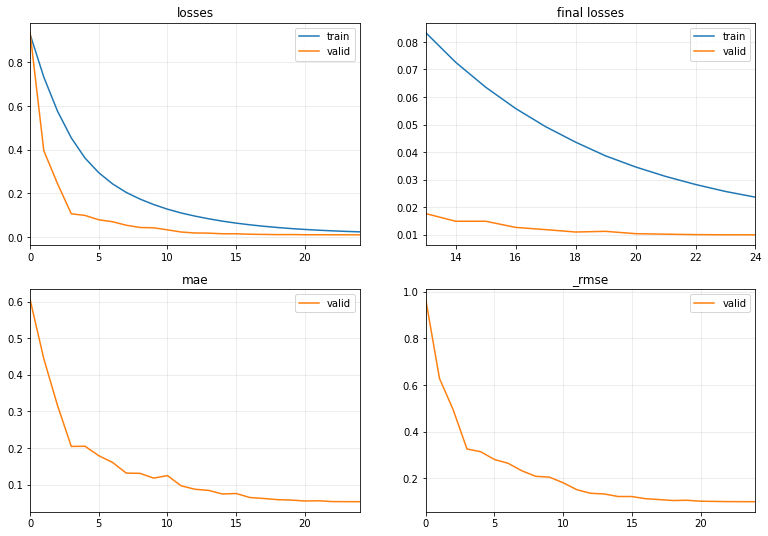

-IMF 22 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


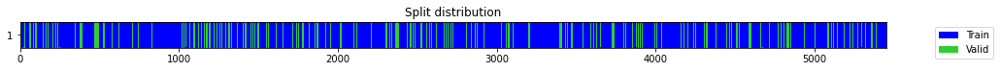

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.942146,0.880946,0.597793,0.938587,00:00
1,0.743849,0.309654,0.384304,0.556465,00:00
2,0.578805,0.281693,0.327587,0.530747,00:00
3,0.466574,0.134577,0.265062,0.366847,00:00
4,0.368850,0.072947,0.172001,0.270088,00:00
5,0.294819,0.061977,0.173857,0.248952,00:00
6,0.240643,0.045410,0.129166,0.213097,00:00
7,0.198615,0.042737,0.137160,0.206729,00:00
8,0.166184,0.028507,0.089018,0.168839,00:00
9,0.140467,0.027625,0.092011,0.166207,00:00


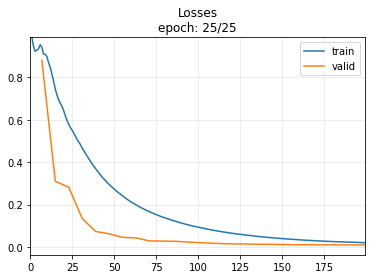

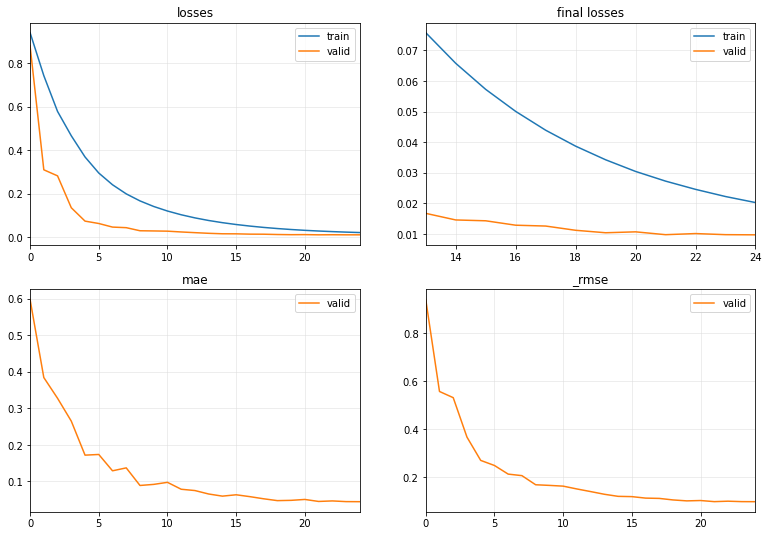

-IMF 23 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


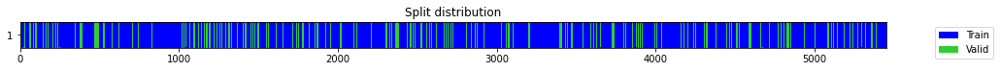

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.909104,0.835148,0.583633,0.913864,00:00
1,0.676977,0.338538,0.426675,0.581841,00:00
2,0.511371,0.240720,0.310059,0.490633,00:00
3,0.399329,0.116530,0.223172,0.341364,00:00
4,0.313132,0.079581,0.208137,0.282102,00:00
5,0.250334,0.032316,0.123399,0.179767,00:00
6,0.201733,0.026915,0.112978,0.164057,00:00
7,0.164851,0.018637,0.090129,0.136517,00:00
8,0.135897,0.014719,0.077365,0.121322,00:00
9,0.113424,0.012346,0.068028,0.111111,00:00


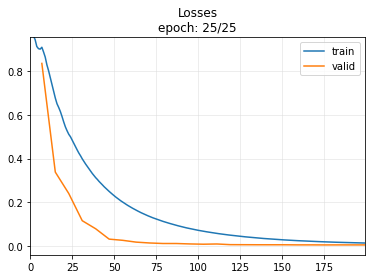

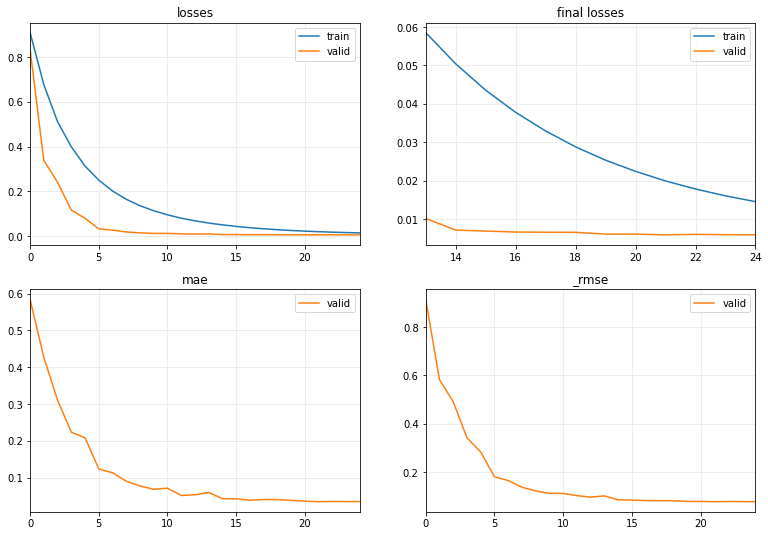

-IMF 24 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


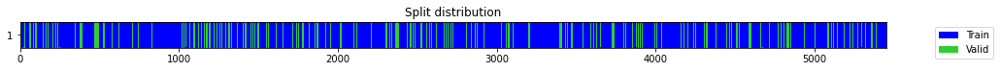

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.915657,0.744928,0.586923,0.863092,00:00
1,0.672174,0.323275,0.412437,0.568573,00:00
2,0.500863,0.213394,0.323965,0.461946,00:00
3,0.383679,0.109562,0.208669,0.331002,00:00
4,0.302566,0.083572,0.189851,0.289087,00:00
5,0.244998,0.059330,0.154815,0.243578,00:00
6,0.197859,0.027990,0.099535,0.167302,00:00
7,0.161399,0.022464,0.089425,0.149881,00:00
8,0.132683,0.013834,0.065199,0.117619,00:00
9,0.109817,0.009750,0.051183,0.098741,00:00


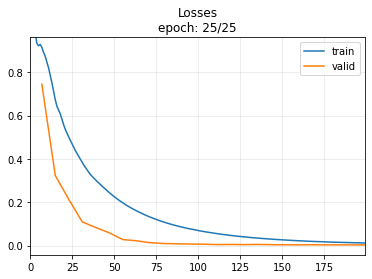

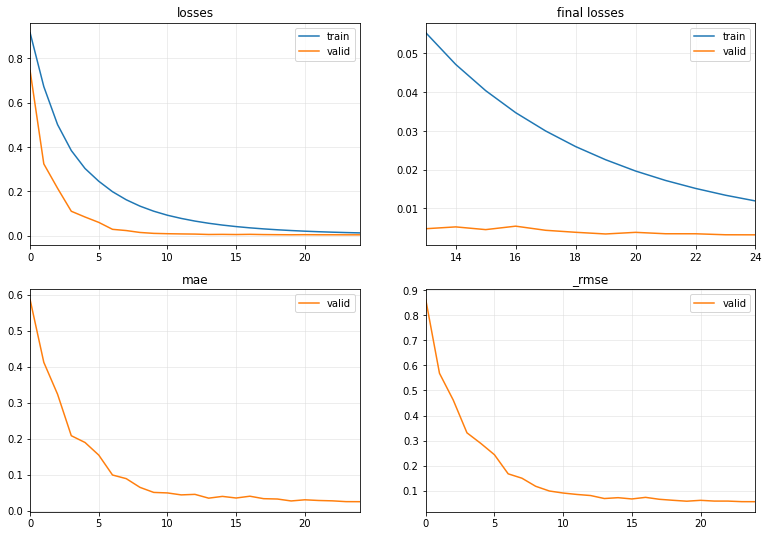

-IMF 25 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


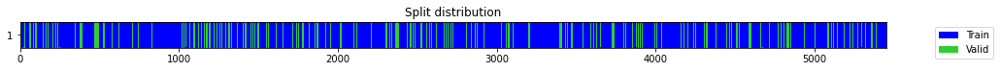

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.873829,0.610568,0.541537,0.781389,00:00
1,0.624723,0.195111,0.304836,0.441714,00:00
2,0.455001,0.158923,0.302157,0.398651,00:00
3,0.341506,0.060164,0.178377,0.245284,00:00
4,0.263817,0.036598,0.141567,0.191306,00:00
5,0.208659,0.030181,0.132065,0.173727,00:00
6,0.166824,0.014173,0.087017,0.119049,00:00
7,0.135004,0.006328,0.053420,0.079549,00:00
8,0.110217,0.004306,0.040572,0.065619,00:00
9,0.090757,0.003356,0.036895,0.057934,00:00


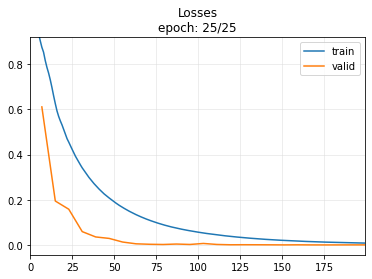

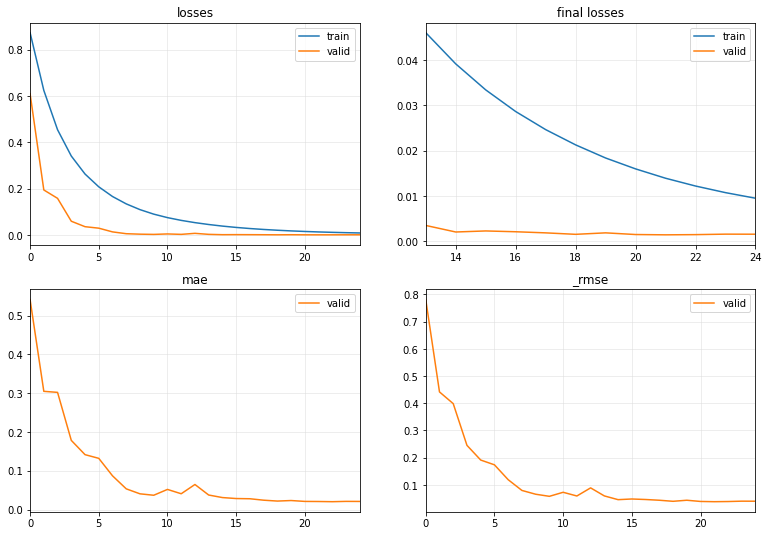

-IMF 26 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


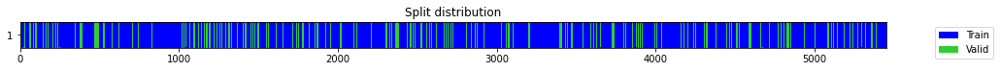

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.853087,0.615150,0.550771,0.784315,00:00
1,0.611328,0.184095,0.334978,0.429063,00:00
2,0.443453,0.121032,0.256671,0.347897,00:00
3,0.326658,0.027705,0.121645,0.166450,00:00
4,0.246774,0.024814,0.107025,0.157525,00:00
5,0.191664,0.008466,0.061243,0.092011,00:00
6,0.151664,0.005863,0.051540,0.076567,00:00
7,0.122147,0.008906,0.064490,0.094374,00:00
8,0.100241,0.010774,0.074758,0.103799,00:00
9,0.082738,0.002927,0.035327,0.054099,00:00


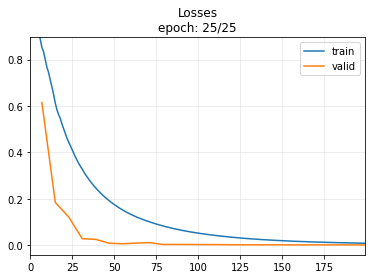

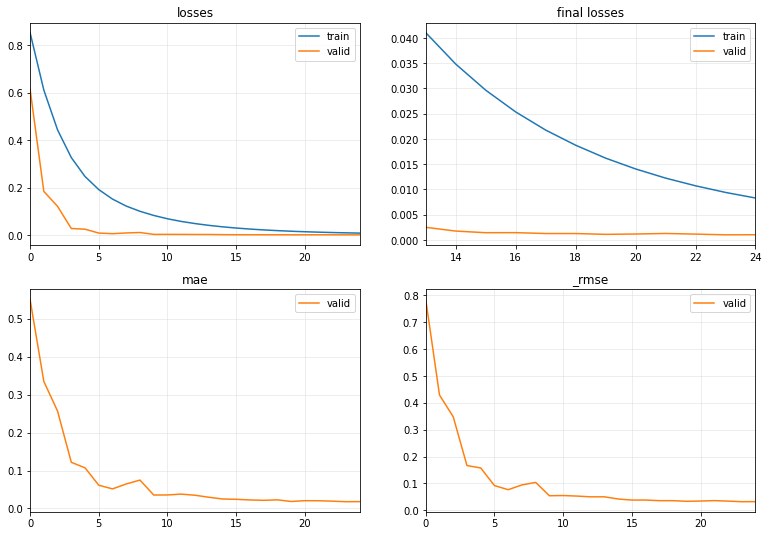

-IMF 27 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


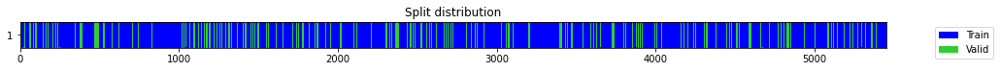

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.898984,0.782936,0.529745,0.884837,00:00
1,0.630192,0.401740,0.479932,0.633829,00:00
2,0.460973,0.201835,0.248292,0.449260,00:00
3,0.345323,0.068974,0.149655,0.262629,00:00
4,0.265232,0.047146,0.133847,0.217130,00:00
5,0.207141,0.031107,0.094987,0.176371,00:00
6,0.165040,0.018357,0.075122,0.135488,00:00
7,0.133257,0.015235,0.060797,0.123430,00:00
8,0.108882,0.010314,0.053255,0.101559,00:00
9,0.089953,0.008793,0.054610,0.093773,00:00


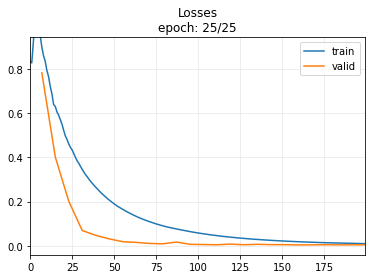

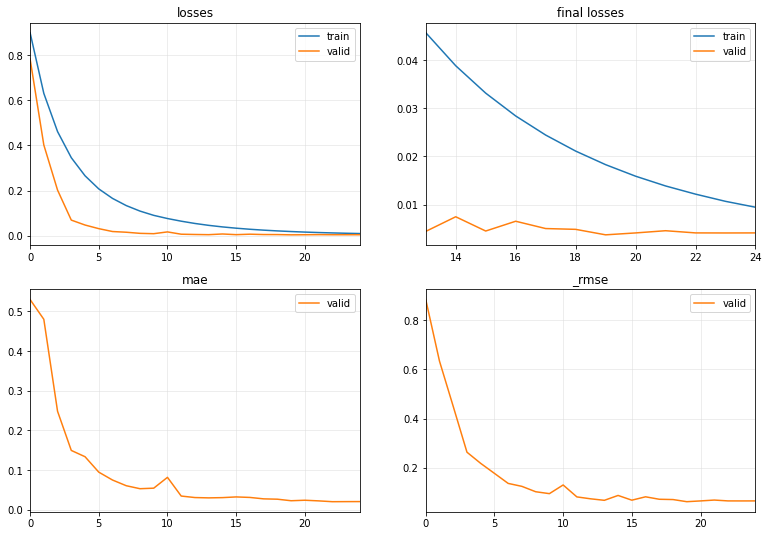

-IMF 28 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


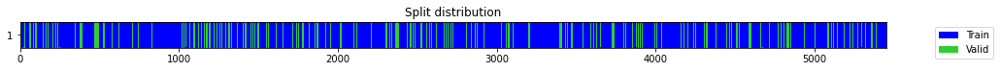

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.038446,0.408771,0.353969,0.639352,00:00
1,0.764863,0.349028,0.425005,0.590786,00:00
2,0.555018,0.054821,0.165604,0.234138,00:00
3,0.405418,0.016100,0.099950,0.126885,00:00
4,0.305558,0.013971,0.071296,0.118197,00:00
5,0.236465,0.021822,0.107524,0.147722,00:00
6,0.187139,0.011652,0.059280,0.107947,00:00
7,0.150652,0.003518,0.040212,0.059315,00:00
8,0.122004,0.004911,0.031723,0.070078,00:00
9,0.100823,0.005113,0.045844,0.071508,00:00


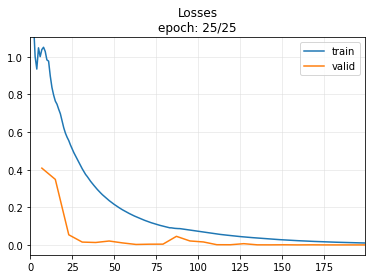

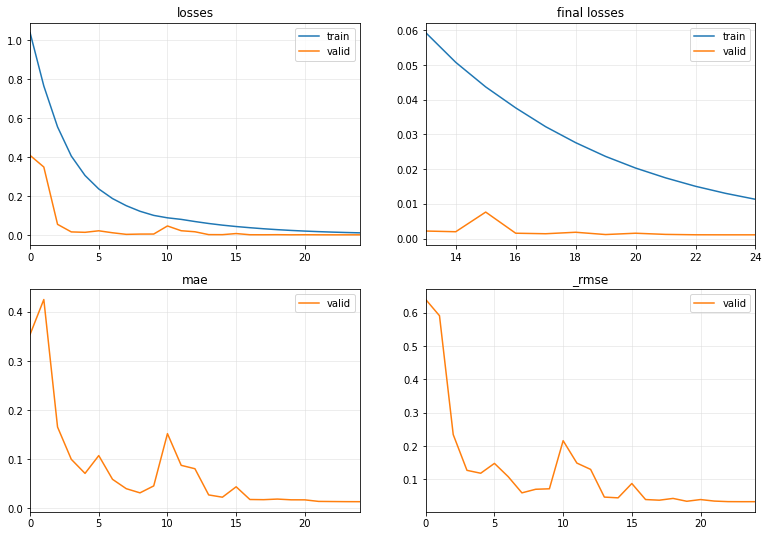

-IMF 29 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


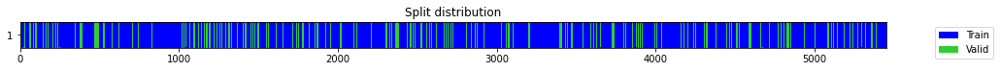

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.820209,0.504757,0.619397,0.710462,00:00
1,0.505643,0.189587,0.382992,0.435416,00:00
2,0.348282,0.021867,0.123003,0.147875,00:00
3,0.250917,0.009104,0.073649,0.095413,00:00
4,0.186881,0.010270,0.086144,0.101342,00:00
5,0.143239,0.001776,0.033435,0.042137,00:00
6,0.112242,0.001001,0.025650,0.031636,00:00
7,0.089480,0.000713,0.021680,0.026703,00:00
8,0.072307,0.000542,0.018495,0.023288,00:00
9,0.059069,0.000605,0.020523,0.024606,00:00


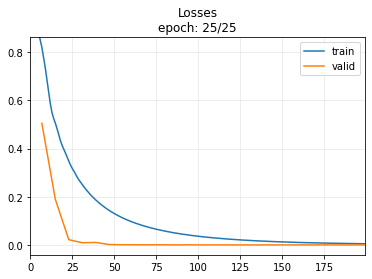

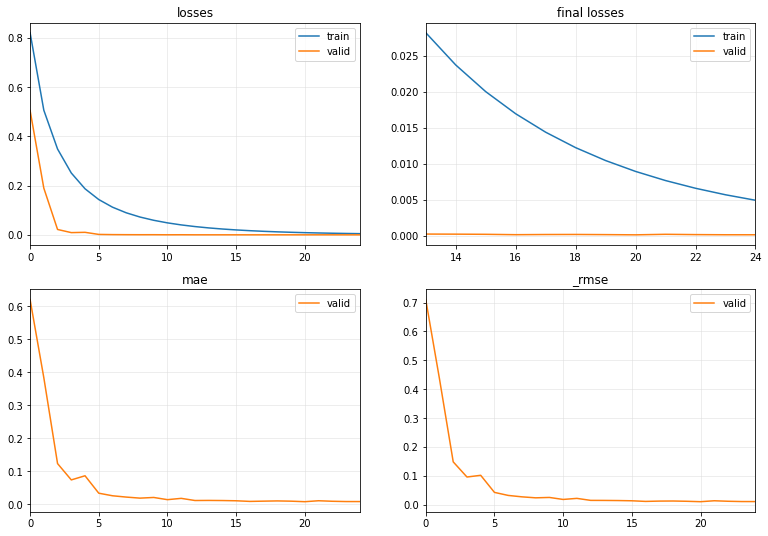

-IMF 30 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


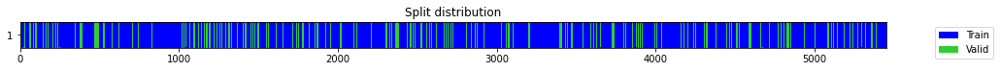

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.734182,0.242895,0.394934,0.492843,00:00
1,0.427443,0.037525,0.156208,0.193715,00:00
2,0.296466,0.077434,0.246462,0.278270,00:00
3,0.215672,0.036017,0.165481,0.189783,00:00
4,0.162299,0.007868,0.071443,0.088700,00:00
5,0.124712,0.002732,0.037064,0.052268,00:00
6,0.097870,0.002386,0.040169,0.048849,00:00
7,0.078085,0.000680,0.021398,0.026079,00:00
8,0.063106,0.000646,0.021109,0.025421,00:00
9,0.051526,0.000327,0.014107,0.018077,00:00


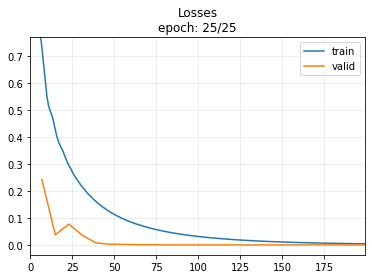

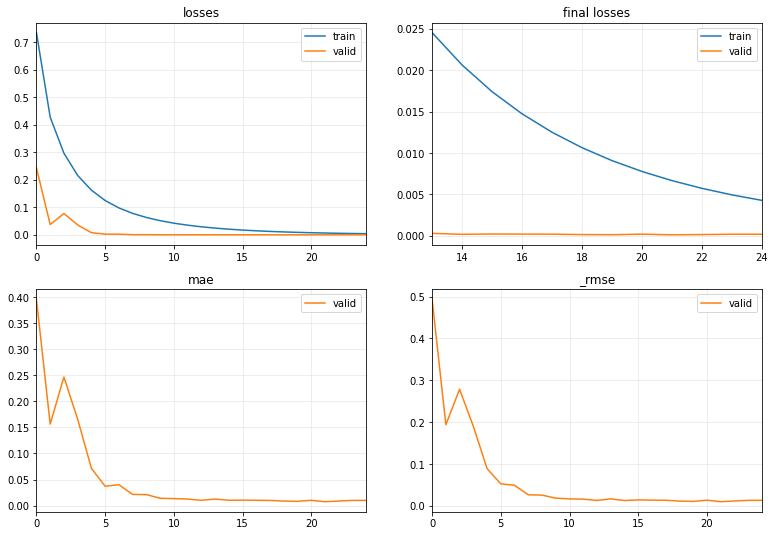

-IMF 31 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


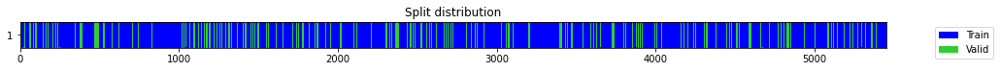

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.991098,1.004122,0.662106,1.002059,00:00
1,0.974302,0.964675,0.641344,0.982179,00:00
2,0.952937,0.906841,0.621621,0.952282,00:00
3,0.937382,0.917841,0.624721,0.958040,00:00
4,0.918731,0.875610,0.610914,0.935740,00:00
5,0.895182,0.852744,0.602832,0.923442,00:00
6,0.869410,0.839316,0.594988,0.916142,00:00
7,0.851471,0.819309,0.587137,0.905157,00:00
8,0.829793,0.809964,0.580438,0.899980,00:00
9,0.811139,0.788975,0.574410,0.888243,00:00


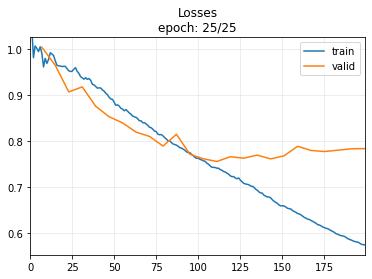

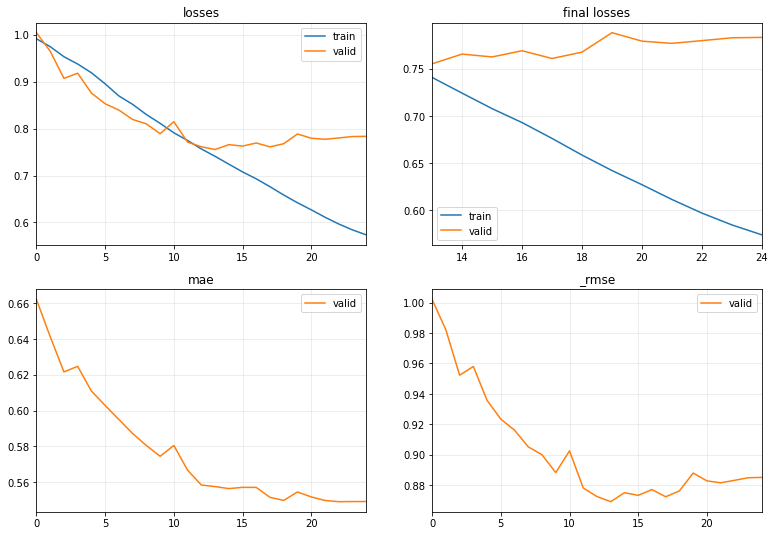

Targets and Predictions shapes (1363,) (1363,)
LSTMPlus : MAPE =  1.4343232188196762 MAE =  0.13260579328342517 RMSE =  0.16362503228081496


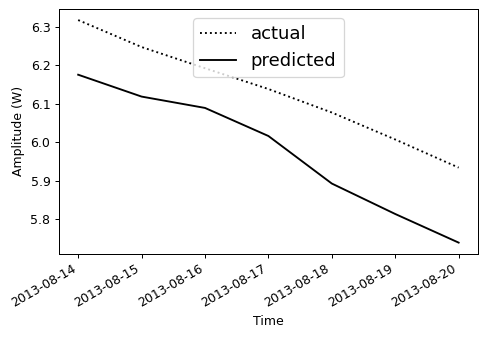

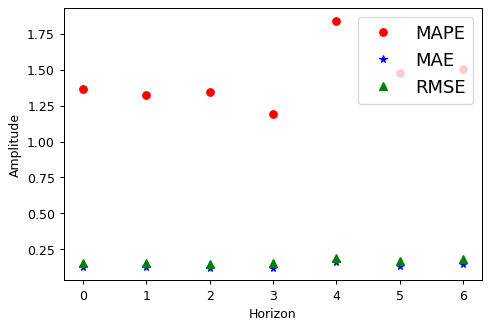

In [ ]:
for x in range(0,IMFS_count+1,1):
  print('-IMF',x,', splitting data..')
  Vol_data = to3d(VMD_Vol.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()


### with EMD - Volume + time info.

In [ ]:
exec('bottleneck = False')
exec('coord = True')
exec('separable = False')
exec('zero_norm = False')
exec('nf = 16')
exec('ks = 40')
exec('conv_dropout = 0.00000853939262152828')
exec('fc_dropout = 0.280782792368625')
exec('learning_rate = 0.00186356028800149')

par = {'bottleneck':bottleneck,'coord':coord,'separable':separable,'zero_norm':zero_norm,'nf':nf,'ks':ks,'conv_dropout':conv_dropout,'fc_dropout':fc_dropout}

In [ ]:
ind = 'EMD4IMFs';
mode = 'VolTime_'
Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + season + '.csv',header=None)
VMD_Vol = pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_Volsequences_' + ind + '_' + season + '.csv')
VMD_Vol = VMD_Vol.drop(columns='Element0')
Vol

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,32.423,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,...,32.984,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025
1,32.467,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,...,32.987,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013
2,32.517,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,...,32.991,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968
3,32.553,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,...,33.002,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934
4,32.580,32.603,32.625,32.661,32.701,32.725,32.738,32.767,32.807,32.841,...,33.002,33.009,33.023,33.035,33.028,33.025,33.013,32.968,32.934,32.897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6811,21.583,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,...,16.915,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660
6812,21.443,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,...,16.723,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330
6813,21.355,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,...,16.497,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975
6814,21.242,21.079,20.953,20.766,20.608,20.505,20.397,20.233,20.070,19.868,...,16.238,15.980,15.714,15.433,15.187,14.954,14.660,14.330,13.975,13.719


In [ ]:
split_indx = 30

print('Processing Vol and time data..')

def get_day(x):
    return x.day
def get_month(x):
    return x.month    
def get_year(x):
    return x.year    
# def get_ismonthstart(x):
#     return x.is_month_start

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
col = ["IMF{}".format(x) for x in range (0,IMFS_count+1,1)]
row = ["feature{}".format(x) for x in np.array(range(5))]
scalersIN = pd.DataFrame([], columns = col, index = row)
scalersOUT = pd.DataFrame([], columns = col, index = [0])
from sklearn.preprocessing import OrdinalEncoder
#read TS data as datetime
TS =  pd.read_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/ICEF7d_TSsequences_' + season + '.csv',header=None)
cols = TS.columns[:]
TS[cols] = TS[cols].apply(pd.to_datetime, errors='coerce')
TS_data = TS.iloc[:,:] # Train set 
TS_D = TS_data.applymap(get_day)
TS_Y = TS_data.applymap(get_year)
TS_M = TS_data.applymap(get_month)
# TS_Mstart = TS_data.applymap(get_ismonthstart)

# transform data
TS_D = to3d(encoder_H.fit_transform(TS_D))
TS_Y = to3d(encoder_D.fit_transform(TS_Y))
TS_M = to3d(encoder_month.fit_transform(TS_M))

temp_targets = {}
temp_preds = {}
test_targetdata={}
test_predsdata={}


Processing Vol and time data..


##### Model learning

-IMF 0 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


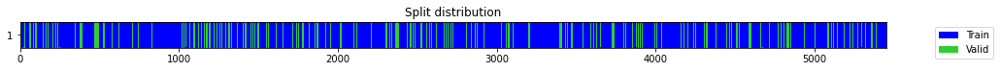

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.080830,0.855817,0.471808,0.925104,00:00
1,0.894505,0.725704,0.462588,0.851882,00:00
2,0.794903,0.667126,0.453417,0.816778,00:00
3,0.739918,0.677161,0.515806,0.822898,00:00
4,0.725102,0.727164,0.547258,0.852739,00:00
5,0.668289,0.643785,0.515103,0.802362,00:00
6,0.620933,0.551473,0.486883,0.742612,00:00
7,0.567810,0.432821,0.440025,0.657891,00:00
8,0.525358,0.444857,0.429655,0.666976,00:00
9,0.492026,0.445035,0.449493,0.667110,00:00


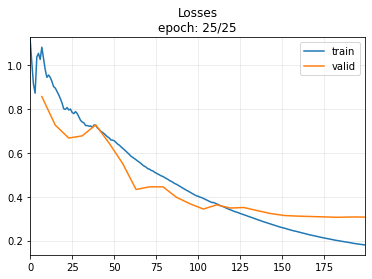

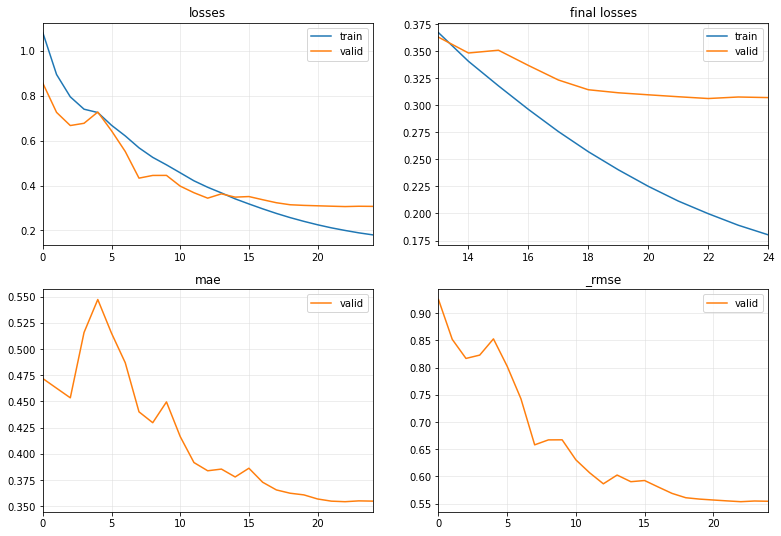

-IMF 1 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


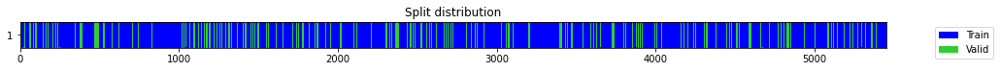

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,1.033982,0.898440,0.604414,0.947861,00:00
1,0.813075,0.786034,0.577368,0.886586,00:00
2,0.703275,0.528601,0.489252,0.727049,00:00
3,0.637875,0.592739,0.520696,0.769895,00:00
4,0.580627,0.438054,0.443016,0.661857,00:00
5,0.519124,0.388277,0.423539,0.623118,00:00
6,0.476009,0.366674,0.425077,0.605536,00:00
7,0.436395,0.355249,0.422297,0.596028,00:00
8,0.397033,0.262573,0.361446,0.512419,00:00
9,0.361697,0.276412,0.361612,0.525749,00:00


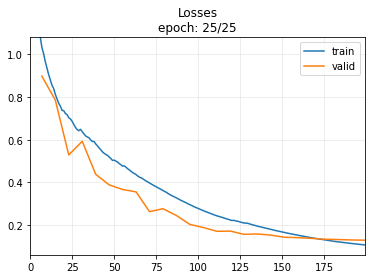

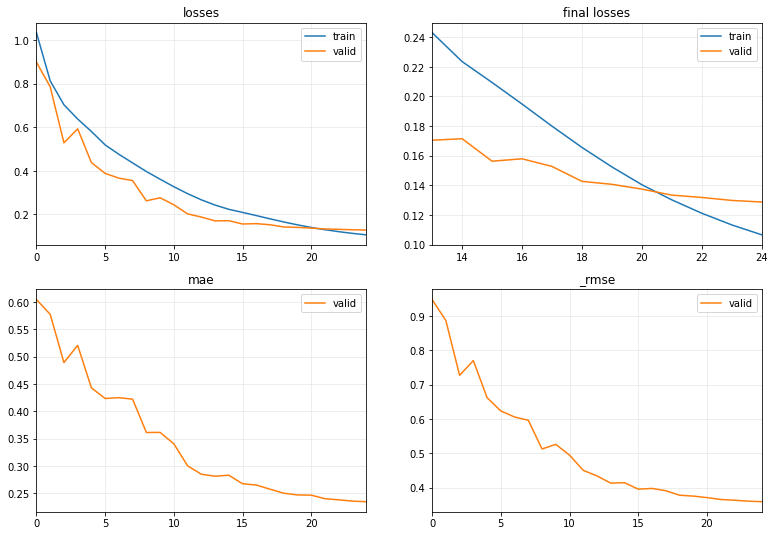

-IMF 2 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


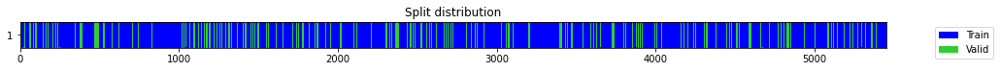

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.685980,1.074415,0.563562,1.036540,00:00
1,0.497324,0.821962,0.473592,0.906621,00:00
2,0.388043,0.514938,0.333321,0.717592,00:00
3,0.328378,0.421069,0.343152,0.648898,00:00
4,0.290828,0.398370,0.336439,0.631166,00:00
5,0.253495,0.327567,0.273741,0.572334,00:00
6,0.218891,0.257323,0.250748,0.507270,00:00
7,0.190757,0.205842,0.176343,0.453698,00:00
8,0.170929,0.224835,0.200436,0.474168,00:00
9,0.152061,0.199731,0.190105,0.446913,00:00


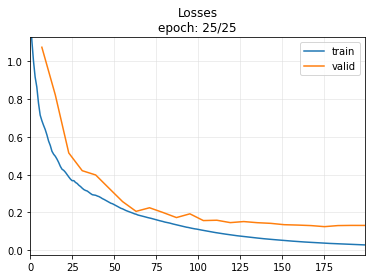

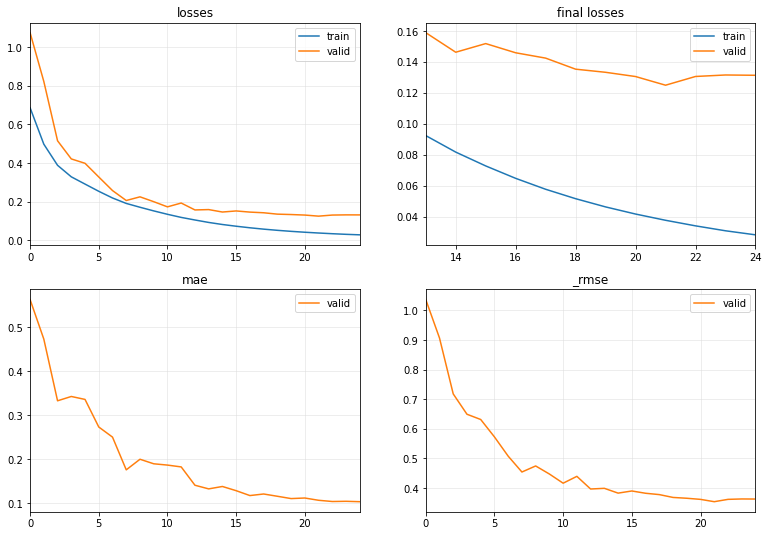

-IMF 3 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


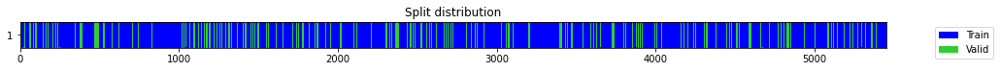

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.626882,1.423913,0.271296,1.193278,00:00
1,0.424324,0.602749,0.213195,0.776369,00:00
2,0.322887,0.274524,0.165305,0.523951,00:00
3,0.284380,0.906868,0.277377,0.952296,00:00
4,0.247575,0.607178,0.324705,0.779216,00:00
5,0.227612,0.557435,0.340869,0.746616,00:00
6,0.201157,0.206300,0.162346,0.454203,00:00
7,0.176335,0.070486,0.147199,0.265491,00:00
8,0.150744,0.152834,0.122267,0.390940,00:00
9,0.130886,0.038974,0.128365,0.197419,00:00


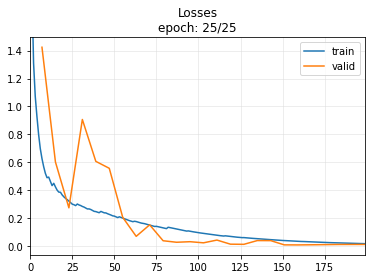

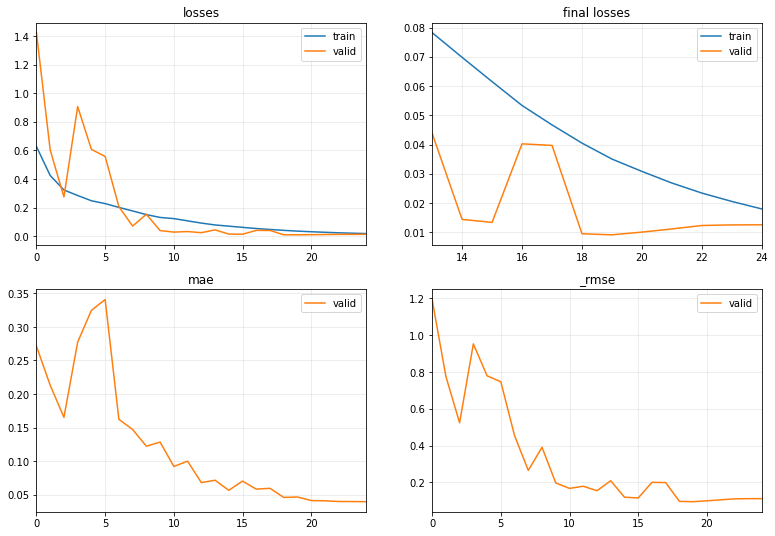

-IMF 4 , splitting data..
Standardizing data..
training set:  (5453, 4, 30) (5453, 7) , testing set:  (1363, 4, 30) (1363, 7)


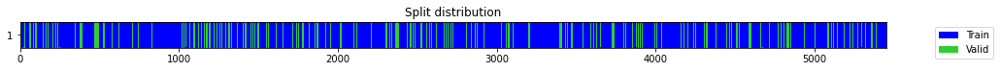

number of model outputs: 1


epoch,train_loss,valid_loss,mae,_rmse,time
0,0.296736,0.628358,0.673696,0.792690,00:00
1,0.181158,0.319225,0.480232,0.565000,00:00
2,0.126810,0.069529,0.220032,0.263683,00:00
3,0.094716,0.046777,0.172354,0.216279,00:00
4,0.076708,0.036424,0.150664,0.190851,00:00
5,0.061830,0.015865,0.096206,0.125958,00:00
6,0.050684,0.017748,0.108938,0.133220,00:00
7,0.055526,0.032466,0.148174,0.180182,00:00
8,0.049565,0.019398,0.112964,0.139278,00:00
9,0.043767,0.023318,0.128861,0.152702,00:00


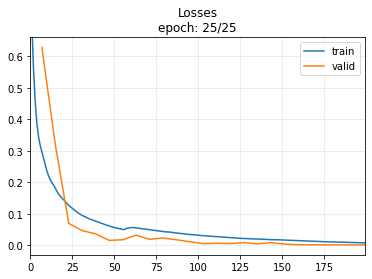

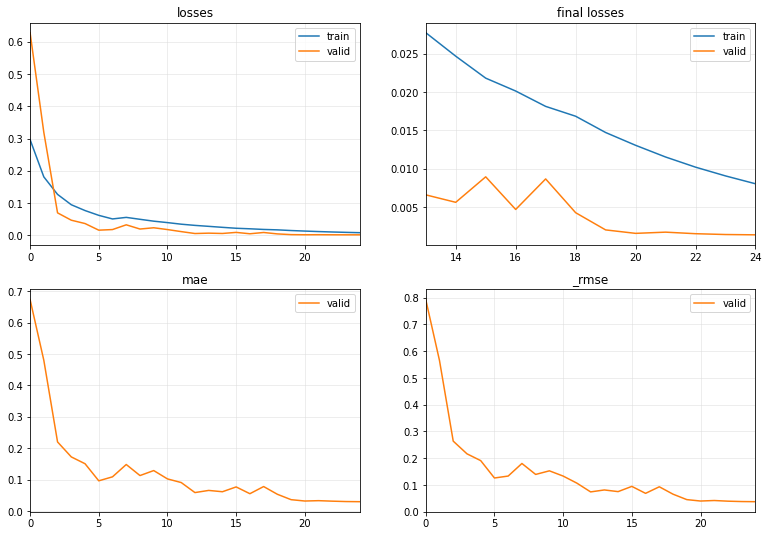

Targets and Predictions shapes (1363,) (1363,)
InceptionTimePlus : MAPE =  6.025565201450959 MAE =  0.5568261934471136 RMSE =  0.6842519841854663


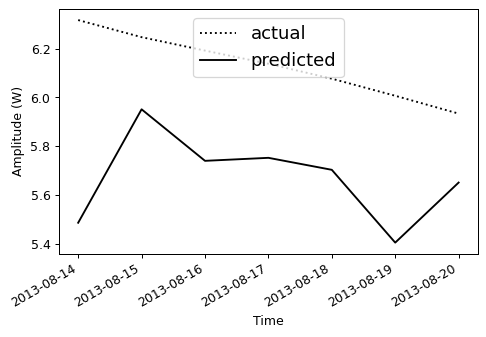

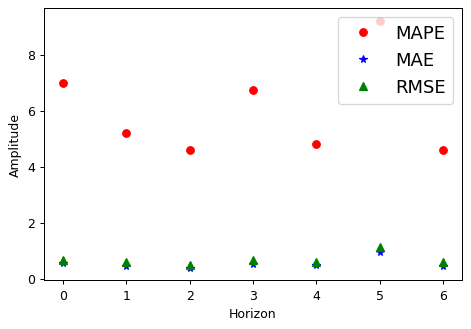

In [ ]:
for x in range(0,IMFS_count+1,1):
  # del data
  print('-IMF',x,', splitting data..')
  Vol_data = to3d(VMD_Vol.iloc[x::IMFS_count+1,:].values)
  data = np.concatenate([Vol_data, TS_D, TS_Y, TS_M],axis=1) 
  data_X = data[:,:,:split_indx]
  data_y = data[:,0,split_indx:]
  X_train, X_test = data_X[:TS.shape[0]-int(TS.shape[0]*20/100)], data_X[-int(TS.shape[0]*20/100):]
  y_train, y_test = data_y[:TS.shape[0]-int(TS.shape[0]*20/100)], data_y[-int(TS.shape[0]*20/100):]
  print('Standardizing data..')
  for i in range(X_train.shape[1]): #normalize IN data
    scalersIN["IMF{}".format(x)]["feature{}".format(i)] = StandardScaler()
    X_train[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].fit_transform(X_train[:, i, :])    
  scalersOUT["IMF{}".format(x)] = StandardScaler() #normalize OUT data
  y_train = scalersOUT["IMF{}".format(x)][0].fit_transform(y_train)  
  print('training set: ',X_train.shape, y_train.shape, ', testing set: ',X_test.shape, y_test.shape)

  splits = get_splits(y_train, valid_size=.2, stratify=False, random_state=42, shuffle=True)
  tfms  = [None, [ToFloat(), ToNumpyTensor()]]
  dsets = TSDatasets(X_train, y_train, tfms=tfms, splits=splits, inplace=True)
  dls   = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128])
  # dsets[0]
  print('number of model outputs:', get_c(dls))
  # dls.show_batch(max_n=1)
  # model = create_model(model_name, dls=dls, **par)
  # learn = Learner(dls, model, metrics=[mae, rmse],cbs=[ShowGraph(),SaveModel()])
  learn = TSForecaster(X_train, y_train, splits=splits, tfms=tfms, bs=512, arch=model_name, arch_config=par, metrics=[mae, rmse], cbs=[ShowGraph(),SaveModel()])
  # learn.model
  # learn.lr_find()
  learn.fit_one_cycle(freeze_epoch, learning_rate)
  #save trained model
  # learn.save_all(path='/content/gdrive/MyDrive/PowerForcasting/VeryShortTerm_LoadForecasting/export/', dls_fname='dls', model_fname='VMD_TIME_multistep'+ "IMF{}".format(x) + '_' + learn.model.__class__.__name__ + HOUSE, learner_fname='learner')
  valid_dl = dls.valid

  # Labeled test data
  for i in range(X_test.shape[1]): #normalize IN data
    X_test[:, i, :] = scalersIN["IMF{}".format(x)]["feature{}".format(i)].transform(X_test[:, i, :])    
  y_test = scalersOUT["IMF{}".format(x)][0].transform(y_test)  
  test_ds = valid_dl.dataset.add_test(X_test, y_test)
  test_dl = valid_dl.new(test_ds)
  _, temp_targets, temp_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
  #denormalize data
  test_predsdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_preds)  
  test_targetdata["IMF{}".format(x)] = scalersOUT["IMF{}".format(x)][0].inverse_transform(temp_targets)      
d = pd.DataFrame([])
d = pd.DataFrame({k:list(v) for k,v in test_targetdata.items()})
d.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_targetdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')
dp = pd.DataFrame([])
dp = pd.DataFrame({k:list(v) for k,v in test_predsdata.items()})
dp.to_csv('/content/gdrive/MyDrive/ARCTICseaForecasting/PIOMAS/export/test_predsdata_VOLF7d_' + mode + model_name.__name__ + ind + '_' + season + '.csv')

#TEST
dsum = d.sum(axis=1)
dpsum = dp.sum(axis=1)
print('Targets and Predictions shapes', dsum.shape, dpsum.shape)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def mae_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred)))     
def rmse_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))
MAPE = mean_absolute_percentage_error(dsum, dpsum)    
MAE = mae_metric(dsum, dpsum)
RMSE = rmse_metric(dsum, dpsum)
print(learn.model.__class__.__name__,': MAPE = ',np.mean(MAPE), 'MAE = ',np.mean(MAE), 'RMSE = ',np.mean(RMSE))

# Create plots with pre-defined labels.
fig, ax = plt.subplots(dpi = 90)
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dsum[0][:], 'k:', label='actual')
ax.plot_date(TS.iloc[TS.shape[0]-int(TS.shape[0]*20/100), split_indx:], dpsum[0][:], 'k-', label='predicted')
plt.ylabel('Amplitude (W)')
plt.xlabel('Time')
plt.gcf().autofmt_xdate()
legend = ax.legend(loc='upper center',fontsize='x-large')

plt.show()

# Create plots with pre-defined labels.
fig_step, ax_step = plt.subplots(dpi = 90)
ax_step.plot(np.array(range(7)),MAPE, 'ro', label='MAPE')
ax_step.plot(np.array(range(7)),MAE, 'b*', label='MAE')
ax_step.plot(np.array(range(7)),RMSE, 'g^', label='RMSE')
plt.ylabel('Amplitude')
plt.xlabel('Horizon')
legend = ax_step.legend(loc='upper right',fontsize='x-large')

plt.show()
